## **Code : Results Cleanup ver.2 (KEEI)**
- Writer : Donghyeon Kim
- Date : 2022.09.20.
- 대상 : 통합 데이터(태양광 사용 & 미사용)
- 주택형태 : 단독주택

<hr>

## **Prior Settings**

In [1]:
# 라이브러리 설정
import os
import pandas as pd
import numpy as np
import openpyxl
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# 사용자 함수 호출
# get_project_root : 파일의 상위-상위 경로 호출
# get_name_root : 모든 사용자 이름 호출
# get_name_root_use2 : 태양광 사용자 이름 호출(단독주택 한정)
# get_name_root_not2 : 태양광 미사용자 이름 호출(단독주택 한정)
from pack_utils import get_project_root, get_name_root, get_name_root_use2, get_name_root_not2

### **Data**
#### 1) Hour(1시간 단위)

In [3]:
# All Data
root = get_project_root()
folder_root = os.path.join(root, 'data_merge_wt_f')
file_name = os.path.join(folder_root, 'all_concat_hour2.xlsx')
df_all_hour = pd.read_excel(file_name)

# Filtering
# (1) Using Solar
df_all_hour_use = df_all_hour[df_all_hour.type == 'use']

# (2) Not Using Solar
df_all_hour_not = df_all_hour[df_all_hour.type == 'not']

In [4]:
df_all_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 263703 entries, 0 to 263702
Data columns (total 25 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   가구번호                    263703 non-null  int64  
 1   연도                      263703 non-null  int64  
 2   월                       263703 non-null  int64  
 3   일                       263703 non-null  int64  
 4   시간                      263703 non-null  int64  
 5   설비용량(kW)                97547 non-null   object 
 6   발전량(kWh)                97547 non-null   float64
 7   전력소비량(kWh)              263703 non-null  float64
 8   수전전력량(kWh)              263703 non-null  float64
 9   잉여전력량(kWh)              97547 non-null   float64
 10  잉여전력량/발전량               47471 non-null   float64
 11  자가소비율                   97546 non-null   float64
 12  자가공급률                   97547 non-null   float64
 13  temperature             263703 non-null  float64
 14  uws_10m             

#### 2) Day(1일 단위)

In [5]:
# All Data
root = get_project_root()
folder_root = os.path.join(root, 'data_merge_wt_f')
file_name2 = os.path.join(folder_root, 'all_concat_day2.xlsx')
df_all_day = pd.read_excel(file_name2)

# Filtering
# (1) Using Solar
df_all_day_use = df_all_day[df_all_day.type == 'use']

# (2) Not Using Solar
df_all_day_not = df_all_day[df_all_day.type == 'not']

In [6]:
df_all_day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11352 entries, 0 to 11351
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   가구번호        11352 non-null  int64  
 1   연도          11352 non-null  int64  
 2   월           11352 non-null  int64  
 3   일           11352 non-null  int64  
 4   설비용량(kW)    4150 non-null   object 
 5   발전량(kWh)    4150 non-null   float64
 6   발전시간        4150 non-null   float64
 7   이용률         4150 non-null   float64
 8   전력소비량(kWh)  11352 non-null  float64
 9   수전전력량(kWh)  11352 non-null  float64
 10  잉여전력량(kWh)  4150 non-null   float64
 11  잉여전력량/발전량   4146 non-null   float64
 12  자가소비율       4146 non-null   float64
 13  자가공급률       4150 non-null   float64
 14  type        11352 non-null  object 
 15  owner       11352 non-null  object 
 16  ym          11352 non-null  object 
dtypes: float64(9), int64(4), object(4)
memory usage: 1.5+ MB


<hr>

## **<평균>**

### **1. 월간/계절별/1년 가구당 평균 전력 소비량**
- 태양광 사용 가구
- 태양광 미사용 가구

In [7]:
# Result Dictionary
result = {}
result['use'] = []
result['not'] = []

# Fill Dictionary
date_list = ['2021/5', '2021/6', '2021/7', '2021/8', '2021/9', '2021/10', '2021/11', '2021/12',
             '2022/1', '2022/2', '2022/3', '2022/4']

for i in range(len(date_list)):
    # 1) Year/Month 필터링
    df_all_day_use_f = df_all_day_use[df_all_day_use.ym == date_list[i]]
    df_all_day_not_f = df_all_day_not[df_all_day_not.ym == date_list[i]]
    
    # 2) 태양광 사용/미사용 가구별 값 합산
    use_consum = np.sum(df_all_day_use_f['전력소비량(kWh)'])
    not_consum = np.sum(df_all_day_not_f['전력소비량(kWh)'])
    
    # 3) 평균 구하기
    use_consum_mean = round(use_consum / len(df_all_day_use_f.owner.unique()), 1)
    not_consum_mean = round(not_consum / len(df_all_day_not_f.owner.unique()), 1)
    
    # 4) 값 넣기
    result['use'].append(use_consum_mean)
    result['not'].append(not_consum_mean)
    
result = pd.DataFrame(result)
result.index = date_list
result

,use,not
2021/5,339.7,243.3
2021/6,327.3,256.4
2021/7,476.9,345.5
2021/8,453.8,330.2
2021/9,351.7,270.4
2021/10,364.9,244.0
2021/11,381.0,264.7
2021/12,417.1,298.3
2022/1,481.0,309.9
2022/2,393.2,294.2


In [8]:
# Result Dictionary
result = {}
result['use'] = []
result['not'] = []

# 1) 계절 필터링
df_all_day_use_spring = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]
df_all_day_not_spring = df_all_day_not[(df_all_day_not.ym == '2021/5') | (df_all_day_not.ym == '2022/3') | (df_all_day_not.ym == '2022/4')]
    
df_all_day_use_summer = df_all_day_use[(df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') | (df_all_day_use.ym == '2021/8')]
df_all_day_not_summer = df_all_day_not[(df_all_day_not.ym == '2021/6') | (df_all_day_not.ym == '2021/7') | (df_all_day_not.ym == '2021/8')]
    
df_all_day_use_autumn = df_all_day_use[(df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') | (df_all_day_use.ym == '2021/11')]
df_all_day_not_autumn = df_all_day_not[(df_all_day_not.ym == '2021/9') | (df_all_day_not.ym == '2021/10') | (df_all_day_not.ym == '2021/11')]
    
df_all_day_use_winter = df_all_day_use[(df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') | (df_all_day_use.ym == '2022/2')]
df_all_day_not_winter = df_all_day_not[(df_all_day_not.ym == '2021/12') | (df_all_day_not.ym == '2022/1') | (df_all_day_not.ym == '2022/2')]
    
# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_spring = np.sum(df_all_day_use_spring['전력소비량(kWh)'])
not_consum_spring = np.sum(df_all_day_not_spring['전력소비량(kWh)'])
    
use_consum_summer = np.sum(df_all_day_use_summer['전력소비량(kWh)'])
not_consum_summer = np.sum(df_all_day_not_summer['전력소비량(kWh)'])
    
use_consum_autumn = np.sum(df_all_day_use_autumn['전력소비량(kWh)'])
not_consum_autumn = np.sum(df_all_day_not_autumn['전력소비량(kWh)'])
    
use_consum_winter = np.sum(df_all_day_use_winter['전력소비량(kWh)'])
not_consum_winter = np.sum(df_all_day_not_winter['전력소비량(kWh)'])
    
# 3) 평균 구하기
use_consum_spring_mean = round(use_consum_spring / (len(df_all_day_use_spring.owner.unique())*3), 1)
not_consum_spring_mean = round(not_consum_spring / (len(df_all_day_not_spring.owner.unique())*3), 1)

use_consum_summer_mean = round(use_consum_summer / (len(df_all_day_use_summer.owner.unique())*3), 1)
not_consum_summer_mean = round(not_consum_summer / (len(df_all_day_not_summer.owner.unique())*3), 1)
    
use_consum_autumn_mean = round(use_consum_autumn / (len(df_all_day_use_autumn.owner.unique())*3), 1)
not_consum_autumn_mean = round(not_consum_autumn / (len(df_all_day_not_autumn.owner.unique())*3), 1)
    
use_consum_winter_mean = round(use_consum_winter / (len(df_all_day_use_winter.owner.unique())*3), 1)
not_consum_winter_mean = round(not_consum_winter / (len(df_all_day_not_winter.owner.unique())*3), 1)
    
# 4) 값 넣기
result['use'] = [use_consum_spring_mean, use_consum_summer_mean, use_consum_autumn_mean, use_consum_winter_mean]
result['not'] = [not_consum_spring_mean, not_consum_summer_mean, not_consum_autumn_mean, not_consum_winter_mean]

result = pd.DataFrame(result)
result.index = ['spring', 'summer', 'autumn', 'winter']
result

,use,not
spring,352.4,241.4
summer,419.3,310.7
autumn,365.9,259.7
winter,430.4,300.8


In [9]:
# Result Dictionary
result = {}
result['use'] = []
result['not'] = []

# 1) 1년 필터링
df_all_day_use_year = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') |
                                    (df_all_day_use.ym == '2021/8') | (df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') |
                                    (df_all_day_use.ym == '2021/11') | (df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') |
                                    (df_all_day_use.ym == '2022/2') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]
df_all_day_not_year = df_all_day_not[(df_all_day_not.ym == '2021/5') | (df_all_day_not.ym == '2021/6') | (df_all_day_not.ym == '2021/7') |
                                    (df_all_day_not.ym == '2021/8') | (df_all_day_not.ym == '2021/9') | (df_all_day_not.ym == '2021/10') |
                                    (df_all_day_not.ym == '2021/11') | (df_all_day_not.ym == '2021/12') | (df_all_day_not.ym == '2022/1') |
                                    (df_all_day_not.ym == '2022/2') | (df_all_day_not.ym == '2022/3') | (df_all_day_not.ym == '2022/4')]
    
# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_year = np.sum(df_all_day_use_year['전력소비량(kWh)'])
not_consum_year = np.sum(df_all_day_not_year['전력소비량(kWh)'])
    
# 3) 평균 구하기
use_consum_year_mean = round(use_consum_year / (len(df_all_day_use_year.owner.unique())*12), 1)
not_consum_year_mean = round(not_consum_year / (len(df_all_day_not_year.owner.unique())*12), 1)
    
# 4) 값 넣기
result['use'] = use_consum_year_mean
result['not'] = not_consum_year_mean

result

{'use': 392.0, 'not': 278.2}

<hr>

### **2. 월간/계절별/1년 평균 가구당 전력 생산량(발전량)**
- 태양광 사용 가구

In [10]:
# Result Dictionary
result = {}
result['발전량(kWh)'] = []

# Fill Dictionary
date_list = ['2021/5', '2021/6', '2021/7', '2021/8', '2021/9', '2021/10', '2021/11', '2021/12',
             '2022/1', '2022/2', '2022/3', '2022/4']

for i in range(len(date_list)):
    # 1) Year/Month 필터링
    df_all_day_use_f = df_all_day_use[df_all_day_use.ym == date_list[i]]
    
    # 2) 태양광 사용/미사용 가구별 값 합산
    use_consum = np.sum(df_all_day_use_f['발전량(kWh)'])
    
    # 3) 평균 구하기
    use_consum_mean = round(use_consum / len(df_all_day_use_f.owner.unique()), 1)

    # 4) 값 넣기
    result['발전량(kWh)'].append(use_consum_mean)
    
result = pd.DataFrame(result)
result.index = date_list
result

,발전량(kWh)
2021/5,489.8
2021/6,475.0
2021/7,473.0
2021/8,387.1
2021/9,367.0
2021/10,422.1
2021/11,348.2
2021/12,351.4
2022/1,391.2
2022/2,431.1


In [11]:
# Result Dictionary
result = {}
result['발전량(kWh)'] = []

# 1) 계절 필터링
df_all_day_use_spring = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]
df_all_day_use_summer = df_all_day_use[(df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') | (df_all_day_use.ym == '2021/8')]
df_all_day_use_autumn = df_all_day_use[(df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') | (df_all_day_use.ym == '2021/11')]
df_all_day_use_winter = df_all_day_use[(df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') | (df_all_day_use.ym == '2022/2')]

# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_spring = np.sum(df_all_day_use_spring['발전량(kWh)'])
use_consum_summer = np.sum(df_all_day_use_summer['발전량(kWh)'])
use_consum_autumn = np.sum(df_all_day_use_autumn['발전량(kWh)'])
use_consum_winter = np.sum(df_all_day_use_winter['발전량(kWh)'])
    
# 3) 평균 구하기
use_consum_spring_mean = round(use_consum_spring / (len(df_all_day_use_spring.owner.unique())*3), 1)
use_consum_summer_mean = round(use_consum_summer / (len(df_all_day_use_summer.owner.unique())*3), 1)
use_consum_autumn_mean = round(use_consum_autumn / (len(df_all_day_use_autumn.owner.unique())*3), 1)
use_consum_winter_mean = round(use_consum_winter / (len(df_all_day_use_winter.owner.unique())*3), 1)
    
# 4) 값 넣기
result['발전량(kWh)'] = [use_consum_spring_mean, use_consum_summer_mean, use_consum_autumn_mean, use_consum_winter_mean]

result = pd.DataFrame(result)
result.index = ['spring', 'summer', 'autumn', 'winter']
result

,발전량(kWh)
spring,489.0
summer,445.0
autumn,379.1
winter,391.2


In [12]:
# Result Dictionary
result = {}
result['발전량(kWh)'] = []

# 1) 1년 필터링
df_all_day_use_year = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') |
                                    (df_all_day_use.ym == '2021/8') | (df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') |
                                    (df_all_day_use.ym == '2021/11') | (df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') |
                                    (df_all_day_use.ym == '2022/2') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]

# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_year = np.sum(df_all_day_use_year['발전량(kWh)'])

# 3) 평균 구하기
use_consum_year_mean = round(use_consum_year / (len(df_all_day_use_year.owner.unique())*12), 1)

# 4) 값 넣기
result['발전량(kWh)'] = use_consum_year_mean

result

{'발전량(kWh)': 426.1}

<hr>

### **3. 월간/계절별/1년 평균 가구당 전력 수출량(잉여전력량)**
- 태양광 사용 가구

In [13]:
# Result Dictionary
result = {}
result['잉여전력량(kWh)'] = []

# Fill Dictionary
date_list = ['2021/5', '2021/6', '2021/7', '2021/8', '2021/9', '2021/10', '2021/11', '2021/12',
             '2022/1', '2022/2', '2022/3', '2022/4']

for i in range(len(date_list)):
    # 1) Year/Month 필터링
    df_all_day_use_f = df_all_day_use[df_all_day_use.ym == date_list[i]]
    
    # 2) 태양광 사용/미사용 가구별 값 합산
    use_export = np.sum(df_all_day_use_f['잉여전력량(kWh)'])
    
    # 3) 평균 구하기
    use_export_mean = round(use_export / len(df_all_day_use_f.owner.unique()), 1)

    # 4) 값 넣기
    result['잉여전력량(kWh)'].append(use_export_mean)
    
result = pd.DataFrame(result)
result.index = date_list
result

,잉여전력량(kWh)
2021/5,376.4
2021/6,353.0
2021/7,315.2
2021/8,256.1
2021/9,260.9
2021/10,319.6
2021/11,260.7
2021/12,256.5
2022/1,275.3
2022/2,317.1


In [14]:
# Result Dictionary
result = {}
result['잉여전력량(kWh)'] = []

# 1) 계절 필터링
df_all_day_use_spring = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]
df_all_day_use_summer = df_all_day_use[(df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') | (df_all_day_use.ym == '2021/8')]
df_all_day_use_autumn = df_all_day_use[(df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') | (df_all_day_use.ym == '2021/11')]
df_all_day_use_winter = df_all_day_use[(df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') | (df_all_day_use.ym == '2022/2')]

# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_spring = np.sum(df_all_day_use_spring['잉여전력량(kWh)'])
use_consum_summer = np.sum(df_all_day_use_summer['잉여전력량(kWh)'])
use_consum_autumn = np.sum(df_all_day_use_autumn['잉여전력량(kWh)'])
use_consum_winter = np.sum(df_all_day_use_winter['잉여전력량(kWh)'])
    
# 3) 평균 구하기
use_consum_spring_mean = round(use_consum_spring / (len(df_all_day_use_spring.owner.unique())*3), 1)
use_consum_summer_mean = round(use_consum_summer / (len(df_all_day_use_summer.owner.unique())*3), 1)
use_consum_autumn_mean = round(use_consum_autumn / (len(df_all_day_use_autumn.owner.unique())*3), 1)
use_consum_winter_mean = round(use_consum_winter / (len(df_all_day_use_winter.owner.unique())*3), 1)
    
# 4) 값 넣기
result['잉여전력량(kWh)'] = [use_consum_spring_mean, use_consum_summer_mean, use_consum_autumn_mean, use_consum_winter_mean]

result = pd.DataFrame(result)
result.index = ['spring', 'summer', 'autumn', 'winter']
result

,잉여전력량(kWh)
spring,375.4
summer,308.1
autumn,280.4
winter,283.0


In [15]:
# Result Dictionary
result = {}
result['잉여전력량(kWh)'] = []

# 1) 1년 필터링
df_all_day_use_year = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') |
                                    (df_all_day_use.ym == '2021/8') | (df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') |
                                    (df_all_day_use.ym == '2021/11') | (df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') |
                                    (df_all_day_use.ym == '2022/2') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]

# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_year = np.sum(df_all_day_use_year['잉여전력량(kWh)'])

# 3) 평균 구하기
use_consum_year_mean = round(use_consum_year / (len(df_all_day_use_year.owner.unique())*12), 1)

# 4) 값 넣기
result['잉여전력량(kWh)'] = use_consum_year_mean

result

{'잉여전력량(kWh)': 311.7}

<hr>

### **4. SSR, SCR, 설비이용률, 발전시간**
- 태양광 사용 가구

In [16]:
# Result Dictionary
result = {}
result['SSR'] = []
result['SCR'] = []
result['설비이용률'] = []
result['발전시간'] = []

# Fill Dictionary
date_list = ['2021/5', '2021/6', '2021/7', '2021/8', '2021/9', '2021/10', '2021/11', '2021/12',
             '2022/1', '2022/2', '2022/3', '2022/4']

for i in range(len(date_list)):
    # 1) Year/Month 필터링
    df_all_day_use_f = df_all_day_use[df_all_day_use.ym == date_list[i]]
    
    # 2) 태양광 사용/미사용 가구별 값 합산
    ssr = np.sum(df_all_day_use_f['자가공급률'])
    scr = np.sum(df_all_day_use_f['자가소비율'])
    use_rate = np.sum(df_all_day_use_f['이용률'])
    use_hour = np.sum(df_all_day_use_f['발전시간'])
    
    # 3) 평균 구하기
    ssr_mean = round(ssr / len(df_all_day_use_f), 2)
    scr_mean = round(scr / len(df_all_day_use_f), 2)
    use_rate_mean = round(use_rate / len(df_all_day_use_f), 2)
    use_hour_mean = round(use_hour / len(df_all_day_use_f), 2)
    
    # 4) 값 넣기
    result['SSR'].append(ssr_mean)
    result['SCR'].append(scr_mean)
    result['설비이용률'].append(use_rate_mean)
    result['발전시간'].append(use_hour_mean)
    
result = pd.DataFrame(result)
result.index = date_list
result

,SSR,SCR,설비이용률,발전시간
2021/5,0.36,0.43,16.21,3.89
2021/6,0.40,0.44,16.29,3.91
2021/7,0.36,0.51,15.67,3.76
2021/8,0.32,0.55,12.73,3.05
2021/9,0.33,0.48,13.08,3.14
2021/10,0.32,0.43,13.67,3.28
2021/11,0.26,0.44,11.45,2.75
2021/12,0.26,0.47,11.01,2.64
2022/1,0.27,0.49,12.47,2.99
2022/2,0.31,0.44,15.27,3.66


In [17]:
# Result Dictionary
result = {}
result['SSR'] = []
result['SCR'] = []
result['설비이용률'] = []
result['발전시간'] = []

# 1) 계절 필터링
df_all_day_use_spring = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]
df_all_day_use_summer = df_all_day_use[(df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') | (df_all_day_use.ym == '2021/8')]
df_all_day_use_autumn = df_all_day_use[(df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') | (df_all_day_use.ym == '2021/11')]
df_all_day_use_winter = df_all_day_use[(df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') | (df_all_day_use.ym == '2022/2')]

# 2) 태양광 사용/미사용 가구별 값 합산
ssr_spring = np.sum(df_all_day_use_spring['자가공급률'])
scr_spring = np.sum(df_all_day_use_spring['자가소비율'])
use_rate_spring = np.sum(df_all_day_use_spring['이용률'])
use_hour_spring = np.sum(df_all_day_use_spring['발전시간'])

ssr_summer = np.sum(df_all_day_use_summer['자가공급률'])
scr_summer = np.sum(df_all_day_use_summer['자가소비율'])
use_rate_summer = np.sum(df_all_day_use_summer['이용률'])
use_hour_summer = np.sum(df_all_day_use_summer['발전시간'])

ssr_autumn = np.sum(df_all_day_use_autumn['자가공급률'])
scr_autumn = np.sum(df_all_day_use_autumn['자가소비율'])
use_rate_autumn = np.sum(df_all_day_use_autumn['이용률'])
use_hour_autumn = np.sum(df_all_day_use_autumn['발전시간'])

ssr_winter = np.sum(df_all_day_use_winter['자가공급률'])
scr_winter = np.sum(df_all_day_use_winter['자가소비율'])
use_rate_winter = np.sum(df_all_day_use_winter['이용률'])
use_hour_winter = np.sum(df_all_day_use_winter['발전시간'])
    
# 3) 평균 구하기
ssr_spring_mean = round(ssr_spring / len(df_all_day_use_spring), 2)
scr_spring_mean = round(scr_spring / len(df_all_day_use_spring), 2)
use_rate_spring_mean = round(use_rate_spring / len(df_all_day_use_spring), 2)
use_hour_spring_mean = round(use_hour_spring / len(df_all_day_use_spring), 2)

ssr_summer_mean = round(ssr_summer / len(df_all_day_use_summer), 2)
scr_summer_mean = round(scr_summer / len(df_all_day_use_summer), 2)
use_rate_summer_mean = round(use_rate_summer / len(df_all_day_use_summer), 2)
use_hour_summer_mean = round(use_hour_summer / len(df_all_day_use_summer), 2)

ssr_autumn_mean = round(ssr_autumn / len(df_all_day_use_autumn), 2)
scr_autumn_mean = round(scr_autumn / len(df_all_day_use_autumn), 2)
use_rate_autumn_mean = round(use_rate_autumn / len(df_all_day_use_autumn), 2)
use_hour_autumn_mean = round(use_hour_autumn / len(df_all_day_use_autumn), 2)

ssr_winter_mean = round(ssr_winter / len(df_all_day_use_winter), 1)
scr_winter_mean = round(scr_winter / len(df_all_day_use_winter), 2)
use_rate_winter_mean = round(use_rate_winter / len(df_all_day_use_winter), 2)
use_hour_winter_mean = round(use_hour_winter / len(df_all_day_use_winter), 2)

# 4) 값 넣기
result['SSR'] = [ssr_spring_mean, ssr_summer_mean, ssr_autumn_mean, ssr_winter_mean]
result['SCR'] = [scr_spring_mean, scr_summer_mean, scr_autumn_mean, scr_winter_mean]
result['설비이용률'] = [use_rate_spring_mean, use_rate_summer_mean, use_rate_autumn_mean, use_rate_winter_mean]
result['발전시간'] = [use_hour_spring_mean, use_hour_summer_mean, use_hour_autumn_mean, use_hour_winter_mean]

result = pd.DataFrame(result)
result.index = ['spring', 'summer', 'autumn', 'winter']
result

,SSR,SCR,설비이용률,발전시간
spring,0.35,0.42,16.42,3.94
summer,0.36,0.50,14.88,3.57
autumn,0.30,0.45,12.74,3.06
winter,0.30,0.47,12.84,3.08


In [18]:
# Result Dictionary
result = {}
result['SSR'] = []
result['SCR'] = []
result['설비이용률'] = []
result['발전시간'] = []

# 1) 1년 필터링
df_all_day_use_year = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') |
                                    (df_all_day_use.ym == '2021/8') | (df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') |
                                    (df_all_day_use.ym == '2021/11') | (df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') |
                                    (df_all_day_use.ym == '2022/2') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]

# 2) 태양광 사용/미사용 가구별 값 합산
ssr_year = np.sum(df_all_day_use_year['자가공급률'])
scr_year = np.sum(df_all_day_use_year['자가소비율'])
use_rate_year = np.sum(df_all_day_use_year['이용률'])
use_hour_year = np.sum(df_all_day_use_year['발전시간'])
    
# 3) 평균 구하기
ssr_year_mean = round(ssr_year / len(df_all_day_use_year), 2)
scr_year_mean = round(scr_year / len(df_all_day_use_year), 2)
use_rate_year_mean = round(use_rate_year / len(df_all_day_use_year), 2)
use_hour_year_mean = round(use_hour_year / len(df_all_day_use_year), 2)

# 4) 값 넣기
result['SSR'] = ssr_year_mean
result['SCR'] = scr_year_mean
result['설비이용률'] = use_rate_year_mean
result['발전시간'] = use_hour_year_mean

result

{'SSR': 0.32, 'SCR': 0.46, '설비이용률': 14.23, '발전시간': 3.41}

<hr>

### **5. 월간/계절별/1년 평균 가구당 전력 그리드 소비량**
- 태양광 사용 가구
- 태양광 미사용 가구

In [19]:
# Result Dictionary
result = {}
result['use'] = []
result['not'] = []

# Fill Dictionary
date_list = ['2021/5', '2021/6', '2021/7', '2021/8', '2021/9', '2021/10', '2021/11', '2021/12',
             '2022/1', '2022/2', '2022/3', '2022/4']

for i in range(len(date_list)):
    # 1) Year/Month 필터링
    df_all_day_use_f = df_all_day_use[df_all_day_use.ym == date_list[i]]
    df_all_day_not_f = df_all_day_not[df_all_day_not.ym == date_list[i]]
    
    # 2) 태양광 사용/미사용 가구별 값 합산
    use_consum = np.sum(df_all_day_use_f['수전전력량(kWh)'])
    not_consum = np.sum(df_all_day_not_f['수전전력량(kWh)'])
    
    # 3) 평균 구하기
    use_consum_mean = round(use_consum / len(df_all_day_use_f.owner.unique()), 1)
    not_consum_mean = round(not_consum / len(df_all_day_not_f.owner.unique()), 1)
    
    # 4) 값 넣기
    result['use'].append(use_consum_mean)
    result['not'].append(not_consum_mean)
    
result = pd.DataFrame(result)
result.index = date_list
result

,use,not
2021/5,226.3,243.3
2021/6,205.3,256.4
2021/7,319.1,345.5
2021/8,322.8,330.2
2021/9,245.6,270.4
2021/10,262.3,244.0
2021/11,293.4,264.7
2021/12,322.2,298.3
2022/1,365.0,309.9
2022/2,279.2,294.2


In [20]:
# Result Dictionary
result = {}
result['use'] = []
result['not'] = []

# 1) 계절 필터링
df_all_day_use_spring = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]
df_all_day_not_spring = df_all_day_not[(df_all_day_not.ym == '2021/5') | (df_all_day_not.ym == '2022/3') | (df_all_day_not.ym == '2022/4')]
    
df_all_day_use_summer = df_all_day_use[(df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') | (df_all_day_use.ym == '2021/8')]
df_all_day_not_summer = df_all_day_not[(df_all_day_not.ym == '2021/6') | (df_all_day_not.ym == '2021/7') | (df_all_day_not.ym == '2021/8')]
    
df_all_day_use_autumn = df_all_day_use[(df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') | (df_all_day_use.ym == '2021/11')]
df_all_day_not_autumn = df_all_day_not[(df_all_day_not.ym == '2021/9') | (df_all_day_not.ym == '2021/10') | (df_all_day_not.ym == '2021/11')]
    
df_all_day_use_winter = df_all_day_use[(df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') | (df_all_day_use.ym == '2022/2')]
df_all_day_not_winter = df_all_day_not[(df_all_day_not.ym == '2021/12') | (df_all_day_not.ym == '2022/1') | (df_all_day_not.ym == '2022/2')]
    
# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_spring = np.sum(df_all_day_use_spring['수전전력량(kWh)'])
not_consum_spring = np.sum(df_all_day_not_spring['수전전력량(kWh)'])
    
use_consum_summer = np.sum(df_all_day_use_summer['수전전력량(kWh)'])
not_consum_summer = np.sum(df_all_day_not_summer['수전전력량(kWh)'])
    
use_consum_autumn = np.sum(df_all_day_use_autumn['수전전력량(kWh)'])
not_consum_autumn = np.sum(df_all_day_not_autumn['수전전력량(kWh)'])
    
use_consum_winter = np.sum(df_all_day_use_winter['수전전력량(kWh)'])
not_consum_winter = np.sum(df_all_day_not_winter['수전전력량(kWh)'])
    
# 3) 평균 구하기
use_consum_spring_mean = round(use_consum_spring / (len(df_all_day_use_spring.owner.unique())*3), 1)
not_consum_spring_mean = round(not_consum_spring / (len(df_all_day_not_spring.owner.unique())*3), 1)

use_consum_summer_mean = round(use_consum_summer / (len(df_all_day_use_summer.owner.unique())*3), 1)
not_consum_summer_mean = round(not_consum_summer / (len(df_all_day_not_summer.owner.unique())*3), 1)
    
use_consum_autumn_mean = round(use_consum_autumn / (len(df_all_day_use_autumn.owner.unique())*3), 1)
not_consum_autumn_mean = round(not_consum_autumn / (len(df_all_day_not_autumn.owner.unique())*3), 1)
    
use_consum_winter_mean = round(use_consum_winter / (len(df_all_day_use_winter.owner.unique())*3), 1)
not_consum_winter_mean = round(not_consum_winter / (len(df_all_day_not_winter.owner.unique())*3), 1)
    
# 4) 값 넣기
result['use'] = [use_consum_spring_mean, use_consum_summer_mean, use_consum_autumn_mean, use_consum_winter_mean]
result['not'] = [not_consum_spring_mean, not_consum_summer_mean, not_consum_autumn_mean, not_consum_winter_mean]

result = pd.DataFrame(result)
result.index = ['spring', 'summer', 'autumn', 'winter']
result

,use,not
spring,238.7,241.4
summer,282.4,310.7
autumn,267.1,259.7
winter,322.2,300.8


In [21]:
# Result Dictionary
result = {}
result['use'] = []
result['not'] = []

# 1) 1년 필터링
df_all_day_use_year = df_all_day_use[(df_all_day_use.ym == '2021/5') | (df_all_day_use.ym == '2021/6') | (df_all_day_use.ym == '2021/7') |
                                    (df_all_day_use.ym == '2021/8') | (df_all_day_use.ym == '2021/9') | (df_all_day_use.ym == '2021/10') |
                                    (df_all_day_use.ym == '2021/11') | (df_all_day_use.ym == '2021/12') | (df_all_day_use.ym == '2022/1') |
                                    (df_all_day_use.ym == '2022/2') | (df_all_day_use.ym == '2022/3') | (df_all_day_use.ym == '2022/4')]
df_all_day_not_year = df_all_day_not[(df_all_day_not.ym == '2021/5') | (df_all_day_not.ym == '2021/6') | (df_all_day_not.ym == '2021/7') |
                                    (df_all_day_not.ym == '2021/8') | (df_all_day_not.ym == '2021/9') | (df_all_day_not.ym == '2021/10') |
                                    (df_all_day_not.ym == '2021/11') | (df_all_day_not.ym == '2021/12') | (df_all_day_not.ym == '2022/1') |
                                    (df_all_day_not.ym == '2022/2') | (df_all_day_not.ym == '2022/3') | (df_all_day_not.ym == '2022/4')]
    
# 2) 태양광 사용/미사용 가구별 값 합산
use_consum_year = np.sum(df_all_day_use_year['수전전력량(kWh)'])
not_consum_year = np.sum(df_all_day_not_year['수전전력량(kWh)'])
    
# 3) 평균 구하기
use_consum_year_mean = round(use_consum_year / (len(df_all_day_use_year.owner.unique())*12), 1)
not_consum_year_mean = round(not_consum_year / (len(df_all_day_not_year.owner.unique())*12), 1)
    
# 4) 값 넣기
result['use'] = use_consum_year_mean
result['not'] = not_consum_year_mean

result

{'use': 277.6, 'not': 278.2}

<hr>

## **<월>**

### 2021.05

In [24]:
df_all_hour_21_5 = df_all_hour[df_all_hour.ym == '2021/5']

In [25]:
# 총 전력 소비량
df_all_hour_21_5.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   506.0  0.342491  0.203213  0.050003  0.200012  0.300003  0.419983   
     1   503.0  0.316790  0.278273  0.049988  0.190002  0.279968  0.369995   
     2   504.0  0.297241  0.200089  0.050003  0.179993  0.250000  0.352524   
     3   508.0  0.283978  0.187114  0.049988  0.179993  0.250000  0.329956   
     4   511.0  0.281723  0.201576  0.049988  0.175018  0.239990  0.319992   
     5   507.0  0.306351  0.489827  0.040009  0.170044  0.239990  0.330017   
     6   510.0  0.324020  0.330623  0.039993  0.190002  0.269989  0.390015   
     7   507.0  0.400513  0.329755  0.029999  0.250000  0.339996  0.460022   
     8   510.0  0.344570  0.216777  0.039993  0.209991  0.289978  0.419983   
     9   503.0  0.319780  0.302139  0.029999  0.180008  0.270020  0.360016   
     10  509.0  0.332908  0.516927  0.049988  0.179993  0.250000  0.349976   
     11  497.0  0.310684  0.261226  0.039993  0.170013  0.250000  0.369995   
     12  504.0  0.352520  0.544922  0.020004  0.179993  0.260010  0.369995   
     13  500.0  0.300200  0.312132  0.049988  0.170013  0.250000  0.339966   
     14  505.0  0.297307  0.272733  0.029999  0.170013  0.250000  0.340027   
     15  501.0  0.315469  0.317062  0.049988  0.179993  0.250000  0.359985   
     16  497.0  0.331952  0.647553  0.029999  0.179993  0.269989  0.360016   
     17  499.0  0.357215  0.280763  0.029999  0.200012  0.280029  0.419983   
     18  499.0  0.404610  0.350082  0.029999  0.210022  0.299988  0.460022   
     19  503.0  0.441014  0.332017  0.039993  0.250000  0.350037  0.529999   
     20  501.0  0.475172  0.316963  0.049988  0.290009  0.399963  0.580017   
     21  508.0  0.529545  0.732950  0.049988  0.309998  0.399994  0.570007   
     22  508.0  0.432521  0.225613  0.050003  0.287491  0.389969  0.520020   
     23  511.0  0.397105  0.404885  0.050003  0.229980  0.320007  0.464996   
use  0   307.0  0.438969  0.261893  0.059998  0.230011  0.420044  0.589981   
     1   302.0  0.404653  0.485960  0.050003  0.209991  0.360046  0.520020   
     2   303.0  0.359900  0.192764  0.059998  0.209991  0.349976  0.490005   
     3   306.0  0.352059  0.224724  0.059998  0.200012  0.320007  0.470032   
     4   301.0  0.330984  0.168405  0.049995  0.200012  0.309998  0.440002   
     5   305.0  0.359860  0.195283  0.059509  0.209991  0.330017  0.470001   
     6   304.0  0.397874  0.261193  0.079590  0.217308  0.350006  0.500000   
     7   300.0  0.502651  0.322474  0.100098  0.280029  0.409973  0.639923   
     8   302.0  0.599622  0.617851  0.090317  0.320007  0.510010  0.719940   
     9   302.0  0.485925  0.334619  0.099609  0.259949  0.420044  0.620689   
     10  304.0  0.433012  0.259506  0.119934  0.229950  0.359987  0.579689   
     11  302.0  0.436194  0.267594  0.109863  0.229980  0.349995  0.589813   
     12  304.0  0.452799  0.290569  0.079956  0.239988  0.360031  0.589973   
     13  303.0  0.447483  0.269489  0.099976  0.239990  0.379944  0.600311   
     14  302.0  0.418596  0.229877  0.026428  0.229988  0.370041  0.550039   
     15  303.0  0.445410  0.512675  0.100037  0.225006  0.359863  0.529999   
     16  308.0  0.466655  0.572040  0.100098  0.237408  0.369995  0.569954   
     17  307.0  0.440321  0.281479  0.100311  0.240023  0.380035  0.569977   
     18  307.0  0.523218  0.336390  0.109764  0.279999  0.439972  0.679962   
     19  307.0  0.598892  0.392971  0.110252  0.330009  0.510010  0.750000   
     20  302.0  0.605994  0.369240  0.079994  0.342522  0.540009  0.777481   
     21  304.0  0.596728  0.330461  0.070000  0.337479  0.564972  0.832512   
     22  304.0  0.562022  0.332873  0.059998  0.320007  0.509995  0.779968   
     23  304.0  0.519278  0.322386  0.059998  0.260010  0.480042  0.709969   

               max  
type 시간             
not  0    1.380005  
     1    5.089996  
     2    2.390015  
   

In [26]:
# 총 전력 소비량 : 태양광 사용 가구 한정
pd.set_option('display.max_rows', 500)
df_all_hour_21_5_use = df_all_hour_21_5[df_all_hour_21_5.type == 'use']
df_all_hour_21_5_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.078065  0.026636  0.059998  0.060005  0.070000   
         1    31.0  0.076129  0.024314  0.050003  0.070000  0.070000   
         2    31.0  0.076774  0.027249  0.059998  0.060005  0.070000   
         3    31.0  0.078065  0.026511  0.059998  0.060005  0.070000   
         4    31.0  0.082258  0.027290  0.049995  0.070000  0.079994   
         5    31.0  0.120380  0.047655  0.059509  0.089912  0.110001   
         6    31.0  0.160908  0.053669  0.079590  0.129951  0.149902   
         7    31.0  0.235202  0.075316  0.100098  0.165401  0.229736   
         8    31.0  0.348465  0.164535  0.090317  0.195068  0.329834   
         9    31.0  0.468340  0.221344  0.099609  0.274902  0.469727   
         10   31.0  0.534101  0.271081  0.140137  0.309814  0.489746   
         11   31.0  0.652549  0.314774  0.109863  0.420166  0.589355   
         12   31.0  0.692895  0.344960  0.159912  0.404907  0.639648   
         13   31.0  0.676844  0.294346  0.189941  0.435059  0.760254   
         14   31.0  0.597444  0.290395  0.159668  0.354858  0.609863   
         15   31.0  0.456845  0.229398  0.130127  0.280029  0.419922   
         16   31.0  0.354795  0.177808  0.100098  0.199677  0.379883   
         17   31.0  0.209319  0.066279  0.100311  0.165226  0.209717   
         18   31.0  0.187394  0.072281  0.109764  0.149715  0.169670   
         19   31.0  0.159065  0.048091  0.110252  0.130001  0.139999   
         20   31.0  0.140001  0.051898  0.079994  0.110001  0.120003   
         21   31.0  0.112258  0.032424  0.070000  0.095001  0.109993   
         22   31.0  0.092581  0.043739  0.059998  0.070000  0.079994   
         23   31.0  0.077096  0.021784  0.059998  0.060005  0.070000   
300W     0    31.0  0.574842  0.223066  0.239990  0.440002  0.539978   
         1    31.0  0.432262  0.168755  0.170013  0.345032  0.419983   
         2    31.0  0.371932  0.105021  0.199982  0.289978  0.369995   
         3    31.0  0.328711  0.114298  0.139984  0.235031  0.309998   
         4    31.0  0.317098  0.091878  0.179993  0.239990  0.309998   
         5    31.0  0.320636  0.100829  0.169983  0.250000  0.299988   
         6    31.0  0.360322  0.218980  0.209991  0.244980  0.289997   
         7    31.0  0.642902  0.372731  0.200005  0.359970  0.510002   
         8    31.0  0.943876  0.580406  0.149994  0.510008  0.909996   
         9    31.0  0.602910  0.393796  0.160027  0.400000  0.510052   
         10   31.0  0.447421  0.197191  0.189976  0.295000  0.380009   
         11   31.0  0.431287  0.265976  0.180000  0.275006  0.319984   
         12   31.0  0.413873  0.280919  0.149999  0.245003  0.290001   
         13   31.0  0.363869  0.241417  0.160000  0.225000  0.290001   
         14   31.0  0.336451  0.148005  0.150002  0.244997  0.290001   
         15   31.0  0.468066  0.408261  0.149994  0.255005  0.340000   
         16   31.0  0.526137  0.442900  0.170020  0.260010  0.360008   
         17   31.0  0.463389  0.237943  0.159996  0.274992  0.429985   
         18   31.0  0.577100  0.418947  0.170006  0.325027  0.399994   
         19   31.0  0.760969  0.410727  0.239990  0.355011  0.700012   
         20   31.0  0.802589  0.357349  0.269989  0.530014  0.680023   
         21   31.0  0.843551  0.300012  0.369995  0.600037  0.829987   
         22   31.0  0.926931  0.465632  0.500000  0.629974  0.789978   
         23   31.0  0.873545  0.374433  0.479980  0.630005  0.750000   
3kW      0   245.0  0.467442  0.245159  0.150024  0.259979  0.440002   
         1   240.0  0.443521  0.527405  0.140015  0.239990  0.390015   
         2   241.0  0.394771  0.183553  0.130005  0.230011  0.369995   
         3   244.0  0.389836  0.224959  0.130005  0.220001  0.360016   
         4   239.0  0.365047  0.159191  0.130005  0.229980  0.340027   
         5   243.0  0.395414  0.193780  0.129944  0.2

In [27]:
# 총 전력 생산량
pd.set_option('display.max_rows', 500)
df_all_hour_21_5_use = df_all_hour_21_5[df_all_hour_21_5.type == 'use']
df_all_hour_21_5_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.017468  0.030966  0.000000  0.000000  0.010254   
         6    31.0  0.587056  0.361913  0.000000  0.305176  0.719727   
         7    31.0  1.968703  1.072775  0.120117  0.984863  2.270020   
         8    31.0  3.740030  2.142862  0.200195  1.645020  3.570312   
         9    31.0  5.668063  2.963335  0.339844  2.875000  6.270020   
         10   31.0  6.612840  3.517828  0.870117  3.444824  7.169922   
         11   31.0  8.064170  3.877952  0.430176  4.849854  9.459961   
         12   31.0  8.200243  3.694383  1.399902  5.419922  8.740234   
         13   31.0  8.065839  3.632871  1.589844  5.595215  9.609863   
         14   31.0  7.216482  3.610756  0.609863  4.169922  9.100098   
         15   31.0  5.594223  3.109826  0.240234  3.649902  6.470215   
         16   31.0  3.733194  2.325885  0.219727  1.789795  3.470215   
         17   31.0  1.388373  0.629439  0.040039  1.229736  1.590332   
         18   31.0  0.378323  0.227910  0.000000  0.189697  0.399902   
         19   31.0  0.001969  0.004086  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.004193  0.006204  0.000000  0.000000  0.000000   
         7    31.0  0.016129  0.011159  0.000000  0.009998  0.020000   
         8    31.0  0.029032  0.018139  0.000000  0.014999  0.020000   
         9    31.0  0.061935  0.029824  0.000000  0.035000  0.079998   
         10   31.0  0.093548  0.040869  0.020000  0.070000  0.119999   
         11   31.0  0.114516  0.051306  0.020000  0.079998  0.139999   
         12   31.0  0.152581  0.074026  0.029999  0.070000  0.190002   
         13   31.0  0.151291  0.085390  0.020000  0.070000  0.199997   
         14   31.0  0.149033  0.082960  0.000000  0.055002  0.180000   
         15   31.0  0.130322  0.078251  0.000000  0.045000  0.170002   
         16   31.0  0.094516  0.064283  0.000000  0.034999  0.099998   
         17   31.0  0.061291  0.043493  0.000000  0.020000  0.060001   
         18   31.0  0.025161  0.018951  0.000000  0.010001  0.020000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   243.0  0.004735  0.008461  0.000000  0.0

In [28]:
# 총 전력 수출량
df_all_hour_21_5_use = df_all_hour_21_5[df_all_hour_21_5.type == 'use']
df_all_hour_21_5_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.006765  0.019380  0.000000  0.000000  0.000000   
         6    31.0  0.462922  0.307245  0.000000  0.209961  0.520020   
         7    31.0  1.741242  1.006563  0.010254  0.784912  2.020020   
         8    31.0  3.394145  1.988327  0.129883  1.449951  3.270020   
         9    31.0  5.200046  2.756580  0.229980  2.594971  5.740234   
         10   31.0  6.078739  3.258556  0.729980  3.135010  6.729980   
         11   31.0  7.411621  3.589603  0.320312  4.344849  8.910156   
         12   31.0  7.507348  3.384881  1.239990  4.929932  8.020020   
         13   31.0  7.388995  3.356061  1.390137  5.079834  8.929688   
         14   31.0  6.619038  3.363763  0.450195  3.815063  8.370117   
         15   31.0  5.142539  2.893339  0.199707  3.320068  6.029785   
         16   31.0  3.382592  2.160325  0.100098  1.479980  3.060059   
         17   31.0  1.191312  0.575616  0.000000  1.020020  1.290039   
         18   31.0  0.251575  0.185314  0.000000  0.109985  0.209961   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         11   31.0  0.000968  0.005388  0.000000  0.000000  0.000000   
         12   31.0  0.006129  0.015849  0.000000  0.000000  0.000000   
         13   31.0  0.008065  0.017967  0.000000  0.000000  0.000000   
         14   31.0  0.008065  0.020562  0.000000  0.000000  0.000000   
         15   31.0  0.004839  0.013873  0.000000  0.000000  0.000000   
         16   31.0  0.000968  0.005388  0.000000  0.000000  0.000000   
         17   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   243.0  0.000000  0.000000  0.000000  0.0

In [29]:
# 총 그리드 소비량
df_all_hour_21_5.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   506.0  0.342491  0.203213  0.050003  0.200012  0.300003  0.419983   
     1   503.0  0.316790  0.278273  0.049988  0.190002  0.279968  0.369995   
     2   504.0  0.297241  0.200089  0.050003  0.179993  0.250000  0.352524   
     3   508.0  0.283978  0.187114  0.049988  0.179993  0.250000  0.329956   
     4   511.0  0.281723  0.201576  0.049988  0.175018  0.239990  0.319992   
     5   507.0  0.306351  0.489827  0.040009  0.170044  0.239990  0.330017   
     6   510.0  0.324020  0.330623  0.039993  0.190002  0.269989  0.390015   
     7   507.0  0.400513  0.329755  0.029999  0.250000  0.339996  0.460022   
     8   510.0  0.344570  0.216777  0.039993  0.209991  0.289978  0.419983   
     9   503.0  0.319780  0.302139  0.029999  0.180008  0.270020  0.360016   
     10  509.0  0.332908  0.516927  0.049988  0.179993  0.250000  0.349976   
     11  497.0  0.310684  0.261226  0.039993  0.170013  0.250000  0.369995   
     12  504.0  0.352520  0.544922  0.020004  0.179993  0.260010  0.369995   
     13  500.0  0.300200  0.312132  0.049988  0.170013  0.250000  0.339966   
     14  505.0  0.297307  0.272733  0.029999  0.170013  0.250000  0.340027   
     15  501.0  0.315469  0.317062  0.049988  0.179993  0.250000  0.359985   
     16  497.0  0.331952  0.647553  0.029999  0.179993  0.269989  0.360016   
     17  499.0  0.357215  0.280763  0.029999  0.200012  0.280029  0.419983   
     18  499.0  0.404610  0.350082  0.029999  0.210022  0.299988  0.460022   
     19  503.0  0.441014  0.332017  0.039993  0.250000  0.350037  0.529999   
     20  501.0  0.475172  0.316963  0.049988  0.290009  0.399963  0.580017   
     21  508.0  0.529545  0.732950  0.049988  0.309998  0.399994  0.570007   
     22  508.0  0.432521  0.225613  0.050003  0.287491  0.389969  0.520020   
     23  511.0  0.397105  0.404885  0.050003  0.229980  0.320007  0.464996   
use  0   307.0  0.438969  0.261893  0.059998  0.230011  0.420044  0.589981   
     1   302.0  0.396242  0.358922  0.050003  0.209991  0.360046  0.520020   
     2   303.0  0.359900  0.192764  0.059998  0.209991  0.349976  0.490005   
     3   306.0  0.352059  0.224724  0.059998  0.200012  0.320007  0.470032   
     4   301.0  0.330982  0.168394  0.049995  0.200012  0.309998  0.440002   
     5   305.0  0.354999  0.195429  0.029999  0.209991  0.330017  0.469971   
     6   304.0  0.312435  0.273981  0.000000  0.127472  0.259995  0.429993   
     7   300.0  0.292667  0.338628  0.000000  0.047493  0.190002  0.400002   
     8   302.0  0.272285  0.594887  0.000000  0.002487  0.089981  0.377502   
     9   302.0  0.150827  0.292544  0.000000  0.000000  0.010010  0.199982   
     10  304.0  0.097722  0.199969  0.000000  0.000000  0.000000  0.079994   
     11  302.0  0.084933  0.201112  0.000000  0.000000  0.000000  0.059998   
     12  304.0  0.078224  0.179540  0.000000  0.000000  0.000000  0.052536   
     13  303.0  0.073962  0.158448  0.000000  0.000000  0.000000  0.070007   
     14  302.0  0.064833  0.134065  0.000000  0.000000  0.000000  0.070007   
     15  303.0  0.106767  0.342212  0.000000  0.000000  0.000000  0.080017   
     16  308.0  0.140974  0.324396  0.000000  0.000000  0.020020  0.150002   
     17  307.0  0.216314  0.266242  0.000000  0.029938  0.140015  0.317505   
     18  307.0  0.436052  0.348532  0.000000  0.175003  0.359985  0.609985   
     19  307.0  0.595467  0.393904  0.099998  0.329990  0.510010  0.750000   
     20  302.0  0.605994  0.369240  0.079994  0.342522  0.540009  0.777481   
     21  304.0  0.596728  0.330461  0.070000  0.337479  0.564972  0.832512   
     22  304.0  0.562022  0.332873  0.059998  0.320007  0.509995  0.779968   
     23  304.0  0.519278  0.322386  0.059998  0.260010  0.480042  0.709969   

               max  
type 시간             
not  0    1.380005  
     1    5.089996  
     2    2.390015  
   

In [30]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_5_use = df_all_hour_21_5[df_all_hour_21_5.type == 'use']
df_all_hour_21_5_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.078065  0.026636  0.059998  0.060005  0.070000   
         1    31.0  0.076129  0.024314  0.050003  0.070000  0.070000   
         2    31.0  0.076774  0.027249  0.059998  0.060005  0.070000   
         3    31.0  0.078065  0.026511  0.059998  0.060005  0.070000   
         4    31.0  0.082258  0.027290  0.049995  0.070000  0.079994   
         5    31.0  0.109677  0.050825  0.029999  0.080002  0.099998   
         6    31.0  0.036774  0.073138  0.000000  0.000000  0.000000   
         7    31.0  0.007742  0.020446  0.000000  0.000000  0.000000   
         8    31.0  0.002581  0.009651  0.000000  0.000000  0.000000   
         9    31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   31.0  0.005161  0.020635  0.000000  0.000000  0.000000   
         16   31.0  0.004193  0.015005  0.000000  0.000000  0.000000   
         17   31.0  0.012258  0.036579  0.000000  0.000000  0.000000   
         18   31.0  0.060645  0.086137  0.000000  0.010002  0.029999   
         19   31.0  0.157096  0.048934  0.099998  0.129997  0.139999   
         20   31.0  0.140001  0.051898  0.079994  0.110001  0.120003   
         21   31.0  0.112258  0.032424  0.070000  0.095001  0.109993   
         22   31.0  0.092581  0.043739  0.059998  0.070000  0.079994   
         23   31.0  0.077096  0.021784  0.059998  0.060005  0.070000   
300W     0    31.0  0.574842  0.223066  0.239990  0.440002  0.539978   
         1    31.0  0.432262  0.168755  0.170013  0.345032  0.419983   
         2    31.0  0.371932  0.105021  0.199982  0.289978  0.369995   
         3    31.0  0.328711  0.114298  0.139984  0.235031  0.309998   
         4    31.0  0.317098  0.091878  0.179993  0.239990  0.309998   
         5    31.0  0.320636  0.100829  0.169983  0.250000  0.299988   
         6    31.0  0.356129  0.218358  0.209991  0.235001  0.280029   
         7    31.0  0.626773  0.374401  0.190002  0.345001  0.500000   
         8    31.0  0.914843  0.579516  0.149994  0.475006  0.869995   
         9    31.0  0.540975  0.390089  0.090027  0.370026  0.450012   
         10   31.0  0.354195  0.201684  0.069977  0.205017  0.290039   
         11   31.0  0.317738  0.259979  0.029999  0.139984  0.240021   
         12   31.0  0.267422  0.277846  0.000000  0.079987  0.199982   
         13   31.0  0.220643  0.240784  0.000000  0.059998  0.149994   
         14   31.0  0.195483  0.170414  0.000000  0.069992  0.150024   
         15   31.0  0.342582  0.411266  0.000000  0.089981  0.220032   
         16   31.0  0.432589  0.467863  0.020020  0.145020  0.290039   
         17   31.0  0.402099  0.252807  0.029999  0.225021  0.380005   
         18   31.0  0.551939  0.419410  0.130005  0.300003  0.369995   
         19   31.0  0.760969  0.410727  0.239990  0.355011  0.700012   
         20   31.0  0.802589  0.357349  0.269989  0.530014  0.680023   
         21   31.0  0.843551  0.300012  0.369995  0.600037  0.829987   
         22   31.0  0.926931  0.465632  0.500000  0.629974  0.789978   
         23   31.0  0.873545  0.374433  0.479980  0.630005  0.750000   
3kW      0   245.0  0.467442  0.245159  0.150024  0.259979  0.440002   
         1   240.0  0.432938  0.379187  0.140015  0.239990  0.390015   
         2   241.0  0.394771  0.183553  0.130005  0.230011  0.369995   
         3   244.0  0.389836  0.224959  0.130005  0.220001  0.360016   
         4   239.0  0.365044  0.159178  0.130005  0.229980  0.340027   
         5   243.0  0.390679  0.193024  0.129944  0.2

In [31]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_5_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.421821  0.467186  0.000000  0.000000  0.047619   
         6    31.0  0.307669  0.259045  0.000000  0.192199  0.213953   
         7    31.0  0.184825  0.184409  0.071497  0.092671  0.110193   
         8    31.0  0.122019  0.080313  0.062544  0.081667  0.100650   
         9    31.0  0.099574  0.051395  0.059504  0.074786  0.086770   
         10   31.0  0.087200  0.021059  0.058860  0.078541  0.083365   
         11   31.0  0.092199  0.038588  0.049481  0.071108  0.084866   
         12   31.0  0.088154  0.021199  0.047008  0.074704  0.089591   
         13   31.0  0.089284  0.018538  0.049050  0.078538  0.088115   
         14   31.0  0.096985  0.045644  0.043606  0.080667  0.087157   
         15   31.0  0.102014  0.056760  0.054021  0.068396  0.083023   
         16   31.0  0.127989  0.097414  0.063251  0.081739  0.097687   
         17   31.0  0.211513  0.204027  0.090640  0.115947  0.130382   
         18   31.0  0.389711  0.231628  0.000000  0.264489  0.313327   
         19   31.0  0.193548  0.401610  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.354839  0.486373  0.000000  0.000000  0.000000   
         7    31.0  0.774194  0.425024  0.000000  1.000000  1.000000   
         8    31.0  0.935484  0.249731  0.000000  1.000000  1.000000   
         9    31.0  0.967742  0.179605  0.000000  1.000000  1.000000   
         10   31.0  0.997312  0.014967  0.916666  1.000000  1.000000   
         11   31.0  0.993548  0.035921  0.800002  1.000000  1.000000   
         12   31.0  0.971272  0.069922  0.652173  0.977273  1.000000   
         13   31.0  0.965636  0.074467  0.720000  0.977273  1.000000   
         14   31.0  0.932348  0.193145  0.000000  0.953463  1.000000   
         15   31.0  0.943567  0.187492  0.000000  1.000000  1.000000   
         16   31.0  0.962366  0.181096  0.000000  1.000000  1.000000   
         17   31.0  0.870968  0.340777  0.000000  1.000000  1.000000   
         18   31.0  0.774194  0.425024  0.000000  1.000000  1.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   243.0  0.325103  0.469380  0.000000  0.0

In [32]:
# SSR(자가공급률)
df_all_hour_21_5_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.103519  0.156370  0.000000  0.000000  0.004859   
         6    31.0  0.790288  0.349208  0.000000  0.704710  1.000000   
         7    31.0  0.956429  0.119430  0.499373  1.000000  1.000000   
         8    31.0  0.981208  0.063845  0.722029  1.000000  1.000000   
         9    31.0  0.997308  0.014987  0.916555  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   31.0  0.968987  0.134036  0.288398  1.000000  1.000000   
         16   31.0  0.975844  0.088605  0.625238  1.000000  1.000000   
         17   31.0  0.927480  0.199145  0.190628  1.000000  1.000000   
         18   31.0  0.709702  0.322164  0.000000  0.565593  0.863605   
         19   31.0  0.014290  0.030341  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.013587  0.021550  0.000000  0.000000  0.000000   
         7    31.0  0.034346  0.032497  0.000000  0.009983  0.029850   
         8    31.0  0.041125  0.032658  0.000000  0.015210  0.038762   
         9    31.0  0.135713  0.106175  0.000000  0.062895  0.116884   
         10   31.0  0.249545  0.159181  0.037037  0.116244  0.235314   
         11   31.0  0.330037  0.214803  0.031746  0.161272  0.288880   
         12   31.0  0.450795  0.287487  0.038462  0.218072  0.333333   
         13   31.0  0.484234  0.318803  0.026668  0.160863  0.446796   
         14   31.0  0.482071  0.304191  0.000000  0.165129  0.578897   
         15   31.0  0.391013  0.307466  0.000000  0.127556  0.349206   
         16   31.0  0.300407  0.272666  0.000000  0.053240  0.259247   
         17   31.0  0.180787  0.177770  0.000000  0.043840  0.142834   
         18   31.0  0.064765  0.064443  0.000000  0.007990  0.052635   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   243.0  0.012850  0.023547  0.000000  0.0

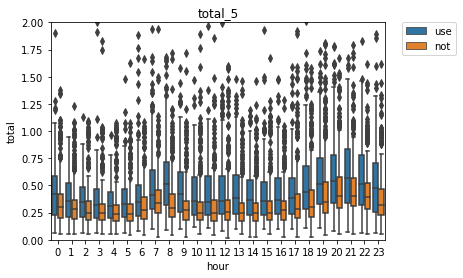

In [33]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_5, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_5')
plt.show()

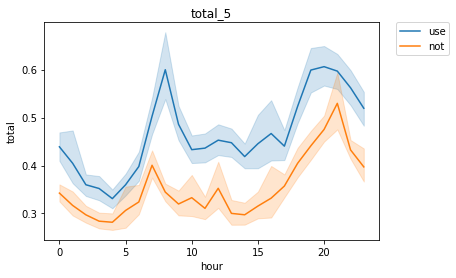

In [34]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_5, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_5')
plt.show()

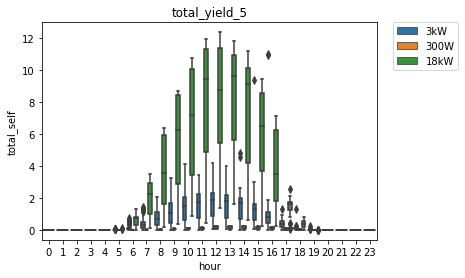

In [35]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_5')
plt.show()

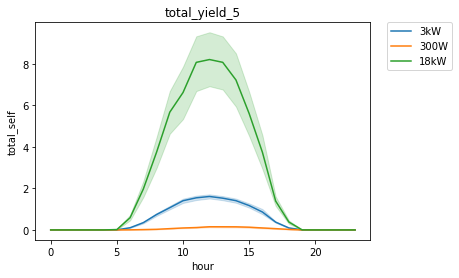

In [36]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_5')
plt.show()

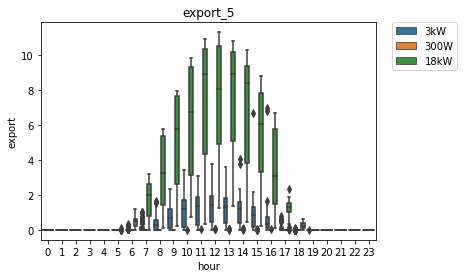

In [37]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_5')
plt.show()

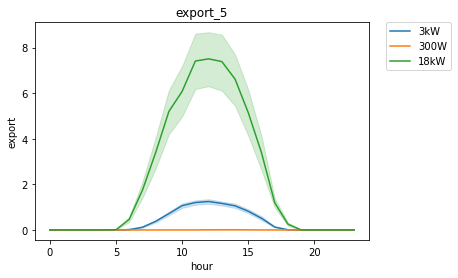

In [38]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_5')
plt.show()

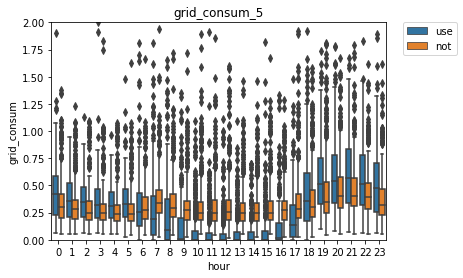

In [39]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_5, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_5')
plt.show()

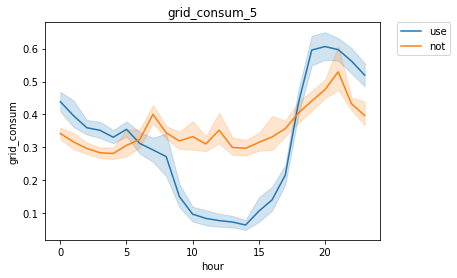

In [40]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_5, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_5')
plt.show()

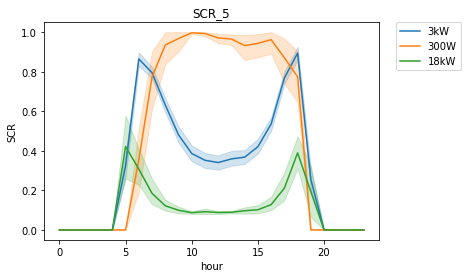

In [41]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_5')
plt.show()

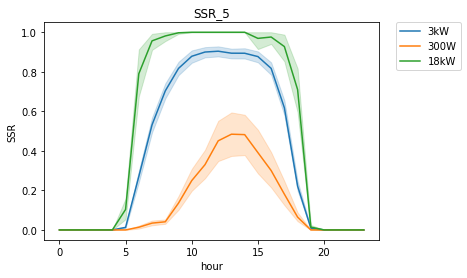

In [42]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_5')
plt.show()

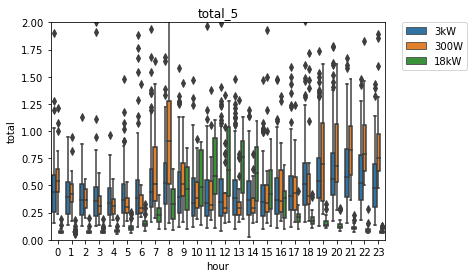

In [43]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_5')
plt.show()

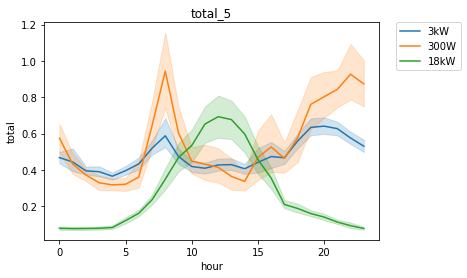

In [44]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_5')
plt.show()

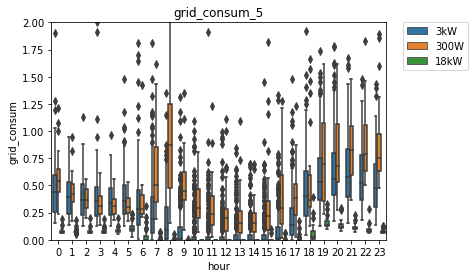

In [45]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_5')
plt.show()

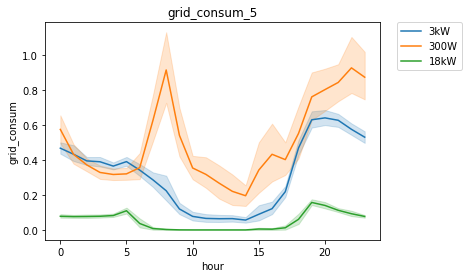

In [46]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_5, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_5')
plt.show()

<hr>

### 2021.06

In [47]:
df_all_hour_21_6 = df_all_hour[df_all_hour.ym == '2021/6']

In [48]:
# 총 전력 소비량
df_all_hour_21_6.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean        std       min       25%       50%       75%  \
type 시간                                                                       
not  0   489.0  0.390653   0.528171  0.069977  0.219971  0.299988  0.420044   
     1   490.0  0.333470   0.217830  0.049988  0.192490  0.260010  0.390015   
     2   490.0  0.303225   0.204766  0.059998  0.179993  0.239990  0.349976   
     3   489.0  0.300962   0.261223  0.059998  0.170044  0.239990  0.349976   
     4   493.0  0.277211   0.176887  0.059998  0.169983  0.230011  0.320068   
     5   479.0  0.285157   0.185164  0.049988  0.169983  0.239990  0.320007   
     6   473.0  0.318646   0.201582  0.059998  0.190002  0.270020  0.400024   
     7   470.0  0.399150   0.243075  0.059998  0.250000  0.340027  0.489990   
     8   472.0  0.354491   0.334517  0.049988  0.200012  0.290009  0.429993   
     9   482.0  0.334793   0.308724  0.059998  0.160034  0.279968  0.400017   
     10  476.0  0.312586   0.316581  0.059998  0.160034  0.260010  0.369995   
     11  482.0  0.307073   0.281988  0.059998  0.162506  0.250000  0.367508   
     12  480.0  0.323501   0.467802  0.059998  0.169983  0.260010  0.369995   
     13  482.0  1.198526  17.478273  0.059998  0.159973  0.250000  0.377472   
     14  486.0  0.330865   0.426177  0.059998  0.170021  0.260010  0.359985   
     15  487.0  0.335337   0.423998  0.049988  0.179993  0.260010  0.380005   
     16  482.0  0.319273   0.230397  0.059998  0.179993  0.270020  0.380005   
     17  483.0  0.335943   0.250184  0.059998  0.179993  0.280029  0.404968   
     18  482.0  0.407655   0.353114  0.059998  0.190002  0.299988  0.479980   
     19  485.0  0.466866   0.670702  0.059998  0.210022  0.330017  0.510010   
     20  486.0  0.505228   0.552238  0.079987  0.270020  0.399994  0.570007   
     21  488.0  0.499161   0.338555  0.119995  0.309998  0.410034  0.599983   
     22  490.0  0.462734   0.308486  0.089996  0.280029  0.380005  0.559998   
     23  486.0  0.410659   0.321768  0.089996  0.239990  0.329971  0.470032   
use  0   294.0  0.425729   0.238926  0.059998  0.229980  0.409973  0.559937   
     1   293.0  0.380237   0.234166  0.059998  0.229980  0.349976  0.500000   
     2   292.0  0.341468   0.168381  0.059998  0.220024  0.314972  0.452499   
     3   293.0  0.332408   0.183115  0.050003  0.210022  0.290039  0.440002   
     4   289.0  0.315168   0.163343  0.059998  0.200012  0.279968  0.429993   
     5   286.0  0.322589   0.159251  0.069794  0.219978  0.290039  0.407440   
     6   283.0  0.386348   0.327578  0.080017  0.219940  0.309990  0.469910   
     7   286.0  0.489186   0.322913  0.089844  0.269913  0.389984  0.619995   
     8   286.0  0.517893   0.288504  0.090057  0.312540  0.459961  0.637512   
     9   286.0  0.486517   0.465461  0.110107  0.270020  0.434948  0.603699   
     10  290.0  0.447568   0.343363  0.129944  0.240112  0.400024  0.570236   
     11  290.0  0.474172   0.346359  0.110046  0.240005  0.409912  0.590073   
     12  291.0  0.501070   0.392159  0.109985  0.250050  0.429993  0.650055   
     13  294.0  0.487944   0.354538  0.119934  0.270027  0.429932  0.590012   
     14  295.0  0.461192   0.381522  0.130005  0.259994  0.399971  0.520020   
     15  296.0  0.468277   0.507433  0.120026  0.250000  0.400013  0.532364   
     16  296.0  0.451744   0.287404  0.110245  0.259903  0.414764  0.539932   
     17  294.0  0.469615   0.280836  0.110001  0.270020  0.390045  0.590012   
     18  296.0  0.529815   0.340041  0.109818  0.279961  0.430054  0.724976   
     19  296.0  0.591717   0.383764  0.099792  0.307480  0.514984  0.769913   
     20  297.0  0.608390   0.326747  0.080002  0.369995  0.549988  0.820007   
     21  296.0  0.582449   0.319292  0.069992  0.359985  0.539978  0.750000   
     22  296.0  0.566875   0.374245  0.069992  0.330017  0.504974  0.760010   
     23  291.0  0.505448   0.310596  0.069992  0.250000  0.470032  0.670044   

                max  
type 시간              
not  0    10.5

In [49]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_21_6_use = df_all_hour_21_6[df_all_hour_21_6.type == 'use']
df_all_hour_21_6_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    29.0  0.088620  0.037674  0.059998  0.070007  0.080002   
         1    29.0  0.081035  0.015432  0.059998  0.070007  0.080002   
         2    29.0  0.081034  0.014480  0.059998  0.069992  0.080002   
         3    29.0  0.078622  0.015051  0.050003  0.070000  0.070007   
         4    30.0  0.112667  0.174453  0.059998  0.069994  0.074997   
         5    30.0  0.103706  0.037507  0.069794  0.080006  0.090019   
         6    30.0  0.146098  0.043582  0.080017  0.129501  0.140137   
         7    29.0  0.229097  0.070794  0.089844  0.169922  0.230469   
         8    29.0  0.327964  0.122944  0.090057  0.239746  0.350098   
         9    30.0  0.424984  0.152357  0.149902  0.302368  0.445312   
         10   30.0  0.517952  0.205903  0.149902  0.364868  0.525146   
         11   30.0  0.571615  0.242939  0.159668  0.362793  0.594971   
         12   30.0  0.627425  0.275865  0.150391  0.472656  0.660156   
         13   30.0  0.556055  0.258581  0.200195  0.342407  0.525146   
         14   30.0  0.468327  0.186044  0.160156  0.332642  0.449707   
         15   30.0  0.404867  0.191425  0.139648  0.212646  0.415039   
         16   29.0  0.360028  0.142841  0.110245  0.259766  0.369629   
         17   29.0  0.230915  0.054954  0.110001  0.200195  0.229980   
         18   29.0  0.160999  0.047526  0.109818  0.129883  0.149872   
         19   29.0  0.149312  0.036329  0.099792  0.129761  0.130249   
         20   29.0  0.159311  0.067292  0.080002  0.119995  0.130005   
         21   29.0  0.124827  0.046572  0.069992  0.089996  0.110001   
         22   29.0  0.098964  0.034366  0.069992  0.070007  0.080002   
         23   29.0  0.091380  0.025597  0.069992  0.070007  0.080002   
300W     0    30.0  0.607003  0.189439  0.330017  0.519958  0.555023   
         1    30.0  0.375665  0.090542  0.230042  0.312500  0.360016   
         2    30.0  0.328998  0.092895  0.179993  0.269974  0.300018   
         3    30.0  0.293170  0.065866  0.179993  0.242493  0.280029   
         4    30.0  0.287673  0.078988  0.160034  0.227524  0.280029   
         5    30.0  0.294002  0.063069  0.149963  0.259964  0.290039   
         6    30.0  0.321164  0.143567  0.159973  0.235027  0.295013   
         7    30.0  0.538830  0.300032  0.179985  0.357483  0.475002   
         8    30.0  0.715330  0.346004  0.180000  0.435045  0.705002   
         9    30.0  0.546340  0.283775  0.210007  0.332491  0.459980   
         10   29.0  0.426894  0.228909  0.170000  0.239998  0.340019   
         11   29.0  0.632763  0.485184  0.179987  0.270014  0.379997   
         12   29.0  0.505175  0.321030  0.190030  0.260017  0.399973   
         13   30.0  0.507335  0.364595  0.169955  0.262526  0.405025   
         14   30.0  0.432666  0.248900  0.180013  0.264981  0.384998   
         15   30.0  0.430339  0.278443  0.159973  0.242537  0.369984   
         16   30.0  0.468665  0.287865  0.160034  0.282473  0.400009   
         17   30.0  0.534327  0.313933  0.209953  0.285025  0.455000   
         18   30.0  0.590673  0.299469  0.190018  0.332531  0.595009   
         19   30.0  0.836997  0.464860  0.269958  0.439987  0.820007   
         20   30.0  0.843337  0.320707  0.309998  0.642471  0.824982   
         21   30.0  0.934676  0.436027  0.290039  0.607529  0.790009   
         22   30.0  0.912343  0.290366  0.520020  0.750000  0.829987   
         23   30.0  0.826005  0.239757  0.590027  0.655029  0.754974   
3kW      0   235.0  0.444188  0.219597  0.159973  0.250000  0.410034   
         1   234.0  0.417904  0.234733  0.139984  0.239990  0.389984   
         2   233.0  0.375489  0.157473  0.140015  0.250000  0.359985   
         3   234.0  0.368891  0.178615  0.140015  0.239990  0.329956   
         4   229.0  0.345298  0.150435  0.139984  0.219971  0.309998   
         5   226.0  0.355439  0.154431  0.140015  0.2

In [50]:
# 총 전력 생산량
df_all_hour_21_6_use = df_all_hour_21_6[df_all_hour_21_6.type == 'use']
df_all_hour_21_6_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.038346  0.041511  0.000000  0.010254  0.029785   
         6    30.0  0.804476  0.334860  0.030273  0.575073  0.910156   
         7    29.0  2.226192  0.840671  0.529785  1.589844  2.459961   
         8    29.0  4.077637  1.647780  0.229980  2.569824  4.620117   
         9    30.0  5.423014  2.295985  0.979980  3.312500  5.404785   
         10   30.0  7.060303  2.833603  1.299805  5.424927  7.709961   
         11   30.0  7.631641  3.236354  1.329590  4.435303  8.724854   
         12   30.0  7.776107  3.530987  1.090332  5.180176  8.704834   
         13   30.0  7.723063  2.996091  1.779785  5.782593  7.985352   
         14   30.0  6.664030  2.613542  1.509766  4.837646  7.179932   
         15   30.0  5.115560  2.703434  0.979980  2.514893  5.449951   
         16   29.0  3.949657  2.120852  0.030273  2.780273  3.779785   
         17   29.0  1.819942  0.888230  0.000000  1.369629  2.080078   
         18   29.0  0.544114  0.353346  0.000000  0.310059  0.579590   
         19   29.0  0.019312  0.031271  0.000000  0.000000  0.009766   
         20   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.006334  0.006150  0.000000  0.000000  0.010000   
         7    30.0  0.021166  0.013241  0.000000  0.012501  0.020004   
         8    30.0  0.039000  0.014937  0.000000  0.032497  0.040001   
         9    30.0  0.066666  0.023391  0.010002  0.059998  0.070000   
         10   29.0  0.098276  0.028794  0.029999  0.089996  0.110001   
         11   29.0  0.108966  0.041087  0.029999  0.070000  0.129997   
         12   29.0  0.129655  0.062248  0.009995  0.109993  0.139999   
         13   30.0  0.144333  0.061009  0.009995  0.102503  0.159996   
         14   30.0  0.141334  0.061236  0.020004  0.110001  0.154995   
         15   30.0  0.109333  0.058718  0.000000  0.062498  0.110001   
         16   30.0  0.097333  0.047483  0.000000  0.062504  0.094997   
         17   30.0  0.061667  0.034148  0.010002  0.032502  0.060005   
         18   30.0  0.023333  0.016470  0.000000  0.010002  0.020004   
         19   30.0  0.001000  0.003052  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   233.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   229.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   226.0  0.010971  0.014136  0.000000  0.0

In [51]:
# 총 전력 수출량
df_all_hour_21_6_use = df_all_hour_21_6[df_all_hour_21_6.type == 'use']
df_all_hour_21_6_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.016976  0.030975  0.000000  0.000000  0.004883   
         6    30.0  0.670378  0.306209  0.010254  0.447876  0.780029   
         7    29.0  1.997441  0.784961  0.439941  1.419922  2.209961   
         8    29.0  3.750707  1.542202  0.169922  2.310059  4.209961   
         9    30.0  4.998031  2.165316  0.830078  3.054688  4.949951   
         10   30.0  6.542350  2.660654  1.149902  4.897461  7.225098   
         11   30.0  7.060026  3.025592  1.169922  4.034912  8.165039   
         12   30.0  7.148682  3.284413  0.939941  4.520020  8.104980   
         13   30.0  7.167008  2.803176  1.560059  5.487427  7.399902   
         14   30.0  6.195703  2.462098  1.330078  4.567749  6.760254   
         15   30.0  4.710693  2.528884  0.819824  2.292236  4.940186   
         16   29.0  3.593077  1.988696  0.020020  2.520020  3.410156   
         17   29.0  1.596612  0.832441  0.000000  1.169922  1.770020   
         18   29.0  0.416218  0.305136  0.000000  0.189941  0.410156   
         19   29.0  0.007930  0.020950  0.000000  0.000000  0.000000   
         20   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   29.0  0.000345  0.001857  0.000000  0.000000  0.000000   
         11   29.0  0.001379  0.003509  0.000000  0.000000  0.000000   
         12   29.0  0.002069  0.004913  0.000000  0.000000  0.000000   
         13   30.0  0.003667  0.011592  0.000000  0.000000  0.000000   
         14   30.0  0.005667  0.013817  0.000000  0.000000  0.000000   
         15   30.0  0.002000  0.009248  0.000000  0.000000  0.000000   
         16   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         17   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   233.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   229.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   226.0  0.000044  0.000666  0.000000  0.0

In [52]:
# 총 그리드 소비량
df_all_hour_21_6.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean        std       min       25%       50%       75%  \
type 시간                                                                       
not  0   489.0  0.390653   0.528171  0.069977  0.219971  0.299988  0.420044   
     1   490.0  0.333470   0.217830  0.049988  0.192490  0.260010  0.390015   
     2   490.0  0.303225   0.204766  0.059998  0.179993  0.239990  0.349976   
     3   489.0  0.300962   0.261223  0.059998  0.170044  0.239990  0.349976   
     4   493.0  0.277211   0.176887  0.059998  0.169983  0.230011  0.320068   
     5   479.0  0.285157   0.185164  0.049988  0.169983  0.239990  0.320007   
     6   473.0  0.318646   0.201582  0.059998  0.190002  0.270020  0.400024   
     7   470.0  0.399150   0.243075  0.059998  0.250000  0.340027  0.489990   
     8   472.0  0.354491   0.334517  0.049988  0.200012  0.290009  0.429993   
     9   482.0  0.334793   0.308724  0.059998  0.160034  0.279968  0.400017   
     10  476.0  0.312586   0.316581  0.059998  0.160034  0.260010  0.369995   
     11  482.0  0.307073   0.281988  0.059998  0.162506  0.250000  0.367508   
     12  480.0  0.323501   0.467802  0.059998  0.169983  0.260010  0.369995   
     13  482.0  1.198526  17.478273  0.059998  0.159973  0.250000  0.377472   
     14  486.0  0.330865   0.426177  0.059998  0.170021  0.260010  0.359985   
     15  487.0  0.335337   0.423998  0.049988  0.179993  0.260010  0.380005   
     16  482.0  0.319273   0.230397  0.059998  0.179993  0.270020  0.380005   
     17  483.0  0.335943   0.250184  0.059998  0.179993  0.280029  0.404968   
     18  482.0  0.407655   0.353114  0.059998  0.190002  0.299988  0.479980   
     19  485.0  0.466866   0.670702  0.059998  0.210022  0.330017  0.510010   
     20  486.0  0.505228   0.552238  0.079987  0.270020  0.399994  0.570007   
     21  488.0  0.499161   0.338555  0.119995  0.309998  0.410034  0.599983   
     22  490.0  0.462734   0.308486  0.089996  0.280029  0.380005  0.559998   
     23  486.0  0.410659   0.321768  0.089996  0.239990  0.329971  0.470032   
use  0   294.0  0.426138   0.239181  0.059998  0.229980  0.409973  0.559937   
     1   293.0  0.380647   0.234507  0.059998  0.229980  0.349976  0.500000   
     2   292.0  0.341698   0.168614  0.059998  0.220024  0.314972  0.452499   
     3   293.0  0.332408   0.183115  0.050003  0.210022  0.290039  0.440002   
     4   289.0  0.315168   0.163343  0.059998  0.200012  0.279968  0.429993   
     5   286.0  0.311712   0.159677  0.040009  0.209999  0.290039  0.390015   
     6   283.0  0.273258   0.332330  0.000000  0.080017  0.200012  0.349976   
     7   286.0  0.249076   0.310217  0.000000  0.020020  0.140015  0.395020   
     8   286.0  0.186772   0.283511  0.000000  0.000000  0.050034  0.280014   
     9   286.0  0.124007   0.381847  0.000000  0.000000  0.010010  0.097481   
     10  290.0  0.067851   0.205086  0.000000  0.000000  0.000000  0.039978   
     11  290.0  0.081837   0.237329  0.000000  0.000000  0.000000  0.029991   
     12  291.0  0.079547   0.211977  0.000000  0.000000  0.000000  0.059937   
     13  294.0  0.079112   0.198657  0.000000  0.000000  0.000000  0.059998   
     14  295.0  0.067825   0.162427  0.000000  0.000000  0.000000  0.040039   
     15  296.0  0.099152   0.307234  0.000000  0.000000  0.000000  0.080017   
     16  296.0  0.114498   0.205406  0.000000  0.000000  0.020020  0.159973   
     17  294.0  0.209195   0.253481  0.000000  0.019989  0.130005  0.280029   
     18  296.0  0.399963   0.327683  0.000000  0.147476  0.309998  0.589973   
     19  296.0  0.578763   0.382119  0.049988  0.299988  0.500000  0.750000   
     20  297.0  0.608794   0.326705  0.080002  0.369995  0.559998  0.820007   
     21  296.0  0.585412   0.324106  0.069992  0.359985  0.539978  0.750000   
     22  296.0  0.565580   0.354117  0.069992  0.330017  0.504974  0.760010   
     23  291.0  0.508966   0.331870  0.069992  0.250000  0.470032  0.670044   

                max  
type 시간              
not  0    10.5

In [53]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_6_use = df_all_hour_21_6[df_all_hour_21_6.type == 'use']
df_all_hour_21_6_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    29.0  0.088620  0.037674  0.059998  0.070007  0.080002   
         1    29.0  0.081035  0.015432  0.059998  0.070007  0.080002   
         2    29.0  0.081034  0.014480  0.059998  0.069992  0.080002   
         3    29.0  0.078622  0.015051  0.050003  0.070000  0.070007   
         4    30.0  0.112667  0.174453  0.059998  0.069994  0.074997   
         5    30.0  0.082335  0.034807  0.040009  0.059998  0.070007   
         6    30.0  0.012000  0.021718  0.000000  0.000000  0.000000   
         7    29.0  0.000345  0.001859  0.000000  0.000000  0.000000   
         8    29.0  0.001034  0.005571  0.000000  0.000000  0.000000   
         9    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         16   29.0  0.003448  0.018568  0.000000  0.000000  0.000000   
         17   29.0  0.007586  0.027078  0.000000  0.000000  0.000000   
         18   29.0  0.033103  0.056069  0.000000  0.000000  0.009995   
         19   29.0  0.137930  0.043293  0.049988  0.110001  0.129990   
         20   29.0  0.159311  0.067292  0.080002  0.119995  0.130005   
         21   29.0  0.124827  0.046572  0.069992  0.089996  0.110001   
         22   29.0  0.098964  0.034366  0.069992  0.070007  0.080002   
         23   29.0  0.091380  0.025597  0.069992  0.070007  0.080002   
300W     0    30.0  0.607003  0.189439  0.330017  0.519958  0.555023   
         1    30.0  0.375665  0.090542  0.230042  0.312500  0.360016   
         2    30.0  0.328998  0.092895  0.179993  0.269974  0.300018   
         3    30.0  0.293170  0.065866  0.179993  0.242493  0.280029   
         4    30.0  0.287673  0.078988  0.160034  0.227524  0.280029   
         5    30.0  0.294002  0.063069  0.149963  0.259964  0.290039   
         6    30.0  0.314830  0.142149  0.159973  0.229996  0.294983   
         7    30.0  0.517664  0.298746  0.169983  0.354980  0.445007   
         8    30.0  0.676331  0.347422  0.130005  0.385010  0.689972   
         9    30.0  0.479673  0.285181  0.130005  0.259995  0.394958   
         10   29.0  0.328963  0.237683  0.059998  0.140015  0.229980   
         11   29.0  0.525176  0.484629  0.049988  0.159973  0.250000   
         12   29.0  0.377589  0.331667  0.030029  0.110046  0.260010   
         13   30.0  0.366669  0.377707  0.009949  0.132507  0.220001   
         14   30.0  0.296999  0.272639  0.010010  0.102478  0.209961   
         15   30.0  0.323006  0.286038  0.030029  0.162537  0.244995   
         16   30.0  0.371332  0.294767  0.070007  0.167526  0.275024   
         17   30.0  0.472660  0.304253  0.139954  0.250000  0.404999   
         18   30.0  0.567340  0.303222  0.140015  0.297531  0.545013   
         19   30.0  0.835997  0.464218  0.269958  0.439987  0.820007   
         20   30.0  0.843337  0.320707  0.309998  0.642471  0.824982   
         21   30.0  0.934676  0.436027  0.290039  0.607529  0.790009   
         22   30.0  0.912343  0.290366  0.520020  0.750000  0.829987   
         23   30.0  0.826005  0.239757  0.590027  0.655029  0.754974   
3kW      0   235.0  0.444700  0.219901  0.159973  0.250000  0.410034   
         1   234.0  0.418418  0.235078  0.139984  0.239990  0.389984   
         2   233.0  0.375777  0.157723  0.140015  0.250000  0.359985   
         3   234.0  0.368891  0.178615  0.140015  0.239990  0.329956   
         4   229.0  0.345298  0.150435  0.139984  0.219971  0.309998   
         5   226.0  0.344512  0.153263  0.130005  0.2

In [54]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_6_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.606537  0.365378  0.000000  0.412884  0.628049   
         6    30.0  0.210488  0.135184  0.095293  0.133210  0.153792   
         7    29.0  0.111857  0.033607  0.073989  0.084556  0.106880   
         8    29.0  0.089388  0.038022  0.053010  0.069053  0.079781   
         9    30.0  0.085163  0.024299  0.059478  0.066403  0.083350   
         10   30.0  0.078040  0.019519  0.049898  0.060702  0.080050   
         11   30.0  0.078736  0.017314  0.053530  0.061977  0.079095   
         12   30.0  0.085738  0.020334  0.060218  0.074604  0.079086   
         13   30.0  0.076164  0.025999  0.046645  0.053020  0.066973   
         14   30.0  0.074056  0.018234  0.043968  0.060995  0.068792   
         15   30.0  0.087270  0.023294  0.039872  0.069469  0.086963   
         16   29.0  0.116619  0.068385  0.065424  0.071991  0.095697   
         17   29.0  0.156287  0.125909  0.000000  0.099064  0.128444   
         18   29.0  0.294749  0.199790  0.000000  0.188252  0.224664   
         19   29.0  0.535371  0.447350  0.000000  0.000000  0.569444   
         20   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.566667  0.504007  0.000000  0.000000  1.000000   
         7    30.0  0.833333  0.379049  0.000000  1.000000  1.000000   
         8    30.0  0.966667  0.182574  0.000000  1.000000  1.000000   
         9    30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   29.0  0.997126  0.015474  0.916668  1.000000  1.000000   
         11   29.0  0.989548  0.026658  0.916663  1.000000  1.000000   
         12   29.0  0.987133  0.030020  0.888889  1.000000  1.000000   
         13   30.0  0.978278  0.059368  0.739134  1.000000  1.000000   
         14   30.0  0.970810  0.065507  0.739134  1.000000  1.000000   
         15   30.0  0.956976  0.186060  0.000000  1.000000  1.000000   
         16   30.0  0.966667  0.182574  0.000000  1.000000  1.000000   
         17   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         18   30.0  0.866667  0.345746  0.000000  1.000000  1.000000   
         19   30.0  0.100000  0.305129  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   233.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   229.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   226.0  0.587757  0.492704  0.000000  0.0

In [55]:
# SSR(자가공급률)
df_all_hour_21_6_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.211137  0.135369  0.000000  0.127763  0.230475   
         6    30.0  0.904322  0.189482  0.250191  0.943639  1.000000   
         7    29.0  0.997541  0.013241  0.928696  1.000000  1.000000   
         8    29.0  0.988514  0.061856  0.666893  1.000000  1.000000   
         9    30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         16   29.0  0.968724  0.168424  0.093010  1.000000  1.000000   
         17   29.0  0.945594  0.204504  0.000000  1.000000  1.000000   
         18   29.0  0.790121  0.320066  0.000000  0.635820  0.958267   
         19   29.0  0.088675  0.108819  0.000000  0.000000  0.065206   
         20   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.020426  0.021940  0.000000  0.000000  0.017271   
         7    30.0  0.046513  0.033101  0.000000  0.021470  0.046920   
         8    30.0  0.073960  0.059867  0.000000  0.038376  0.057028   
         9    30.0  0.154846  0.093219  0.013891  0.089389  0.141736   
         10   29.0  0.305528  0.173485  0.047619  0.158541  0.285711   
         11   29.0  0.277964  0.201953  0.034967  0.111111  0.222269   
         12   29.0  0.355856  0.246992  0.012051  0.124090  0.323075   
         13   30.0  0.405387  0.269401  0.014278  0.152374  0.415047   
         14   30.0  0.411593  0.250978  0.021509  0.198810  0.405014   
         15   30.0  0.314403  0.216768  0.000000  0.164726  0.284690   
         16   30.0  0.260812  0.172846  0.000000  0.131305  0.203328   
         17   30.0  0.140981  0.103624  0.021743  0.063529  0.119634   
         18   30.0  0.056248  0.056252  0.000000  0.018036  0.039470   
         19   30.0  0.000917  0.002855  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   233.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   229.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   226.0  0.032634  0.040894  0.000000  0.0

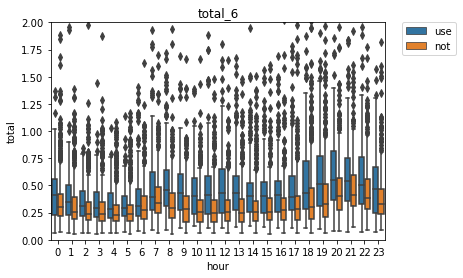

In [56]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_6, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_6')
plt.show()

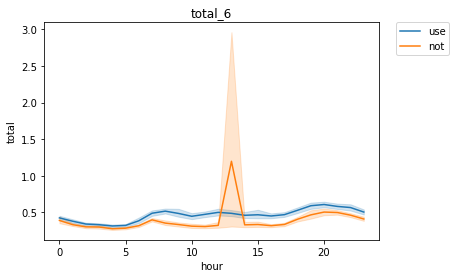

In [57]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_6, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_6')
plt.show()

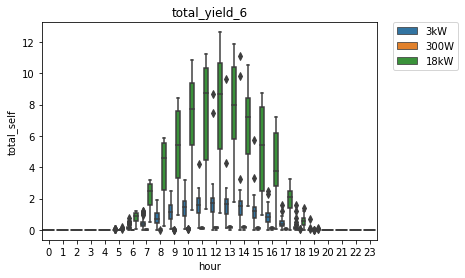

In [58]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_6')
plt.show()

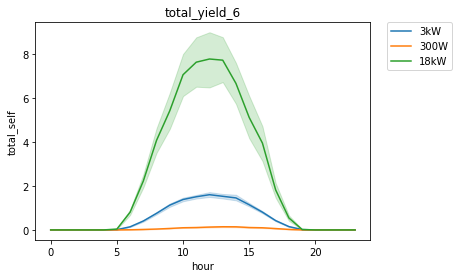

In [59]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_6')
plt.show()

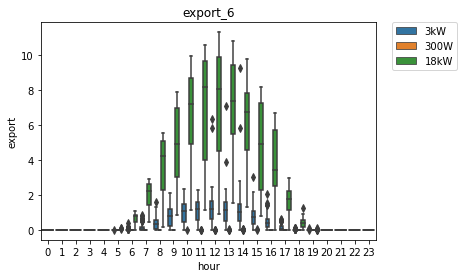

In [60]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_6')
plt.show()

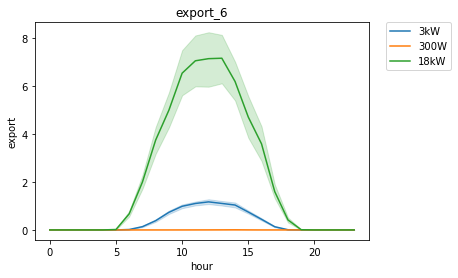

In [61]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_6')
plt.show()

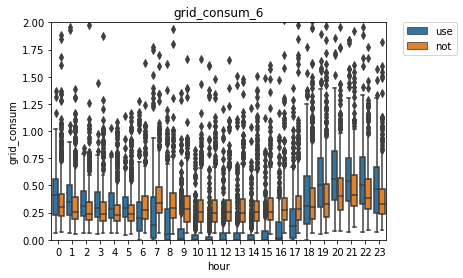

In [62]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_6, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_6')
plt.show()

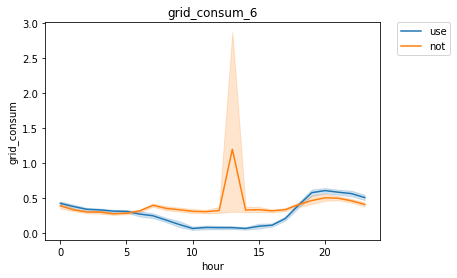

In [63]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_6, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_6')
plt.show()

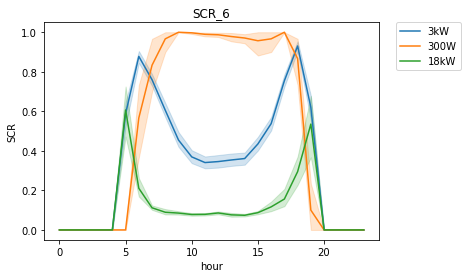

In [64]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_6')
plt.show()

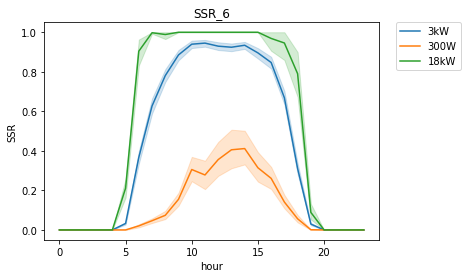

In [65]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_6')
plt.show()

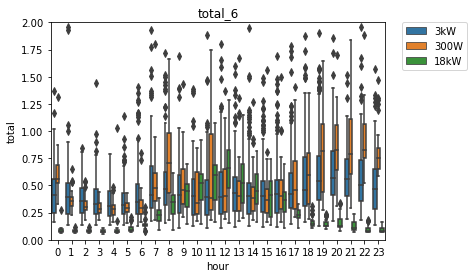

In [66]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_6')
plt.show()

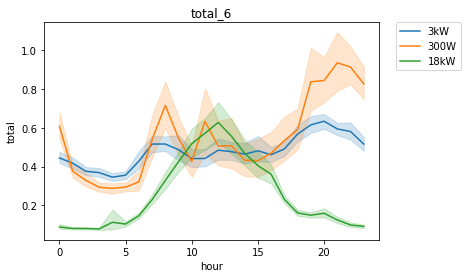

In [67]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_6')
plt.show()

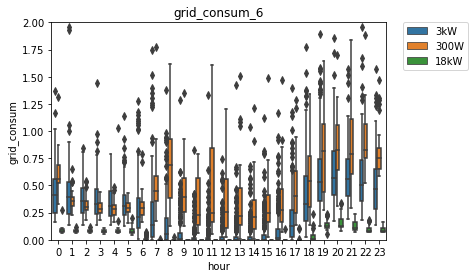

In [68]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_6')
plt.show()

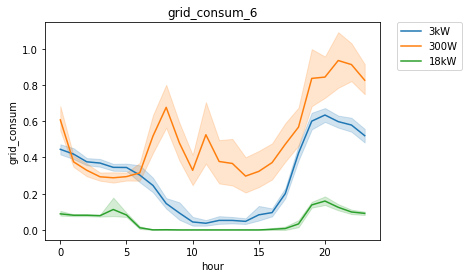

In [69]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_6, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_6')
plt.show()

<hr>

### 2021.07

In [70]:
df_all_hour_21_7 = df_all_hour[df_all_hour.ym == '2021/7']

In [71]:
# 총 전력 소비량
df_all_hour_21_7.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   531.0  0.457966  0.284324  0.049988  0.235016  0.380005  0.609985   
     1   530.0  0.423206  0.329400  0.059998  0.220009  0.339996  0.559937   
     2   530.0  0.377777  0.240066  0.059998  0.200012  0.319946  0.507507   
     3   531.0  0.346614  0.221970  0.059998  0.190002  0.300049  0.459961   
     4   530.0  0.317051  0.194629  0.059998  0.180054  0.279938  0.390015   
     5   528.0  0.308939  0.194807  0.049988  0.179993  0.250000  0.390015   
     6   533.0  0.485082  2.343349  0.059998  0.209961  0.320007  0.440063   
     7   534.0  0.459081  0.382177  0.059998  0.279968  0.380005  0.510010   
     8   532.0  0.402632  0.298798  0.059998  0.229980  0.355042  0.469971   
     9   529.0  0.400680  0.324328  0.059998  0.219971  0.329956  0.469971   
     10  529.0  0.384781  0.269721  0.049988  0.220032  0.330017  0.469971   
     11  528.0  0.543469  2.100786  0.049988  0.200012  0.339966  0.489990   
     12  526.0  0.427814  0.365155  0.049988  0.180054  0.340027  0.529999   
     13  528.0  0.456228  0.526466  0.059998  0.187469  0.334991  0.522491   
     14  526.0  0.454561  0.416799  0.059998  0.210022  0.340027  0.530029   
     15  519.0  0.461889  0.427150  0.050049  0.229980  0.339966  0.545044   
     16  522.0  0.540017  1.020013  0.049988  0.239990  0.359985  0.557465   
     17  527.0  0.580059  0.713075  0.059998  0.260010  0.390015  0.670044   
     18  526.0  0.639300  0.709804  0.059998  0.250000  0.429993  0.730072   
     19  526.0  0.623762  0.571863  0.069977  0.279968  0.440033  0.760010   
     20  530.0  0.722132  0.666691  0.059998  0.350037  0.519974  0.840073   
     21  530.0  0.684003  0.530925  0.059998  0.380005  0.539978  0.819992   
     22  532.0  0.618665  0.487605  0.070007  0.329956  0.500000  0.789932   
     23  527.0  0.519279  0.376458  0.059998  0.269989  0.419922  0.690033   
use  0   298.0  0.522752  0.352712  0.059998  0.262505  0.424988  0.669983   
     1   302.0  0.465739  0.300232  0.059998  0.260010  0.380005  0.617493   
     2   303.0  0.405567  0.226310  0.059998  0.239990  0.339966  0.554962   
     3   301.0  0.389396  0.215516  0.059998  0.229980  0.309937  0.549927   
     4   300.0  0.387177  0.233050  0.059998  0.220032  0.304993  0.560059   
     5   299.0  0.394679  0.199809  0.070251  0.230042  0.329956  0.534973   
     6   301.0  0.442947  0.448608  0.099991  0.259827  0.339905  0.560059   
     7   301.0  0.566415  0.657602  0.109604  0.300110  0.449890  0.680054   
     8   302.0  0.668934  0.723818  0.169922  0.370239  0.529541  0.749975   
     9   300.0  0.604022  0.441959  0.150024  0.347488  0.494999  0.712646   
     10  302.0  0.586407  0.374328  0.150024  0.319962  0.489994  0.727509   
     11  301.0  0.703648  0.757711  0.139893  0.330078  0.539917  0.840820   
     12  301.0  0.730922  0.547107  0.159973  0.359863  0.579956  0.899414   
     13  295.0  0.773447  0.648812  0.149902  0.369995  0.589966  0.865021   
     14  295.0  0.777246  0.632749  0.150024  0.360077  0.570312  0.909668   
     15  295.0  0.772907  0.616628  0.140015  0.349976  0.600037  0.970123   
     16  296.0  0.729344  0.598501  0.140137  0.349792  0.530029  0.919945   
     17  298.0  0.748563  0.573623  0.129883  0.369995  0.520050  0.965012   
     18  294.0  0.875209  0.665808  0.119766  0.390194  0.619965  1.177460   
     19  294.0  1.009952  0.786641  0.110260  0.409973  0.684998  1.507502   
     20  293.0  0.973290  0.705224  0.120010  0.429993  0.750000  1.290039   
     21  297.0  0.914983  0.613900  0.089996  0.450012  0.739990  1.199951   
     22  297.0  0.788490  0.552722  0.059998  0.420044  0.639954  1.010010   
     23  296.0  0.623286  0.445986  0.059998  0.327469  0.515015  0.790039   

               max  
type 시간             
not  0    2.150024  
     1    4.840027  
     2    1.969971  
   

In [72]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_21_7_use = df_all_hour_21_7[df_all_hour_21_7.type == 'use']
df_all_hour_21_7_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.165333  0.089278  0.059998  0.080002  0.204994   
         1    30.0  0.173335  0.097888  0.059998  0.080002  0.180008   
         2    30.0  0.158999  0.086876  0.059998  0.080002  0.164993   
         3    30.0  0.160002  0.088160  0.059998  0.072506  0.150002   
         4    31.0  0.178707  0.164860  0.059998  0.079994  0.139999   
         5    31.0  0.206775  0.092161  0.070251  0.124878  0.219757   
         6    31.0  0.232407  0.096537  0.099991  0.160019  0.220200   
         7    31.0  0.302787  0.105850  0.109604  0.235245  0.299805   
         8    31.0  0.410029  0.128743  0.169922  0.330322  0.429688   
         9    31.0  0.561949  0.177832  0.180176  0.459961  0.560059   
         10   31.0  0.695454  0.251082  0.169922  0.529785  0.669434   
         11   31.0  0.795807  0.232350  0.219727  0.665283  0.830078   
         12   31.0  0.759168  0.223656  0.260269  0.620361  0.759766   
         13   31.0  0.743250  0.251006  0.239975  0.619873  0.760254   
         14   31.0  0.672460  0.274923  0.209961  0.445068  0.669922   
         15   31.0  0.595845  0.251210  0.140121  0.375488  0.660156   
         16   30.0  0.489008  0.179097  0.140137  0.358021  0.485352   
         17   30.0  0.364347  0.151889  0.129883  0.255302  0.330681   
         18   30.0  0.353167  0.151430  0.119766  0.232449  0.360077   
         19   30.0  0.339394  0.148861  0.110260  0.209961  0.349884   
         20   30.0  0.305333  0.142822  0.120010  0.190002  0.324997   
         21   30.0  0.241334  0.102311  0.089996  0.149994  0.264999   
         22   30.0  0.198664  0.093946  0.059998  0.094997  0.224998   
         23   30.0  0.176668  0.091174  0.059998  0.080002  0.199997   
300W     0    29.0  0.584468  0.221854  0.339966  0.479980  0.520020   
         1    29.0  0.476213  0.306799  0.300049  0.349976  0.419922   
         2    29.0  0.403106  0.313344  0.220093  0.319946  0.349976   
         3    29.0  0.339309  0.082253  0.250000  0.290039  0.319946   
         4    29.0  0.368627  0.286944  0.199951  0.300049  0.320068   
         5    29.0  0.360693  0.134855  0.209961  0.280029  0.330078   
         6    29.0  0.379642  0.195276  0.170044  0.270020  0.319923   
         7    29.0  0.843116  0.482952  0.280006  0.480080  0.680054   
         8    29.0  1.162757  0.641291  0.230103  0.749969  1.050003   
         9    29.0  0.902065  0.858136  0.200027  0.399963  0.529945   
         10   29.0  0.674820  0.594876  0.229904  0.309959  0.489998   
         11   29.0  0.598623  0.533922  0.189896  0.290070  0.390030   
         12   29.0  0.733792  0.656692  0.229935  0.280029  0.429985   
         13   29.0  0.702423  0.693606  0.170105  0.279892  0.469933   
         14   29.0  0.784479  0.714228  0.189964  0.330055  0.400078   
         15   29.0  0.803449  0.716117  0.199944  0.290085  0.470062   
         16   28.0  0.859649  0.837768  0.219917  0.287565  0.459969   
         17   28.0  0.958928  0.940902  0.189964  0.357481  0.459999   
         18   28.0  1.123921  0.907524  0.219940  0.464981  0.790031   
         19   28.0  1.365356  0.893689  0.229980  0.482513  1.515011   
         20   28.0  1.615352  0.820176  0.209961  0.992432  1.559998   
         21   28.0  1.590703  0.811913  0.200073  0.845001  1.655029   
         22   29.0  1.132421  0.655983  0.229980  0.589966  1.020020   
         23   29.0  0.892768  0.492434  0.339966  0.550049  0.750000   
3kW      0   239.0  0.560128  0.361268  0.169983  0.294983  0.450012   
         1   243.0  0.500588  0.297060  0.159973  0.270020  0.410034   
         2   244.0  0.436176  0.207340  0.150024  0.250000  0.375031   
         3   242.0  0.423835  0.219212  0.159973  0.230042  0.339966   
         4   240.0  0.416345  0.219901  0.160034  0.229980  0.339966   
         5   239.0  0.423176  0.203034  0.159973  0.2

In [73]:
# 총 전력 생산량
df_all_hour_21_7_use = df_all_hour_21_7[df_all_hour_21_7.type == 'use']
df_all_hour_21_7_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.011593  0.021751  0.000000  0.000000  0.000000   
         6    31.0  0.601310  0.348243  0.000000  0.349609  0.610352   
         7    31.0  1.889900  0.784793  0.010254  1.609863  2.160156   
         8    31.0  3.798119  1.343026  0.660156  3.189941  4.100586   
         9    31.0  5.350948  1.888875  0.350098  4.804688  5.919922   
         10   31.0  6.793237  2.404169  0.770020  5.849609  7.029297   
         11   31.0  7.547143  2.720765  0.029785  6.695312  8.219727   
         12   31.0  7.926963  2.543112  0.030273  6.775391  9.100098   
         13   31.0  7.710670  2.646597  1.100098  7.319824  8.439453   
         14   31.0  6.163810  2.781594  1.029785  3.630127  6.450195   
         15   31.0  5.159699  2.622190  0.009766  3.479980  5.620117   
         16   30.0  3.812679  2.032280  0.140137  1.977539  4.155518   
         17   30.0  1.599089  0.791442  0.040039  1.103027  1.815430   
         18   30.0  0.493408  0.346553  0.009766  0.140137  0.480225   
         19   30.0  0.015055  0.022473  0.000000  0.000000  0.009766   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    29.0  0.004482  0.005723  0.000000  0.000000  0.000000   
         7    29.0  0.019310  0.009975  0.000000  0.010002  0.019997   
         8    29.0  0.031034  0.013976  0.000000  0.019997  0.029999   
         9    29.0  0.056896  0.016497  0.010002  0.050003  0.059998   
         10   29.0  0.088621  0.025314  0.020004  0.080002  0.090004   
         11   29.0  0.105517  0.032688  0.029999  0.089996  0.119995   
         12   29.0  0.131033  0.049161  0.029999  0.099998  0.149994   
         13   29.0  0.144138  0.061848  0.029999  0.080002  0.169998   
         14   29.0  0.142758  0.061289  0.010002  0.099998  0.150002   
         15   29.0  0.127587  0.058958  0.010002  0.080002  0.129997   
         16   28.0  0.098571  0.054277  0.000000  0.049995  0.110001   
         17   28.0  0.066428  0.041563  0.000000  0.029999  0.059998   
         18   28.0  0.030359  0.022849  0.000000  0.010002  0.025002   
         19   28.0  0.001072  0.003150  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   239.0  0.003889  0.007004  0.000000  0.0

In [74]:
# 총 전력 수출량
df_all_hour_21_7_use = df_all_hour_21_7[df_all_hour_21_7.type == 'use']
df_all_hour_21_7_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.002882  0.009669  0.000000  0.000000  0.000000   
         6    31.0  0.419229  0.279834  0.000000  0.239258  0.380371   
         7    31.0  1.598082  0.695580  0.000000  1.354980  1.899902   
         8    31.0  3.389381  1.237638  0.459961  2.860107  3.590332   
         9    31.0  4.788999  1.743203  0.149902  4.229980  5.440430   
         10   31.0  6.097782  2.190786  0.520020  5.235107  6.350586   
         11   31.0  6.763593  2.505290  0.000000  5.799805  7.389648   
         12   31.0  7.175214  2.402582  0.000000  5.924561  8.239746   
         13   31.0  6.967742  2.462544  0.870117  6.399658  7.590332   
         14   31.0  5.497480  2.528912  0.850098  3.169922  5.879883   
         15   31.0  4.579984  2.386876  0.000000  2.984863  4.979980   
         16   30.0  3.329671  1.892378  0.080078  1.534546  3.665283   
         17   30.0  1.251074  0.736266  0.000000  0.490479  1.470215   
         18   30.0  0.251074  0.251089  0.000000  0.040039  0.185059   
         19   30.0  0.000993  0.004011  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   29.0  0.000345  0.001857  0.000000  0.000000  0.000000   
         11   29.0  0.000345  0.001857  0.000000  0.000000  0.000000   
         12   29.0  0.001034  0.003099  0.000000  0.000000  0.000000   
         13   29.0  0.002759  0.007972  0.000000  0.000000  0.000000   
         14   29.0  0.001034  0.004093  0.000000  0.000000  0.000000   
         15   29.0  0.001034  0.004093  0.000000  0.000000  0.000000   
         16   28.0  0.000357  0.001890  0.000000  0.000000  0.000000   
         17   28.0  0.000357  0.001890  0.000000  0.000000  0.000000   
         18   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   239.0  0.000000  0.000000  0.000000  0.0

In [75]:
# 총 그리드 소비량
df_all_hour_21_7.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   531.0  0.457966  0.284324  0.049988  0.235016  0.380005  0.609985   
     1   530.0  0.423206  0.329400  0.059998  0.220009  0.339996  0.559937   
     2   530.0  0.377777  0.240066  0.059998  0.200012  0.319946  0.507507   
     3   531.0  0.346614  0.221970  0.059998  0.190002  0.300049  0.459961   
     4   530.0  0.317051  0.194629  0.059998  0.180054  0.279938  0.390015   
     5   528.0  0.308939  0.194807  0.049988  0.179993  0.250000  0.390015   
     6   533.0  0.485082  2.343349  0.059998  0.209961  0.320007  0.440063   
     7   534.0  0.459081  0.382177  0.059998  0.279968  0.380005  0.510010   
     8   532.0  0.402632  0.298798  0.059998  0.229980  0.355042  0.469971   
     9   529.0  0.400680  0.324328  0.059998  0.219971  0.329956  0.469971   
     10  529.0  0.384781  0.269721  0.049988  0.220032  0.330017  0.469971   
     11  528.0  0.543469  2.100786  0.049988  0.200012  0.339966  0.489990   
     12  526.0  0.427814  0.365155  0.049988  0.180054  0.340027  0.529999   
     13  528.0  0.456228  0.526466  0.059998  0.187469  0.334991  0.522491   
     14  526.0  0.454561  0.416799  0.059998  0.210022  0.340027  0.530029   
     15  519.0  0.461889  0.427150  0.050049  0.229980  0.339966  0.545044   
     16  522.0  0.540017  1.020013  0.049988  0.239990  0.359985  0.557465   
     17  527.0  0.580059  0.713075  0.059998  0.260010  0.390015  0.670044   
     18  526.0  0.639300  0.709804  0.059998  0.250000  0.429993  0.730072   
     19  526.0  0.623762  0.571863  0.069977  0.279968  0.440033  0.760010   
     20  530.0  0.722132  0.666691  0.059998  0.350037  0.519974  0.840073   
     21  530.0  0.684003  0.530925  0.059998  0.380005  0.539978  0.819992   
     22  532.0  0.618665  0.487605  0.070007  0.329956  0.500000  0.789932   
     23  527.0  0.519279  0.376458  0.059998  0.269989  0.419922  0.690033   
use  0   298.0  0.523526  0.353965  0.059998  0.262505  0.424988  0.669983   
     1   302.0  0.465743  0.300236  0.059998  0.260010  0.380005  0.617493   
     2   303.0  0.405571  0.226316  0.059998  0.239990  0.339966  0.554962   
     3   301.0  0.389396  0.215516  0.059998  0.229980  0.309937  0.549927   
     4   300.0  0.387177  0.233050  0.059998  0.220032  0.304993  0.560059   
     5   299.0  0.390667  0.199512  0.059998  0.230026  0.325012  0.530029   
     6   301.0  0.349430  0.457848  0.000000  0.160034  0.260010  0.469971   
     7   301.0  0.331571  0.671396  0.000000  0.059937  0.210022  0.429993   
     8   302.0  0.307652  0.729078  0.000000  0.000000  0.079956  0.360031   
     9   300.0  0.176304  0.392712  0.000000  0.000000  0.019989  0.180054   
     10  302.0  0.125566  0.289103  0.000000  0.000000  0.000000  0.137512   
     11  301.0  0.168178  0.554669  0.000000  0.000000  0.000000  0.140015   
     12  301.0  0.168343  0.369615  0.000000  0.000000  0.000000  0.169922   
     13  295.0  0.192039  0.429133  0.000000  0.000000  0.000000  0.140015   
     14  295.0  0.210613  0.416633  0.000000  0.000000  0.010010  0.230042   
     15  295.0  0.249948  0.453529  0.000000  0.000000  0.039978  0.310059   
     16  296.0  0.305829  0.534780  0.000000  0.000000  0.085022  0.372498   
     17  298.0  0.439939  0.540253  0.000000  0.052536  0.239990  0.627411   
     18  294.0  0.743212  0.674825  0.000000  0.239990  0.515015  1.044952   
     19  294.0  0.997162  0.788519  0.100006  0.399963  0.669952  1.494995   
     20  293.0  0.973294  0.705222  0.120010  0.429993  0.750000  1.290039   
     21  297.0  0.914988  0.613899  0.089996  0.450012  0.739990  1.199951   
     22  297.0  0.788494  0.552722  0.059998  0.420044  0.639954  1.010010   
     23  296.0  0.623289  0.445987  0.059998  0.327469  0.515015  0.790039   

               max  
type 시간             
not  0    2.150024  
     1    4.840027  
     2    1.969971  
   

In [76]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_7_use = df_all_hour_21_7[df_all_hour_21_7.type == 'use']
df_all_hour_21_7_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.165333  0.089278  0.059998  0.080002  0.204994   
         1    30.0  0.173335  0.097888  0.059998  0.080002  0.180008   
         2    30.0  0.158999  0.086876  0.059998  0.080002  0.164993   
         3    30.0  0.160002  0.088160  0.059998  0.072506  0.150002   
         4    31.0  0.178707  0.164860  0.059998  0.079994  0.139999   
         5    31.0  0.198065  0.093002  0.059998  0.119995  0.209991   
         6    31.0  0.050325  0.065902  0.000000  0.010002  0.020004   
         7    31.0  0.010968  0.042139  0.000000  0.000000  0.000000   
         8    31.0  0.001291  0.005623  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.012258  0.068248  0.000000  0.000000  0.000000   
         12   31.0  0.007419  0.041308  0.000000  0.000000  0.000000   
         13   31.0  0.000322  0.001795  0.000000  0.000000  0.000000   
         14   31.0  0.006129  0.023048  0.000000  0.000000  0.000000   
         15   31.0  0.016129  0.066266  0.000000  0.000000  0.000000   
         16   30.0  0.006000  0.019583  0.000000  0.000000  0.000000   
         17   30.0  0.016333  0.035863  0.000000  0.000000  0.000000   
         18   30.0  0.110833  0.122812  0.000000  0.009998  0.072495   
         19   30.0  0.325332  0.144025  0.100006  0.195000  0.340012   
         20   30.0  0.305333  0.142822  0.120010  0.190002  0.324997   
         21   30.0  0.241334  0.102311  0.089996  0.149994  0.264999   
         22   30.0  0.198664  0.093946  0.059998  0.094997  0.224998   
         23   30.0  0.176668  0.091174  0.059998  0.080002  0.199997   
300W     0    29.0  0.584468  0.221854  0.339966  0.479980  0.520020   
         1    29.0  0.476213  0.306799  0.300049  0.349976  0.419922   
         2    29.0  0.403106  0.313344  0.220093  0.319946  0.349976   
         3    29.0  0.339309  0.082253  0.250000  0.290039  0.319946   
         4    29.0  0.368627  0.286944  0.199951  0.300049  0.320068   
         5    29.0  0.360693  0.134855  0.209961  0.280029  0.330078   
         6    29.0  0.375160  0.196064  0.170044  0.270020  0.299927   
         7    29.0  0.823806  0.486549  0.260010  0.460083  0.660034   
         8    29.0  1.131722  0.644126  0.230103  0.710083  1.000000   
         9    29.0  0.845169  0.861141  0.150024  0.339966  0.449951   
         10   29.0  0.586544  0.597655  0.130005  0.210083  0.369995   
         11   29.0  0.493450  0.525000  0.069946  0.200073  0.280029   
         12   29.0  0.603793  0.663739  0.059937  0.169922  0.270020   
         13   29.0  0.561044  0.693909  0.020020  0.130005  0.329956   
         14   29.0  0.642755  0.710744  0.030029  0.140015  0.329956   
         15   29.0  0.676897  0.714064  0.049927  0.159912  0.369995   
         16   28.0  0.761435  0.832259  0.089966  0.217468  0.375000   
         17   28.0  0.892857  0.944570  0.089966  0.284943  0.390015   
         18   28.0  1.093563  0.907392  0.189941  0.447479  0.779968   
         19   28.0  1.364284  0.893685  0.229980  0.482513  1.510010   
         20   28.0  1.615352  0.820176  0.209961  0.992432  1.559998   
         21   28.0  1.590703  0.811913  0.200073  0.845001  1.655029   
         22   29.0  1.132421  0.655983  0.229980  0.589966  1.020020   
         23   29.0  0.892768  0.492434  0.339966  0.550049  0.750000   
3kW      0   239.0  0.561093  0.362694  0.169983  0.294983  0.450012   
         1   243.0  0.500594  0.297064  0.159973  0.270020  0.410034   
         2   244.0  0.436181  0.207348  0.150024  0.250000  0.375031   
         3   242.0  0.423835  0.219212  0.159973  0.230042  0.339966   
         4   240.0  0.416345  0.219901  0.160034  0.229980  0.339966   
         5   239.0  0.419286  0.202105  0.159973  0.2

In [77]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_7_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.397871  0.469817  0.000000  0.000000  0.000000   
         6    31.0  0.299872  0.160402  0.000000  0.219514  0.298834   
         7    31.0  0.200117  0.164505  0.090909  0.130464  0.151548   
         8    31.0  0.118989  0.048058  0.067776  0.094616  0.104581   
         9    31.0  0.125294  0.088283  0.062241  0.093234  0.106254   
         10   31.0  0.112935  0.047837  0.064164  0.090443  0.101963   
         11   31.0  0.140361  0.163554  0.062938  0.092680  0.104410   
         12   31.0  0.127791  0.164032  0.056732  0.077750  0.097202   
         13   31.0  0.103043  0.030128  0.047476  0.086602  0.093259   
         14   31.0  0.116304  0.029116  0.068298  0.099511  0.109733   
         15   31.0  0.166988  0.176675  0.062589  0.090833  0.123656   
         16   30.0  0.167310  0.096011  0.057609  0.105108  0.127337   
         17   30.0  0.304307  0.219939  0.072621  0.158862  0.206014   
         18   30.0  0.610878  0.276132  0.196078  0.385243  0.565756   
         19   30.0  0.541674  0.496305  0.000000  0.000000  0.955752   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    29.0  0.413793  0.501230  0.000000  0.000000  0.000000   
         7    29.0  0.896552  0.309934  0.000000  1.000000  1.000000   
         8    29.0  0.965517  0.185695  0.000000  1.000000  1.000000   
         9    29.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   29.0  0.996865  0.016881  0.909092  1.000000  1.000000   
         11   29.0  0.997537  0.013264  0.928571  1.000000  1.000000   
         12   29.0  0.994241  0.017274  0.941176  1.000000  1.000000   
         13   29.0  0.985926  0.040849  0.842107  1.000000  1.000000   
         14   29.0  0.994992  0.019679  0.904762  1.000000  1.000000   
         15   29.0  0.993788  0.024369  0.882352  1.000000  1.000000   
         16   28.0  0.926190  0.261895  0.000000  1.000000  1.000000   
         17   28.0  0.961309  0.189055  0.000000  1.000000  1.000000   
         18   28.0  0.857143  0.356348  0.000000  1.000000  1.000000   
         19   28.0  0.107143  0.314970  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   239.0  0.297071  0.457927  0.000000  0.0

In [78]:
# SSR(자가공급률)
df_all_hour_21_7_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.055857  0.094755  0.000000  0.000000  0.000000   
         6    31.0  0.780957  0.296276  0.000000  0.768848  0.906265   
         7    31.0  0.947047  0.186683  0.044533  1.000000  1.000000   
         8    31.0  0.994070  0.024494  0.874984  1.000000  1.000000   
         9    31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  0.970087  0.166550  0.072687  1.000000  1.000000   
         12   31.0  0.971494  0.158714  0.116316  1.000000  1.000000   
         13   31.0  0.998657  0.007480  0.958352  1.000000  1.000000   
         14   31.0  0.984257  0.058034  0.719628  1.000000  1.000000   
         15   31.0  0.944980  0.201750  0.027144  1.000000  1.000000   
         16   30.0  0.971007  0.111974  0.400203  1.000000  1.000000   
         17   30.0  0.930001  0.180014  0.250191  0.970932  1.000000   
         18   30.0  0.668897  0.332891  0.033702  0.399971  0.800316   
         19   30.0  0.040158  0.056993  0.000000  0.000000  0.020962   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    29.0  0.013863  0.018322  0.000000  0.000000  0.000000   
         7    29.0  0.032507  0.023903  0.000000  0.011906  0.025312   
         8    29.0  0.039032  0.039825  0.000000  0.014491  0.027770   
         9    29.0  0.115447  0.077589  0.006668  0.061219  0.102019   
         10   29.0  0.202840  0.115528  0.018022  0.125044  0.212114   
         11   29.0  0.263094  0.160410  0.049992  0.127669  0.263319   
         12   29.0  0.310601  0.216060  0.024290  0.141599  0.299983   
         13   29.0  0.365783  0.276435  0.023473  0.129027  0.297899   
         14   29.0  0.320637  0.232248  0.014711  0.126580  0.249979   
         15   29.0  0.283761  0.228117  0.016950  0.129020  0.179982   
         16   28.0  0.218019  0.199208  0.000000  0.050457  0.174113   
         17   28.0  0.152309  0.167644  0.000000  0.035367  0.084010   
         18   28.0  0.048218  0.059788  0.000000  0.008194  0.025479   
         19   28.0  0.000916  0.002959  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   239.0  0.009872  0.019207  0.000000  0.0

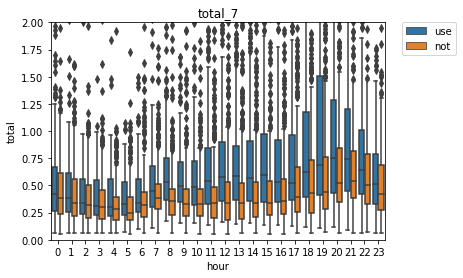

In [79]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_7, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_7')
plt.show()

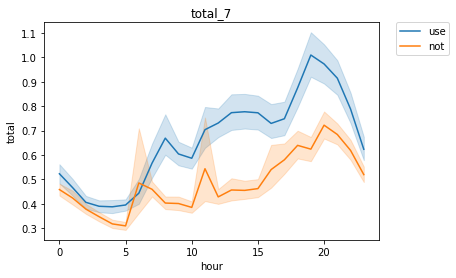

In [80]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_7, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_7')
plt.show()

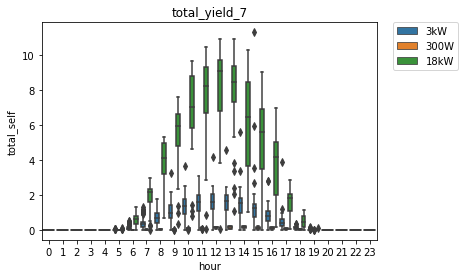

In [81]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_7')
plt.show()

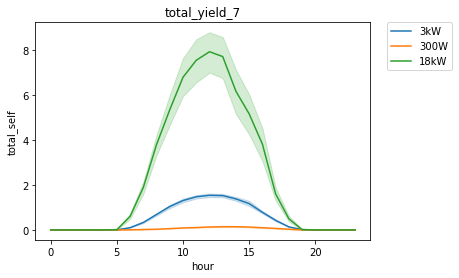

In [82]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_7')
plt.show()

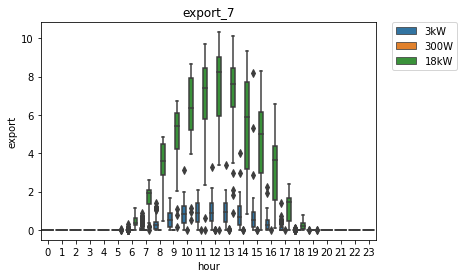

In [83]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_7')
plt.show()

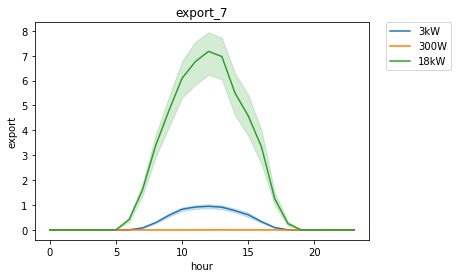

In [84]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_7')
plt.show()

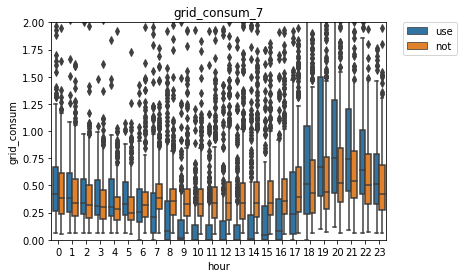

In [85]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_7, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_7')
plt.show()

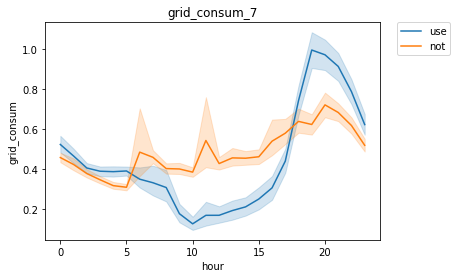

In [86]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_7, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_7')
plt.show()

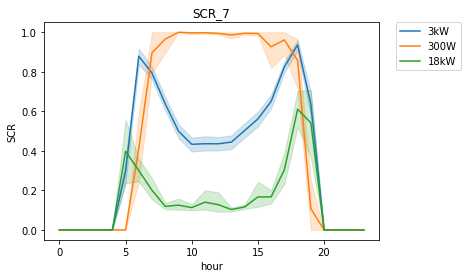

In [87]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_7')
plt.show()

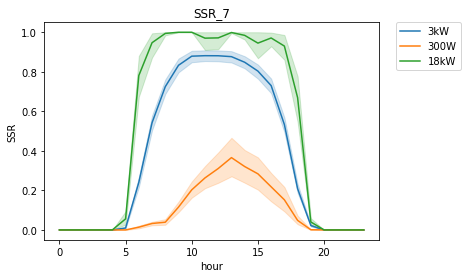

In [88]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_7')
plt.show()

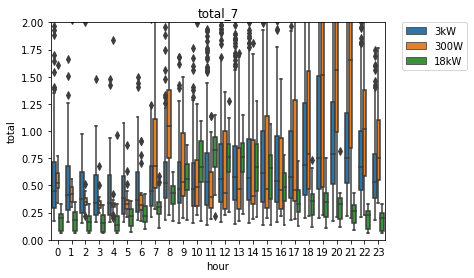

In [89]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_7')
plt.show()

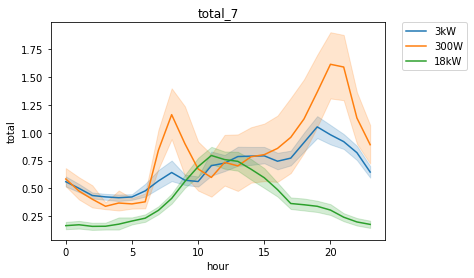

In [90]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_7')
plt.show()

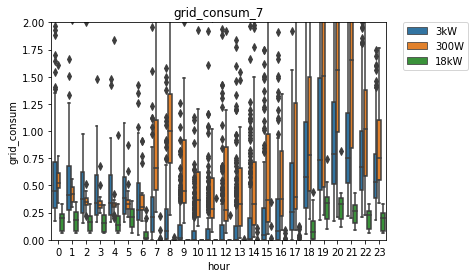

In [91]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_7')
plt.show()

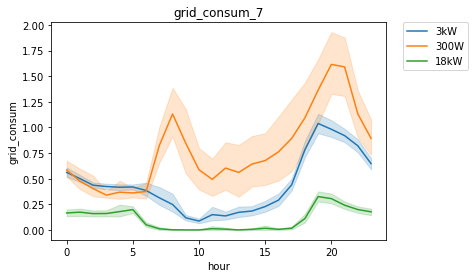

In [92]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_7, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_7')
plt.show()

<hr>

### 2021.08

In [93]:
df_all_hour_21_8 = df_all_hour[df_all_hour.ym == '2021/8']

In [94]:
# 총 전력 소비량
df_all_hour_21_8.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   531.0  0.456194  0.534713  0.079956  0.219971  0.359985  0.560059   
     1   539.0  0.398076  0.269208  0.070007  0.200043  0.320068  0.530029   
     2   533.0  0.356849  0.224887  0.059998  0.189941  0.309937  0.479980   
     3   532.0  0.329267  0.206660  0.059998  0.170044  0.280029  0.420044   
     4   534.0  0.317208  0.210917  0.059998  0.169983  0.269958  0.400024   
     5   535.0  0.306766  0.270120  0.049988  0.160034  0.250000  0.390015   
     6   533.0  0.341407  0.263417  0.049988  0.190063  0.289917  0.419922   
     7   533.0  0.430338  0.617187  0.059998  0.230042  0.330078  0.459961   
     8   538.0  0.405279  0.361871  0.049988  0.219971  0.330078  0.479980   
     9   532.0  0.376613  0.299670  0.040039  0.209961  0.335022  0.459961   
     10  536.0  0.512128  1.866897  0.050018  0.217499  0.329956  0.470001   
     11  541.0  0.481901  1.625612  0.049988  0.180054  0.320068  0.479980   
     12  532.0  0.429400  0.413429  0.039978  0.187469  0.320068  0.492493   
     13  536.0  0.461087  0.814662  0.039978  0.190002  0.339966  0.510010   
     14  533.0  0.534179  1.800965  0.039978  0.199951  0.329956  0.469971   
     15  535.0  0.426170  0.400213  0.049988  0.209961  0.330017  0.484985   
     16  537.0  0.468026  0.581578  0.039978  0.229980  0.350098  0.529907   
     17  532.0  0.490733  0.495837  0.059998  0.219971  0.344971  0.579956   
     18  529.0  0.548806  0.615660  0.049988  0.230042  0.380005  0.609985   
     19  536.0  0.606013  0.525972  0.059998  0.260010  0.450073  0.750000   
     20  526.0  0.665035  0.595762  0.069946  0.329956  0.479980  0.760010   
     21  533.0  0.676943  0.798995  0.070007  0.339996  0.500000  0.760010   
     22  531.0  0.550510  0.444134  0.070007  0.280029  0.449951  0.670105   
     23  530.0  0.474530  0.358716  0.079956  0.239990  0.389999  0.609985   
use  0   306.0  0.531294  0.353976  0.059998  0.301285  0.429993  0.667572   
     1   306.0  0.494565  0.355955  0.059998  0.279907  0.390015  0.609955   
     2   305.0  0.435744  0.260537  0.059998  0.260010  0.369995  0.540039   
     3   306.0  0.406478  0.249064  0.050018  0.250000  0.329987  0.510010   
     4   305.0  0.391369  0.219069  0.050018  0.230103  0.319946  0.510010   
     5   303.0  0.409544  0.270493  0.069977  0.239990  0.319946  0.530029   
     6   304.0  0.423350  0.246117  0.080292  0.250107  0.339905  0.559967   
     7   299.0  0.515118  0.337470  0.121033  0.280029  0.400146  0.654968   
     8   303.0  0.628517  0.483953  0.079559  0.349731  0.469971  0.739967   
     9   303.0  0.584078  0.385337  0.089996  0.329956  0.480103  0.699615   
     10  304.0  0.575896  0.388501  0.089783  0.290035  0.460144  0.744690   
     11  300.0  0.605789  0.407414  0.129333  0.310150  0.479980  0.803070   
     12  297.0  0.692646  0.517735  0.144958  0.320068  0.530273  0.860031   
     13  300.0  0.704373  0.502997  0.160034  0.359985  0.539917  0.929688   
     14  301.0  0.674852  0.542438  0.159912  0.339996  0.510010  0.800049   
     15  301.0  0.668981  0.871847  0.119324  0.319336  0.489868  0.760132   
     16  303.0  0.676923  0.579450  0.149963  0.334793  0.500000  0.770081   
     17  303.0  0.746335  0.588355  0.129547  0.369873  0.540039  0.955017   
     18  302.0  0.824881  0.563138  0.099762  0.432495  0.619995  1.110107   
     19  306.0  0.886948  0.607864  0.110016  0.459961  0.689941  1.217468   
     20  306.0  0.858697  0.569512  0.100006  0.449982  0.680054  1.134949   
     21  306.0  0.808986  0.517679  0.069977  0.469971  0.670044  1.070007   
     22  303.0  0.740461  0.485846  0.070007  0.440033  0.630005  0.984985   
     23  307.0  0.641110  0.446566  0.059998  0.359985  0.529907  0.795044   

               max  
type 시간             
not  0   10.520020  
     1    2.330078  
     2    2.070068  
   

In [95]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_21_8_use = df_all_hour_21_8[df_all_hour_21_8.type == 'use']
df_all_hour_21_8_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.158665  0.083574  0.059998  0.070007  0.179993   
         1    30.0  0.160001  0.084245  0.059998  0.070007  0.185013   
         2    30.0  0.162332  0.090007  0.059998  0.070007  0.184982   
         3    30.0  0.150006  0.083581  0.050018  0.070007  0.184998   
         4    30.0  0.211001  0.302204  0.050018  0.082512  0.189995   
         5    31.0  0.190024  0.067505  0.069977  0.144989  0.199982   
         6    31.0  0.202872  0.114215  0.080292  0.129364  0.169891   
         7    31.0  0.239638  0.075226  0.121033  0.179794  0.240204   
         8    31.0  0.316073  0.118550  0.079559  0.229492  0.310272   
         9    31.0  0.501114  0.232991  0.089996  0.380859  0.489258   
         10   31.0  0.656512  0.298315  0.089783  0.469727  0.680664   
         11   31.0  0.664492  0.341222  0.129333  0.444336  0.598633   
         12   31.0  0.700075  0.291447  0.200378  0.505371  0.719727   
         13   31.0  0.757879  0.287480  0.179138  0.535156  0.769531   
         14   31.0  0.661220  0.294249  0.199982  0.380371  0.709961   
         15   31.0  0.543087  0.257633  0.119324  0.304688  0.589844   
         16   30.0  0.423237  0.166586  0.150391  0.280273  0.439453   
         17   30.0  0.299337  0.102277  0.129547  0.222328  0.295387   
         18   30.0  0.298244  0.131072  0.099762  0.209724  0.279846   
         19   30.0  0.297670  0.137133  0.110016  0.232506  0.255005   
         20   30.0  0.269001  0.125268  0.100006  0.137482  0.260010   
         21   30.0  0.232663  0.107025  0.069977  0.122520  0.239990   
         22   30.0  0.178668  0.098986  0.070007  0.080017  0.184998   
         23   30.0  0.163003  0.090564  0.059998  0.070007  0.180023   
300W     0    31.0  0.581634  0.291856  0.330078  0.424988  0.550049   
         1    31.0  0.391287  0.106309  0.250000  0.324890  0.369995   
         2    31.0  0.354520  0.082942  0.219971  0.290039  0.330078   
         3    31.0  0.318391  0.052865  0.219971  0.275024  0.309937   
         4    31.0  0.314512  0.062217  0.229980  0.265015  0.310059   
         5    31.0  0.353870  0.247253  0.239990  0.270020  0.309937   
         6    31.0  0.334831  0.113545  0.189926  0.270012  0.299927   
         7    31.0  0.671932  0.377389  0.179932  0.330009  0.619995   
         8    31.0  0.841941  0.621254  0.170029  0.435036  0.710068   
         9    31.0  0.549989  0.424130  0.200012  0.299988  0.430008   
         10   31.0  0.485165  0.326971  0.159952  0.275085  0.380051   
         11   31.0  0.434539  0.235419  0.199961  0.275002  0.390015   
         12   31.0  0.557393  0.514798  0.159890  0.275067  0.369949   
         13   31.0  0.643876  0.682474  0.200007  0.259994  0.389999   
         14   31.0  0.704522  0.722791  0.190037  0.335045  0.379944   
         15   31.0  0.545480  0.447896  0.199919  0.284996  0.379990   
         16   31.0  0.537746  0.459850  0.170027  0.284996  0.340088   
         17   31.0  0.564677  0.558351  0.199976  0.295013  0.360031   
         18   31.0  0.992597  0.670382  0.160004  0.479980  0.750092   
         19   31.0  1.233870  0.677024  0.239990  0.695007  0.959961   
         20   31.0  1.352244  0.677795  0.250000  0.900024  1.290039   
         21   31.0  1.291303  0.730806  0.440063  0.750000  1.070068   
         22   31.0  1.069364  0.600588  0.429932  0.650024  0.780029   
         23   31.0  0.846447  0.512155  0.449951  0.600037  0.670044   
3kW      0   245.0  0.570553  0.355499  0.160034  0.329956  0.449951   
         1   245.0  0.548600  0.371615  0.169983  0.309998  0.430054   
         2   244.0  0.479680  0.266635  0.160034  0.290039  0.410034   
         3   245.0  0.449029  0.255882  0.159973  0.270020  0.380005   
         4   244.0  0.423310  0.207044  0.179993  0.250000  0.364990   
         5   241.0  0.444942  0.275633  0.170044  0.2

In [96]:
# 총 전력 생산량
df_all_hour_21_8_use = df_all_hour_21_8[df_all_hour_21_8.type == 'use']
df_all_hour_21_8_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000347  0.001929  0.000000  0.000000  0.000000   
         6    31.0  0.244456  0.189789  0.000000  0.050293  0.250000   
         7    31.0  1.308027  0.714766  0.000000  0.915039  1.370117   
         8    31.0  2.883821  1.646406  0.089844  1.420410  2.849609   
         9    31.0  4.596743  2.331091  0.000000  3.035156  5.320312   
         10   31.0  5.971617  2.890549  0.009766  4.260254  6.560547   
         11   31.0  6.382907  3.345830  0.250000  4.054688  7.199219   
         12   31.0  6.787141  3.210360  0.610352  3.830078  7.839844   
         13   31.0  6.863880  3.169811  0.239258  4.689941  7.310547   
         14   31.0  5.599798  3.202781  0.000000  2.824707  6.530273   
         15   31.0  4.517704  2.770563  0.070312  2.390137  4.509766   
         16   30.0  3.206608  1.942392  0.000000  1.372559  3.615234   
         17   30.0  1.245313  0.557648  0.019531  0.992188  1.319824   
         18   30.0  0.282129  0.241190  0.000000  0.032715  0.265137   
         19   30.0  0.001335  0.007310  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.002257  0.004248  0.000000  0.000000  0.000000   
         7    31.0  0.010646  0.008140  0.000000  0.004997  0.009995   
         8    31.0  0.027098  0.012701  0.000000  0.020004  0.029999   
         9    31.0  0.053549  0.017427  0.009995  0.044998  0.059998   
         10   31.0  0.074516  0.026436  0.000000  0.064995  0.080002   
         11   31.0  0.097420  0.045605  0.000000  0.064995  0.119995   
         12   31.0  0.122257  0.061682  0.000000  0.075005  0.119995   
         13   31.0  0.130322  0.062796  0.019989  0.084999  0.139999   
         14   31.0  0.135483  0.060378  0.020004  0.089996  0.149994   
         15   31.0  0.115487  0.059321  0.000000  0.070007  0.120010   
         16   31.0  0.082257  0.050249  0.000000  0.044991  0.079987   
         17   31.0  0.044516  0.036132  0.000000  0.014999  0.039993   
         18   31.0  0.016775  0.019218  0.000000  0.000000  0.009995   
         19   31.0  0.000645  0.002496  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.001874  0.025258  0.000000  0.0

In [97]:
# 총 전력 수출량
df_all_hour_21_8_use = df_all_hour_21_8[df_all_hour_21_8.type == 'use']
df_all_hour_21_8_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.139648  0.130765  0.000000  0.014648  0.119141   
         7    31.0  1.091293  0.635832  0.000000  0.759766  1.199219   
         8    31.0  2.570974  1.545529  0.030273  1.110352  2.629883   
         9    31.0  4.098853  2.127667  0.000000  2.654297  4.859375   
         10   31.0  5.322203  2.620345  0.000000  3.759766  5.879883   
         11   31.0  5.723255  3.046401  0.139648  3.564941  6.219727   
         12   31.0  6.088678  2.954911  0.459961  3.419922  7.009766   
         13   31.0  6.110194  2.925487  0.120117  4.055176  6.429688   
         14   31.0  4.945029  2.928270  0.000000  2.385254  5.919922   
         15   31.0  3.982359  2.522796  0.000000  2.060059  3.939453   
         16   30.0  2.797038  1.785338  0.000000  1.129639  3.219727   
         17   30.0  0.959310  0.504894  0.000000  0.614746  1.090332   
         18   30.0  0.138216  0.154664  0.000000  0.002441  0.084961   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         11   31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         12   31.0  0.003226  0.009087  0.000000  0.000000  0.000000   
         13   31.0  0.004194  0.010255  0.000000  0.000000  0.000000   
         14   31.0  0.002258  0.006170  0.000000  0.000000  0.000000   
         15   31.0  0.001935  0.006542  0.000000  0.000000  0.000000   
         16   31.0  0.001290  0.005623  0.000000  0.000000  0.000000   
         17   31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.000000  0.000000  0.000000  0.0

In [98]:
# 총 그리드 소비량
df_all_hour_21_8.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   531.0  0.456194  0.534713  0.079956  0.219971  0.359985  0.560059   
     1   539.0  0.398076  0.269208  0.070007  0.200043  0.320068  0.530029   
     2   533.0  0.356849  0.224887  0.059998  0.189941  0.309937  0.479980   
     3   532.0  0.329267  0.206660  0.059998  0.170044  0.280029  0.420044   
     4   534.0  0.317208  0.210917  0.059998  0.169983  0.269958  0.400024   
     5   535.0  0.306766  0.270120  0.049988  0.160034  0.250000  0.390015   
     6   533.0  0.341407  0.263417  0.049988  0.190063  0.289917  0.419922   
     7   533.0  0.430338  0.617187  0.059998  0.230042  0.330078  0.459961   
     8   538.0  0.405279  0.361871  0.049988  0.219971  0.330078  0.479980   
     9   532.0  0.376613  0.299670  0.040039  0.209961  0.335022  0.459961   
     10  536.0  0.512128  1.866897  0.050018  0.217499  0.329956  0.470001   
     11  541.0  0.481901  1.625612  0.049988  0.180054  0.320068  0.479980   
     12  532.0  0.429400  0.413429  0.039978  0.187469  0.320068  0.492493   
     13  536.0  0.461087  0.814662  0.039978  0.190002  0.339966  0.510010   
     14  533.0  0.534179  1.800965  0.039978  0.199951  0.329956  0.469971   
     15  535.0  0.426170  0.400213  0.049988  0.209961  0.330017  0.484985   
     16  537.0  0.468026  0.581578  0.039978  0.229980  0.350098  0.529907   
     17  532.0  0.490733  0.495837  0.059998  0.219971  0.344971  0.579956   
     18  529.0  0.548806  0.615660  0.049988  0.230042  0.380005  0.609985   
     19  536.0  0.606013  0.525972  0.059998  0.260010  0.450073  0.750000   
     20  526.0  0.665035  0.595762  0.069946  0.329956  0.479980  0.760010   
     21  533.0  0.676943  0.798995  0.070007  0.339996  0.500000  0.760010   
     22  531.0  0.550510  0.444134  0.070007  0.280029  0.449951  0.670105   
     23  530.0  0.474530  0.358716  0.079956  0.239990  0.389999  0.609985   
use  0   306.0  0.531294  0.353976  0.059998  0.301285  0.429993  0.667572   
     1   306.0  0.494565  0.355955  0.059998  0.279907  0.390015  0.609955   
     2   305.0  0.435744  0.260537  0.059998  0.260010  0.369995  0.540039   
     3   306.0  0.406478  0.249064  0.050018  0.250000  0.329987  0.510010   
     4   305.0  0.391369  0.219069  0.050018  0.230103  0.319946  0.510010   
     5   303.0  0.408018  0.268321  0.069977  0.239990  0.319946  0.530029   
     6   304.0  0.378286  0.250980  0.009979  0.220078  0.290039  0.529938   
     7   299.0  0.338460  0.357458  0.000000  0.075012  0.239990  0.455078   
     8   303.0  0.333580  0.482754  0.000000  0.010010  0.169922  0.450012   
     9   303.0  0.216398  0.340450  0.000000  0.000000  0.040039  0.280029   
     10  304.0  0.163980  0.288837  0.000000  0.000000  0.014954  0.209961   
     11  300.0  0.154047  0.295103  0.000000  0.000000  0.020020  0.182617   
     12  297.0  0.202495  0.390547  0.000000  0.000000  0.019897  0.229980   
     13  300.0  0.200562  0.376400  0.000000  0.000000  0.030029  0.250000   
     14  301.0  0.218062  0.424834  0.000000  0.000000  0.030029  0.259888   
     15  301.0  0.238708  0.553107  0.000000  0.000000  0.080017  0.270020   
     16  303.0  0.306029  0.402450  0.000000  0.020020  0.140015  0.439941   
     17  303.0  0.503871  0.541882  0.000000  0.140015  0.319824  0.729980   
     18  302.0  0.754059  0.570499  0.029999  0.352501  0.540039  1.070038   
     19  306.0  0.884461  0.607463  0.110016  0.459961  0.689941  1.207458   
     20  306.0  0.858697  0.569512  0.100006  0.449982  0.680054  1.134949   
     21  306.0  0.808986  0.517679  0.069977  0.469971  0.670044  1.070007   
     22  303.0  0.740461  0.485846  0.070007  0.440033  0.630005  0.984985   
     23  307.0  0.641110  0.446566  0.059998  0.359985  0.529907  0.795044   

               max  
type 시간             
not  0   10.520020  
     1    2.330078  
     2    2.070068  
   

In [99]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_8_use = df_all_hour_21_8[df_all_hour_21_8.type == 'use']
df_all_hour_21_8_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.158665  0.083574  0.059998  0.070007  0.179993   
         1    30.0  0.160001  0.084245  0.059998  0.070007  0.185013   
         2    30.0  0.162332  0.090007  0.059998  0.070007  0.184982   
         3    30.0  0.150006  0.083581  0.050018  0.070007  0.184998   
         4    30.0  0.211001  0.302204  0.050018  0.082512  0.189995   
         5    31.0  0.189677  0.067210  0.069977  0.144989  0.199982   
         6    31.0  0.098064  0.077991  0.009979  0.040009  0.070007   
         7    31.0  0.022904  0.046563  0.000000  0.000000  0.000000   
         8    31.0  0.003226  0.009448  0.000000  0.000000  0.000000   
         9    31.0  0.003225  0.016203  0.000000  0.000000  0.000000   
         10   31.0  0.007098  0.028545  0.000000  0.000000  0.000000   
         11   31.0  0.004839  0.019130  0.000000  0.000000  0.000000   
         12   31.0  0.001613  0.008978  0.000000  0.000000  0.000000   
         13   31.0  0.004194  0.014088  0.000000  0.000000  0.000000   
         14   31.0  0.006451  0.035918  0.000000  0.000000  0.000000   
         15   31.0  0.007742  0.028366  0.000000  0.000000  0.000000   
         16   30.0  0.013667  0.042302  0.000000  0.000000  0.000000   
         17   30.0  0.013335  0.034878  0.000000  0.000000  0.000000   
         18   30.0  0.154331  0.121250  0.029999  0.062492  0.120010   
         19   30.0  0.296335  0.136699  0.110016  0.232506  0.255005   
         20   30.0  0.269001  0.125268  0.100006  0.137482  0.260010   
         21   30.0  0.232663  0.107025  0.069977  0.122520  0.239990   
         22   30.0  0.178668  0.098986  0.070007  0.080017  0.184998   
         23   30.0  0.163003  0.090564  0.059998  0.070007  0.180023   
300W     0    31.0  0.581634  0.291856  0.330078  0.424988  0.550049   
         1    31.0  0.391287  0.106309  0.250000  0.324890  0.369995   
         2    31.0  0.354520  0.082942  0.219971  0.290039  0.330078   
         3    31.0  0.318391  0.052865  0.219971  0.275024  0.309937   
         4    31.0  0.314512  0.062217  0.229980  0.265015  0.310059   
         5    31.0  0.353870  0.247253  0.239990  0.270020  0.309937   
         6    31.0  0.332575  0.114600  0.179932  0.269958  0.299927   
         7    31.0  0.661286  0.377480  0.179932  0.315002  0.609985   
         8    31.0  0.814843  0.618134  0.150024  0.405029  0.680054   
         9    31.0  0.496440  0.431765  0.130005  0.234985  0.389893   
         10   31.0  0.410971  0.333308  0.069946  0.190002  0.290039   
         11   31.0  0.337442  0.244834  0.070068  0.185059  0.289917   
         12   31.0  0.438362  0.529744  0.009888  0.145020  0.229980   
         13   31.0  0.517747  0.692670  0.040039  0.119995  0.250000   
         14   31.0  0.571297  0.725515  0.030029  0.185059  0.260010   
         15   31.0  0.431928  0.465866  0.029907  0.140015  0.250000   
         16   31.0  0.456779  0.468776  0.030029  0.209961  0.259888   
         17   31.0  0.520484  0.560305  0.099976  0.255005  0.309937   
         18   31.0  0.975822  0.664208  0.130005  0.479980  0.719971   
         19   31.0  1.233225  0.676244  0.239990  0.695007  0.959961   
         20   31.0  1.352244  0.677795  0.250000  0.900024  1.290039   
         21   31.0  1.291303  0.730806  0.440063  0.750000  1.070068   
         22   31.0  1.069364  0.600588  0.429932  0.650024  0.780029   
         23   31.0  0.846447  0.512155  0.449951  0.600037  0.670044   
3kW      0   245.0  0.570553  0.355499  0.160034  0.329956  0.449951   
         1   245.0  0.548600  0.371615  0.169983  0.309998  0.430054   
         2   244.0  0.479680  0.266635  0.160034  0.290039  0.410034   
         3   245.0  0.449029  0.255882  0.159973  0.270020  0.380005   
         4   244.0  0.423310  0.207044  0.179993  0.250000  0.364990   
         5   241.0  0.443068  0.273164  0.170044  0.2

In [100]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_8_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.032258  0.179605  0.000000  0.000000  0.000000   
         6    31.0  0.483271  0.298410  0.000000  0.245525  0.485488   
         7    31.0  0.234814  0.214826  0.000000  0.138940  0.160553   
         8    31.0  0.168284  0.145585  0.071747  0.092534  0.103906   
         9    31.0  0.120417  0.054061  0.000000  0.092392  0.107216   
         10   31.0  0.162384  0.194279  0.078013  0.091796  0.111431   
         11   31.0  0.122532  0.068952  0.057218  0.090212  0.103241   
         12   31.0  0.116417  0.052771  0.078162  0.087286  0.104305   
         13   31.0  0.140558  0.107564  0.072630  0.094189  0.106970   
         14   31.0  0.139251  0.081938  0.000000  0.097256  0.111909   
         15   31.0  0.182491  0.181232  0.077295  0.102790  0.124562   
         16   30.0  0.166833  0.132057  0.000000  0.109600  0.118740   
         17   30.0  0.304463  0.216865  0.123806  0.165944  0.217151   
         18   30.0  0.622599  0.280322  0.000000  0.427364  0.573112   
         19   30.0  0.033333  0.182574  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.225806  0.425024  0.000000  0.000000  0.000000   
         7    31.0  0.741935  0.444803  0.000000  0.500000  1.000000   
         8    31.0  0.967742  0.179605  0.000000  1.000000  1.000000   
         9    31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   31.0  0.964516  0.179904  0.000000  1.000000  1.000000   
         11   31.0  0.965054  0.179730  0.000000  1.000000  1.000000   
         12   31.0  0.948705  0.183822  0.000000  1.000000  1.000000   
         13   31.0  0.975528  0.054580  0.761895  1.000000  1.000000   
         14   31.0  0.987390  0.034902  0.866661  1.000000  1.000000   
         15   31.0  0.957610  0.180862  0.000000  1.000000  1.000000   
         16   31.0  0.960033  0.181249  0.000000  1.000000  1.000000   
         17   31.0  0.900293  0.300004  0.000000  1.000000  1.000000   
         18   31.0  0.548387  0.505879  0.000000  0.000000  1.000000   
         19   31.0  0.064516  0.249731  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.029046  0.168284  0.000000  0.0

In [101]:
# SSR(자가공급률)
df_all_hour_21_8_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.001382  0.007694  0.000000  0.000000  0.000000   
         6    31.0  0.507293  0.295722  0.000000  0.339465  0.562047   
         7    31.0  0.873282  0.271452  0.000000  0.922386  1.000000   
         8    31.0  0.980197  0.057882  0.748753  1.000000  1.000000   
         9    31.0  0.966504  0.179508  0.000000  1.000000  1.000000   
         10   31.0  0.948621  0.200383  0.108770  1.000000  1.000000   
         11   31.0  0.970543  0.114041  0.536102  1.000000  1.000000   
         12   31.0  0.991953  0.044806  0.750533  1.000000  1.000000   
         13   31.0  0.984462  0.062894  0.665077  1.000000  1.000000   
         14   31.0  0.967742  0.179605  0.000000  1.000000  1.000000   
         15   31.0  0.960214  0.141398  0.319158  1.000000  1.000000   
         16   30.0  0.942270  0.193030  0.000000  1.000000  1.000000   
         17   30.0  0.939092  0.179450  0.150766  1.000000  1.000000   
         18   30.0  0.465676  0.319877  0.000000  0.116459  0.561471   
         19   30.0  0.003707  0.020303  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.008181  0.015861  0.000000  0.000000  0.000000   
         7    31.0  0.022117  0.023647  0.000000  0.005374  0.016145   
         8    31.0  0.048750  0.038219  0.000000  0.018493  0.036373   
         9    31.0  0.142630  0.088618  0.006990  0.084520  0.125016   
         10   31.0  0.216281  0.142487  0.000000  0.115286  0.184165   
         11   31.0  0.275992  0.175219  0.000000  0.153819  0.232500   
         12   31.0  0.335084  0.225159  0.000000  0.143188  0.341446   
         13   31.0  0.335279  0.243289  0.019607  0.117518  0.349997   
         14   31.0  0.329098  0.234721  0.025646  0.105553  0.302917   
         15   31.0  0.319811  0.234025  0.000000  0.085983  0.333384   
         16   31.0  0.225043  0.186613  0.000000  0.076568  0.200000   
         17   31.0  0.127140  0.136583  0.000000  0.031382  0.081059   
         18   31.0  0.026712  0.047858  0.000000  0.000000  0.010052   
         19   31.0  0.000318  0.001232  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.001979  0.024791  0.000000  0.0

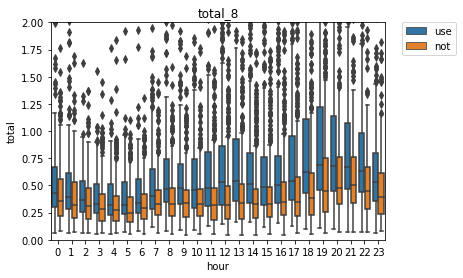

In [102]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_8, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_8')
plt.show()

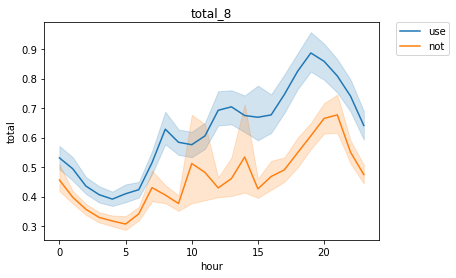

In [103]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_8, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_8')
plt.show()

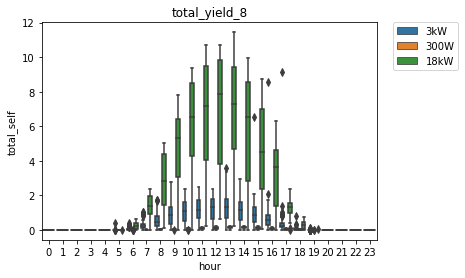

In [104]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_8')
plt.show()

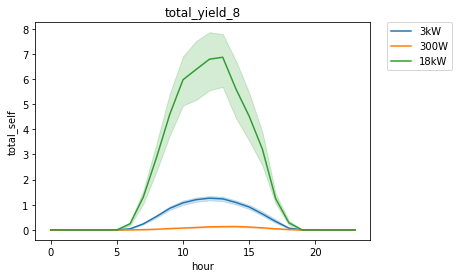

In [105]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_8')
plt.show()

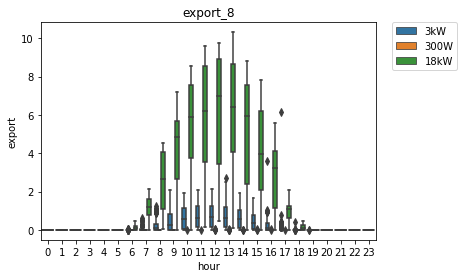

In [106]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_8')
plt.show()

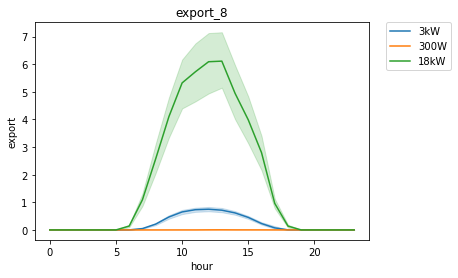

In [107]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_8')
plt.show()

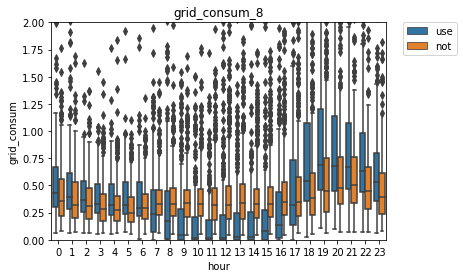

In [108]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_8, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_8')
plt.show()

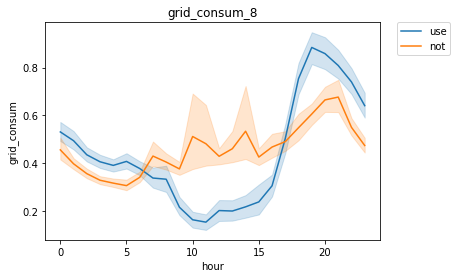

In [109]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_8, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_8')
plt.show()

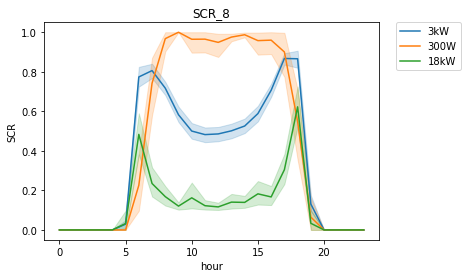

In [110]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_8')
plt.show()

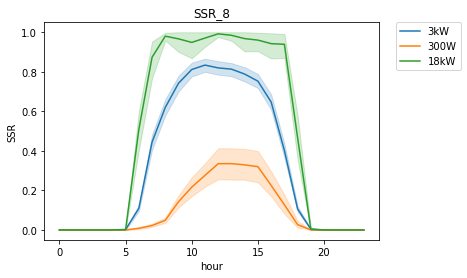

In [111]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_8')
plt.show()

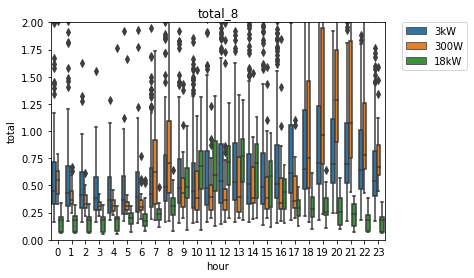

In [112]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_8')
plt.show()

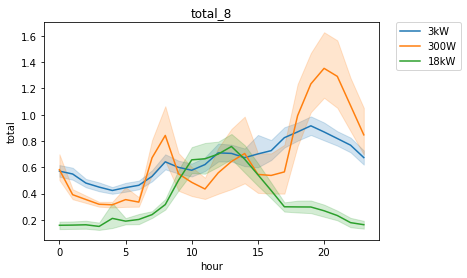

In [113]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_8')
plt.show()

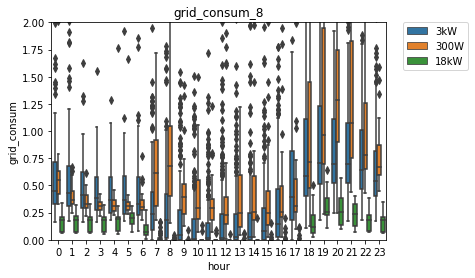

In [114]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_8')
plt.show()

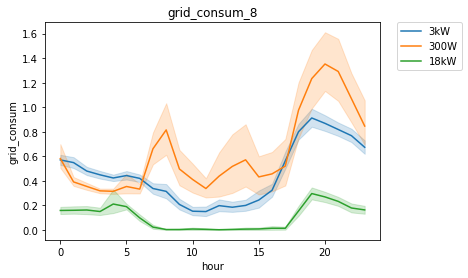

In [115]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_8, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_8')
plt.show()

<hr>

### 2021.09

In [116]:
df_all_hour_21_9 = df_all_hour[df_all_hour.ym == '2021/9']

In [117]:
# 총 전력 소비량
df_all_hour_21_9.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   527.0  0.394874  0.594487  0.080017  0.205017  0.300049  0.424988   
     1   530.0  0.341004  0.260027  0.059998  0.190063  0.280029  0.379883   
     2   530.0  0.314795  0.211493  0.059998  0.179932  0.264954  0.359985   
     3   532.0  0.302749  0.202000  0.049988  0.170044  0.260010  0.339966   
     4   529.0  0.290318  0.186799  0.040039  0.170044  0.250000  0.340088   
     5   533.0  0.285387  0.183867  0.049927  0.170044  0.239990  0.340088   
     6   527.0  0.323333  0.235050  0.059998  0.190063  0.279907  0.379883   
     7   527.0  0.401255  0.367659  0.049988  0.239990  0.320068  0.449951   
     8   529.0  0.379507  0.280244  0.049988  0.209961  0.320068  0.449951   
     9   527.0  0.363877  0.475795  0.050049  0.199951  0.309937  0.410034   
     10  526.0  0.332468  0.244740  0.039917  0.189941  0.279907  0.399994   
     11  525.0  0.324115  0.247972  0.039917  0.170166  0.270020  0.379883   
     12  521.0  0.358964  0.296013  0.039917  0.170044  0.280029  0.439941   
     13  521.0  0.339751  0.261017  0.040039  0.170044  0.270020  0.410034   
     14  520.0  0.435765  1.637302  0.049927  0.189941  0.289917  0.410034   
     15  515.0  0.375755  0.400038  0.059998  0.180054  0.290039  0.400024   
     16  523.0  0.375772  0.297390  0.059998  0.195068  0.299927  0.435059   
     17  521.0  0.398847  0.571819  0.049927  0.189941  0.310059  0.429932   
     18  520.0  0.442621  0.361484  0.059998  0.209961  0.340088  0.549957   
     19  522.0  0.546071  0.542525  0.069946  0.272491  0.390015  0.629974   
     20  523.0  0.511070  0.354012  0.070007  0.300049  0.419922  0.614990   
     21  524.0  0.521622  0.373971  0.080017  0.320068  0.419922  0.579956   
     22  529.0  0.491568  0.459161  0.049988  0.290039  0.380005  0.539917   
     23  526.0  0.398747  0.268327  0.079956  0.220093  0.329895  0.460144   
use  0   295.0  0.454373  0.277266  0.059998  0.260010  0.380005  0.605042   
     1   296.0  0.408834  0.268454  0.049988  0.239990  0.330078  0.530029   
     2   297.0  0.374594  0.219355  0.059998  0.229980  0.309937  0.500000   
     3   292.0  0.352787  0.237750  0.049988  0.219971  0.290039  0.459961   
     4   295.0  0.336717  0.195413  0.059998  0.210083  0.280029  0.440002   
     5   293.0  0.342830  0.193045  0.049988  0.219971  0.280029  0.459961   
     6   294.0  0.414515  0.354100  0.080292  0.230057  0.310059  0.500000   
     7   296.0  0.498513  0.384611  0.109344  0.280029  0.394958  0.592548   
     8   293.0  0.539636  0.296940  0.110809  0.309937  0.469727  0.690186   
     9   295.0  0.491224  0.303342  0.119995  0.270203  0.399902  0.619995   
     10  293.0  0.479679  0.280522  0.119995  0.260010  0.390137  0.649780   
     11  294.0  0.464453  0.308098  0.119141  0.260010  0.364990  0.610031   
     12  293.0  0.537506  0.412623  0.119873  0.270142  0.440063  0.660034   
     13  293.0  0.506223  0.284782  0.129883  0.269897  0.469971  0.649658   
     14  296.0  0.496899  0.371534  0.130127  0.269897  0.409973  0.599834   
     15  297.0  0.466863  0.297635  0.130066  0.269897  0.398438  0.579956   
     16  297.0  0.467857  0.292972  0.090027  0.259949  0.390625  0.589966   
     17  294.0  0.557699  0.715684  0.089050  0.260010  0.449890  0.669968   
     18  293.0  0.591047  0.378931  0.100006  0.320007  0.509888  0.729980   
     19  292.0  0.652995  0.393011  0.089996  0.357498  0.579956  0.889923   
     20  291.0  0.632573  0.387229  0.100006  0.369995  0.560059  0.800049   
     21  293.0  0.640101  0.406125  0.070007  0.359985  0.579956  0.820068   
     22  295.0  0.606542  0.367989  0.059998  0.359985  0.549927  0.839966   
     23  296.0  0.528586  0.324110  0.059998  0.280029  0.494995  0.719971   

               max  
type 시간             
not  0   12.570068  
     1    3.030029  
     2    1.689941  
   

In [118]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_21_9_use = df_all_hour_21_9[df_all_hour_21_9.type == 'use']
df_all_hour_21_9_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.069000  0.015396  0.059998  0.059998  0.069977   
         1    30.0  0.070997  0.015831  0.049988  0.059998  0.070007   
         2    30.0  0.074669  0.019071  0.059998  0.062515  0.070007   
         3    30.0  0.067663  0.009715  0.049988  0.059998  0.069977   
         4    30.0  0.073336  0.010614  0.059998  0.069977  0.070007   
         5    30.0  0.108334  0.027053  0.049988  0.099976  0.100006   
         6    30.0  0.142439  0.048733  0.080292  0.109779  0.129684   
         7    30.0  0.174674  0.048335  0.109344  0.140419  0.160263   
         8    30.0  0.269435  0.096927  0.110809  0.199463  0.265625   
         9    30.0  0.422339  0.150952  0.149414  0.300049  0.400391   
         10   29.0  0.580092  0.241374  0.149872  0.379883  0.639648   
         11   30.0  0.489614  0.258649  0.119141  0.308838  0.495117   
         12   30.0  0.597363  0.242307  0.139648  0.406982  0.609863   
         13   30.0  0.596452  0.264266  0.189453  0.397949  0.570312   
         14   30.0  0.480632  0.215908  0.168945  0.292480  0.449707   
         15   30.0  0.363704  0.161137  0.149414  0.229736  0.355469   
         16   30.0  0.284479  0.123540  0.090027  0.189697  0.299805   
         17   30.0  0.166640  0.058099  0.089050  0.130127  0.150497   
         18   30.0  0.163448  0.046499  0.100006  0.129982  0.160385   
         19   30.0  0.155999  0.058168  0.089996  0.119995  0.134995   
         20   30.0  0.144002  0.051367  0.100006  0.110016  0.120010   
         21   30.0  0.115335  0.025150  0.070007  0.100006  0.110016   
         22   30.0  0.087000  0.018598  0.059998  0.070007  0.089996   
         23   30.0  0.072335  0.009349  0.059998  0.069984  0.070007   
300W     0    30.0  0.559351  0.168130  0.219971  0.459961  0.534912   
         1    30.0  0.406331  0.155524  0.199951  0.300049  0.394897   
         2    30.0  0.313298  0.131309  0.159912  0.242493  0.285034   
         3    30.0  0.279655  0.073239  0.169922  0.239990  0.260010   
         4    30.0  0.277002  0.089123  0.179932  0.220032  0.255005   
         5    30.0  0.269360  0.056504  0.160156  0.232483  0.265015   
         6    30.0  0.329655  0.214101  0.179932  0.232483  0.289917   
         7    30.0  0.521826  0.386491  0.180161  0.309864  0.477417   
         8    30.0  0.782303  0.332891  0.290024  0.525017  0.774994   
         9    30.0  0.451674  0.251285  0.189911  0.274979  0.345078   
         10   30.0  0.469669  0.335069  0.189926  0.242462  0.335022   
         11   30.0  0.422360  0.274268  0.189808  0.222559  0.300171   
         12   29.0  0.461347  0.335077  0.160022  0.239883  0.339935   
         13   30.0  0.448373  0.309856  0.180032  0.232532  0.295120   
         14   30.0  0.348657  0.172330  0.150033  0.202510  0.329987   
         15   30.0  0.391993  0.212276  0.190079  0.247591  0.349953   
         16   30.0  0.493289  0.289029  0.160141  0.264935  0.449883   
         17   30.0  0.598350  0.443718  0.179901  0.257431  0.455009   
         18   30.0  0.622988  0.407295  0.179932  0.340088  0.505005   
         19   30.0  0.801652  0.445806  0.209961  0.482483  0.680054   
         20   30.0  0.780339  0.302075  0.340088  0.562500  0.744995   
         21   30.0  0.944368  0.481968  0.300049  0.657471  0.805054   
         22   30.0  0.876318  0.289736  0.449951  0.692505  0.849976   
         23   30.0  0.732308  0.209252  0.429932  0.599854  0.729980   
3kW      0   235.0  0.490169  0.267051  0.160034  0.280029  0.409912   
         1   236.0  0.452098  0.266461  0.139954  0.260010  0.349976   
         2   237.0  0.420318  0.210177  0.140015  0.260010  0.339966   
         3   232.0  0.399113  0.238985  0.140015  0.239990  0.330078   
         4   235.0  0.377963  0.189526  0.140015  0.229980  0.320068   
         5   233.0  0.382482  0.192421  0.150024  0.2

In [119]:
# 총 전력 생산량
df_all_hour_21_9_use = df_all_hour_21_9[df_all_hour_21_9.type == 'use']
df_all_hour_21_9_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.063737  0.081057  0.000000  0.009766  0.040039   
         7    30.0  0.949447  0.578158  0.029297  0.562500  0.825195   
         8    30.0  2.614453  1.515783  0.019531  1.325439  2.419922   
         9    30.0  4.385384  2.197546  0.820312  2.325439  4.730469   
         10   29.0  5.812736  2.800528  0.410156  3.419922  6.629883   
         11   30.0  6.386947  3.428073  0.830078  3.630127  6.904785   
         12   30.0  5.938444  2.813051  0.750000  3.752441  5.609863   
         13   30.0  5.545736  2.995980  1.119141  2.437256  5.595215   
         14   30.0  5.105632  2.914687  0.830078  2.547363  4.860352   
         15   30.0  4.315365  2.329757  0.860352  2.410400  3.689941   
         16   30.0  2.207813  1.056120  0.059570  1.245117  2.250488   
         17   30.0  0.546549  0.341761  0.000000  0.326904  0.424805   
         18   30.0  0.021777  0.040404  0.000000  0.000000  0.009766   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.008333  0.006989  0.000000  0.000000  0.009995   
         8    30.0  0.022000  0.011567  0.000000  0.019989  0.020004   
         9    30.0  0.044000  0.016733  0.000000  0.032497  0.040009   
         10   30.0  0.051667  0.025335  0.009995  0.032509  0.050003   
         11   30.0  0.104665  0.033297  0.019989  0.099991  0.110001   
         12   29.0  0.148276  0.054514  0.029999  0.099991  0.179993   
         13   30.0  0.160336  0.076451  0.029999  0.119995  0.169998   
         14   30.0  0.141667  0.060177  0.029999  0.119995  0.159996   
         15   30.0  0.117666  0.057457  0.000000  0.082489  0.135002   
         16   30.0  0.079999  0.049270  0.000000  0.027500  0.079994   
         17   30.0  0.038999  0.029752  0.000000  0.012505  0.034996   
         18   30.0  0.002334  0.005685  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   236.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   232.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   233.0  0.000043  0.000656  0.000000  0.0

In [120]:
# 총 전력 수출량
df_all_hour_21_9_use = df_all_hour_21_9[df_all_hour_21_9.type == 'use']
df_all_hour_21_9_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.031966  0.058569  0.000000  0.000000  0.014648   
         7    30.0  0.791439  0.530787  0.000000  0.445312  0.635254   
         8    30.0  2.352018  1.413492  0.000000  1.113037  2.180176   
         9    30.0  3.963379  2.061518  0.589844  2.022949  4.330078   
         10   29.0  5.236092  2.568571  0.269531  3.040039  5.929688   
         11   30.0  5.898665  3.199754  0.650391  3.349854  6.374512   
         12   30.0  5.341081  2.589442  0.610352  3.414795  5.000000   
         13   30.0  4.949284  2.746389  0.910156  2.160156  4.935059   
         14   30.0  4.625000  2.721510  0.620117  2.257324  4.495117   
         15   30.0  3.951660  2.185827  0.699219  2.187500  3.315430   
         16   30.0  1.925000  0.941454  0.019531  1.070312  1.950684   
         17   30.0  0.402246  0.291891  0.000000  0.212402  0.304688   
         18   30.0  0.009993  0.028954  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   30.0  0.003333  0.006065  0.000000  0.000000  0.000000   
         12   29.0  0.007586  0.013271  0.000000  0.000000  0.000000   
         13   30.0  0.008000  0.013746  0.000000  0.000000  0.000000   
         14   30.0  0.008000  0.014716  0.000000  0.000000  0.000000   
         15   30.0  0.002000  0.004842  0.000000  0.000000  0.000000   
         16   30.0  0.001000  0.003051  0.000000  0.000000  0.000000   
         17   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   236.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   232.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   233.0  0.000000  0.000000  0.000000  0.0

In [121]:
# 총 그리드 소비량
df_all_hour_21_9.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   527.0  0.394874  0.594487  0.080017  0.205017  0.300049  0.424988   
     1   530.0  0.341004  0.260027  0.059998  0.190063  0.280029  0.379883   
     2   530.0  0.314795  0.211493  0.059998  0.179932  0.264954  0.359985   
     3   532.0  0.302749  0.202000  0.049988  0.170044  0.260010  0.339966   
     4   529.0  0.290318  0.186799  0.040039  0.170044  0.250000  0.340088   
     5   533.0  0.285387  0.183867  0.049927  0.170044  0.239990  0.340088   
     6   527.0  0.323333  0.235050  0.059998  0.190063  0.279907  0.379883   
     7   527.0  0.401255  0.367659  0.049988  0.239990  0.320068  0.449951   
     8   529.0  0.379507  0.280244  0.049988  0.209961  0.320068  0.449951   
     9   527.0  0.363877  0.475795  0.050049  0.199951  0.309937  0.410034   
     10  526.0  0.332468  0.244740  0.039917  0.189941  0.279907  0.399994   
     11  525.0  0.324115  0.247972  0.039917  0.170166  0.270020  0.379883   
     12  521.0  0.358964  0.296013  0.039917  0.170044  0.280029  0.439941   
     13  521.0  0.339751  0.261017  0.040039  0.170044  0.270020  0.410034   
     14  520.0  0.435765  1.637302  0.049927  0.189941  0.289917  0.410034   
     15  515.0  0.375755  0.400038  0.059998  0.180054  0.290039  0.400024   
     16  523.0  0.375772  0.297390  0.059998  0.195068  0.299927  0.435059   
     17  521.0  0.398847  0.571819  0.049927  0.189941  0.310059  0.429932   
     18  520.0  0.442621  0.361484  0.059998  0.209961  0.340088  0.549957   
     19  522.0  0.546071  0.542525  0.069946  0.272491  0.390015  0.629974   
     20  523.0  0.511070  0.354012  0.070007  0.300049  0.419922  0.614990   
     21  524.0  0.521622  0.373971  0.080017  0.320068  0.419922  0.579956   
     22  529.0  0.491568  0.459161  0.049988  0.290039  0.380005  0.539917   
     23  526.0  0.398747  0.268327  0.079956  0.220093  0.329895  0.460144   
use  0   295.0  0.454373  0.277266  0.059998  0.260010  0.380005  0.605042   
     1   296.0  0.408834  0.268454  0.049988  0.239990  0.330078  0.530029   
     2   297.0  0.374594  0.219355  0.059998  0.229980  0.309937  0.500000   
     3   292.0  0.352787  0.237750  0.049988  0.219971  0.290039  0.459961   
     4   295.0  0.336717  0.195413  0.059998  0.210083  0.280029  0.440002   
     5   293.0  0.342796  0.192963  0.049988  0.219971  0.280029  0.459961   
     6   294.0  0.396579  0.353213  0.029999  0.220032  0.299866  0.497498   
     7   296.0  0.345645  0.385327  0.000000  0.100029  0.239990  0.476135   
     8   293.0  0.251040  0.322161  0.000000  0.010010  0.110107  0.360107   
     9   295.0  0.148442  0.251384  0.000000  0.000000  0.010010  0.205017   
     10  293.0  0.106526  0.213256  0.000000  0.000000  0.010010  0.100098   
     11  294.0  0.089906  0.187898  0.000000  0.000000  0.000000  0.080078   
     12  293.0  0.117954  0.259545  0.000000  0.000000  0.000000  0.089966   
     13  293.0  0.096188  0.203223  0.000000  0.000000  0.010010  0.089844   
     14  296.0  0.106760  0.230729  0.000000  0.000000  0.010010  0.102539   
     15  297.0  0.132395  0.248955  0.000000  0.000000  0.030029  0.159912   
     16  297.0  0.186734  0.247817  0.000000  0.000000  0.079956  0.260010   
     17  294.0  0.393799  0.387993  0.000000  0.120003  0.290039  0.569946   
     18  293.0  0.581249  0.379894  0.070007  0.309937  0.489990  0.729980   
     19  292.0  0.653002  0.393007  0.089996  0.357498  0.579956  0.889923   
     20  291.0  0.632580  0.387226  0.100006  0.369995  0.560059  0.800049   
     21  293.0  0.640108  0.406121  0.070007  0.359985  0.579956  0.820068   
     22  295.0  0.606550  0.367986  0.059998  0.359985  0.549927  0.839966   
     23  296.0  0.528592  0.324109  0.059998  0.280029  0.494995  0.719971   

               max  
type 시간             
not  0   12.570068  
     1    3.030029  
     2    1.689941  
   

In [122]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_9_use = df_all_hour_21_9[df_all_hour_21_9.type == 'use']
df_all_hour_21_9_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.069000  0.015396  0.059998  0.059998  0.069977   
         1    30.0  0.070997  0.015831  0.049988  0.059998  0.070007   
         2    30.0  0.074669  0.019071  0.059998  0.062515  0.070007   
         3    30.0  0.067663  0.009715  0.049988  0.059998  0.069977   
         4    30.0  0.073336  0.010614  0.059998  0.069977  0.070007   
         5    30.0  0.108334  0.027053  0.049988  0.099976  0.100006   
         6    30.0  0.110668  0.050511  0.029999  0.079994  0.100006   
         7    30.0  0.016667  0.026955  0.000000  0.000000  0.000000   
         8    30.0  0.007000  0.034756  0.000000  0.000000  0.000000   
         9    30.0  0.000334  0.001828  0.000000  0.000000  0.000000   
         10   29.0  0.003448  0.015186  0.000000  0.000000  0.000000   
         11   30.0  0.001333  0.007299  0.000000  0.000000  0.000000   
         12   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         16   30.0  0.001666  0.009126  0.000000  0.000000  0.000000   
         17   30.0  0.022337  0.028125  0.000000  0.000000  0.014999   
         18   30.0  0.151664  0.047128  0.070007  0.119995  0.149994   
         19   30.0  0.155999  0.058168  0.089996  0.119995  0.134995   
         20   30.0  0.144002  0.051367  0.100006  0.110016  0.120010   
         21   30.0  0.115335  0.025150  0.070007  0.100006  0.110016   
         22   30.0  0.087000  0.018598  0.059998  0.070007  0.089996   
         23   30.0  0.072335  0.009349  0.059998  0.069984  0.070007   
300W     0    30.0  0.559351  0.168130  0.219971  0.459961  0.534912   
         1    30.0  0.406331  0.155524  0.199951  0.300049  0.394897   
         2    30.0  0.313298  0.131309  0.159912  0.242493  0.285034   
         3    30.0  0.279655  0.073239  0.169922  0.239990  0.260010   
         4    30.0  0.277002  0.089123  0.179932  0.220032  0.255005   
         5    30.0  0.269360  0.056504  0.160156  0.232483  0.265015   
         6    30.0  0.329655  0.214101  0.179932  0.232483  0.289917   
         7    30.0  0.513493  0.386094  0.160156  0.302368  0.477417   
         8    30.0  0.760303  0.332619  0.270020  0.512512  0.744995   
         9    30.0  0.407674  0.251584  0.150146  0.232483  0.320068   
         10   30.0  0.418001  0.334953  0.119873  0.179993  0.290039   
         11   30.0  0.321029  0.275016  0.049805  0.140137  0.195068   
         12   29.0  0.320658  0.331675  0.020020  0.099854  0.209961   
         13   30.0  0.296037  0.313047  0.030029  0.080078  0.169922   
         14   30.0  0.214990  0.171879  0.010010  0.075012  0.160034   
         15   30.0  0.276326  0.215857  0.040039  0.152588  0.229980   
         16   30.0  0.414290  0.282947  0.069824  0.190002  0.359863   
         17   30.0  0.559351  0.443462  0.140137  0.222473  0.390015   
         18   30.0  0.620654  0.409110  0.169922  0.340088  0.505005   
         19   30.0  0.801652  0.445806  0.209961  0.482483  0.680054   
         20   30.0  0.780339  0.302075  0.340088  0.562500  0.744995   
         21   30.0  0.944368  0.481968  0.300049  0.657471  0.805054   
         22   30.0  0.876318  0.289736  0.449951  0.692505  0.849976   
         23   30.0  0.732308  0.209252  0.429932  0.599854  0.729980   
3kW      0   235.0  0.490169  0.267051  0.160034  0.280029  0.409912   
         1   236.0  0.452098  0.266461  0.139954  0.260010  0.349976   
         2   237.0  0.420318  0.210177  0.140015  0.260010  0.339966   
         3   232.0  0.399113  0.238985  0.140015  0.239990  0.330078   
         4   235.0  0.377963  0.189526  0.140015  0.229980  0.320068   
         5   233.0  0.382439  0.192327  0.150024  0.2

In [123]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_9_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.565431  0.346458  0.000000  0.414298  0.512195   
         7    30.0  0.247231  0.190898  0.100671  0.131681  0.185585   
         8    30.0  0.144139  0.165085  0.068566  0.091353  0.101920   
         9    30.0  0.113052  0.047674  0.064117  0.085854  0.094560   
         10   29.0  0.116297  0.057171  0.065356  0.096516  0.101569   
         11   30.0  0.088247  0.039161  0.039248  0.070790  0.078066   
         12   30.0  0.112319  0.045326  0.073351  0.090014  0.096087   
         13   30.0  0.120509  0.037372  0.072859  0.099929  0.110368   
         14   30.0  0.111485  0.046358  0.062025  0.087425  0.097151   
         15   30.0  0.094947  0.029857  0.047828  0.078264  0.089774   
         16   30.0  0.149923  0.101001  0.094146  0.119060  0.130417   
         17   30.0  0.296424  0.117376  0.000000  0.236751  0.300550   
         18   30.0  0.450396  0.474358  0.000000  0.000000  0.288548   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.666667  0.479463  0.000000  0.000000  1.000000   
         8    30.0  0.900000  0.305129  0.000000  1.000000  1.000000   
         9    30.0  0.966667  0.182574  0.000000  1.000000  1.000000   
         10   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   30.0  0.974556  0.044786  0.857158  0.953126  1.000000   
         12   29.0  0.958705  0.071476  0.736846  0.944442  1.000000   
         13   30.0  0.961162  0.065829  0.789475  0.941994  1.000000   
         14   30.0  0.953855  0.082963  0.750006  0.946434  1.000000   
         15   30.0  0.954503  0.182569  0.000000  1.000000  1.000000   
         16   30.0  0.959127  0.182609  0.000000  1.000000  1.000000   
         17   30.0  0.900000  0.305129  0.000000  1.000000  1.000000   
         18   30.0  0.166667  0.379049  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   236.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   232.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   233.0  0.004292  0.065512  0.000000  0.0

In [124]:
# SSR(자가공급률)
df_all_hour_21_9_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.232480  0.187115  0.000000  0.090026  0.218221   
         7    30.0  0.888037  0.185900  0.226575  0.826077  1.000000   
         8    30.0  0.963761  0.167682  0.093213  1.000000  1.000000   
         9    30.0  0.998613  0.007600  0.958376  1.000000  1.000000   
         10   29.0  0.982896  0.070918  0.637344  1.000000  1.000000   
         11   30.0  0.993934  0.033228  0.818005  1.000000  1.000000   
         12   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         16   30.0  0.981492  0.101375  0.444746  1.000000  1.000000   
         17   30.0  0.839590  0.217321  0.000000  0.792497  0.902540   
         18   30.0  0.074302  0.102965  0.000000  0.000000  0.044173   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.021940  0.026282  0.000000  0.000000  0.018565   
         8    30.0  0.033692  0.023434  0.000000  0.017964  0.033257   
         9    30.0  0.123503  0.070007  0.000000  0.069563  0.126390   
         10   30.0  0.153754  0.117371  0.021762  0.062829  0.112265   
         11   30.0  0.319646  0.181266  0.068984  0.152093  0.333212   
         12   29.0  0.422918  0.251231  0.069778  0.209281  0.400171   
         13   30.0  0.450183  0.267430  0.071440  0.183395  0.438644   
         14   30.0  0.457361  0.251012  0.066677  0.256452  0.439880   
         15   30.0  0.348572  0.213056  0.000000  0.212749  0.337771   
         16   30.0  0.210819  0.186456  0.000000  0.083099  0.166664   
         17   30.0  0.101789  0.111051  0.000000  0.027486  0.054871   
         18   30.0  0.008987  0.023658  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   236.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   232.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   233.0  0.000053  0.000810  0.000000  0.0

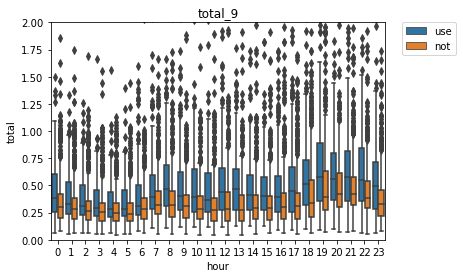

In [125]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_9, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_9')
plt.show()

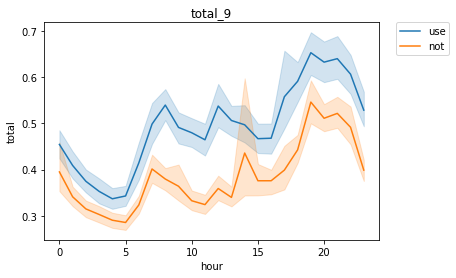

In [126]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_9, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_9')
plt.show()

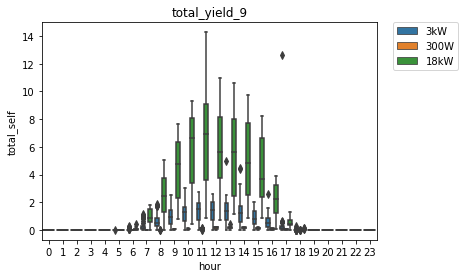

In [127]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_9')
plt.show()

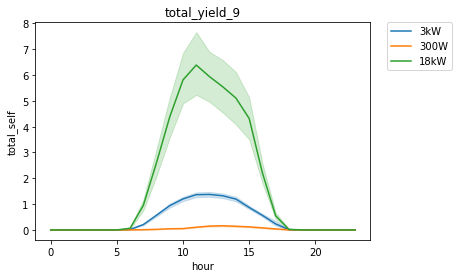

In [128]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_9')
plt.show()

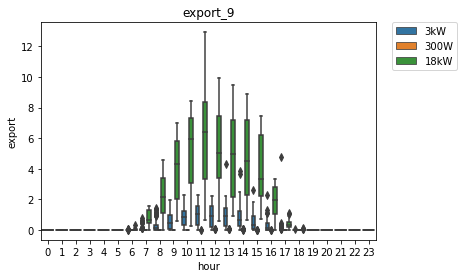

In [129]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_9')
plt.show()

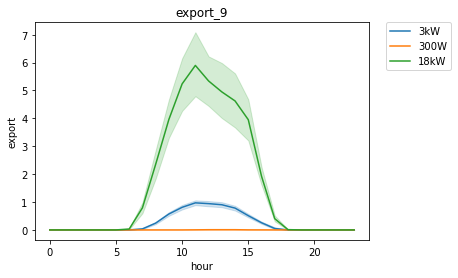

In [130]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_9')
plt.show()

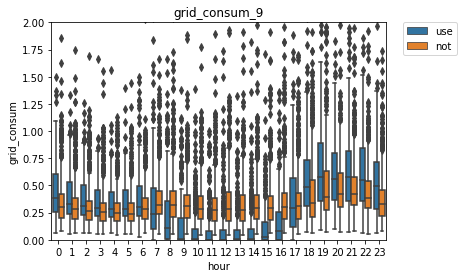

In [131]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_9, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_9')
plt.show()

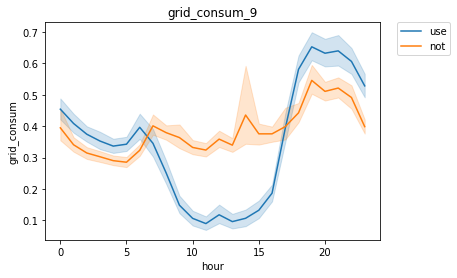

In [132]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_9, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_9')
plt.show()

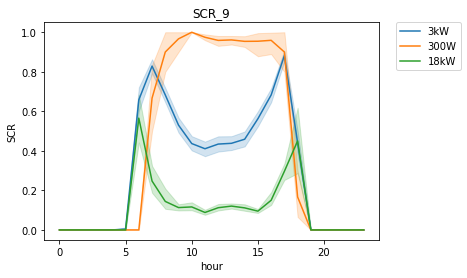

In [133]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_9')
plt.show()

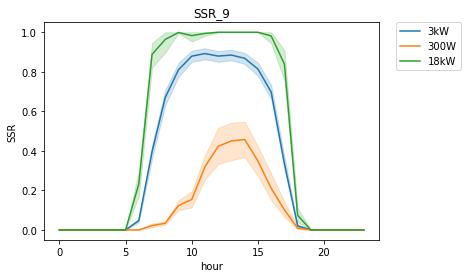

In [134]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_9')
plt.show()

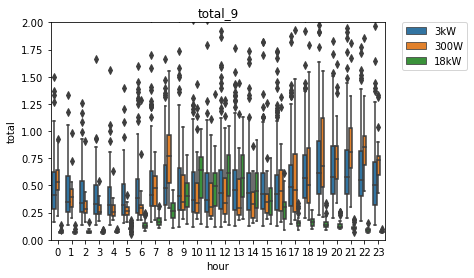

In [135]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_9')
plt.show()

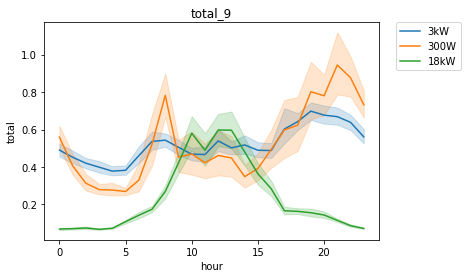

In [136]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_9')
plt.show()

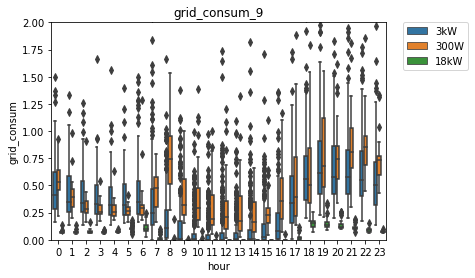

In [137]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_9')
plt.show()

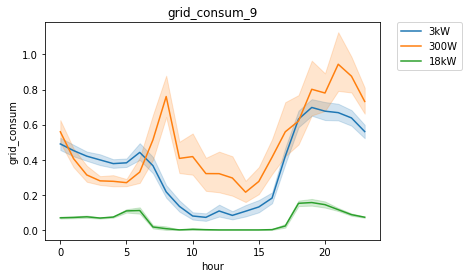

In [138]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_9, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_9')
plt.show()

<hr>

### 2021.10

In [139]:
df_all_hour_21_10 = df_all_hour[df_all_hour.ym == '2021/10']

In [140]:
# 총 전력 소비량
df_all_hour_21_10.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   517.0  0.348377  0.231403  0.029968  0.209961  0.299927  0.410156   
     1   518.0  0.325258  0.237474  0.049988  0.199951  0.280029  0.359985   
     2   517.0  0.305040  0.195725  0.040039  0.190063  0.279785  0.350098   
     3   521.0  0.315369  0.292390  0.039978  0.189941  0.260010  0.349854   
     4   516.0  0.284422  0.199560  0.030029  0.170044  0.250000  0.329987   
     5   517.0  0.306423  0.435893  0.039978  0.160034  0.239990  0.339844   
     6   522.0  0.328623  0.371522  0.029968  0.189941  0.260010  0.377411   
     7   518.0  0.414454  0.726666  0.039978  0.229980  0.320068  0.449951   
     8   525.0  0.326203  0.227225  0.039917  0.190063  0.280029  0.399902   
     9   522.0  0.302784  0.277754  0.029968  0.169952  0.260010  0.359985   
     10  526.0  0.277011  0.178727  0.039917  0.160034  0.239990  0.329956   
     11  511.0  0.289978  0.420730  0.030029  0.140015  0.230103  0.329956   
     12  520.0  0.290595  0.219116  0.029968  0.150024  0.240051  0.339966   
     13  518.0  0.301215  0.430174  0.039978  0.150024  0.229980  0.340088   
     14  515.0  0.300812  0.283764  0.039978  0.159973  0.250000  0.339905   
     15  516.0  0.312056  0.307160  0.039978  0.160034  0.260010  0.350098   
     16  512.0  0.349137  0.476819  0.039917  0.177460  0.269775  0.390137   
     17  514.0  0.362630  0.300295  0.029968  0.179962  0.290039  0.430054   
     18  515.0  0.441687  0.383740  0.039978  0.219971  0.340088  0.515015   
     19  514.0  0.492629  0.470123  0.029968  0.250000  0.359985  0.559906   
     20  514.0  0.475059  0.339521  0.059998  0.299927  0.400024  0.550049   
     21  514.0  0.495077  0.317608  0.039978  0.309937  0.420044  0.597412   
     22  516.0  0.431047  0.258599  0.039978  0.280029  0.370117  0.520020   
     23  515.0  0.378935  0.240986  0.050049  0.230042  0.329956  0.465088   
use  0   307.0  0.481301  0.310934  0.050018  0.240021  0.429932  0.649902   
     1   302.0  0.432645  0.268131  0.049988  0.229980  0.389954  0.573730   
     2   303.0  0.401011  0.300587  0.049988  0.209991  0.349976  0.540039   
     3   301.0  0.375847  0.237781  0.049988  0.209961  0.339966  0.500000   
     4   302.0  0.366375  0.261139  0.040009  0.209961  0.329956  0.479980   
     5   303.0  0.365905  0.224224  0.050018  0.209961  0.339966  0.480042   
     6   301.0  0.392424  0.232931  0.050018  0.220032  0.349976  0.520020   
     7   302.0  0.494649  0.416664  0.078796  0.269806  0.409912  0.580048   
     8   306.0  0.572257  0.338838  0.080078  0.322414  0.489929  0.739960   
     9   307.0  0.509795  0.337165  0.089844  0.269997  0.439911  0.640015   
     10  305.0  0.468774  0.298367  0.079956  0.239990  0.390137  0.610046   
     11  302.0  0.493433  0.366193  0.109863  0.240124  0.390015  0.679779   
     12  301.0  0.534968  0.358753  0.109985  0.269958  0.419922  0.740036   
     13  302.0  0.516999  0.334601  0.080078  0.269806  0.449890  0.679626   
     14  306.0  0.481914  0.331682  0.080200  0.249786  0.390198  0.590164   
     15  303.0  0.450268  0.298895  0.119873  0.250122  0.400024  0.564941   
     16  304.0  0.444151  0.290021  0.080078  0.230469  0.380005  0.559952   
     17  306.0  0.505902  0.371714  0.069275  0.240021  0.419800  0.667572   
     18  305.0  0.594798  0.362359  0.049988  0.330017  0.540039  0.760010   
     19  305.0  0.639818  0.405736  0.049988  0.340027  0.550049  0.830078   
     20  306.0  0.621784  0.403610  0.050018  0.319962  0.550049  0.767517   
     21  300.0  0.626401  0.415750  0.050018  0.320053  0.559875  0.862457   
     22  305.0  0.648212  0.545274  0.049988  0.310059  0.530029  0.820068   
     23  306.0  0.567693  0.405979  0.049988  0.262512  0.489990  0.762512   

               max  
type 시간             
not  0    2.340088  
     1    2.670166  
     2    1.969971  
   

In [141]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_21_10_use = df_all_hour_21_10[df_all_hour_21_10.type == 'use']
df_all_hour_21_10_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.070321  0.020080  0.050018  0.059998  0.069977   
         1    31.0  0.071291  0.020613  0.049988  0.059998  0.070007   
         2    31.0  0.071936  0.021819  0.049988  0.059998  0.070007   
         3    31.0  0.071613  0.021775  0.049988  0.059998  0.069977   
         4    31.0  0.071611  0.024234  0.040009  0.059998  0.070007   
         5    31.0  0.078711  0.020931  0.050018  0.069992  0.070007   
         6    31.0  0.103668  0.047127  0.050018  0.070251  0.099548   
         7    31.0  0.124334  0.033870  0.078796  0.099716  0.119141   
         8    31.0  0.261954  0.086534  0.080078  0.214844  0.250977   
         9    31.0  0.510081  0.185407  0.089844  0.450195  0.589844   
         10   31.0  0.530588  0.207267  0.090820  0.415039  0.579102   
         11   31.0  0.637632  0.224352  0.139648  0.550293  0.729492   
         12   31.0  0.726310  0.269621  0.219727  0.549805  0.789062   
         13   31.0  0.604492  0.257135  0.150391  0.405273  0.659180   
         14   31.0  0.501638  0.216731  0.149414  0.344727  0.509766   
         15   31.0  0.448880  0.171878  0.139648  0.310059  0.468750   
         16   31.0  0.174658  0.067328  0.080078  0.120117  0.150391   
         17   31.0  0.124132  0.043826  0.069275  0.099655  0.110504   
         18   31.0  0.131933  0.072639  0.049988  0.100006  0.119995   
         19   31.0  0.128385  0.055503  0.049988  0.099991  0.110016   
         20   31.0  0.119032  0.050751  0.050018  0.090012  0.109985   
         21   31.0  0.100968  0.043615  0.050018  0.070007  0.100006   
         22   31.0  0.086449  0.031366  0.049988  0.059998  0.079987   
         23   31.0  0.076453  0.025631  0.049988  0.059998  0.070007   
300W     0    31.0  0.621598  0.300303  0.219971  0.420166  0.569824   
         1    31.0  0.428561  0.184125  0.149902  0.324951  0.400146   
         2    31.0  0.344191  0.145489  0.150146  0.239990  0.310059   
         3    31.0  0.303223  0.130437  0.129883  0.205078  0.270020   
         4    31.0  0.283258  0.106214  0.120117  0.200073  0.239990   
         5    31.0  0.290921  0.105583  0.149902  0.199951  0.270020   
         6    31.0  0.329054  0.148804  0.180176  0.239990  0.270020   
         7    31.0  0.433551  0.205627  0.179932  0.285034  0.399902   
         8    31.0  0.834489  0.408629  0.169907  0.535019  0.770020   
         9    31.0  0.594520  0.449721  0.210159  0.284874  0.370102   
         10   31.0  0.447099  0.305376  0.120087  0.244942  0.350037   
         11   31.0  0.488555  0.358130  0.200104  0.245171  0.299988   
         12   31.0  0.496886  0.376927  0.150007  0.244987  0.359940   
         13   31.0  0.516115  0.427313  0.150007  0.234940  0.339890   
         14   31.0  0.559344  0.453944  0.110071  0.219940  0.369934   
         15   31.0  0.462256  0.288670  0.150008  0.250046  0.430054   
         16   31.0  0.520345  0.430271  0.129816  0.234970  0.370087   
         17   31.0  0.537074  0.628057  0.140137  0.234978  0.320068   
         18   30.0  0.529818  0.362860  0.129883  0.244995  0.439941   
         19   31.0  0.811287  0.421807  0.180176  0.530029  0.729980   
         20   31.0  0.833236  0.418715  0.189941  0.519897  0.770020   
         21   31.0  0.862250  0.315256  0.320068  0.704956  0.869873   
         22   31.0  0.859375  0.366971  0.329834  0.595093  0.770020   
         23   31.0  0.831126  0.354355  0.380127  0.567261  0.780029   
3kW      0   245.0  0.515551  0.291498  0.149902  0.280029  0.439941   
         1   240.0  0.479847  0.258959  0.159973  0.260010  0.410095   
         2   241.0  0.450649  0.306773  0.140015  0.269897  0.399902   
         3   239.0  0.424728  0.232211  0.130005  0.250000  0.389893   
         4   240.0  0.415184  0.264265  0.140015  0.240036  0.375061   
         5   241.0  0.412492  0.219674  0.130005  0.2

In [142]:
# 총 전력 생산량
df_all_hour_21_10_use = df_all_hour_21_10[df_all_hour_21_10.type == 'use']
df_all_hour_21_10_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.007529  0.011314  0.000000  0.000000  0.000000   
         7    31.0  0.838678  0.395424  0.019531  0.574707  0.920898   
         8    31.0  3.211253  1.283369  0.250000  2.245117  3.810547   
         9    31.0  5.723318  2.035658  0.290039  5.915039  6.540039   
         10   31.0  7.252583  2.703405  0.430664  7.180176  8.500000   
         11   31.0  8.058625  2.966031  0.540039  7.584961  9.509766   
         12   31.0  7.924427  3.141165  1.269531  5.739746  9.370117   
         13   31.0  7.297316  3.180764  0.899414  5.609863  8.540039   
         14   31.0  6.269689  2.868720  0.890625  4.440430  7.789062   
         15   31.0  4.647366  2.181551  0.440430  3.084961  5.410156   
         16   31.0  1.333953  0.708604  0.000000  0.854980  1.219727   
         17   31.0  0.114762  0.122998  0.000000  0.015137  0.049805   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.002903  0.004613  0.000000  0.000000  0.000000   
         8    31.0  0.015807  0.009230  0.000000  0.009995  0.020004   
         9    31.0  0.033871  0.012826  0.000000  0.025002  0.029999   
         10   31.0  0.040967  0.018506  0.009995  0.025002  0.040009   
         11   31.0  0.062742  0.020969  0.020004  0.050003  0.059998   
         12   31.0  0.137096  0.063046  0.009995  0.080002  0.160004   
         13   31.0  0.131613  0.070195  0.009995  0.069992  0.160004   
         14   31.0  0.114840  0.071314  0.000000  0.044998  0.139999   
         15   31.0  0.094193  0.056673  0.000000  0.040009  0.089996   
         16   31.0  0.046775  0.035720  0.000000  0.020004  0.040009   
         17   31.0  0.003226  0.007477  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.000000  0.000000  0.000000  0.0

In [143]:
# 총 전력 수출량
df_all_hour_21_10_use = df_all_hour_21_10[df_all_hour_21_10.type == 'use']
df_all_hour_21_10_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.001607  0.004570  0.000000  0.000000  0.000000   
         7    31.0  0.724987  0.363463  0.010742  0.484863  0.810547   
         8    31.0  2.949943  1.209706  0.160156  2.040039  3.509766   
         9    31.0  5.213237  1.878608  0.200195  5.339844  5.910156   
         10   31.0  6.721995  2.523659  0.339844  6.700195  7.860352   
         11   31.0  7.420993  2.762938  0.400391  6.905273  8.729492   
         12   31.0  7.198116  2.886316  1.030273  5.189941  8.540039   
         13   31.0  6.692824  2.956546  0.739258  5.215332  8.000000   
         14   31.0  5.768051  2.684790  0.659180  4.055176  7.459961   
         15   31.0  4.198809  2.017969  0.269531  2.774902  4.969727   
         16   31.0  1.165102  0.642579  0.000000  0.699707  1.080078   
         17   31.0  0.078692  0.096364  0.000000  0.000000  0.029297   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.005484  0.013125  0.000000  0.000000  0.000000   
         13   31.0  0.004194  0.012322  0.000000  0.000000  0.000000   
         14   31.0  0.003226  0.009087  0.000000  0.000000  0.000000   
         15   31.0  0.001290  0.005623  0.000000  0.000000  0.000000   
         16   31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         17   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.000000  0.000000  0.000000  0.0

In [144]:
# 총 그리드 소비량
df_all_hour_21_10.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   517.0  0.348377  0.231403  0.029968  0.209961  0.299927  0.410156   
     1   518.0  0.325258  0.237474  0.049988  0.199951  0.280029  0.359985   
     2   517.0  0.305040  0.195725  0.040039  0.190063  0.279785  0.350098   
     3   521.0  0.315369  0.292390  0.039978  0.189941  0.260010  0.349854   
     4   516.0  0.284422  0.199560  0.030029  0.170044  0.250000  0.329987   
     5   517.0  0.306423  0.435893  0.039978  0.160034  0.239990  0.339844   
     6   522.0  0.328623  0.371522  0.029968  0.189941  0.260010  0.377411   
     7   518.0  0.414454  0.726666  0.039978  0.229980  0.320068  0.449951   
     8   525.0  0.326203  0.227225  0.039917  0.190063  0.280029  0.399902   
     9   522.0  0.302784  0.277754  0.029968  0.169952  0.260010  0.359985   
     10  526.0  0.277011  0.178727  0.039917  0.160034  0.239990  0.329956   
     11  511.0  0.289978  0.420730  0.030029  0.140015  0.230103  0.329956   
     12  520.0  0.290595  0.219116  0.029968  0.150024  0.240051  0.339966   
     13  518.0  0.301215  0.430174  0.039978  0.150024  0.229980  0.340088   
     14  515.0  0.300812  0.283764  0.039978  0.159973  0.250000  0.339905   
     15  516.0  0.312056  0.307160  0.039978  0.160034  0.260010  0.350098   
     16  512.0  0.349137  0.476819  0.039917  0.177460  0.269775  0.390137   
     17  514.0  0.362630  0.300295  0.029968  0.179962  0.290039  0.430054   
     18  515.0  0.441687  0.383740  0.039978  0.219971  0.340088  0.515015   
     19  514.0  0.492629  0.470123  0.029968  0.250000  0.359985  0.559906   
     20  514.0  0.475059  0.339521  0.059998  0.299927  0.400024  0.550049   
     21  514.0  0.495077  0.317608  0.039978  0.309937  0.420044  0.597412   
     22  516.0  0.431047  0.258599  0.039978  0.280029  0.370117  0.520020   
     23  515.0  0.378935  0.240986  0.050049  0.230042  0.329956  0.465088   
use  0   307.0  0.481301  0.310934  0.050018  0.240021  0.429932  0.649902   
     1   302.0  0.432645  0.268131  0.049988  0.229980  0.389954  0.573730   
     2   303.0  0.401011  0.300587  0.049988  0.209991  0.349976  0.540039   
     3   301.0  0.375847  0.237781  0.049988  0.209961  0.339966  0.500000   
     4   302.0  0.366375  0.261139  0.040009  0.209961  0.329956  0.479980   
     5   303.0  0.365905  0.224224  0.050018  0.209961  0.339966  0.480042   
     6   301.0  0.389754  0.233159  0.050018  0.219971  0.349976  0.519775   
     7   302.0  0.377284  0.419379  0.000000  0.160034  0.274963  0.479980   
     8   306.0  0.271599  0.341768  0.000000  0.010010  0.140015  0.427460   
     9   307.0  0.145277  0.299007  0.000000  0.000000  0.010010  0.169922   
     10  305.0  0.092245  0.211820  0.000000  0.000000  0.000000  0.070068   
     11  302.0  0.102151  0.292958  0.000000  0.000000  0.000000  0.050018   
     12  301.0  0.090709  0.213697  0.000000  0.000000  0.000000  0.050049   
     13  302.0  0.100097  0.228174  0.000000  0.000000  0.000000  0.080078   
     14  306.0  0.110160  0.269083  0.000000  0.000000  0.000000  0.069916   
     15  303.0  0.125563  0.236145  0.000000  0.000000  0.010010  0.170044   
     16  304.0  0.241596  0.293467  0.000000  0.029907  0.144958  0.362457   
     17  306.0  0.457583  0.374259  0.010010  0.190018  0.365051  0.617493   
     18  305.0  0.594699  0.362246  0.049988  0.330017  0.540039  0.760010   
     19  305.0  0.639818  0.405736  0.049988  0.340027  0.550049  0.830078   
     20  306.0  0.621784  0.403610  0.050018  0.319962  0.550049  0.767517   
     21  300.0  0.626401  0.415750  0.050018  0.320053  0.559875  0.862457   
     22  305.0  0.648212  0.545274  0.049988  0.310059  0.530029  0.820068   
     23  306.0  0.567693  0.405979  0.049988  0.262512  0.489990  0.762512   

               max  
type 시간             
not  0    2.340088  
     1    2.670166  
     2    1.969971  
   

In [145]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_10_use = df_all_hour_21_10[df_all_hour_21_10.type == 'use']
df_all_hour_21_10_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.070321  0.020080  0.050018  0.059998  0.069977   
         1    31.0  0.071291  0.020613  0.049988  0.059998  0.070007   
         2    31.0  0.071936  0.021819  0.049988  0.059998  0.070007   
         3    31.0  0.071613  0.021775  0.049988  0.059998  0.069977   
         4    31.0  0.071611  0.024234  0.040009  0.059998  0.070007   
         5    31.0  0.078711  0.020931  0.050018  0.069992  0.070007   
         6    31.0  0.097746  0.045587  0.050018  0.059998  0.089996   
         7    31.0  0.010643  0.019311  0.000000  0.000000  0.000000   
         8    31.0  0.000645  0.003590  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   31.0  0.000323  0.001798  0.000000  0.000000  0.000000   
         16   31.0  0.005807  0.021874  0.000000  0.000000  0.000000   
         17   31.0  0.088062  0.052309  0.010010  0.044983  0.089996   
         18   31.0  0.131933  0.072639  0.049988  0.100006  0.119995   
         19   31.0  0.128385  0.055503  0.049988  0.099991  0.110016   
         20   31.0  0.119032  0.050751  0.050018  0.090012  0.109985   
         21   31.0  0.100968  0.043615  0.050018  0.070007  0.100006   
         22   31.0  0.086449  0.031366  0.049988  0.059998  0.079987   
         23   31.0  0.076453  0.025631  0.049988  0.059998  0.070007   
300W     0    31.0  0.621598  0.300303  0.219971  0.420166  0.569824   
         1    31.0  0.428561  0.184125  0.149902  0.324951  0.400146   
         2    31.0  0.344191  0.145489  0.150146  0.239990  0.310059   
         3    31.0  0.303223  0.130437  0.129883  0.205078  0.270020   
         4    31.0  0.283258  0.106214  0.120117  0.200073  0.239990   
         5    31.0  0.290921  0.105583  0.149902  0.199951  0.270020   
         6    31.0  0.329054  0.148804  0.180176  0.239990  0.270020   
         7    31.0  0.430648  0.204935  0.179932  0.285034  0.399902   
         8    31.0  0.818682  0.409858  0.159912  0.515015  0.770020   
         9    31.0  0.560649  0.449009  0.170166  0.254883  0.350098   
         10   31.0  0.406132  0.304222  0.090088  0.210083  0.290039   
         11   31.0  0.425813  0.355395  0.100098  0.180054  0.239990   
         12   31.0  0.365274  0.377027  0.010010  0.159912  0.209961   
         13   31.0  0.388696  0.409447  0.000000  0.125000  0.229980   
         14   31.0  0.447730  0.427983  0.020020  0.165039  0.229980   
         15   31.0  0.369353  0.280370  0.020020  0.175049  0.310059   
         16   31.0  0.473893  0.421356  0.059814  0.199951  0.300049   
         17   31.0  0.533849  0.628012  0.140137  0.229980  0.320068   
         18   30.0  0.529818  0.362860  0.129883  0.244995  0.439941   
         19   31.0  0.811287  0.421807  0.180176  0.530029  0.729980   
         20   31.0  0.833236  0.418715  0.189941  0.519897  0.770020   
         21   31.0  0.862250  0.315256  0.320068  0.704956  0.869873   
         22   31.0  0.859375  0.366971  0.329834  0.595093  0.770020   
         23   31.0  0.831126  0.354355  0.380127  0.567261  0.780029   
3kW      0   245.0  0.515551  0.291498  0.149902  0.280029  0.439941   
         1   240.0  0.479847  0.258959  0.159973  0.260010  0.410095   
         2   241.0  0.450649  0.306773  0.140015  0.269897  0.399902   
         3   239.0  0.424728  0.232211  0.130005  0.250000  0.389893   
         4   240.0  0.415184  0.264265  0.140015  0.240036  0.375061   
         5   241.0  0.412492  0.219674  0.130005  0.2

In [146]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_10_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.384559  0.472020  0.000000  0.000000  0.000000   
         7    31.0  0.163374  0.080822  0.082966  0.113824  0.149231   
         8    31.0  0.096836  0.055761  0.056933  0.067953  0.087278   
         9    31.0  0.098246  0.042803  0.036874  0.085449  0.093730   
         10   31.0  0.079023  0.028233  0.042635  0.065285  0.071002   
         11   31.0  0.086050  0.033743  0.051621  0.078302  0.081979   
         12   31.0  0.096167  0.020295  0.070641  0.084397  0.094704   
         13   31.0  0.091587  0.032463  0.054996  0.071493  0.082120   
         14   31.0  0.092050  0.039778  0.040873  0.074506  0.087024   
         15   31.0  0.114983  0.061560  0.070516  0.090408  0.098619   
         16   31.0  0.136543  0.057442  0.000000  0.103097  0.124206   
         17   31.0  0.476322  0.348834  0.000000  0.252607  0.299020   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.290323  0.461414  0.000000  0.000000  0.000000   
         8    31.0  0.870968  0.340777  0.000000  1.000000  1.000000   
         9    31.0  0.967742  0.179605  0.000000  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  0.967681  0.069716  0.699996  0.974999  1.000000   
         13   31.0  0.977026  0.064568  0.714294  1.000000  1.000000   
         14   31.0  0.946793  0.184011  0.000000  1.000000  1.000000   
         15   31.0  0.926747  0.250051  0.000000  1.000000  1.000000   
         16   31.0  0.834677  0.372753  0.000000  1.000000  1.000000   
         17   31.0  0.193548  0.401610  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.000000  0.000000  0.000000  0.0

In [147]:
# SSR(자가공급률)
df_all_hour_21_10_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.056186  0.077148  0.000000  0.000000  0.000000   
         7    31.0  0.897365  0.205932  0.111541  0.904358  1.000000   
         8    31.0  0.994129  0.032687  0.818005  1.000000  1.000000   
         9    31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   31.0  0.998215  0.009938  0.944669  1.000000  1.000000   
         16   31.0  0.953129  0.181837  0.000000  1.000000  1.000000   
         17   31.0  0.322248  0.270464  0.000000  0.100086  0.222373   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.006471  0.010854  0.000000  0.000000  0.000000   
         8    31.0  0.026101  0.021239  0.000000  0.011395  0.022719   
         9    31.0  0.083398  0.055420  0.000000  0.036039  0.071403   
         10   31.0  0.123513  0.075223  0.020839  0.057179  0.117658   
         11   31.0  0.182858  0.112100  0.024590  0.080127  0.178593   
         12   31.0  0.378488  0.253835  0.013877  0.219183  0.315778   
         13   31.0  0.346815  0.257423  0.028177  0.139602  0.318299   
         14   31.0  0.282770  0.244988  0.000000  0.107837  0.165145   
         15   31.0  0.249144  0.198389  0.000000  0.132858  0.258663   
         16   31.0  0.136609  0.147057  0.000000  0.043037  0.079944   
         17   31.0  0.010235  0.023318  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   241.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   240.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   241.0  0.000000  0.000000  0.000000  0.0

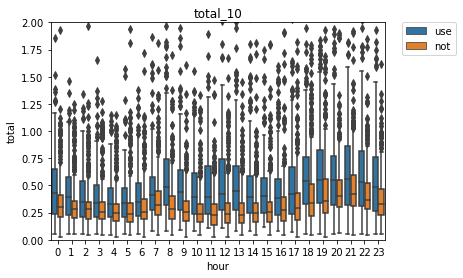

In [148]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_10, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_10')
plt.show()

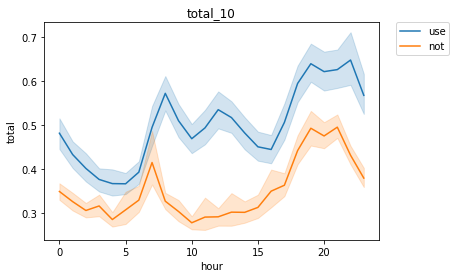

In [149]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_10, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_10')
plt.show()

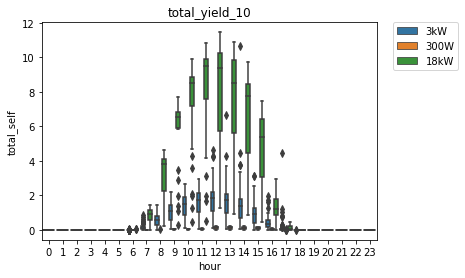

In [150]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_10')
plt.show()

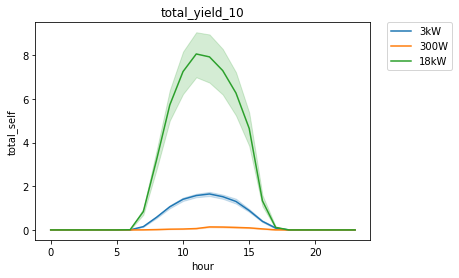

In [151]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_10')
plt.show()

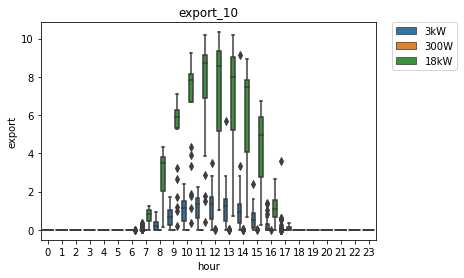

In [152]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_10')
plt.show()

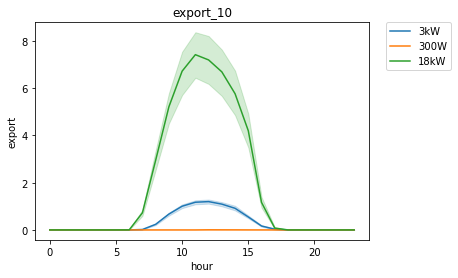

In [153]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_10')
plt.show()

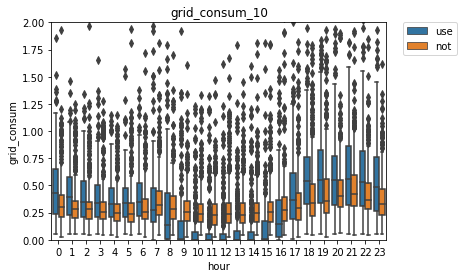

In [154]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_10, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_10')
plt.show()

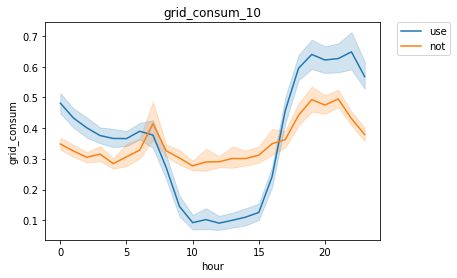

In [155]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_10, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_10')
plt.show()

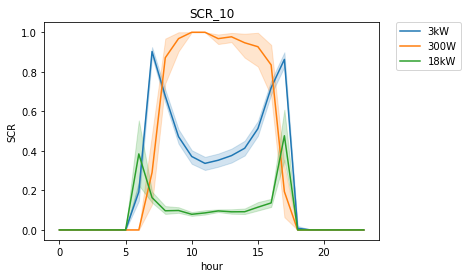

In [156]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_10')
plt.show()

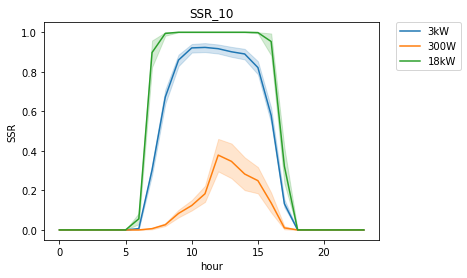

In [157]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_10')
plt.show()

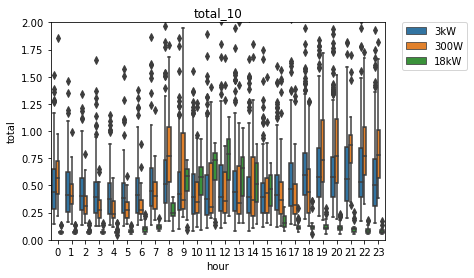

In [158]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_10')
plt.show()

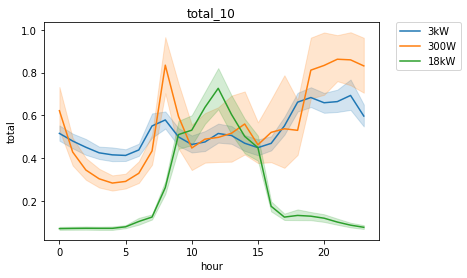

In [159]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_10')
plt.show()

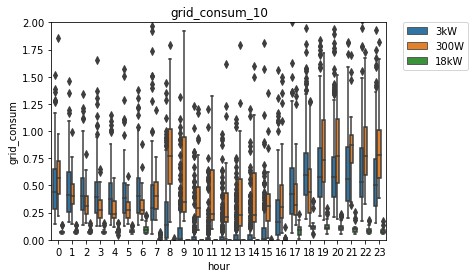

In [160]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_10')
plt.show()

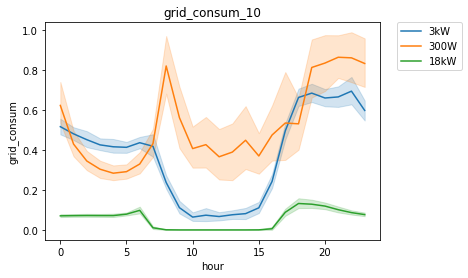

In [161]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_10, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_10')
plt.show()

<hr>

### 2021.11

In [162]:
df_all_hour_21_11 = df_all_hour[df_all_hour.ym == '2021/11']

In [163]:
# 총 전력 소비량
df_all_hour_21_11.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   521.0  0.368153  0.212402  0.049988  0.229980  0.320068  0.440186   
     1   521.0  0.347519  0.202099  0.039978  0.219971  0.300049  0.400146   
     2   518.0  0.332352  0.187283  0.030029  0.219971  0.299957  0.380005   
     3   517.0  0.322590  0.194081  0.049988  0.200195  0.280029  0.380005   
     4   518.0  0.318475  0.193069  0.039978  0.190018  0.280029  0.379974   
     5   513.0  0.315847  0.204180  0.030029  0.180054  0.260010  0.380005   
     6   511.0  0.340661  0.208888  0.029968  0.209961  0.290039  0.419922   
     7   510.0  0.396004  0.228281  0.020020  0.239990  0.360107  0.479980   
     8   515.0  0.382909  0.578590  0.019958  0.219971  0.310059  0.439941   
     9   511.0  0.309373  0.205184  0.019958  0.180115  0.279785  0.380127   
     10  513.0  0.304679  0.506135  0.029968  0.179932  0.250000  0.339966   
     11  508.0  0.290274  0.204470  0.030029  0.169922  0.240051  0.342529   
     12  510.0  0.319337  0.316182  0.020020  0.169922  0.239990  0.360107   
     13  511.0  0.393166  1.754714  0.020020  0.160156  0.250000  0.360107   
     14  512.0  0.297304  0.298319  0.019958  0.159912  0.239990  0.349854   
     15  516.0  0.344126  0.792024  0.019958  0.167480  0.250000  0.359985   
     16  517.0  0.328862  0.327481  0.020020  0.189941  0.270020  0.379883   
     17  521.0  0.409667  0.394094  0.029968  0.209961  0.320068  0.479980   
     18  515.0  0.515362  0.501621  0.030029  0.260010  0.389893  0.579956   
     19  518.0  0.544128  0.521597  0.019958  0.289917  0.399902  0.580078   
     20  510.0  0.506887  0.319321  0.049927  0.319946  0.439941  0.589935   
     21  520.0  0.509545  0.412358  0.039978  0.330002  0.429932  0.580078   
     22  518.0  0.475684  0.571500  0.020020  0.300049  0.389893  0.550049   
     23  519.0  0.403357  0.233518  0.030029  0.250000  0.350098  0.489990   
use  0   294.0  0.530812  0.311660  0.059998  0.302551  0.510010  0.707458   
     1   295.0  0.472240  0.286647  0.059998  0.270020  0.440186  0.625000   
     2   297.0  0.424377  0.238041  0.059998  0.250000  0.409912  0.564941   
     3   295.0  0.400878  0.204610  0.059998  0.260010  0.389893  0.540039   
     4   295.0  0.409524  0.224084  0.059998  0.250000  0.390015  0.539917   
     5   296.0  0.410405  0.232050  0.059998  0.250000  0.404968  0.530029   
     6   295.0  0.471979  0.346153  0.069977  0.250000  0.410034  0.580017   
     7   292.0  0.553132  0.448809  0.080261  0.317474  0.475037  0.662506   
     8   292.0  0.601749  0.352009  0.120117  0.330383  0.539856  0.752563   
     9   298.0  0.509572  0.309080  0.109863  0.269829  0.459961  0.680145   
     10  299.0  0.476972  0.307129  0.079834  0.220032  0.440063  0.640259   
     11  295.0  0.501223  0.360008  0.079956  0.219810  0.449951  0.680054   
     12  293.0  0.501192  0.324386  0.109344  0.220072  0.440063  0.679901   
     13  295.0  0.500492  0.336095  0.090088  0.254883  0.450073  0.649902   
     14  295.0  0.471741  0.265857  0.100098  0.244995  0.440186  0.629395   
     15  296.0  0.444823  0.266213  0.089966  0.230164  0.390625  0.579987   
     16  299.0  0.482046  0.603680  0.070557  0.209953  0.400024  0.594971   
     17  296.0  0.572147  0.392555  0.070007  0.300018  0.500000  0.739990   
     18  294.0  0.721704  0.433105  0.070007  0.439941  0.669922  0.897430   
     19  295.0  0.740667  0.460656  0.089996  0.410034  0.650024  0.934937   
     20  297.0  0.709884  0.503678  0.089996  0.409912  0.609985  0.919922   
     21  295.0  0.696253  0.411125  0.079987  0.394958  0.629883  0.969971   
     22  295.0  0.662791  0.390850  0.059998  0.355042  0.629883  0.895081   
     23  293.0  0.607603  0.383845  0.059998  0.329956  0.560059  0.794922   

               max  
type 시간             
not  0    1.609863  
     1    1.149902  
     2    1.179932  
   

In [164]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_21_11_use = df_all_hour_21_11[df_all_hour_21_11.type == 'use']
df_all_hour_21_11_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.075333  0.014794  0.059998  0.069984  0.070007   
         1    30.0  0.077334  0.016382  0.059998  0.070007  0.070007   
         2    30.0  0.077002  0.014180  0.059998  0.070007  0.070007   
         3    30.0  0.078997  0.020403  0.059998  0.069984  0.074997   
         4    30.0  0.075333  0.015700  0.059998  0.069977  0.070007   
         5    30.0  0.079000  0.021712  0.059998  0.070007  0.070007   
         6    30.0  0.163996  0.067243  0.069977  0.102509  0.164993   
         7    30.0  0.129512  0.042535  0.080261  0.100609  0.115067   
         8    30.0  0.236402  0.061330  0.120117  0.190430  0.235352   
         9    30.0  0.425372  0.132086  0.150391  0.349609  0.425293   
         10   30.0  0.508387  0.162661  0.079834  0.474609  0.535156   
         11   30.0  0.742385  0.196655  0.170105  0.652588  0.770020   
         12   30.0  0.631303  0.209241  0.109344  0.529541  0.590332   
         13   30.0  0.591908  0.162334  0.199890  0.491943  0.589844   
         14   30.0  0.554748  0.171661  0.121033  0.492676  0.620117   
         15   30.0  0.319013  0.127411  0.110260  0.228271  0.330078   
         16   30.0  0.140598  0.072118  0.070557  0.102783  0.119843   
         17   30.0  0.136968  0.070494  0.070007  0.089813  0.110001   
         18   30.0  0.132670  0.065860  0.070007  0.090004  0.100006   
         19   30.0  0.132333  0.059635  0.089996  0.100006  0.109985   
         20   30.0  0.124332  0.040992  0.089996  0.100006  0.109985   
         21   30.0  0.109668  0.037182  0.079987  0.089996  0.100006   
         22   30.0  0.090668  0.030281  0.059998  0.070007  0.079987   
         23   30.0  0.087329  0.043148  0.059998  0.069977  0.070007   
300W     0    30.0  0.601302  0.204522  0.289795  0.462463  0.554932   
         1    30.0  0.471346  0.162543  0.239990  0.370117  0.449951   
         2    30.0  0.385335  0.128358  0.239990  0.322510  0.350098   
         3    30.0  0.376343  0.125034  0.260010  0.320068  0.339966   
         4    30.0  0.402669  0.253735  0.180176  0.302490  0.339966   
         5    30.0  0.374333  0.214428  0.229980  0.300049  0.340088   
         6    30.0  0.445312  0.195064  0.260010  0.329895  0.384888   
         7    30.0  0.534684  0.227614  0.200195  0.355103  0.520020   
         8    30.0  0.623316  0.457974  0.219955  0.372604  0.449944   
         9    30.0  0.440021  0.325708  0.159897  0.212452  0.280006   
         10   30.0  0.454993  0.412370  0.130096  0.182594  0.249969   
         11   30.0  0.440656  0.368893  0.129807  0.189869  0.229912   
         12   30.0  0.415334  0.360572  0.140048  0.190050  0.240097   
         13   30.0  0.459356  0.447809  0.120018  0.199945  0.245000   
         14   30.0  0.358327  0.223682  0.110019  0.192421  0.289932   
         15   30.0  0.384003  0.276401  0.150034  0.192394  0.289978   
         16   30.0  0.337985  0.204755  0.119873  0.182602  0.275009   
         17   30.0  0.493351  0.515517  0.130127  0.189941  0.300049   
         18   30.0  0.735677  0.508460  0.149902  0.362366  0.555054   
         19   30.0  0.874015  0.390427  0.100098  0.632446  0.869873   
         20   30.0  0.747469  0.337705  0.099854  0.540039  0.740112   
         21   30.0  0.931348  0.310979  0.530029  0.712463  0.915161   
         22   30.0  0.946004  0.274193  0.510010  0.752502  0.880005   
         23   30.0  0.845353  0.365200  0.320068  0.629883  0.730103   
3kW      0   234.0  0.580169  0.295149  0.150024  0.352478  0.529907   
         1   235.0  0.522768  0.278154  0.150024  0.300049  0.475098   
         2   237.0  0.473290  0.226019  0.149902  0.300049  0.469971   
         3   235.0  0.445101  0.187848  0.149902  0.310059  0.439941   
         4   235.0  0.453062  0.197108  0.150024  0.299927  0.440186   
         5   236.0  0.457118  0.213272  0.139893  0.2

In [165]:
# 총 전력 생산량
df_all_hour_21_11_use = df_all_hour_21_11[df_all_hour_21_11.type == 'use']
df_all_hour_21_11_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.350781  0.230774  0.000000  0.162598  0.310059   
         8    30.0  2.414388  0.906515  0.000000  2.130127  2.770508   
         9    30.0  4.707096  1.663052  0.009766  4.115234  5.500000   
         10   30.0  6.499349  2.330893  0.030273  6.147705  7.549805   
         11   30.0  7.795117  2.391872  0.090820  7.014893  8.819824   
         12   30.0  7.661361  2.709703  0.239258  5.893066  8.955078   
         13   30.0  7.258073  2.485588  0.020508  6.461914  8.400391   
         14   30.0  5.720052  2.325683  0.080078  4.765137  6.470215   
         15   30.0  3.292643  1.634514  0.049805  2.087646  4.015137   
         16   30.0  0.540234  0.194040  0.059570  0.469727  0.575195   
         17   30.0  0.003288  0.006017  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.010003  0.006949  0.000000  0.009995  0.010010   
         9    30.0  0.025332  0.013829  0.000000  0.012505  0.029999   
         10   30.0  0.037333  0.015522  0.000000  0.029999  0.039993   
         11   30.0  0.069667  0.018658  0.020004  0.069992  0.070007   
         12   30.0  0.119667  0.051022  0.020004  0.074997  0.139999   
         13   30.0  0.109668  0.054550  0.019989  0.065010  0.120003   
         14   30.0  0.095668  0.047250  0.000000  0.062496  0.105003   
         15   30.0  0.062664  0.032581  0.000000  0.042496  0.059998   
         16   30.0  0.013001  0.007498  0.000000  0.009995  0.010010   
         17   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   236.0  0.000000  0.000000  0.000000  0.0

In [166]:
# 총 전력 수출량
df_all_hour_21_11_use = df_all_hour_21_11[df_all_hour_21_11.type == 'use']
df_all_hour_21_11_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.287272  0.200661  0.000000  0.119385  0.245117   
         8    30.0  2.185319  0.851761  0.000000  1.952637  2.530273   
         9    30.0  4.292057  1.538072  0.000000  3.732178  5.010254   
         10   30.0  5.994629  2.178702  0.000000  5.627441  7.020020   
         11   30.0  7.058398  2.209312  0.010742  6.290039  7.984863   
         12   30.0  7.033724  2.532447  0.089844  5.375244  8.274902   
         13   30.0  6.677832  2.315367  0.000000  5.947266  7.735352   
         14   30.0  5.170638  2.159448  0.009766  4.289795  5.930176   
         15   30.0  2.977962  1.522585  0.019531  1.784668  3.720215   
         16   30.0  0.413639  0.167873  0.019531  0.352783  0.430176   
         17   30.0  0.000651  0.002478  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   30.0  0.000667  0.002537  0.000000  0.000000  0.000000   
         12   30.0  0.005000  0.011371  0.000000  0.000000  0.000000   
         13   30.0  0.005667  0.013817  0.000000  0.000000  0.000000   
         14   30.0  0.004333  0.011043  0.000000  0.000000  0.000000   
         15   30.0  0.001667  0.003790  0.000000  0.000000  0.000000   
         16   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         17   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   236.0  0.000000  0.000000  0.000000  0.0

In [167]:
# 총 그리드 소비량
df_all_hour_21_11.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   521.0  0.368153  0.212402  0.049988  0.229980  0.320068  0.440186   
     1   521.0  0.347519  0.202099  0.039978  0.219971  0.300049  0.400146   
     2   518.0  0.332352  0.187283  0.030029  0.219971  0.299957  0.380005   
     3   517.0  0.322590  0.194081  0.049988  0.200195  0.280029  0.380005   
     4   518.0  0.318475  0.193069  0.039978  0.190018  0.280029  0.379974   
     5   513.0  0.315847  0.204180  0.030029  0.180054  0.260010  0.380005   
     6   511.0  0.340661  0.208888  0.029968  0.209961  0.290039  0.419922   
     7   510.0  0.396004  0.228281  0.020020  0.239990  0.360107  0.479980   
     8   515.0  0.382909  0.578590  0.019958  0.219971  0.310059  0.439941   
     9   511.0  0.309373  0.205184  0.019958  0.180115  0.279785  0.380127   
     10  513.0  0.304679  0.506135  0.029968  0.179932  0.250000  0.339966   
     11  508.0  0.290274  0.204470  0.030029  0.169922  0.240051  0.342529   
     12  510.0  0.319337  0.316182  0.020020  0.169922  0.239990  0.360107   
     13  511.0  0.393166  1.754714  0.020020  0.160156  0.250000  0.360107   
     14  512.0  0.297304  0.298319  0.019958  0.159912  0.239990  0.349854   
     15  516.0  0.344126  0.792024  0.019958  0.167480  0.250000  0.359985   
     16  517.0  0.328862  0.327481  0.020020  0.189941  0.270020  0.379883   
     17  521.0  0.409667  0.394094  0.029968  0.209961  0.320068  0.479980   
     18  515.0  0.515362  0.501621  0.030029  0.260010  0.389893  0.579956   
     19  518.0  0.544128  0.521597  0.019958  0.289917  0.399902  0.580078   
     20  510.0  0.506887  0.319321  0.049927  0.319946  0.439941  0.589935   
     21  520.0  0.509545  0.412358  0.039978  0.330002  0.429932  0.580078   
     22  518.0  0.475684  0.571500  0.020020  0.300049  0.389893  0.550049   
     23  519.0  0.403357  0.233518  0.030029  0.250000  0.350098  0.489990   
use  0   294.0  0.530812  0.311660  0.059998  0.302551  0.510010  0.707458   
     1   295.0  0.472240  0.286647  0.059998  0.270020  0.440186  0.625000   
     2   297.0  0.424377  0.238041  0.059998  0.250000  0.409912  0.564941   
     3   295.0  0.400878  0.204610  0.059998  0.260010  0.389893  0.540039   
     4   295.0  0.409524  0.224084  0.059998  0.250000  0.390015  0.539917   
     5   296.0  0.410405  0.232050  0.059998  0.250000  0.404968  0.530029   
     6   295.0  0.471979  0.346153  0.069977  0.250000  0.410034  0.580017   
     7   292.0  0.508726  0.449399  0.020020  0.280029  0.440002  0.612457   
     8   292.0  0.345341  0.357920  0.000000  0.079926  0.239990  0.489990   
     9   298.0  0.162551  0.277526  0.000000  0.000000  0.010010  0.220062   
     10  299.0  0.117709  0.257757  0.000000  0.000000  0.000000  0.109985   
     11  295.0  0.109118  0.248861  0.000000  0.000000  0.000000  0.094971   
     12  293.0  0.100508  0.217652  0.000000  0.000000  0.000000  0.070068   
     13  295.0  0.114136  0.253283  0.000000  0.000000  0.000000  0.085022   
     14  295.0  0.111610  0.200683  0.000000  0.000000  0.010010  0.145020   
     15  296.0  0.174935  0.230565  0.000000  0.000000  0.070068  0.262451   
     16  299.0  0.354879  0.405918  0.000000  0.089966  0.270020  0.524963   
     17  296.0  0.568884  0.393608  0.069977  0.290009  0.500000  0.732483   
     18  294.0  0.721704  0.433105  0.070007  0.439941  0.669922  0.897430   
     19  295.0  0.740667  0.460656  0.089996  0.410034  0.650024  0.934937   
     20  297.0  0.709884  0.503678  0.089996  0.409912  0.609985  0.919922   
     21  295.0  0.696253  0.411125  0.079987  0.394958  0.629883  0.969971   
     22  295.0  0.662791  0.390850  0.059998  0.355042  0.629883  0.895081   
     23  293.0  0.607603  0.383845  0.059998  0.329956  0.560059  0.794922   

               max  
type 시간             
not  0    1.609863  
     1    1.149902  
     2    1.179932  
   

In [168]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_11_use = df_all_hour_21_11[df_all_hour_21_11.type == 'use']
df_all_hour_21_11_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.075333  0.014794  0.059998  0.069984  0.070007   
         1    30.0  0.077334  0.016382  0.059998  0.070007  0.070007   
         2    30.0  0.077002  0.014180  0.059998  0.070007  0.070007   
         3    30.0  0.078997  0.020403  0.059998  0.069984  0.074997   
         4    30.0  0.075333  0.015700  0.059998  0.069977  0.070007   
         5    30.0  0.079000  0.021712  0.059998  0.070007  0.070007   
         6    30.0  0.163996  0.067243  0.069977  0.102509  0.164993   
         7    30.0  0.066002  0.033792  0.020020  0.042503  0.060013   
         8    30.0  0.007333  0.038320  0.000000  0.000000  0.000000   
         9    30.0  0.010333  0.056598  0.000000  0.000000  0.000000   
         10   30.0  0.003667  0.015421  0.000000  0.000000  0.000000   
         11   30.0  0.005666  0.023441  0.000000  0.000000  0.000000   
         12   30.0  0.003666  0.014496  0.000000  0.000000  0.000000   
         13   30.0  0.011667  0.052265  0.000000  0.000000  0.000000   
         14   30.0  0.005333  0.022857  0.000000  0.000000  0.000000   
         15   30.0  0.004332  0.015463  0.000000  0.000000  0.000000   
         16   30.0  0.014002  0.020945  0.000000  0.000000  0.004990   
         17   30.0  0.134331  0.070551  0.069977  0.082512  0.110001   
         18   30.0  0.132670  0.065860  0.070007  0.090004  0.100006   
         19   30.0  0.132333  0.059635  0.089996  0.100006  0.109985   
         20   30.0  0.124332  0.040992  0.089996  0.100006  0.109985   
         21   30.0  0.109668  0.037182  0.079987  0.089996  0.100006   
         22   30.0  0.090668  0.030281  0.059998  0.070007  0.079987   
         23   30.0  0.087329  0.043148  0.059998  0.069977  0.070007   
300W     0    30.0  0.601302  0.204522  0.289795  0.462463  0.554932   
         1    30.0  0.471346  0.162543  0.239990  0.370117  0.449951   
         2    30.0  0.385335  0.128358  0.239990  0.322510  0.350098   
         3    30.0  0.376343  0.125034  0.260010  0.320068  0.339966   
         4    30.0  0.402669  0.253735  0.180176  0.302490  0.339966   
         5    30.0  0.374333  0.214428  0.229980  0.300049  0.340088   
         6    30.0  0.445312  0.195064  0.260010  0.329895  0.384888   
         7    30.0  0.534684  0.227614  0.200195  0.355103  0.520020   
         8    30.0  0.613314  0.457975  0.199951  0.360107  0.439941   
         9    30.0  0.414689  0.329118  0.139893  0.179932  0.255005   
         10   30.0  0.417660  0.415792  0.090088  0.150146  0.219971   
         11   30.0  0.371655  0.371931  0.059814  0.112549  0.159912   
         12   30.0  0.300667  0.353260  0.030029  0.082520  0.144897   
         13   30.0  0.355355  0.445377  0.020020  0.092590  0.169922   
         14   30.0  0.266992  0.227007  0.020020  0.077515  0.189941   
         15   30.0  0.323006  0.285415  0.040039  0.139893  0.234985   
         16   30.0  0.324984  0.204661  0.119873  0.169983  0.260010   
         17   30.0  0.493351  0.515517  0.130127  0.189941  0.300049   
         18   30.0  0.735677  0.508460  0.149902  0.362366  0.555054   
         19   30.0  0.874015  0.390427  0.100098  0.632446  0.869873   
         20   30.0  0.747469  0.337705  0.099854  0.540039  0.740112   
         21   30.0  0.931348  0.310979  0.530029  0.712463  0.915161   
         22   30.0  0.946004  0.274193  0.510010  0.752502  0.880005   
         23   30.0  0.845353  0.365200  0.320068  0.629883  0.730103   
3kW      0   234.0  0.580169  0.295149  0.150024  0.352478  0.529907   
         1   235.0  0.522768  0.278154  0.150024  0.300049  0.475098   
         2   237.0  0.473290  0.226019  0.149902  0.300049  0.469971   
         3   235.0  0.445101  0.187848  0.149902  0.310059  0.439941   
         4   235.0  0.453062  0.197108  0.150024  0.299927  0.440186   
         5   236.0  0.457118  0.213272  0.139893  0.2

In [169]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_11_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.244033  0.221876  0.000000  0.141273  0.182910   
         8    30.0  0.103534  0.056276  0.000000  0.077903  0.089379   
         9    30.0  0.122824  0.167681  0.044960  0.077661  0.089191   
         10   30.0  0.128416  0.193399  0.059814  0.070044  0.077230   
         11   30.0  0.131592  0.153901  0.077672  0.083494  0.094561   
         12   30.0  0.107467  0.105282  0.059879  0.073991  0.083025   
         13   30.0  0.127761  0.189639  0.062877  0.074863  0.079528   
         14   30.0  0.137525  0.155242  0.066434  0.089003  0.095181   
         15   30.0  0.133289  0.111934  0.066715  0.081173  0.097976   
         16   30.0  0.252882  0.118027  0.121635  0.188223  0.211292   
         17   30.0  0.217460  0.409192  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.766667  0.430183  0.000000  1.000000  1.000000   
         9    30.0  0.933333  0.253708  0.000000  1.000000  1.000000   
         10   30.0  0.966667  0.182574  0.000000  1.000000  1.000000   
         11   30.0  0.991071  0.034062  0.857123  1.000000  1.000000   
         12   30.0  0.966903  0.077059  0.642854  1.000000  1.000000   
         13   30.0  0.961998  0.084363  0.588230  0.946427  1.000000   
         14   30.0  0.934897  0.193436  0.000000  1.000000  1.000000   
         15   30.0  0.949311  0.183789  0.000000  1.000000  1.000000   
         16   30.0  0.866667  0.345746  0.000000  1.000000  1.000000   
         17   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   236.0  0.000000  0.000000  0.000000  0.0

In [170]:
# SSR(자가공급률)
df_all_hour_21_11_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.478086  0.225569  0.000000  0.286113  0.521408   
         8    30.0  0.964437  0.182561  0.000000  1.000000  1.000000   
         9    30.0  0.967685  0.176998  0.030540  1.000000  1.000000   
         10   30.0  0.963281  0.147074  0.274564  1.000000  1.000000   
         11   30.0  0.970213  0.120265  0.400244  1.000000  1.000000   
         12   30.0  0.977172  0.087095  0.634105  1.000000  1.000000   
         13   30.0  0.957267  0.179659  0.068244  1.000000  1.000000   
         14   30.0  0.967970  0.128112  0.369408  1.000000  1.000000   
         15   30.0  0.962300  0.138011  0.274564  1.000000  1.000000   
         16   30.0  0.897701  0.175346  0.363838  0.892885  0.970418   
         17   30.0  0.022607  0.047646  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.021735  0.020058  0.000000  0.006073  0.020454   
         9    30.0  0.088939  0.065304  0.000000  0.017064  0.098007   
         10   30.0  0.146160  0.109185  0.000000  0.049339  0.120203   
         11   30.0  0.262963  0.158642  0.020202  0.094691  0.314362   
         12   30.0  0.409384  0.263159  0.044122  0.202580  0.339353   
         13   30.0  0.374024  0.265060  0.023127  0.108982  0.367573   
         14   30.0  0.353129  0.259902  0.000000  0.154525  0.267175   
         15   30.0  0.238607  0.195728  0.000000  0.072759  0.183464   
         16   30.0  0.047418  0.038196  0.000000  0.017093  0.041968   
         17   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   234.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   237.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   235.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   236.0  0.000000  0.000000  0.000000  0.0

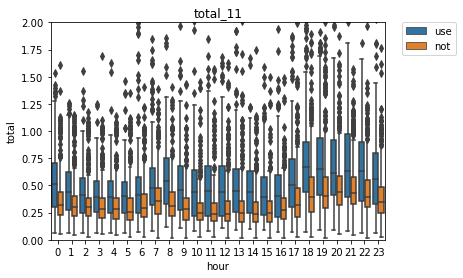

In [171]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_11, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_11')
plt.show()

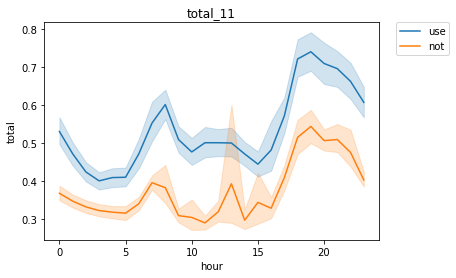

In [172]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_11, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_11')
plt.show()

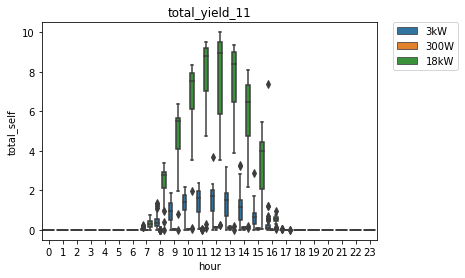

In [173]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_11')
plt.show()

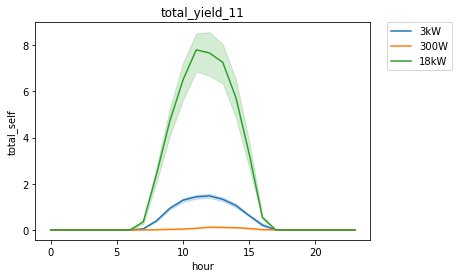

In [174]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_11')
plt.show()

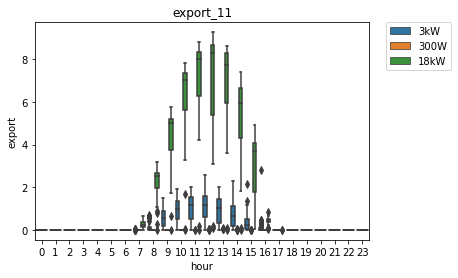

In [175]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_11')
plt.show()

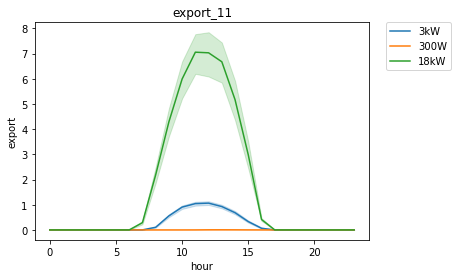

In [176]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_11')
plt.show()

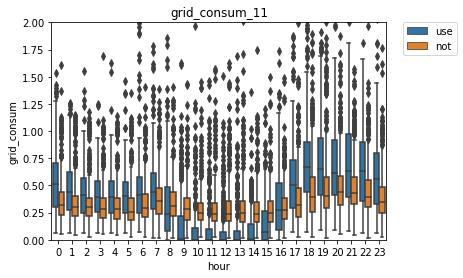

In [177]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_11, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_11')
plt.show()

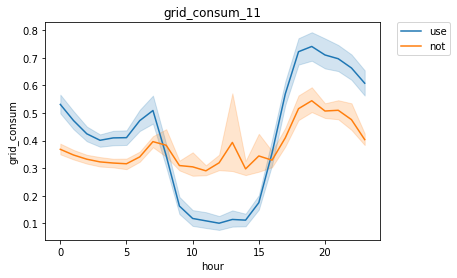

In [178]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_11, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_11')
plt.show()

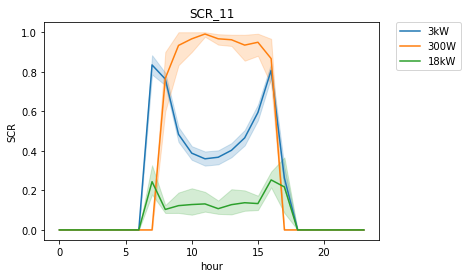

In [179]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_11')
plt.show()

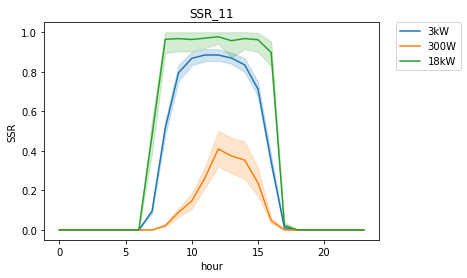

In [180]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_11')
plt.show()

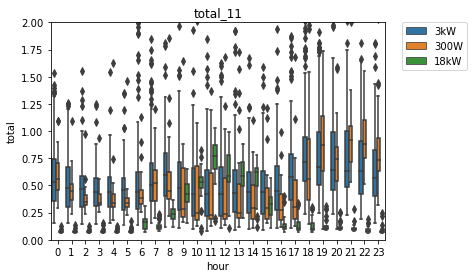

In [181]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_11')
plt.show()

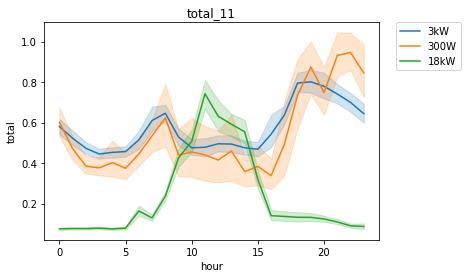

In [182]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_11')
plt.show()

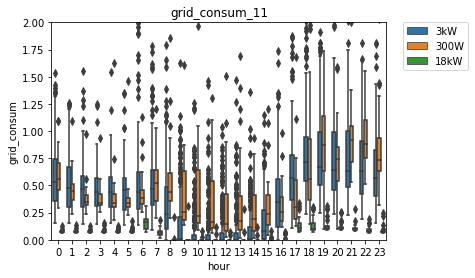

In [183]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_11')
plt.show()

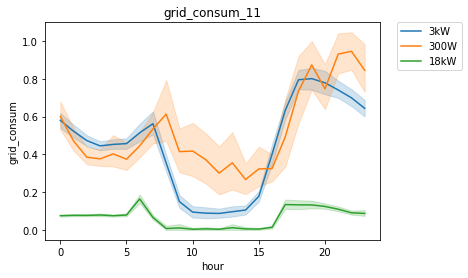

In [184]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_11, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_11')
plt.show()

<hr>

### 2021.12

In [185]:
df_all_hour_21_12 = df_all_hour[df_all_hour.ym == '2021/12']

In [186]:
# 총 전력 소비량
df_all_hour_21_12.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   530.0  0.412253  0.393007  0.019897  0.232574  0.349854  0.479980   
     1   531.0  0.378027  0.369279  0.019897  0.219971  0.330078  0.430176   
     2   532.0  0.366806  0.264585  0.040039  0.210175  0.320068  0.419922   
     3   533.0  0.352639  0.200097  0.020020  0.219971  0.320068  0.419922   
     4   533.0  0.351119  0.208502  0.020020  0.210083  0.310059  0.419922   
     5   526.0  0.368707  0.509531  0.049927  0.209961  0.310059  0.420166   
     6   530.0  0.381646  0.318711  0.020020  0.220001  0.329956  0.449951   
     7   527.0  0.419853  0.258902  0.010010  0.270020  0.380127  0.500000   
     8   528.0  0.390013  0.261106  0.019958  0.229980  0.340088  0.472656   
     9   530.0  0.379147  0.683173  0.030029  0.190063  0.310059  0.429932   
     10  532.0  0.344867  0.462706  0.010010  0.179932  0.270020  0.399902   
     11  536.0  0.348845  0.590538  0.020020  0.160126  0.250000  0.379883   
     12  531.0  0.329716  0.243823  0.020020  0.170105  0.270020  0.409973   
     13  527.0  0.494672  3.708340  0.019958  0.169922  0.260010  0.399902   
     14  533.0  0.333620  0.327721  0.019958  0.160156  0.260010  0.389893   
     15  534.0  0.369814  0.897141  0.020020  0.179932  0.270020  0.387268   
     16  537.0  0.418188  0.624577  0.019958  0.189941  0.300049  0.459961   
     17  533.0  0.467784  0.416001  0.029968  0.229980  0.350098  0.570068   
     18  526.0  0.553155  0.494843  0.020020  0.270020  0.409912  0.644897   
     19  534.0  0.587162  0.839483  0.030029  0.310013  0.439941  0.620117   
     20  526.0  0.546519  0.647752  0.020020  0.320068  0.459961  0.627441   
     21  524.0  0.537870  0.455026  0.049927  0.339966  0.460022  0.609894   
     22  530.0  0.497167  0.408332  0.020020  0.309937  0.439941  0.600098   
     23  531.0  0.429640  0.284516  0.020020  0.270020  0.370117  0.500000   
use  0   305.0  0.532841  0.310400  0.049988  0.319946  0.530029  0.729980   
     1   304.0  0.489865  0.427453  0.049988  0.280029  0.450012  0.659912   
     2   306.0  0.437957  0.239440  0.049988  0.262512  0.410034  0.609863   
     3   305.0  0.414387  0.213027  0.049988  0.260010  0.400146  0.560059   
     4   305.0  0.420107  0.222342  0.049988  0.259766  0.409912  0.570068   
     5   306.0  0.420078  0.248984  0.049988  0.250000  0.399902  0.550049   
     6   305.0  0.491225  0.368995  0.070007  0.250000  0.410156  0.589844   
     7   305.0  0.589248  0.697322  0.070007  0.270020  0.479980  0.699951   
     8   304.0  0.678036  0.442042  0.071472  0.340088  0.600159  0.879883   
     9   305.0  0.617870  0.473516  0.081055  0.300049  0.520020  0.820068   
     10  305.0  0.595718  0.784196  0.079834  0.289795  0.500000  0.689819   
     11  304.0  0.541475  0.348250  0.090088  0.249985  0.490112  0.710205   
     12  306.0  0.561190  0.409652  0.080078  0.272663  0.504944  0.710693   
     13  304.0  0.536797  0.338648  0.079834  0.269806  0.495056  0.699982   
     14  300.0  0.525872  0.336658  0.080078  0.269978  0.469971  0.672699   
     15  306.0  0.479390  0.320492  0.090088  0.250000  0.419922  0.619873   
     16  306.0  0.502775  0.385953  0.060547  0.239979  0.430107  0.650146   
     17  303.0  0.638094  0.415717  0.070007  0.340027  0.580078  0.860107   
     18  304.0  0.721532  0.420586  0.080017  0.452362  0.659912  1.019836   
     19  304.0  0.738129  0.452452  0.079987  0.420044  0.669922  1.019928   
     20  303.0  0.740731  0.472977  0.070007  0.409973  0.659912  1.045044   
     21  300.0  0.703164  0.428601  0.069977  0.390015  0.649963  0.889954   
     22  304.0  0.656493  0.373197  0.059998  0.367432  0.640015  0.879883   
     23  304.0  0.602968  0.352181  0.049988  0.339966  0.610046  0.800049   

               max  
type 시간             
not  0    5.169922  
     1    7.229980  
     2    3.040039  
   

In [187]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_21_12_use = df_all_hour_21_12[df_all_hour_21_12.type == 'use']
df_all_hour_21_12_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.074517  0.024200  0.049988  0.069977  0.070007   
         1    31.0  0.073866  0.022010  0.049988  0.059998  0.069977   
         2    31.0  0.076131  0.021556  0.049988  0.064987  0.070007   
         3    31.0  0.075484  0.025536  0.049988  0.069977  0.070007   
         4    31.0  0.077097  0.021940  0.049988  0.060013  0.070007   
         5    31.0  0.079678  0.031355  0.049988  0.069992  0.070007   
         6    31.0  0.184515  0.083776  0.070007  0.119980  0.160004   
         7    31.0  0.123368  0.038364  0.070007  0.095016  0.118561   
         8    31.0  0.198161  0.055134  0.071472  0.169922  0.200195   
         9    31.0  0.260711  0.082653  0.081055  0.215332  0.260742   
         10   31.0  0.512790  0.164210  0.119141  0.409668  0.549805   
         11   31.0  0.642421  0.171687  0.120117  0.574707  0.669922   
         12   31.0  0.584142  0.158765  0.179688  0.515625  0.580078   
         13   30.0  0.632812  0.198425  0.239258  0.555420  0.661133   
         14   31.0  0.530021  0.221306  0.228516  0.419922  0.519531   
         15   31.0  0.342616  0.103978  0.120117  0.290039  0.339844   
         16   31.0  0.117060  0.055631  0.060547  0.085449  0.108398   
         17   30.0  0.134657  0.052433  0.070007  0.100006  0.114990   
         18   31.0  0.133229  0.059015  0.080017  0.099991  0.110016   
         19   31.0  0.114837  0.032233  0.079987  0.100006  0.109985   
         20   31.0  0.117418  0.053602  0.070007  0.089996  0.100006   
         21   31.0  0.098230  0.025116  0.069977  0.082520  0.090027   
         22   31.0  0.085160  0.024203  0.059998  0.070007  0.080017   
         23   31.0  0.072258  0.020120  0.049988  0.064987  0.070007   
300W     0    31.0  0.633230  0.269708  0.290039  0.459961  0.620117   
         1    31.0  0.481934  0.248279  0.229980  0.335083  0.399902   
         2    31.0  0.380938  0.122384  0.189941  0.300049  0.339844   
         3    31.0  0.368077  0.105450  0.190186  0.295044  0.350098   
         4    31.0  0.363549  0.087012  0.209961  0.315063  0.359863   
         5    31.0  0.391917  0.285864  0.169922  0.310059  0.349854   
         6    31.0  0.394208  0.164071  0.220215  0.290039  0.370117   
         7    31.0  0.466458  0.314431  0.130127  0.265015  0.379883   
         8    30.0  0.790307  0.597710  0.129883  0.309998  0.685059   
         9    30.0  0.503690  0.420801  0.129852  0.270004  0.384987   
         10   31.0  0.442696  0.319740  0.139877  0.254974  0.300018   
         11   31.0  0.360641  0.249779  0.130051  0.239914  0.250168   
         12   31.0  0.404510  0.440666  0.140028  0.239891  0.269974   
         13   31.0  0.400018  0.373153  0.140023  0.235001  0.260193   
         14   31.0  0.426769  0.425024  0.120009  0.205007  0.270218   
         15   31.0  0.409359  0.440657  0.160049  0.220016  0.289993   
         16   31.0  0.385477  0.382338  0.110107  0.224968  0.280029   
         17   31.0  0.455818  0.409957  0.129883  0.219971  0.330078   
         18   31.0  0.677419  0.474064  0.149902  0.305054  0.520020   
         19   31.0  0.774209  0.508098  0.239990  0.369995  0.660156   
         20   31.0  0.967443  0.645848  0.250000  0.479980  0.780029   
         21   31.0  0.854169  0.430449  0.239990  0.484985  0.770020   
         22   31.0  0.834835  0.318128  0.260010  0.619995  0.859863   
         23   31.0  0.770972  0.348162  0.239990  0.525024  0.750000   
3kW      0   243.0  0.578503  0.285743  0.150024  0.359985  0.579956   
         1   242.0  0.544170  0.443575  0.150024  0.329987  0.505005   
         2   244.0  0.491171  0.223814  0.140015  0.310059  0.460205   
         3   243.0  0.463530  0.195283  0.169922  0.309937  0.440186   
         4   243.0  0.471080  0.207395  0.140015  0.319946  0.449951   
         5   244.0  0.466904  0.224756  0.119995  0.2

In [188]:
# 총 전력 생산량
df_all_hour_21_12_use = df_all_hour_21_12[df_all_hour_21_12.type == 'use']
df_all_hour_21_12_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.039535  0.051751  0.000000  0.009766  0.019531   
         8    31.0  1.758443  0.574456  0.021484  1.554688  1.799805   
         9    31.0  4.222562  1.199287  0.400391  3.955078  4.628906   
         10   31.0  6.261624  1.865466  0.839844  5.969727  7.019531   
         11   31.0  7.769437  1.956236  1.150391  7.409668  8.299805   
         12   31.0  8.101815  2.164567  1.660156  7.934570  8.609375   
         13   30.0  7.574121  2.317881  1.849609  7.050537  8.255371   
         14   31.0  6.708701  2.831082  2.270508  4.989746  6.851562   
         15   31.0  4.113565  1.420148  1.140625  3.439941  4.310547   
         16   31.0  0.436933  0.166470  0.120117  0.325195  0.458984   
         17   30.0  0.000326  0.001783  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.001334  0.003458  0.000000  0.000000  0.000000   
         9    30.0  0.011998  0.009612  0.000000  0.002499  0.009995   
         10   31.0  0.026775  0.013757  0.000000  0.019989  0.020004   
         11   31.0  0.066774  0.019392  0.009995  0.059998  0.070007   
         12   31.0  0.123226  0.057815  0.019989  0.079994  0.130005   
         13   31.0  0.126128  0.061029  0.000000  0.100006  0.149994   
         14   31.0  0.107743  0.060700  0.010010  0.040009  0.120010   
         15   31.0  0.074516  0.045230  0.000000  0.034996  0.080002   
         16   31.0  0.006452  0.005507  0.000000  0.000000  0.009995   
         17   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   244.0  0.000000  0.000000  0.000000  0.0

In [189]:
# 총 전력 수출량
df_all_hour_21_12_use = df_all_hour_21_12[df_all_hour_21_12.type == 'use']
df_all_hour_21_12_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.025202  0.042925  0.000000  0.000000  0.009766   
         8    31.0  1.562216  0.523872  0.000000  1.364746  1.599609   
         9    31.0  3.961851  1.166813  0.319336  3.674805  4.429688   
         10   31.0  5.748834  1.735128  0.720703  5.450684  6.339844   
         11   31.0  7.127016  1.823653  1.030273  6.584961  7.690430   
         12   31.0  7.517673  2.046016  1.390625  7.334961  7.970703   
         13   30.0  6.941309  2.148907  1.610352  6.499756  7.565430   
         14   31.0  6.178679  2.620610  2.030273  4.625000  6.370117   
         15   31.0  3.770949  1.327335  1.020508  3.124512  3.979492   
         16   31.0  0.336001  0.148707  0.059570  0.234863  0.349609   
         17   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.003226  0.007478  0.000000  0.000000  0.000000   
         13   31.0  0.003226  0.008713  0.000000  0.000000  0.000000   
         14   31.0  0.004516  0.010276  0.000000  0.000000  0.000000   
         15   31.0  0.000645  0.003592  0.000000  0.000000  0.000000   
         16   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         17   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   244.0  0.000000  0.000000  0.000000  0.0

In [190]:
# 총 그리드 소비량
df_all_hour_21_12.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   530.0  0.412253  0.393007  0.019897  0.232574  0.349854  0.479980   
     1   531.0  0.378027  0.369279  0.019897  0.219971  0.330078  0.430176   
     2   532.0  0.366806  0.264585  0.040039  0.210175  0.320068  0.419922   
     3   533.0  0.352639  0.200097  0.020020  0.219971  0.320068  0.419922   
     4   533.0  0.351119  0.208502  0.020020  0.210083  0.310059  0.419922   
     5   526.0  0.368707  0.509531  0.049927  0.209961  0.310059  0.420166   
     6   530.0  0.381646  0.318711  0.020020  0.220001  0.329956  0.449951   
     7   527.0  0.419853  0.258902  0.010010  0.270020  0.380127  0.500000   
     8   528.0  0.390013  0.261106  0.019958  0.229980  0.340088  0.472656   
     9   530.0  0.379147  0.683173  0.030029  0.190063  0.310059  0.429932   
     10  532.0  0.344867  0.462706  0.010010  0.179932  0.270020  0.399902   
     11  536.0  0.348845  0.590538  0.020020  0.160126  0.250000  0.379883   
     12  531.0  0.329716  0.243823  0.020020  0.170105  0.270020  0.409973   
     13  527.0  0.494672  3.708340  0.019958  0.169922  0.260010  0.399902   
     14  533.0  0.333620  0.327721  0.019958  0.160156  0.260010  0.389893   
     15  534.0  0.369814  0.897141  0.020020  0.179932  0.270020  0.387268   
     16  537.0  0.418188  0.624577  0.019958  0.189941  0.300049  0.459961   
     17  533.0  0.467784  0.416001  0.029968  0.229980  0.350098  0.570068   
     18  526.0  0.553155  0.494843  0.020020  0.270020  0.409912  0.644897   
     19  534.0  0.587162  0.839483  0.030029  0.310013  0.439941  0.620117   
     20  526.0  0.546519  0.647752  0.020020  0.320068  0.459961  0.627441   
     21  524.0  0.537870  0.455026  0.049927  0.339966  0.460022  0.609894   
     22  530.0  0.497167  0.408332  0.020020  0.309937  0.439941  0.600098   
     23  531.0  0.429640  0.284516  0.020020  0.270020  0.370117  0.500000   
use  0   305.0  0.532841  0.310400  0.049988  0.319946  0.530029  0.729980   
     1   304.0  0.489865  0.427453  0.049988  0.280029  0.450012  0.659912   
     2   306.0  0.437957  0.239440  0.049988  0.262512  0.410034  0.609863   
     3   305.0  0.414387  0.213027  0.049988  0.260010  0.400146  0.560059   
     4   305.0  0.420107  0.222342  0.049988  0.259766  0.409912  0.570068   
     5   306.0  0.420078  0.248984  0.049988  0.250000  0.399902  0.550049   
     6   305.0  0.491225  0.368995  0.070007  0.250000  0.410156  0.589844   
     7   305.0  0.583400  0.697260  0.059998  0.260010  0.469971  0.680176   
     8   304.0  0.505890  0.447590  0.000000  0.177307  0.415039  0.689941   
     9   305.0  0.258625  0.439840  0.000000  0.010010  0.099854  0.349854   
     10  305.0  0.172733  0.664776  0.000000  0.000000  0.010010  0.159912   
     11  304.0  0.093647  0.205078  0.000000  0.000000  0.000000  0.102356   
     12  306.0  0.102026  0.257755  0.000000  0.000000  0.000000  0.077393   
     13  304.0  0.104242  0.218575  0.000000  0.000000  0.000000  0.109863   
     14  300.0  0.130801  0.255485  0.000000  0.000000  0.020020  0.142639   
     15  306.0  0.187417  0.289804  0.000000  0.000000  0.090088  0.260010   
     16  306.0  0.413886  0.383915  0.000000  0.130035  0.344849  0.607422   
     17  303.0  0.630202  0.400406  0.070007  0.340027  0.570068  0.859863   
     18  304.0  0.721532  0.420586  0.080017  0.452362  0.659912  1.019836   
     19  304.0  0.738129  0.452452  0.079987  0.420044  0.669922  1.019928   
     20  303.0  0.740731  0.472977  0.070007  0.409973  0.659912  1.045044   
     21  300.0  0.703164  0.428601  0.069977  0.390015  0.649963  0.889954   
     22  304.0  0.656493  0.373197  0.059998  0.367432  0.640015  0.879883   
     23  304.0  0.602968  0.352181  0.049988  0.339966  0.610046  0.800049   

               max  
type 시간             
not  0    5.169922  
     1    7.229980  
     2    3.040039  
   

In [191]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_21_12_use = df_all_hour_21_12[df_all_hour_21_12.type == 'use']
df_all_hour_21_12_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.074517  0.024200  0.049988  0.069977  0.070007   
         1    31.0  0.073866  0.022010  0.049988  0.059998  0.069977   
         2    31.0  0.076131  0.021556  0.049988  0.064987  0.070007   
         3    31.0  0.075484  0.025536  0.049988  0.069977  0.070007   
         4    31.0  0.077097  0.021940  0.049988  0.060013  0.070007   
         5    31.0  0.079678  0.031355  0.049988  0.069992  0.070007   
         6    31.0  0.184515  0.083776  0.070007  0.119980  0.160004   
         7    31.0  0.109034  0.036456  0.059998  0.080002  0.100006   
         8    31.0  0.001935  0.009097  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         16   31.0  0.016127  0.018014  0.000000  0.000000  0.010010   
         17   30.0  0.134331  0.052302  0.070007  0.100006  0.114990   
         18   31.0  0.133229  0.059015  0.080017  0.099991  0.110016   
         19   31.0  0.114837  0.032233  0.079987  0.100006  0.109985   
         20   31.0  0.117418  0.053602  0.070007  0.089996  0.100006   
         21   31.0  0.098230  0.025116  0.069977  0.082520  0.090027   
         22   31.0  0.085160  0.024203  0.059998  0.070007  0.080017   
         23   31.0  0.072258  0.020120  0.049988  0.064987  0.070007   
300W     0    31.0  0.633230  0.269708  0.290039  0.459961  0.620117   
         1    31.0  0.481934  0.248279  0.229980  0.335083  0.399902   
         2    31.0  0.380938  0.122384  0.189941  0.300049  0.339844   
         3    31.0  0.368077  0.105450  0.190186  0.295044  0.350098   
         4    31.0  0.363549  0.087012  0.209961  0.315063  0.359863   
         5    31.0  0.391917  0.285864  0.169922  0.310059  0.349854   
         6    31.0  0.394208  0.164071  0.220215  0.290039  0.370117   
         7    31.0  0.466458  0.314431  0.130127  0.265015  0.379883   
         8    30.0  0.788973  0.597450  0.129883  0.309998  0.685059   
         9    30.0  0.491691  0.424867  0.109863  0.259949  0.369995   
         10   31.0  0.415921  0.323781  0.119873  0.229980  0.280029   
         11   31.0  0.293867  0.254953  0.050049  0.154907  0.189941   
         12   31.0  0.284510  0.430061  0.030029  0.104980  0.149902   
         13   31.0  0.277115  0.359277  0.010010  0.084961  0.199951   
         14   31.0  0.323541  0.410271  0.000000  0.119873  0.169922   
         15   31.0  0.335489  0.434329  0.050049  0.159912  0.219971   
         16   31.0  0.379024  0.383395  0.110107  0.219971  0.270020   
         17   31.0  0.455818  0.409957  0.129883  0.219971  0.330078   
         18   31.0  0.677419  0.474064  0.149902  0.305054  0.520020   
         19   31.0  0.774209  0.508098  0.239990  0.369995  0.660156   
         20   31.0  0.967443  0.645848  0.250000  0.479980  0.780029   
         21   31.0  0.854169  0.430449  0.239990  0.484985  0.770020   
         22   31.0  0.834835  0.318128  0.260010  0.619995  0.859863   
         23   31.0  0.770972  0.348162  0.239990  0.525024  0.750000   
3kW      0   243.0  0.578503  0.285743  0.150024  0.359985  0.579956   
         1   242.0  0.544170  0.443575  0.150024  0.329987  0.505005   
         2   244.0  0.491171  0.223814  0.140015  0.310059  0.460205   
         3   243.0  0.463530  0.195283  0.169922  0.309937  0.440186   
         4   243.0  0.471080  0.207395  0.140015  0.319946  0.449951   
         5   244.0  0.466904  0.224756  0.119995  0.2

In [192]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_21_12_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.492010  0.383385  0.000000  0.167117  0.450000   
         8    31.0  0.142944  0.160519  0.074219  0.100407  0.113254   
         9    31.0  0.068771  0.035979  0.029958  0.049181  0.057965   
         10   31.0  0.084674  0.019371  0.053496  0.071628  0.083685   
         11   31.0  0.084112  0.014216  0.056876  0.074101  0.080618   
         12   31.0  0.075434  0.020754  0.051652  0.059978  0.073171   
         13   30.0  0.085946  0.016789  0.036973  0.076320  0.087941   
         14   31.0  0.080798  0.012992  0.054870  0.073999  0.079318   
         15   31.0  0.086354  0.014180  0.058339  0.076986  0.083063   
         16   31.0  0.249920  0.105089  0.121094  0.174606  0.218321   
         17   30.0  0.033333  0.182574  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.133333  0.345746  0.000000  0.000000  0.000000   
         9    30.0  0.733333  0.449776  0.000000  0.250000  1.000000   
         10   31.0  0.967742  0.179605  0.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  0.979182  0.049910  0.785712  1.000000  1.000000   
         13   31.0  0.949010  0.183293  0.000000  1.000000  1.000000   
         14   31.0  0.968844  0.068716  0.764704  1.000000  1.000000   
         15   31.0  0.961290  0.181985  0.000000  1.000000  1.000000   
         16   31.0  0.612903  0.495138  0.000000  0.000000  1.000000   
         17   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   244.0  0.000000  0.000000  0.000000  0.0

In [193]:
# SSR(자가공급률)
df_all_hour_21_12_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.115457  0.101300  0.000000  0.050309  0.088963   
         8    31.0  0.975910  0.125621  0.300598  1.000000  1.000000   
         9    31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         16   31.0  0.865604  0.133713  0.571678  0.803310  0.899756   
         17   30.0  0.002038  0.011160  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    30.0  0.002212  0.007279  0.000000  0.000000  0.000000   
         9    30.0  0.040582  0.041857  0.000000  0.003519  0.031282   
         10   31.0  0.091108  0.074540  0.000000  0.043493  0.071440   
         11   31.0  0.243399  0.123672  0.007996  0.144369  0.240049   
         12   31.0  0.411077  0.243931  0.060607  0.192546  0.382957   
         13   31.0  0.408794  0.261229  0.000000  0.150781  0.425018   
         14   31.0  0.355506  0.284814  0.040039  0.118072  0.196122   
         15   31.0  0.243287  0.185792  0.000000  0.105507  0.200000   
         16   31.0  0.023582  0.022076  0.000000  0.000000  0.027774   
         17   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   244.0  0.000000  0.000000  0.000000  0.0

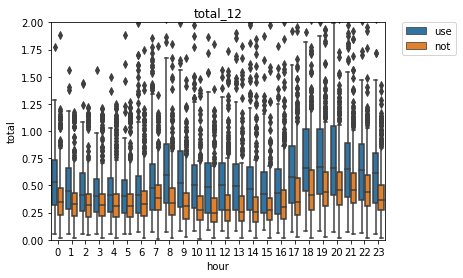

In [194]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_12, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_12')
plt.show()

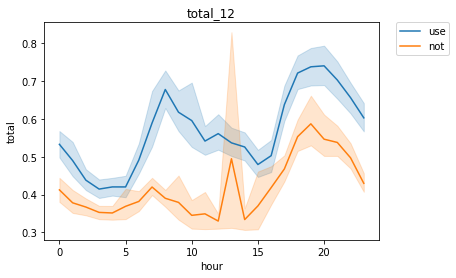

In [195]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_12, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_12')
plt.show()

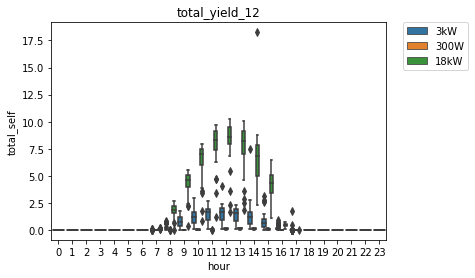

In [196]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_12')
plt.show()

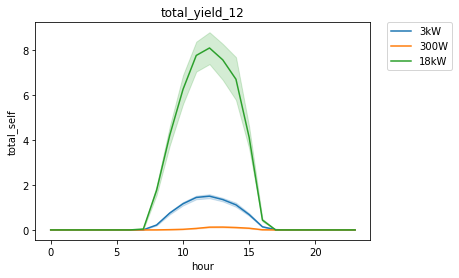

In [197]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_12')
plt.show()

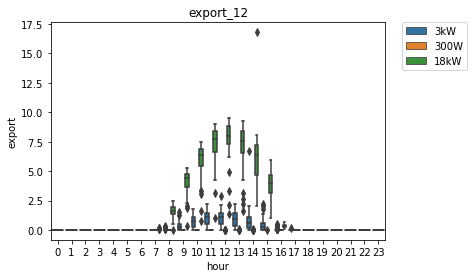

In [198]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_12')
plt.show()

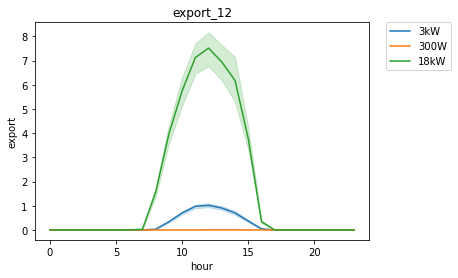

In [199]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_12')
plt.show()

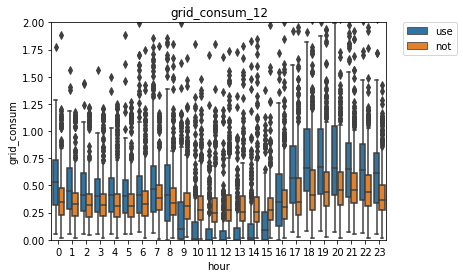

In [200]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_12, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_12')
plt.show()

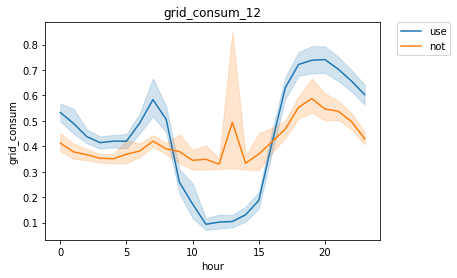

In [201]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_12, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_12')
plt.show()

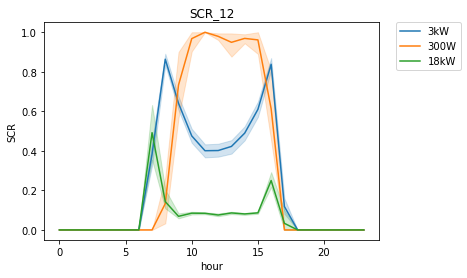

In [202]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_12')
plt.show()

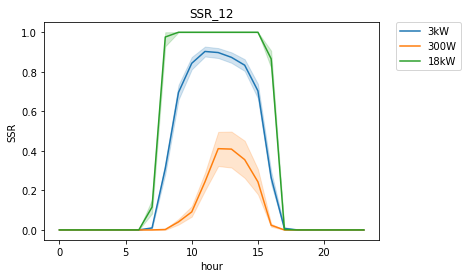

In [203]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_12')
plt.show()

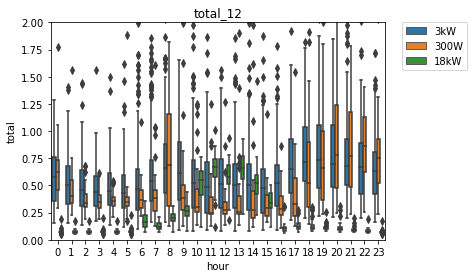

In [204]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_12')
plt.show()

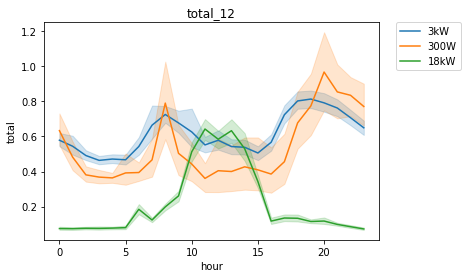

In [205]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_12')
plt.show()

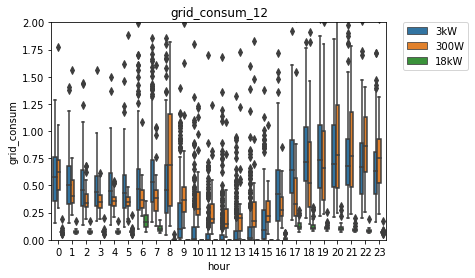

In [206]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_12')
plt.show()

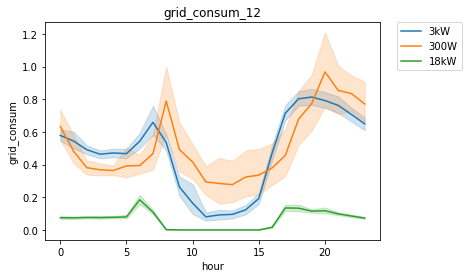

In [207]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_21_12, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_12')
plt.show()

<hr>

### 2022.01

In [208]:
df_all_hour_22_1 = df_all_hour[df_all_hour.ym == '2022/1']

In [209]:
# 총 전력 소비량
df_all_hour_22_1.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   541.0  0.415053  0.259797  0.070068  0.239990  0.360107  0.480103   
     1   540.0  0.380259  0.234227  0.059937  0.220093  0.340088  0.449951   
     2   540.0  0.370964  0.279586  0.059937  0.219971  0.319824  0.419922   
     3   541.0  0.354659  0.216959  0.030029  0.209961  0.319946  0.429932   
     4   538.0  0.349891  0.214953  0.050049  0.209961  0.319824  0.409912   
     5   533.0  0.343145  0.223945  0.040039  0.189941  0.300049  0.409912   
     6   538.0  0.391513  0.412422  0.039917  0.209961  0.330078  0.449951   
     7   538.0  0.454796  0.269974  0.029907  0.282501  0.409912  0.550049   
     8   539.0  0.433970  0.314340  0.020020  0.250000  0.349976  0.510010   
     9   537.0  0.418398  0.598011  0.020020  0.209961  0.310059  0.460205   
     10  540.0  0.421314  0.805443  0.010010  0.190155  0.300049  0.459961   
     11  538.0  0.356708  0.292104  0.020020  0.179932  0.280029  0.430115   
     12  539.0  0.383585  0.568757  0.010010  0.170044  0.280029  0.464966   
     13  537.0  0.358364  0.282015  0.010010  0.180176  0.280029  0.439941   
     14  536.0  0.404815  0.681575  0.019897  0.180176  0.289917  0.422791   
     15  537.0  0.364319  0.323676  0.020020  0.189941  0.290039  0.420166   
     16  538.0  0.418793  0.627197  0.040039  0.199951  0.319824  0.450134   
     17  541.0  0.490890  0.541262  0.020020  0.239990  0.370117  0.550049   
     18  530.0  0.555281  0.476119  0.019897  0.280029  0.430176  0.659912   
     19  536.0  0.580229  0.512320  0.059937  0.310059  0.449951  0.629883   
     20  536.0  0.564359  0.440797  0.099976  0.330078  0.480103  0.630188   
     21  533.0  0.571806  0.665963  0.070068  0.349976  0.479980  0.649902   
     22  539.0  0.516664  0.325917  0.060059  0.309937  0.449951  0.619873   
     23  540.0  0.476421  0.786611  0.099976  0.260010  0.380127  0.530029   
use  0   307.0  0.603613  0.312509  0.050049  0.399902  0.609863  0.805054   
     1   308.0  0.527895  0.246146  0.059998  0.359985  0.540039  0.699768   
     2   307.0  0.511203  0.252428  0.049988  0.350037  0.489990  0.659912   
     3   308.0  0.489431  0.245242  0.059998  0.337402  0.459961  0.639648   
     4   307.0  0.496108  0.364904  0.049988  0.334961  0.460205  0.625000   
     5   308.0  0.479278  0.265589  0.059998  0.309814  0.445190  0.620117   
     6   303.0  0.527288  0.304411  0.059998  0.320068  0.479980  0.705078   
     7   303.0  0.625294  0.408720  0.079773  0.359863  0.530029  0.839966   
     8   303.0  0.739619  0.426720  0.090302  0.430054  0.669922  1.004883   
     9   303.0  0.693769  0.447502  0.089844  0.340027  0.630127  0.924927   
     10  299.0  0.659446  0.446660  0.090088  0.340027  0.590088  0.850037   
     11  303.0  0.662122  0.551219  0.100098  0.329956  0.579102  0.840210   
     12  299.0  0.665079  0.438647  0.079834  0.334930  0.570068  0.899902   
     13  300.0  0.641022  0.407209  0.090088  0.327637  0.565308  0.844910   
     14  300.0  0.603898  0.352070  0.094727  0.369965  0.564941  0.792328   
     15  302.0  0.619788  0.395536  0.070068  0.342556  0.528198  0.827576   
     16  304.0  0.637783  0.824562  0.080078  0.300045  0.510132  0.820068   
     17  302.0  0.716223  0.496379  0.057556  0.400146  0.640137  0.959900   
     18  305.0  0.855104  0.518245  0.079987  0.530029  0.790039  1.140137   
     19  305.0  0.907200  0.744430  0.089966  0.510010  0.810059  1.199951   
     20  305.0  0.826434  0.518768  0.089966  0.530029  0.789795  1.089844   
     21  301.0  0.800656  0.389952  0.070007  0.559814  0.800049  1.050049   
     22  303.0  0.752373  0.360860  0.059998  0.539978  0.770020  0.979980   
     23  305.0  0.706150  0.478295  0.049988  0.469971  0.689941  0.880127   

               max  
type 시간             
not  0    2.029785  
     1    1.959961  
     2    4.349609  
   

In [210]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_22_1_use = df_all_hour_22_1[df_all_hour_22_1.type == 'use']
df_all_hour_22_1_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.080644  0.019488  0.050049  0.069992  0.080017   
         1    31.0  0.081613  0.018627  0.059998  0.070007  0.080017   
         2    31.0  0.076454  0.018178  0.049988  0.069992  0.070007   
         3    31.0  0.084832  0.033548  0.059998  0.070007  0.079987   
         4    31.0  0.078390  0.019342  0.049988  0.070007  0.079956   
         5    31.0  0.084513  0.032230  0.059998  0.064972  0.079956   
         6    31.0  0.120965  0.073681  0.059998  0.074982  0.090027   
         7    31.0  0.142169  0.057762  0.079773  0.100876  0.119995   
         8    31.0  0.174863  0.043931  0.090302  0.145508  0.190430   
         9    31.0  0.270256  0.109441  0.099609  0.185547  0.240234   
         10   31.0  0.496913  0.151304  0.181641  0.406250  0.540039   
         11   31.0  0.541425  0.149907  0.191406  0.424805  0.578125   
         12   31.0  0.648532  0.200517  0.242188  0.495605  0.671875   
         13   31.0  0.658802  0.183757  0.220703  0.545410  0.721680   
         14   31.0  0.557019  0.153982  0.189453  0.475586  0.582031   
         15   31.0  0.421623  0.140525  0.189453  0.331055  0.429688   
         16   31.0  0.190233  0.069661  0.080078  0.148926  0.180145   
         17   31.0  0.119056  0.067656  0.057556  0.089752  0.108582   
         18   31.0  0.126133  0.058176  0.079987  0.099976  0.100037   
         19   31.0  0.136127  0.060813  0.089966  0.100006  0.110046   
         20   31.0  0.112903  0.024240  0.089966  0.099976  0.109985   
         21   30.0  0.104339  0.024023  0.070007  0.090027  0.100006   
         22   31.0  0.090325  0.024426  0.059998  0.070007  0.089996   
         23   31.0  0.081180  0.023164  0.049988  0.069992  0.070007   
300W     0    31.0  0.691327  0.281997  0.280029  0.555054  0.640137   
         1    31.0  0.508718  0.148732  0.240234  0.440063  0.520020   
         2    31.0  0.445163  0.170030  0.239990  0.339844  0.439941   
         3    31.0  0.389365  0.091040  0.209961  0.334961  0.410156   
         4    31.0  0.379812  0.083682  0.219971  0.320068  0.389893   
         5    31.0  0.380970  0.114628  0.219971  0.300049  0.359863   
         6    31.0  0.416449  0.108255  0.250000  0.334961  0.419922   
         7    31.0  0.523855  0.223543  0.229980  0.394897  0.500000   
         8    31.0  0.844836  0.380650  0.229980  0.575073  0.820068   
         9    31.0  0.612245  0.425606  0.189941  0.284897  0.429932   
         10   31.0  0.524206  0.364339  0.140121  0.234962  0.360107   
         11   31.0  0.536778  0.484282  0.119843  0.234940  0.339783   
         12   31.0  0.424852  0.321644  0.130015  0.210091  0.280151   
         13   31.0  0.377742  0.345289  0.120013  0.200052  0.259918   
         14   31.0  0.342890  0.183023  0.129993  0.209971  0.280014   
         15   31.0  0.377405  0.252870  0.140029  0.209989  0.329926   
         16   31.0  0.517785  0.528001  0.130045  0.254967  0.330048   
         17   31.0  0.579637  0.571895  0.139893  0.260010  0.350098   
         18   31.0  0.640657  0.400463  0.120117  0.274902  0.570068   
         19   31.0  0.910322  0.582937  0.149902  0.445190  0.800049   
         20   31.0  0.839040  0.400369  0.129883  0.554932  0.760010   
         21   31.0  0.938406  0.330901  0.380127  0.739990  0.860107   
         22   31.0  0.960284  0.315798  0.419922  0.729980  0.919922   
         23   31.0  0.877426  0.252394  0.539795  0.720093  0.829834   
3kW      0   245.0  0.658685  0.271814  0.189941  0.439941  0.629883   
         1   246.0  0.586551  0.210872  0.189941  0.400024  0.579712   
         2   245.0  0.574568  0.218443  0.229980  0.409912  0.550049   
         3   246.0  0.553027  0.219476  0.209961  0.380127  0.500000   
         4   245.0  0.563677  0.370960  0.139893  0.390137  0.510010   
         5   246.0  0.541413  0.248664  0.140015  0.3

In [211]:
# 총 전력 생산량
df_all_hour_22_1_use = df_all_hour_22_1[df_all_hour_22_1.type == 'use']
df_all_hour_22_1_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.013105  0.015389  0.000000  0.000000  0.009766   
         8    31.0  1.279612  0.506109  0.179688  0.825195  1.470703   
         9    31.0  3.869330  1.157791  1.179688  3.200195  4.130859   
         10   31.0  6.201046  1.789829  1.861328  5.616211  6.990234   
         11   31.0  7.769216  1.958580  2.140625  7.329102  8.419922   
         12   31.0  8.541268  2.186049  2.361328  8.094727  9.369141   
         13   31.0  8.499559  2.174577  2.580078  8.304688  9.361328   
         14   31.0  7.584677  1.919795  2.019531  7.625000  8.208984   
         15   31.0  5.463080  1.739347  0.839844  5.330078  5.949219   
         16   31.0  1.352697  0.624957  0.148438  1.004883  1.189453   
         17   31.0  0.042654  0.050894  0.000000  0.009766  0.019531   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.001291  0.003410  0.000000  0.000000  0.000000   
         9    31.0  0.012904  0.006925  0.000000  0.009995  0.010010   
         10   31.0  0.025805  0.013360  0.000000  0.019989  0.020004   
         11   31.0  0.041937  0.014925  0.009995  0.029999  0.040009   
         12   31.0  0.129676  0.047501  0.000000  0.119995  0.149994   
         13   31.0  0.147098  0.060123  0.010010  0.129990  0.170013   
         14   31.0  0.138387  0.064505  0.009995  0.065002  0.169998   
         15   31.0  0.108706  0.052391  0.009995  0.055000  0.129990   
         16   31.0  0.030323  0.022728  0.000000  0.010002  0.029999   
         17   31.0  0.000968  0.003007  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

In [212]:
# 총 전력 수출량
df_all_hour_22_1_use = df_all_hour_22_1[df_all_hour_22_1.type == 'use']
df_all_hour_22_1_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.002552  0.006741  0.000000  0.000000  0.000000   
         8    31.0  1.114100  0.473486  0.128906  0.679688  1.259766   
         9    31.0  3.599074  1.089622  1.000000  3.000000  3.851562   
         10   31.0  5.704133  1.661195  1.679688  5.175781  6.399414   
         11   31.0  7.227791  1.847640  1.949219  6.930176  7.800781   
         12   31.0  7.892736  2.035882  2.000000  7.485352  8.669922   
         13   31.0  7.840757  2.029384  2.359375  7.589844  8.620117   
         14   31.0  7.027659  1.805415  1.830078  7.100098  7.548828   
         15   31.0  5.041457  1.632362  0.640625  4.890137  5.429688   
         16   31.0  1.172789  0.581890  0.080078  0.809570  1.030273   
         17   31.0  0.023595  0.037884  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.002903  0.007829  0.000000  0.000000  0.000000   
         13   31.0  0.010323  0.017026  0.000000  0.000000  0.000000   
         14   31.0  0.007419  0.015699  0.000000  0.000000  0.000000   
         15   31.0  0.002903  0.006925  0.000000  0.000000  0.000000   
         16   31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         17   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

In [213]:
# 총 그리드 소비량
df_all_hour_22_1.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   541.0  0.415053  0.259797  0.070068  0.239990  0.360107  0.480103   
     1   540.0  0.380259  0.234227  0.059937  0.220093  0.340088  0.449951   
     2   540.0  0.370964  0.279586  0.059937  0.219971  0.319824  0.419922   
     3   541.0  0.354659  0.216959  0.030029  0.209961  0.319946  0.429932   
     4   538.0  0.349891  0.214953  0.050049  0.209961  0.319824  0.409912   
     5   533.0  0.343145  0.223945  0.040039  0.189941  0.300049  0.409912   
     6   538.0  0.391513  0.412422  0.039917  0.209961  0.330078  0.449951   
     7   538.0  0.454796  0.269974  0.029907  0.282501  0.409912  0.550049   
     8   539.0  0.433970  0.314340  0.020020  0.250000  0.349976  0.510010   
     9   537.0  0.418398  0.598011  0.020020  0.209961  0.310059  0.460205   
     10  540.0  0.421314  0.805443  0.010010  0.190155  0.300049  0.459961   
     11  538.0  0.356708  0.292104  0.020020  0.179932  0.280029  0.430115   
     12  539.0  0.383585  0.568757  0.010010  0.170044  0.280029  0.464966   
     13  537.0  0.358364  0.282015  0.010010  0.180176  0.280029  0.439941   
     14  536.0  0.404815  0.681575  0.019897  0.180176  0.289917  0.422791   
     15  537.0  0.364319  0.323676  0.020020  0.189941  0.290039  0.420166   
     16  538.0  0.418793  0.627197  0.040039  0.199951  0.319824  0.450134   
     17  541.0  0.490890  0.541262  0.020020  0.239990  0.370117  0.550049   
     18  530.0  0.555281  0.476119  0.019897  0.280029  0.430176  0.659912   
     19  536.0  0.580229  0.512320  0.059937  0.310059  0.449951  0.629883   
     20  536.0  0.564359  0.440797  0.099976  0.330078  0.480103  0.630188   
     21  533.0  0.571806  0.665963  0.070068  0.349976  0.479980  0.649902   
     22  539.0  0.516664  0.325917  0.060059  0.309937  0.449951  0.619873   
     23  540.0  0.476421  0.786611  0.099976  0.260010  0.380127  0.530029   
use  0   307.0  0.603613  0.312509  0.050049  0.399902  0.609863  0.805054   
     1   308.0  0.527895  0.246146  0.059998  0.359985  0.540039  0.699768   
     2   307.0  0.511203  0.252428  0.049988  0.350037  0.489990  0.659912   
     3   308.0  0.489431  0.245242  0.059998  0.337402  0.459961  0.639648   
     4   307.0  0.496108  0.364904  0.049988  0.334961  0.460205  0.625000   
     5   308.0  0.479278  0.265589  0.059998  0.309814  0.445190  0.620117   
     6   303.0  0.527288  0.304411  0.059998  0.320068  0.479980  0.705078   
     7   303.0  0.622789  0.409751  0.059998  0.354919  0.530029  0.839844   
     8   303.0  0.596391  0.435088  0.000000  0.290039  0.540039  0.830078   
     9   303.0  0.301367  0.395586  0.000000  0.029785  0.149902  0.419922   
     10  299.0  0.171581  0.321467  0.000000  0.000000  0.010254  0.199951   
     11  303.0  0.135669  0.313781  0.000000  0.000000  0.000000  0.140015   
     12  299.0  0.109496  0.238923  0.000000  0.000000  0.000000  0.075195   
     13  300.0  0.096149  0.220816  0.000000  0.000000  0.000000  0.072510   
     14  300.0  0.105766  0.213770  0.000000  0.000000  0.000000  0.099915   
     15  302.0  0.196494  0.306956  0.000000  0.000000  0.039917  0.270020   
     16  304.0  0.436423  0.577851  0.000000  0.070068  0.354980  0.609924   
     17  302.0  0.699854  0.499343  0.039978  0.369873  0.639893  0.949951   
     18  305.0  0.855155  0.518268  0.079987  0.530029  0.790039  1.140137   
     19  305.0  0.876267  0.503090  0.089966  0.510010  0.810059  1.199951   
     20  305.0  0.826459  0.518761  0.089966  0.530029  0.789795  1.089844   
     21  301.0  0.800389  0.389726  0.070007  0.559814  0.800049  1.050049   
     22  303.0  0.752288  0.360777  0.059998  0.539978  0.770020  0.979980   
     23  305.0  0.706150  0.478295  0.049988  0.469971  0.689941  0.880127   

               max  
type 시간             
not  0    2.029785  
     1    1.959961  
     2    4.349609  
   

In [214]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_22_1_use = df_all_hour_22_1[df_all_hour_22_1.type == 'use']
df_all_hour_22_1_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.080644  0.019488  0.050049  0.069992  0.080017   
         1    31.0  0.081613  0.018627  0.059998  0.070007  0.080017   
         2    31.0  0.076454  0.018178  0.049988  0.069992  0.070007   
         3    31.0  0.084832  0.033548  0.059998  0.070007  0.079987   
         4    31.0  0.078390  0.019342  0.049988  0.070007  0.079956   
         5    31.0  0.084513  0.032230  0.059998  0.064972  0.079956   
         6    31.0  0.120965  0.073681  0.059998  0.074982  0.090027   
         7    31.0  0.131615  0.057512  0.059998  0.095016  0.110016   
         8    31.0  0.009351  0.015476  0.000000  0.000000  0.000000   
         9    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         16   31.0  0.010325  0.032199  0.000000  0.000000  0.000000   
         17   31.0  0.099997  0.068211  0.039978  0.070007  0.079987   
         18   31.0  0.126133  0.058176  0.079987  0.099976  0.100037   
         19   31.0  0.136127  0.060813  0.089966  0.100006  0.110046   
         20   31.0  0.112903  0.024240  0.089966  0.099976  0.109985   
         21   30.0  0.104339  0.024023  0.070007  0.090027  0.100006   
         22   31.0  0.090325  0.024426  0.059998  0.070007  0.089996   
         23   31.0  0.081180  0.023164  0.049988  0.069992  0.070007   
300W     0    31.0  0.691327  0.281997  0.280029  0.555054  0.640137   
         1    31.0  0.508718  0.148732  0.240234  0.440063  0.520020   
         2    31.0  0.445163  0.170030  0.239990  0.339844  0.439941   
         3    31.0  0.389365  0.091040  0.209961  0.334961  0.410156   
         4    31.0  0.379812  0.083682  0.219971  0.320068  0.389893   
         5    31.0  0.380970  0.114628  0.219971  0.300049  0.359863   
         6    31.0  0.416449  0.108255  0.250000  0.334961  0.419922   
         7    31.0  0.523855  0.223543  0.229980  0.394897  0.500000   
         8    31.0  0.843545  0.381723  0.229980  0.570068  0.820068   
         9    31.0  0.599342  0.424221  0.179932  0.269897  0.429932   
         10   31.0  0.498401  0.362261  0.109863  0.209961  0.360107   
         11   31.0  0.494842  0.484650  0.099854  0.194946  0.290039   
         12   31.0  0.298080  0.320308  0.019775  0.075073  0.160156   
         13   31.0  0.240967  0.363103  0.000000  0.064941  0.139893   
         14   31.0  0.211922  0.184888  0.000000  0.065063  0.159912   
         15   31.0  0.271603  0.265072  0.020020  0.099976  0.179932   
         16   31.0  0.487785  0.520533  0.070068  0.219971  0.290039   
         17   31.0  0.578668  0.571687  0.139893  0.260010  0.349854   
         18   31.0  0.640657  0.400463  0.120117  0.274902  0.570068   
         19   31.0  0.910322  0.582937  0.149902  0.445190  0.800049   
         20   31.0  0.839040  0.400369  0.129883  0.554932  0.760010   
         21   31.0  0.938406  0.330901  0.380127  0.739990  0.860107   
         22   31.0  0.960284  0.315798  0.419922  0.729980  0.919922   
         23   31.0  0.877426  0.252394  0.539795  0.720093  0.829834   
3kW      0   245.0  0.658685  0.271814  0.189941  0.439941  0.629883   
         1   246.0  0.586551  0.210872  0.189941  0.400024  0.579712   
         2   245.0  0.574568  0.218443  0.229980  0.409912  0.550049   
         3   246.0  0.553027  0.219476  0.209961  0.380127  0.500000   
         4   245.0  0.563677  0.370960  0.139893  0.390137  0.510010   
         5   246.0  0.541413  0.248664  0.140015  0.3

In [215]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_22_1_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.613911  0.456601  0.000000  0.000000  1.000000   
         8    31.0  0.143809  0.048378  0.073501  0.112433  0.133846   
         9    31.0  0.072188  0.024755  0.040772  0.057132  0.067612   
         10   31.0  0.081409  0.012802  0.053649  0.074635  0.079882   
         11   31.0  0.071317  0.015121  0.038317  0.061378  0.073969   
         12   31.0  0.078302  0.021635  0.046961  0.067234  0.075594   
         13   31.0  0.078464  0.013072  0.053211  0.073656  0.077092   
         14   31.0  0.075450  0.015290  0.043091  0.064261  0.076428   
         15   31.0  0.083847  0.034088  0.045598  0.065549  0.078894   
         16   31.0  0.151258  0.073136  0.073152  0.112375  0.133826   
         17   31.0  0.572646  0.380876  0.000000  0.315821  0.450000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.129032  0.340777  0.000000  0.000000  0.000000   
         9    31.0  0.870968  0.340777  0.000000  1.000000  1.000000   
         10   31.0  0.967742  0.179605  0.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  0.948873  0.182971  0.000000  1.000000  1.000000   
         13   31.0  0.941340  0.099593  0.642815  0.944274  1.000000   
         14   31.0  0.959135  0.086097  0.722213  1.000000  1.000000   
         15   31.0  0.979700  0.047678  0.800014  1.000000  1.000000   
         16   31.0  0.866358  0.339939  0.000000  1.000000  1.000000   
         17   31.0  0.096774  0.300537  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

In [216]:
# SSR(자가공급률)
df_all_hour_22_1_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.081611  0.085278  0.000000  0.000000  0.075259   
         8    31.0  0.939335  0.116640  0.458402  0.948794  1.000000   
         9    31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         16   31.0  0.952950  0.142758  0.286775  1.000000  1.000000   
         17   31.0  0.182337  0.133551  0.000000  0.088140  0.189911   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.002442  0.006544  0.000000  0.000000  0.000000   
         9    31.0  0.030287  0.024997  0.000000  0.012816  0.024405   
         10   31.0  0.073812  0.060939  0.000000  0.029590  0.057142   
         11   31.0  0.124366  0.073474  0.011231  0.070041  0.115389   
         12   31.0  0.430544  0.265898  0.000000  0.214262  0.444510   
         13   31.0  0.509933  0.276069  0.010577  0.361861  0.529158   
         14   31.0  0.479537  0.303623  0.020855  0.258402  0.464889   
         15   31.0  0.382888  0.258725  0.017397  0.142476  0.371441   
         16   31.0  0.099148  0.121516  0.000000  0.030328  0.061227   
         17   31.0  0.001760  0.006056  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

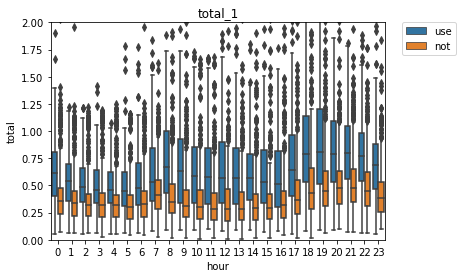

In [217]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_1, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_1')
plt.show()

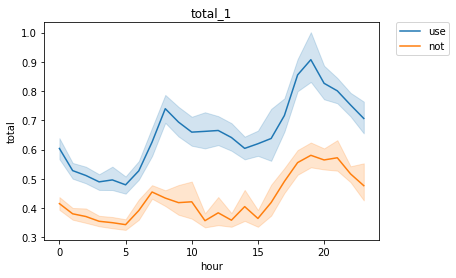

In [218]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_1, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_1')
plt.show()

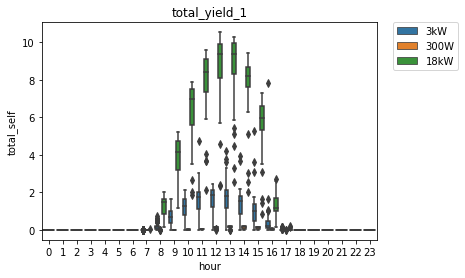

In [219]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_1')
plt.show()

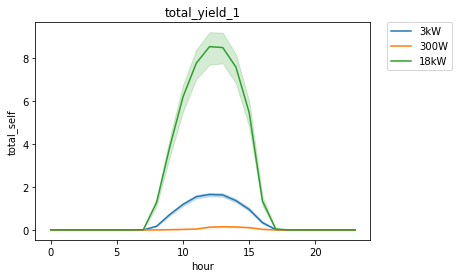

In [220]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_1')
plt.show()

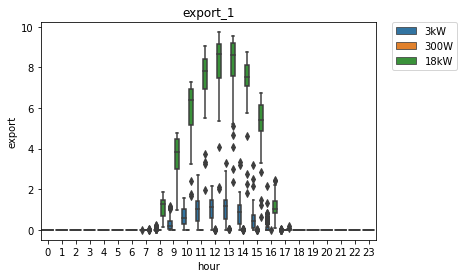

In [221]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_1')
plt.show()

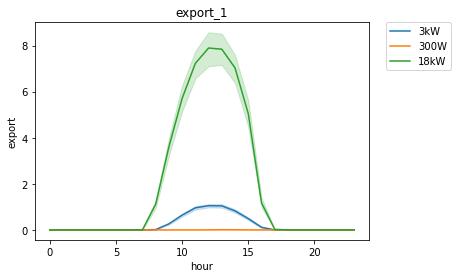

In [222]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_1')
plt.show()

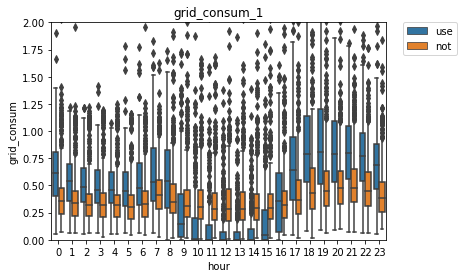

In [223]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_1, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_1')
plt.show()

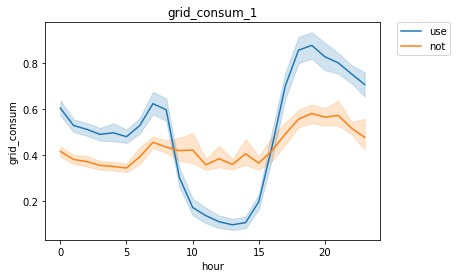

In [224]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_1, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_1')
plt.show()

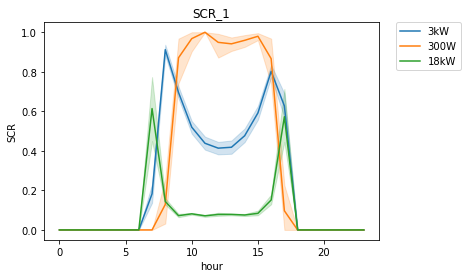

In [225]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_1')
plt.show()

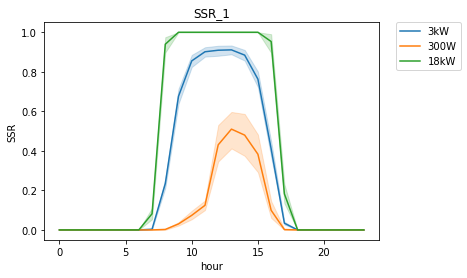

In [226]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_1')
plt.show()

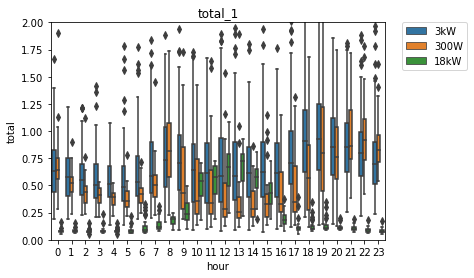

In [227]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_1')
plt.show()

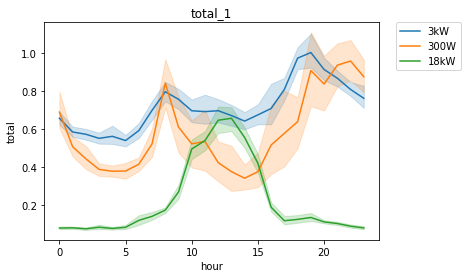

In [228]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_1')
plt.show()

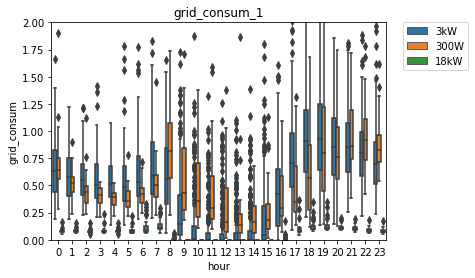

In [229]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_1')
plt.show()

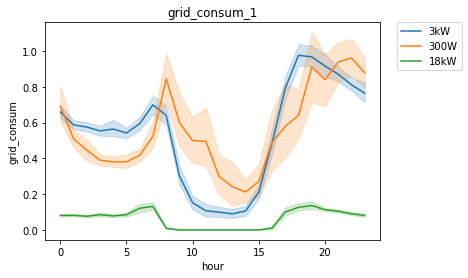

In [230]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_1, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_1')
plt.show()

<hr>

### 2022.02

In [231]:
df_all_hour_22_2 = df_all_hour[df_all_hour.ym == '2022/2']

In [232]:
# 총 전력 소비량
df_all_hour_22_2.groupby(['type', '시간']).describe()['전력소비량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   490.0  0.409492  0.222510  0.099854  0.250000  0.370117  0.479980   
     1   491.0  0.382240  0.225807  0.070068  0.229980  0.339844  0.445068   
     2   490.0  0.366854  0.223065  0.079834  0.220123  0.320068  0.429932   
     3   492.0  0.367200  0.245970  0.039917  0.219971  0.320312  0.429932   
     4   494.0  0.377420  0.433317  0.089966  0.212646  0.310059  0.430176   
     5   491.0  0.366193  0.242044  0.029907  0.200012  0.319824  0.440186   
     6   493.0  0.389777  0.258982  0.020020  0.219971  0.339844  0.469971   
     7   493.0  0.493326  0.623652  0.020020  0.280029  0.410156  0.550049   
     8   491.0  0.484600  0.841782  0.060059  0.250000  0.359863  0.500000   
     9   494.0  0.425995  0.418667  0.020020  0.229980  0.329834  0.489990   
     10  497.0  0.428692  0.662550  0.049927  0.209961  0.309814  0.439941   
     11  497.0  0.393969  0.389973  0.020020  0.190063  0.300049  0.450195   
     12  492.0  0.388524  0.330314  0.020020  0.189941  0.300049  0.452637   
     13  494.0  0.383872  0.329570  0.049927  0.189941  0.290039  0.450195   
     14  490.0  0.378254  0.330973  0.049927  0.199951  0.300049  0.449951   
     15  493.0  0.371586  0.308480  0.030029  0.200195  0.310059  0.439941   
     16  492.0  0.395096  0.358878  0.039917  0.200165  0.320068  0.469971   
     17  489.0  0.474275  0.471643  0.019897  0.220093  0.350098  0.530029   
     18  486.0  0.566856  0.552693  0.020020  0.262451  0.410156  0.600098   
     19  488.0  0.653771  0.790148  0.099976  0.320068  0.459961  0.692627   
     20  492.0  0.616706  0.492129  0.099976  0.349976  0.479980  0.672607   
     21  489.0  0.604294  0.463099  0.109863  0.360107  0.489990  0.649902   
     22  494.0  0.534187  0.409047  0.099976  0.320068  0.459961  0.617432   
     23  495.0  0.462149  0.260331  0.089966  0.280029  0.410156  0.539917   
use  0   274.0  0.557925  0.268074  0.029968  0.392487  0.549805  0.757324   
     1   276.0  0.507890  0.246742  0.050049  0.349854  0.500000  0.669922   
     2   277.0  0.469911  0.232014  0.039978  0.320068  0.450195  0.609863   
     3   276.0  0.439371  0.200827  0.030029  0.320068  0.439941  0.550049   
     4   278.0  0.444101  0.204742  0.049988  0.329834  0.440308  0.550232   
     5   277.0  0.439329  0.218075  0.029968  0.320068  0.429932  0.549805   
     6   273.0  0.455854  0.229308  0.049988  0.300049  0.439941  0.569824   
     7   271.0  0.600693  0.769591  0.049561  0.349976  0.489990  0.714966   
     8   277.0  0.681816  0.383184  0.078125  0.410034  0.580078  0.879883   
     9   274.0  0.713734  0.508217  0.090088  0.390114  0.609787  0.957520   
     10  274.0  0.632501  0.400476  0.109863  0.332520  0.579819  0.850098   
     11  271.0  0.601324  0.352681  0.090088  0.305023  0.569946  0.800110   
     12  275.0  0.580655  0.312829  0.090088  0.330078  0.559723  0.804688   
     13  274.0  0.597073  0.335063  0.100342  0.359886  0.529968  0.810150   
     14  275.0  0.580604  0.362769  0.109863  0.360001  0.520020  0.735229   
     15  277.0  0.556906  0.288159  0.070068  0.340088  0.509766  0.739746   
     16  277.0  0.561210  0.381347  0.099609  0.300049  0.479980  0.709839   
     17  278.0  0.618548  0.401228  0.078308  0.369904  0.550049  0.829834   
     18  276.0  0.750577  0.400116  0.080017  0.500000  0.694946  0.962463   
     19  276.0  0.773482  0.419631  0.069946  0.477539  0.709961  1.080078   
     20  278.0  0.715975  0.397675  0.070007  0.452637  0.674927  0.937500   
     21  276.0  0.687695  0.353167  0.039978  0.459961  0.650085  0.919922   
     22  278.0  0.660709  0.347912  0.040039  0.439941  0.634888  0.875183   
     23  275.0  0.615197  0.299324  0.039978  0.429993  0.620117  0.810059   

               max  
type 시간             
not  0    1.170410  
     1    2.080078  
     2    2.120117  
   

In [233]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_22_2_use = df_all_hour_22_2[df_all_hour_22_2.type == 'use']
df_all_hour_22_2_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    28.0  0.078921  0.016406  0.029968  0.070007  0.079956   
         1    28.0  0.075721  0.011029  0.050049  0.070007  0.079956   
         2    28.0  0.074639  0.012609  0.039978  0.070007  0.070007   
         3    28.0  0.073227  0.018065  0.030029  0.060043  0.070007   
         4    28.0  0.073216  0.013896  0.049988  0.059998  0.070007   
         5    28.0  0.071065  0.013147  0.029968  0.059998  0.070007   
         6    28.0  0.084290  0.034590  0.049988  0.069992  0.079987   
         7    28.0  0.183624  0.086636  0.049561  0.120819  0.170258   
         8    28.0  0.199672  0.070825  0.078125  0.157715  0.191406   
         9    28.0  0.371024  0.089896  0.201172  0.308105  0.365234   
         10   28.0  0.460798  0.161308  0.158203  0.342285  0.500000   
         11   28.0  0.667620  0.164345  0.341797  0.562988  0.709961   
         12   28.0  0.751186  0.173358  0.380859  0.640137  0.769531   
         13   28.0  0.747628  0.173282  0.439453  0.655273  0.782227   
         14   28.0  0.660156  0.180903  0.339844  0.548828  0.660156   
         15   28.0  0.535086  0.138831  0.220703  0.490234  0.559570   
         16   28.0  0.288443  0.108165  0.099609  0.240234  0.270508   
         17   28.0  0.142419  0.075664  0.078308  0.108643  0.119385   
         18   28.0  0.180004  0.092503  0.080017  0.100021  0.140015   
         19   28.0  0.127492  0.047886  0.069946  0.099976  0.110016   
         20   28.0  0.108932  0.019115  0.070007  0.099976  0.109985   
         21   28.0  0.105715  0.031789  0.039978  0.090027  0.100037   
         22   28.0  0.098574  0.032957  0.040039  0.080017  0.095001   
         23   28.0  0.086428  0.023448  0.039978  0.070007  0.080017   
300W     0    28.0  0.647452  0.178754  0.420410  0.527344  0.589844   
         1    28.0  0.561401  0.116262  0.320312  0.494873  0.564941   
         2    28.0  0.481140  0.104677  0.310059  0.415039  0.445068   
         3    28.0  0.414655  0.087395  0.229980  0.350098  0.425049   
         4    28.0  0.375357  0.075948  0.200195  0.330078  0.380127   
         5    28.0  0.372166  0.093350  0.220215  0.320190  0.354980   
         6    28.0  0.377154  0.096954  0.250000  0.307495  0.364990   
         7    28.0  0.581778  0.564614  0.219727  0.359863  0.435059   
         8    28.0  0.688532  0.348216  0.319824  0.517372  0.559937   
         9    28.0  0.669367  0.334984  0.310272  0.419830  0.535248   
         10   28.0  0.481374  0.251112  0.119843  0.317543  0.430252   
         11   28.0  0.464303  0.301004  0.130096  0.290192  0.370209   
         12   28.0  0.442105  0.246060  0.119760  0.255129  0.389984   
         13   28.0  0.418899  0.358014  0.129981  0.240086  0.344910   
         14   28.0  0.443205  0.234590  0.120023  0.322489  0.390167   
         15   28.0  0.591078  0.375388  0.120002  0.340126  0.445038   
         16   28.0  0.652861  0.569516  0.180033  0.315041  0.460083   
         17   28.0  0.547847  0.388188  0.179901  0.352592  0.475067   
         18   28.0  0.664987  0.439903  0.180176  0.379883  0.520020   
         19   28.0  0.694685  0.374309  0.149902  0.420288  0.670166   
         20   28.0  0.683001  0.373175  0.189941  0.439941  0.554932   
         21   28.0  0.674229  0.294293  0.160156  0.450195  0.569824   
         22   28.0  0.670401  0.244314  0.400146  0.484863  0.590088   
         23   28.0  0.699655  0.249131  0.430176  0.567383  0.650146   
3kW      0   218.0  0.607950  0.230751  0.140015  0.422516  0.589966   
         1   220.0  0.556082  0.219521  0.160400  0.380005  0.520020   
         2   221.0  0.518568  0.209497  0.160400  0.360107  0.489990   
         3   220.0  0.489117  0.173085  0.160400  0.360046  0.459961   
         4   222.0  0.499550  0.175209  0.149902  0.370026  0.479980   
         5   221.0  0.494496  0.194113  0.160400  0.3

In [234]:
# 총 전력 생산량
df_all_hour_22_2_use = df_all_hour_22_2[df_all_hour_22_2.type == 'use']
df_all_hour_22_2_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%        50%  \
설비용량(kW) 시간                                                             
18kW     0    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         7    28.0  0.202567  0.145351  0.019531  0.087402   0.164062   
         8    28.0  2.107840  0.567955  0.941406  1.857422   2.114258   
         9    28.0  4.860142  1.103107  1.650391  4.519531   4.905273   
         10   28.0  7.034110  1.614837  2.640625  6.431641   7.334961   
         11   28.0  8.961356  1.701307  4.099609  8.417480   9.375000   
         12   28.0  9.806013  2.022259  5.468750  9.295898  10.409180   
         13   28.0  9.776018  1.747541  4.509766  9.571777  10.229492   
         14   28.0  8.762765  1.748597  4.378906  8.294922   9.275391   
         15   28.0  6.703474  1.865796  2.541016  5.694336   7.394531   
         16   28.0  3.117676  0.926910  0.779297  2.625977   3.094727   
         17   28.0  0.312221  0.148278  0.099609  0.200684   0.279297   
         18   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
300W     0    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         7    28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         8    28.0  0.004642  0.005760  0.000000  0.000000   0.000000   
         9    28.0  0.025002  0.011387  0.000000  0.019989   0.020020   
         10   28.0  0.036786  0.017649  0.000000  0.020020   0.029999   
         11   28.0  0.046430  0.022970  0.000000  0.029999   0.040009   
         12   28.0  0.130001  0.037808  0.000000  0.119995   0.145004   
         13   28.0  0.173209  0.055979  0.010010  0.147499   0.194992   
         14   28.0  0.157859  0.058332  0.040009  0.134987   0.165009   
         15   28.0  0.140356  0.056535  0.000000  0.117493   0.149994   
         16   28.0  0.086428  0.039926  0.009979  0.057495   0.089996   
         17   28.0  0.013214  0.013069  0.000000  0.000000   0.010010   
         18   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000   0.000000   
3kW      0   218.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         1   220.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         2   221.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         3   220.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         4   222.0  0.000000  0.000000  0.000000  0.000000   0.000000  

In [235]:
# 총 전력 수출량
df_all_hour_22_2_use = df_all_hour_22_2[df_all_hour_22_2.type == 'use']
df_all_hour_22_2_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    28.0  0.127511  0.113785  0.000000  0.046875  0.095703   
         8    28.0  1.909598  0.557085  0.669922  1.597168  1.910156   
         9    28.0  4.489118  1.049184  1.449219  4.138184  4.525391   
         10   28.0  6.573312  1.509143  2.441406  5.962402  6.789062   
         11   28.0  8.293736  1.600383  3.691406  7.827637  8.660156   
         12   28.0  9.054827  1.913060  4.910156  8.747559  9.590820   
         13   28.0  9.028390  1.633373  4.070312  8.859375  9.563477   
         14   28.0  8.102609  1.645480  3.968750  7.612793  8.463867   
         15   28.0  6.168387  1.757843  2.320312  5.251953  6.769531   
         16   28.0  2.829590  0.851350  0.640625  2.382324  2.769531   
         17   28.0  0.219796  0.129619  0.050781  0.135254  0.190430   
         18   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   28.0  0.006071  0.013700  0.000000  0.000000  0.000000   
         13   28.0  0.014643  0.025889  0.000000  0.000000  0.000000   
         14   28.0  0.007500  0.017132  0.000000  0.000000  0.000000   
         15   28.0  0.003571  0.014198  0.000000  0.000000  0.000000   
         16   28.0  0.000357  0.001890  0.000000  0.000000  0.000000   
         17   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   218.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   220.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   221.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   220.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   222.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   221.0  0.000296  0.004401  0.000000  0.0

In [236]:
# 총 그리드 소비량
df_all_hour_22_2.groupby(['type', '시간']).describe()['수전전력량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   490.0  0.409492  0.222510  0.099854  0.250000  0.370117  0.479980   
     1   491.0  0.382240  0.225807  0.070068  0.229980  0.339844  0.445068   
     2   490.0  0.366854  0.223065  0.079834  0.220123  0.320068  0.429932   
     3   492.0  0.367200  0.245970  0.039917  0.219971  0.320312  0.429932   
     4   494.0  0.377420  0.433317  0.089966  0.212646  0.310059  0.430176   
     5   491.0  0.366193  0.242044  0.029907  0.200012  0.319824  0.440186   
     6   493.0  0.389777  0.258982  0.020020  0.219971  0.339844  0.469971   
     7   493.0  0.493326  0.623652  0.020020  0.280029  0.410156  0.550049   
     8   491.0  0.484600  0.841782  0.060059  0.250000  0.359863  0.500000   
     9   494.0  0.425995  0.418667  0.020020  0.229980  0.329834  0.489990   
     10  497.0  0.428692  0.662550  0.049927  0.209961  0.309814  0.439941   
     11  497.0  0.393969  0.389973  0.020020  0.190063  0.300049  0.450195   
     12  492.0  0.388524  0.330314  0.020020  0.189941  0.300049  0.452637   
     13  494.0  0.383872  0.329570  0.049927  0.189941  0.290039  0.450195   
     14  490.0  0.378254  0.330973  0.049927  0.199951  0.300049  0.449951   
     15  493.0  0.371586  0.308480  0.030029  0.200195  0.310059  0.439941   
     16  492.0  0.395096  0.358878  0.039917  0.200165  0.320068  0.469971   
     17  489.0  0.474275  0.471643  0.019897  0.220093  0.350098  0.530029   
     18  486.0  0.566856  0.552693  0.020020  0.262451  0.410156  0.600098   
     19  488.0  0.653771  0.790148  0.099976  0.320068  0.459961  0.692627   
     20  492.0  0.616706  0.492129  0.099976  0.349976  0.479980  0.672607   
     21  489.0  0.604294  0.463099  0.109863  0.360107  0.489990  0.649902   
     22  494.0  0.534187  0.409047  0.099976  0.320068  0.459961  0.617432   
     23  495.0  0.462149  0.260331  0.089966  0.280029  0.410156  0.539917   
use  0   274.0  0.558163  0.267749  0.029968  0.392487  0.549805  0.757324   
     1   276.0  0.508127  0.246438  0.050049  0.349854  0.500000  0.669922   
     2   277.0  0.470147  0.231731  0.039978  0.320068  0.450195  0.609863   
     3   276.0  0.439608  0.200535  0.030029  0.320068  0.439941  0.550049   
     4   278.0  0.444337  0.204453  0.049988  0.329834  0.440308  0.550232   
     5   277.0  0.439565  0.217808  0.029968  0.320068  0.429932  0.549805   
     6   273.0  0.456094  0.229032  0.049988  0.300049  0.439941  0.569824   
     7   271.0  0.569370  0.772855  0.010010  0.320068  0.459961  0.679932   
     8   277.0  0.431453  0.392252  0.000000  0.129883  0.350098  0.600098   
     9   274.0  0.263623  0.462276  0.000000  0.000000  0.080017  0.377441   
     10  274.0  0.129450  0.244752  0.000000  0.000000  0.009766  0.145020   
     11  271.0  0.096344  0.220285  0.000000  0.000000  0.000000  0.050293   
     12  275.0  0.070686  0.174346  0.000000  0.000000  0.000000  0.030151   
     13  274.0  0.063285  0.178834  0.000000  0.000000  0.000000  0.040039   
     14  275.0  0.068100  0.157564  0.000000  0.000000  0.000000  0.040039   
     15  277.0  0.113983  0.221543  0.000000  0.000000  0.010010  0.129883   
     16  277.0  0.261728  0.373445  0.000000  0.000000  0.129883  0.350098   
     17  278.0  0.524042  0.385686  0.000000  0.250000  0.464966  0.739929   
     18  276.0  0.750577  0.400116  0.080017  0.500000  0.694946  0.962463   
     19  276.0  0.773482  0.419631  0.069946  0.477539  0.709961  1.080078   
     20  278.0  0.715975  0.397675  0.070007  0.452637  0.674927  0.937500   
     21  276.0  0.687695  0.353167  0.039978  0.459961  0.650085  0.919922   
     22  278.0  0.660937  0.347608  0.040039  0.439941  0.634888  0.875183   
     23  275.0  0.615435  0.298987  0.039978  0.429993  0.620117  0.810059   

               max  
type 시간             
not  0    1.170410  
     1    2.080078  
     2    2.120117  
   

In [237]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_22_2_use = df_all_hour_22_2[df_all_hour_22_2.type == 'use']
df_all_hour_22_2_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    28.0  0.078921  0.016406  0.029968  0.070007  0.079956   
         1    28.0  0.075721  0.011029  0.050049  0.070007  0.079956   
         2    28.0  0.074639  0.012609  0.039978  0.070007  0.070007   
         3    28.0  0.073227  0.018065  0.030029  0.060043  0.070007   
         4    28.0  0.073216  0.013896  0.049988  0.059998  0.070007   
         5    28.0  0.071065  0.013147  0.029968  0.059998  0.070007   
         6    28.0  0.084290  0.034590  0.049988  0.069992  0.079987   
         7    28.0  0.108568  0.077502  0.010010  0.040024  0.095001   
         8    28.0  0.001430  0.005915  0.000000  0.000000  0.000000   
         9    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         16   28.0  0.000357  0.001892  0.000000  0.000000  0.000000   
         17   28.0  0.049994  0.054158  0.000000  0.017471  0.029968   
         18   28.0  0.180004  0.092503  0.080017  0.100021  0.140015   
         19   28.0  0.127492  0.047886  0.069946  0.099976  0.110016   
         20   28.0  0.108932  0.019115  0.070007  0.099976  0.109985   
         21   28.0  0.105715  0.031789  0.039978  0.090027  0.100037   
         22   28.0  0.098574  0.032957  0.040039  0.080017  0.095001   
         23   28.0  0.086428  0.023448  0.039978  0.070007  0.080017   
300W     0    28.0  0.647452  0.178754  0.420410  0.527344  0.589844   
         1    28.0  0.561401  0.116262  0.320312  0.494873  0.564941   
         2    28.0  0.481140  0.104677  0.310059  0.415039  0.445068   
         3    28.0  0.414655  0.087395  0.229980  0.350098  0.425049   
         4    28.0  0.375357  0.075948  0.200195  0.330078  0.380127   
         5    28.0  0.372166  0.093350  0.220215  0.320190  0.354980   
         6    28.0  0.377154  0.096954  0.250000  0.307495  0.364990   
         7    28.0  0.581778  0.564614  0.219727  0.359863  0.435059   
         8    28.0  0.683890  0.348296  0.319824  0.509766  0.550049   
         9    28.0  0.644366  0.338697  0.280273  0.397339  0.510254   
         10   28.0  0.444589  0.252156  0.089844  0.290039  0.385254   
         11   28.0  0.417873  0.302678  0.090332  0.254944  0.334961   
         12   28.0  0.318176  0.249555  0.009766  0.120117  0.254883   
         13   28.0  0.260332  0.382416  0.000000  0.087524  0.165039   
         14   28.0  0.292847  0.248553  0.000000  0.155029  0.250000   
         15   28.0  0.454293  0.386870  0.000000  0.187500  0.314941   
         16   28.0  0.566790  0.568861  0.040039  0.197388  0.364990   
         17   28.0  0.534633  0.391635  0.169922  0.340088  0.445068   
         18   28.0  0.664987  0.439903  0.180176  0.379883  0.520020   
         19   28.0  0.694685  0.374309  0.149902  0.420288  0.670166   
         20   28.0  0.683001  0.373175  0.189941  0.439941  0.554932   
         21   28.0  0.674229  0.294293  0.160156  0.450195  0.569824   
         22   28.0  0.670401  0.244314  0.400146  0.484863  0.590088   
         23   28.0  0.699655  0.249131  0.430176  0.567383  0.650146   
3kW      0   218.0  0.608249  0.230210  0.140015  0.422516  0.589966   
         1   220.0  0.556380  0.219026  0.169922  0.380005  0.520020   
         2   221.0  0.518864  0.209035  0.169922  0.360107  0.489990   
         3   220.0  0.489414  0.172573  0.170166  0.360046  0.459961   
         4   222.0  0.499845  0.174690  0.149902  0.370026  0.479980   
         5   221.0  0.494792  0.193650  0.179932  0.3

In [238]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_22_2_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    28.0  0.464714  0.212160  0.219512  0.284205  0.406889   
         8    28.0  0.101560  0.052138  0.047676  0.069442  0.088419   
         9    28.0  0.078475  0.017167  0.051625  0.067875  0.073990   
         10   28.0  0.065265  0.016405  0.030218  0.054808  0.064727   
         11   28.0  0.075195  0.014014  0.048691  0.066701  0.076099   
         12   28.0  0.077787  0.014693  0.049559  0.067300  0.075201   
         13   28.0  0.076944  0.013449  0.052540  0.066834  0.074973   
         14   28.0  0.076096  0.015466  0.035074  0.071225  0.081668   
         15   28.0  0.082257  0.016246  0.058930  0.072914  0.077506   
         16   28.0  0.094823  0.027720  0.049465  0.076526  0.093970   
         17   28.0  0.322714  0.130793  0.188192  0.230140  0.278447   
         18   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    28.0  0.428571  0.503953  0.000000  0.000000  0.000000   
         9    28.0  0.964286  0.188982  0.000000  1.000000  1.000000   
         10   28.0  0.964286  0.188982  0.000000  1.000000  1.000000   
         11   28.0  0.964286  0.188982  0.000000  1.000000  1.000000   
         12   28.0  0.922927  0.202536  0.000000  0.930766  1.000000   
         13   28.0  0.927812  0.119709  0.565181  0.893275  1.000000   
         14   28.0  0.959854  0.086840  0.666707  0.952380  1.000000   
         15   28.0  0.943474  0.201126  0.000000  1.000000  1.000000   
         16   28.0  0.997619  0.012599  0.933332  1.000000  1.000000   
         17   28.0  0.678571  0.475595  0.000000  0.000000  1.000000   
         18   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   218.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   220.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   221.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   220.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   222.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   221.0  0.000000  0.000000  0.000000  0.0

In [239]:
# SSR(자가공급률)
df_all_hour_22_2_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    28.0  0.436851  0.212771  0.054320  0.273247  0.432006   
         8    28.0  0.994825  0.020387  0.900405  1.000000  1.000000   
         9    28.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   28.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   28.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   28.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   28.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   28.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   28.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         16   28.0  0.997596  0.012723  0.932677  1.000000  1.000000   
         17   28.0  0.688624  0.216162  0.274564  0.488492  0.766623   
         18   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    28.0  0.007548  0.010264  0.000000  0.000000  0.000000   
         9    28.0  0.046608  0.027231  0.000000  0.031281  0.040016   
         10   28.0  0.096696  0.065377  0.000000  0.050520  0.081753   
         11   28.0  0.136448  0.098569  0.000000  0.070460  0.107917   
         12   28.0  0.379845  0.217727  0.000000  0.220612  0.351711   
         13   28.0  0.525388  0.247223  0.004980  0.369320  0.529245   
         14   28.0  0.428587  0.240242  0.055564  0.282275  0.406537   
         15   28.0  0.332933  0.228518  0.000000  0.163281  0.273407   
         16   28.0  0.205932  0.168849  0.030258  0.083619  0.158751   
         17   28.0  0.032791  0.033005  0.000000  0.000000  0.027082   
         18   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   28.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   218.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   220.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   221.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   220.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   222.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   221.0  0.000000  0.000000  0.000000  0.0

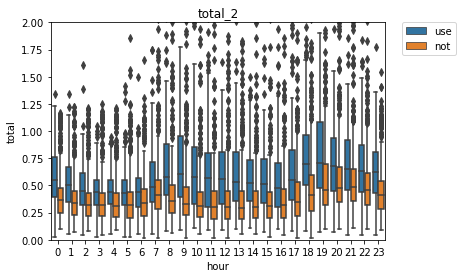

In [240]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_2, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_2')
plt.show()

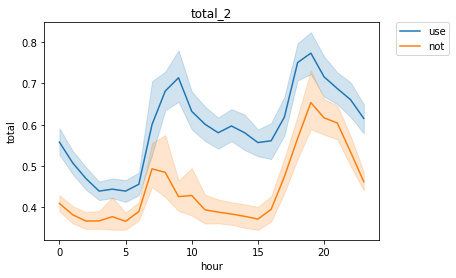

In [241]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_2, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_2')
plt.show()

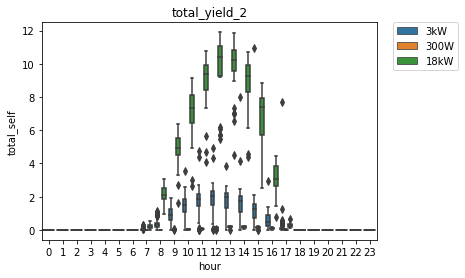

In [242]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_2')
plt.show()

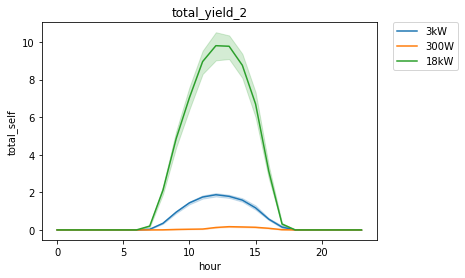

In [243]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_2')
plt.show()

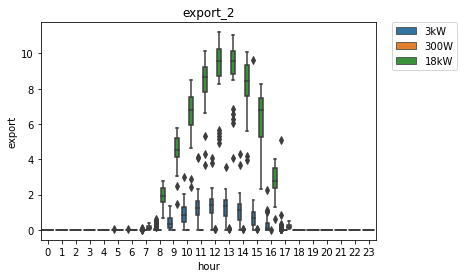

In [244]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_2')
plt.show()

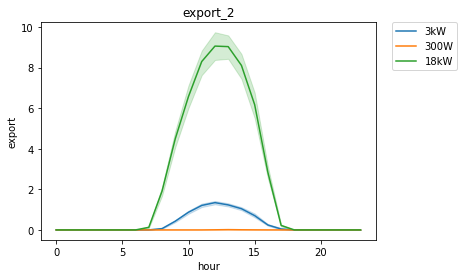

In [245]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_2')
plt.show()

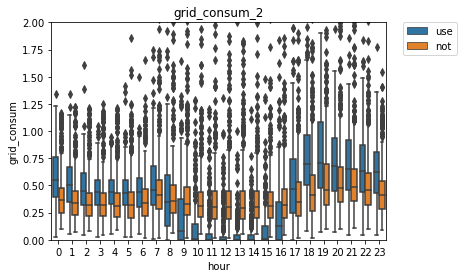

In [246]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_2, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_2')
plt.show()

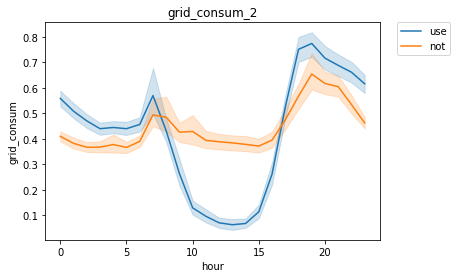

In [247]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_2, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_2')
plt.show()

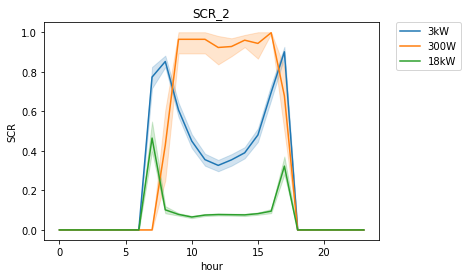

In [248]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_2')
plt.show()

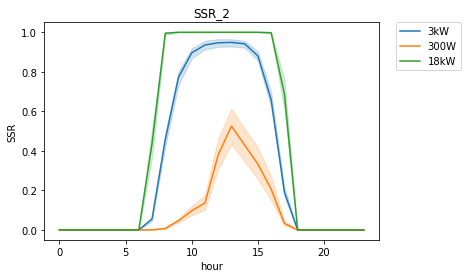

In [249]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_2')
plt.show()

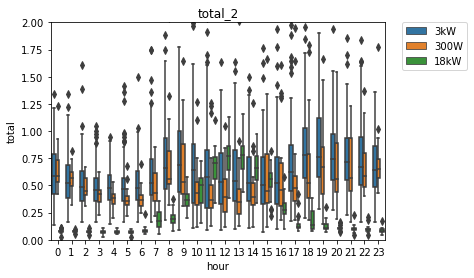

In [250]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_2')
plt.show()

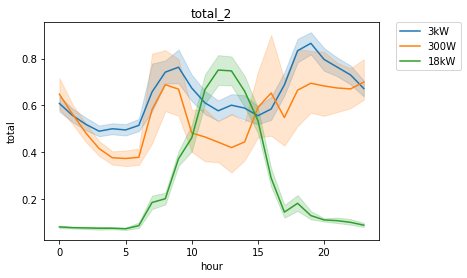

In [251]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_2')
plt.show()

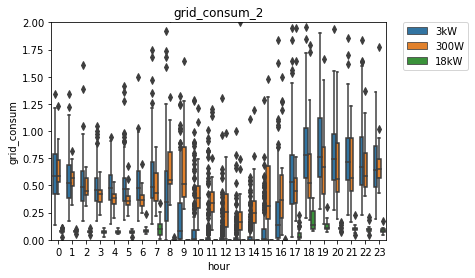

In [252]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_2')
plt.show()

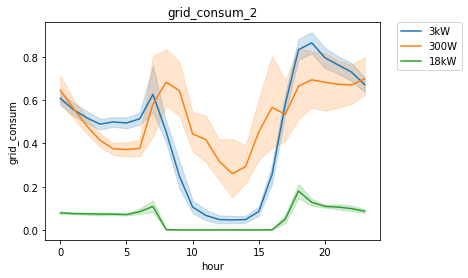

In [253]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_2, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_2')
plt.show()

<hr>

### 2022.03

In [254]:
df_all_hour_22_3 = df_all_hour[df_all_hour.ym == '2022/3']

In [255]:
# 총 전력 소비량
df_all_hour_22_3.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   511.0  0.378879  0.373469  0.079834  0.209961  0.330078  0.439941   
     1   513.0  0.341659  0.230773  0.059937  0.199951  0.300049  0.399902   
     2   513.0  0.338154  0.301088  0.059937  0.199951  0.290039  0.390137   
     3   516.0  0.325527  0.225087  0.020020  0.189941  0.280029  0.389893   
     4   517.0  0.323115  0.219471  0.069946  0.180054  0.280029  0.380127   
     5   513.0  0.331498  0.266168  0.040039  0.180176  0.290039  0.399902   
     6   515.0  0.392923  0.659524  0.020020  0.209961  0.310059  0.445068   
     7   518.0  0.407259  0.223520  0.010010  0.270020  0.369934  0.500000   
     8   522.0  0.357239  0.239117  0.010010  0.209961  0.300049  0.429932   
     9   522.0  0.340614  0.634182  0.020020  0.179993  0.270020  0.390076   
     10  523.0  0.303511  0.210856  0.020020  0.169922  0.260010  0.385010   
     11  522.0  0.292305  0.201728  0.020020  0.149902  0.250000  0.380127   
     12  519.0  0.321580  0.467295  0.029907  0.160156  0.259766  0.380005   
     13  522.0  0.297309  0.209378  0.039917  0.159912  0.250000  0.379883   
     14  517.0  0.305244  0.264350  0.020020  0.159912  0.250000  0.369873   
     15  518.0  0.309163  0.317877  0.019897  0.160065  0.260010  0.350098   
     16  516.0  0.325378  0.288263  0.020020  0.179932  0.270020  0.370117   
     17  512.0  0.389927  0.408853  0.020020  0.199951  0.280029  0.450195   
     18  512.0  0.459915  0.411807  0.020020  0.229980  0.350098  0.550049   
     19  513.0  0.580802  1.240528  0.040039  0.280029  0.410034  0.570068   
     20  512.0  0.545724  0.444678  0.040039  0.310059  0.449951  0.580078   
     21  511.0  0.527417  0.453881  0.109985  0.334961  0.449951  0.595093   
     22  515.0  0.476295  0.309810  0.080078  0.290039  0.429932  0.569946   
     23  512.0  0.407517  0.262229  0.050049  0.239990  0.370117  0.489990   
use  0   307.0  0.497953  0.348891  0.049988  0.300049  0.459961  0.649902   
     1   305.0  0.451510  0.260346  0.049988  0.290039  0.439941  0.589844   
     2   308.0  0.417080  0.218007  0.040039  0.277344  0.420166  0.549805   
     3   306.0  0.392123  0.183568  0.049988  0.270020  0.399902  0.527344   
     4   304.0  0.389996  0.193260  0.039978  0.260010  0.390137  0.520020   
     5   308.0  0.381390  0.191286  0.049988  0.250000  0.380127  0.500000   
     6   304.0  0.420098  0.259232  0.059998  0.239990  0.399902  0.539856   
     7   306.0  0.571929  0.386461  0.049500  0.320068  0.489990  0.689697   
     8   305.0  0.606671  0.332906  0.080078  0.359863  0.550293  0.769531   
     9   305.0  0.523378  0.300103  0.080078  0.309784  0.470215  0.680420   
     10  303.0  0.471716  0.277155  0.079834  0.239990  0.420166  0.634766   
     11  304.0  0.468047  0.305942  0.070068  0.240234  0.390137  0.630127   
     12  305.0  0.528203  0.585522  0.109991  0.260254  0.429932  0.669678   
     13  305.0  0.470194  0.273168  0.060059  0.260010  0.410156  0.629639   
     14  307.0  0.465884  0.258366  0.089844  0.260132  0.410156  0.619888   
     15  303.0  0.442946  0.252769  0.070312  0.249878  0.389648  0.565186   
     16  303.0  0.458155  0.259406  0.079041  0.271484  0.400146  0.580185   
     17  305.0  0.509326  0.308057  0.060791  0.290161  0.440186  0.650391   
     18  305.0  0.656118  0.352354  0.069336  0.409912  0.609619  0.850098   
     19  305.0  0.676948  0.386686  0.079956  0.380005  0.640137  0.890137   
     20  306.0  0.660500  0.376159  0.049988  0.389709  0.615112  0.899902   
     21  305.0  0.638519  0.374816  0.049988  0.379883  0.590088  0.850098   
     22  304.0  0.601991  0.339448  0.049988  0.359985  0.579834  0.779846   
     23  306.0  0.540945  0.315846  0.049988  0.319977  0.510010  0.700195   

               max  
type 시간             
not  0    6.800049  
     1    2.089844  
     2    5.060059  
   

In [256]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_22_3_use = df_all_hour_22_3[df_all_hour_22_3.type == 'use']
df_all_hour_22_3_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.079352  0.015263  0.049988  0.069977  0.080017   
         1    31.0  0.080005  0.013905  0.049988  0.070007  0.080017   
         2    31.0  0.071612  0.015933  0.040039  0.059998  0.070007   
         3    31.0  0.070647  0.013895  0.049988  0.059998  0.070007   
         4    31.0  0.064839  0.012882  0.039978  0.055023  0.059998   
         5    31.0  0.069675  0.011399  0.049988  0.059998  0.070007   
         6    31.0  0.116908  0.057697  0.059998  0.079956  0.090027   
         7    31.0  0.237866  0.079747  0.049500  0.185669  0.250000   
         8    31.0  0.225655  0.072580  0.080078  0.180664  0.230469   
         9    31.0  0.433428  0.175146  0.109375  0.304688  0.492188   
         10   31.0  0.525202  0.226851  0.080078  0.390625  0.589844   
         11   31.0  0.578062  0.252022  0.087891  0.419922  0.611328   
         12   31.0  0.764932  0.270861  0.208984  0.540039  0.791016   
         13   31.0  0.535233  0.258843  0.109375  0.356445  0.539062   
         14   31.0  0.613809  0.294853  0.089844  0.339844  0.708984   
         15   31.0  0.401989  0.209138  0.070312  0.230469  0.398438   
         16   31.0  0.324276  0.143333  0.079041  0.250000  0.340271   
         17   31.0  0.158321  0.094237  0.060791  0.109375  0.130859   
         18   31.0  0.174820  0.052566  0.069336  0.134552  0.179993   
         19   31.0  0.134520  0.052907  0.079956  0.100037  0.119995   
         20   31.0  0.122576  0.044270  0.049988  0.099976  0.110046   
         21   30.0  0.111003  0.047518  0.049988  0.089981  0.099976   
         22   31.0  0.097416  0.047809  0.049988  0.070007  0.089966   
         23   31.0  0.083547  0.039537  0.049988  0.059998  0.079956   
300W     0    31.0  0.588757  0.203998  0.109863  0.450195  0.610352   
         1    31.0  0.511640  0.166766  0.110352  0.425293  0.479980   
         2    31.0  0.449361  0.133520  0.089844  0.394775  0.469727   
         3    31.0  0.420961  0.144847  0.100098  0.330078  0.430176   
         4    31.0  0.374165  0.122490  0.159668  0.294922  0.349609   
         5    31.0  0.350350  0.092734  0.160156  0.285156  0.330078   
         6    31.0  0.348743  0.106403  0.100098  0.275146  0.339844   
         7    31.0  0.552566  0.313449  0.089844  0.400024  0.489746   
         8    31.0  0.734148  0.397405  0.109863  0.475082  0.599823   
         9    31.0  0.524050  0.387576  0.110086  0.249847  0.360321   
         10   31.0  0.441237  0.330828  0.100311  0.214890  0.299774   
         11   31.0  0.529076  0.473304  0.109770  0.225072  0.350220   
         12   31.0  0.386466  0.223518  0.109991  0.234939  0.359923   
         13   31.0  0.422196  0.250779  0.129999  0.214970  0.350067   
         14   31.0  0.400324  0.208067  0.119990  0.229864  0.389923   
         15   31.0  0.388348  0.213043  0.100001  0.239771  0.350189   
         16   31.0  0.361994  0.177003  0.100002  0.230092  0.300262   
         17   31.0  0.472896  0.322715  0.139781  0.270142  0.400085   
         18   31.0  0.540328  0.391405  0.120361  0.294907  0.459961   
         19   31.0  0.599373  0.412081  0.109863  0.290283  0.509766   
         20   31.0  0.683436  0.362686  0.090332  0.410156  0.690430   
         21   31.0  0.723507  0.335584  0.119629  0.514893  0.639648   
         22   31.0  0.672253  0.257105  0.090332  0.534912  0.620117   
         23   31.0  0.649036  0.200692  0.109863  0.530029  0.660156   
3kW      0   245.0  0.539429  0.349961  0.149902  0.339966  0.479980   
         1   243.0  0.491233  0.248890  0.140137  0.320068  0.459961   
         2   246.0  0.456546  0.201354  0.139893  0.309937  0.439941   
         3   244.0  0.429302  0.158122  0.140137  0.300049  0.420166   
         4   242.0  0.433676  0.171819  0.140015  0.299957  0.430176   
         5   246.0  0.424583  0.174617  0.149902  0.2

In [257]:
# 총 전력 생산량
df_all_hour_22_3_use = df_all_hour_22_3[df_all_hour_22_3.type == 'use']
df_all_hour_22_3_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.019846  0.036935  0.000000  0.000000  0.000000   
         7    31.0  0.741683  0.528355  0.000000  0.304688  0.701172   
         8    31.0  2.592553  1.336604  0.031250  1.324219  3.029297   
         9    31.0  4.715348  2.341365  0.378906  2.665039  5.859375   
         10   31.0  6.855406  2.843355  0.521484  5.455078  7.798828   
         11   31.0  7.661605  3.423673  0.419922  5.649414  8.929688   
         12   31.0  8.310736  3.292364  0.919922  6.250977  8.988281   
         13   31.0  7.913432  3.647822  0.480469  5.310547  9.259766   
         14   31.0  6.894279  3.570532  0.310547  3.535156  8.339844   
         15   31.0  5.323715  2.884485  0.210938  2.785156  5.710938   
         16   31.0  3.284841  1.601352  0.068359  1.975586  4.070312   
         17   31.0  0.647429  0.374743  0.019531  0.365234  0.648438   
         18   31.0  0.030494  0.048579  0.000000  0.000000  0.009766   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.002903  0.005289  0.000000  0.000000  0.000000   
         8    31.0  0.015807  0.012047  0.000000  0.009979  0.019989   
         9    31.0  0.038549  0.016494  0.009979  0.029999  0.040009   
         10   31.0  0.055164  0.024477  0.010010  0.035004  0.059998   
         11   31.0  0.074192  0.037213  0.019989  0.035019  0.079987   
         12   31.0  0.136777  0.070065  0.000000  0.065002  0.160004   
         13   31.0  0.151934  0.081133  0.000000  0.065002  0.169983   
         14   31.0  0.147097  0.088475  0.000000  0.050003  0.179993   
         15   31.0  0.124191  0.077061  0.000000  0.050003  0.139984   
         16   31.0  0.092260  0.059820  0.009979  0.029999  0.089996   
         17   31.0  0.041286  0.033440  0.000000  0.014999  0.029999   
         18   31.0  0.001613  0.003738  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

In [258]:
# 총 전력 수출량
df_all_hour_22_3_use = df_all_hour_22_3[df_all_hour_22_3.type == 'use']
df_all_hour_22_3_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.009388  0.022019  0.000000  0.000000  0.000000   
         7    31.0  0.569304  0.456952  0.000000  0.208984  0.490234   
         8    31.0  2.376575  1.277084  0.000000  1.149414  2.759766   
         9    31.0  4.282888  2.172914  0.269531  2.410156  5.359375   
         10   31.0  6.330204  2.630398  0.441406  5.029297  7.208984   
         11   31.0  7.083543  3.189811  0.320312  5.169922  8.250000   
         12   31.0  7.545804  3.037080  0.638672  5.685547  8.140625   
         13   31.0  7.378843  3.431820  0.310547  4.954102  8.669922   
         14   31.0  6.281439  3.285587  0.191406  3.219727  7.548828   
         15   31.0  4.922694  2.693441  0.138672  2.594727  5.210938   
         16   31.0  2.963143  1.477520  0.029297  1.695312  3.650391   
         17   31.0  0.515562  0.332984  0.000000  0.220703  0.531250   
         18   31.0  0.016318  0.032497  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    31.0  0.000323  0.001796  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.002903  0.009016  0.000000  0.000000  0.000000   
         12   31.0  0.012581  0.030107  0.000000  0.000000  0.000000   
         13   31.0  0.014516  0.032643  0.000000  0.000000  0.000000   
         14   31.0  0.014194  0.033344  0.000000  0.000000  0.000000   
         15   31.0  0.012903  0.030132  0.000000  0.000000  0.000000   
         16   31.0  0.006129  0.020113  0.000000  0.000000  0.000000   
         17   31.0  0.000645  0.002497  0.000000  0.000000  0.000000   
         18   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

In [259]:
# 총 그리드 소비량
df_all_hour_22_3.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   511.0  0.378879  0.373469  0.079834  0.209961  0.330078  0.439941   
     1   513.0  0.341659  0.230773  0.059937  0.199951  0.300049  0.399902   
     2   513.0  0.338154  0.301088  0.059937  0.199951  0.290039  0.390137   
     3   516.0  0.325527  0.225087  0.020020  0.189941  0.280029  0.389893   
     4   517.0  0.323115  0.219471  0.069946  0.180054  0.280029  0.380127   
     5   513.0  0.331498  0.266168  0.040039  0.180176  0.290039  0.399902   
     6   515.0  0.392923  0.659524  0.020020  0.209961  0.310059  0.445068   
     7   518.0  0.407259  0.223520  0.010010  0.270020  0.369934  0.500000   
     8   522.0  0.357239  0.239117  0.010010  0.209961  0.300049  0.429932   
     9   522.0  0.340614  0.634182  0.020020  0.179993  0.270020  0.390076   
     10  523.0  0.303511  0.210856  0.020020  0.169922  0.260010  0.385010   
     11  522.0  0.292305  0.201728  0.020020  0.149902  0.250000  0.380127   
     12  519.0  0.321580  0.467295  0.029907  0.160156  0.259766  0.380005   
     13  522.0  0.297309  0.209378  0.039917  0.159912  0.250000  0.379883   
     14  517.0  0.305244  0.264350  0.020020  0.159912  0.250000  0.369873   
     15  518.0  0.309163  0.317877  0.019897  0.160065  0.260010  0.350098   
     16  516.0  0.325378  0.288263  0.020020  0.179932  0.270020  0.370117   
     17  512.0  0.389927  0.408853  0.020020  0.199951  0.280029  0.450195   
     18  512.0  0.459915  0.411807  0.020020  0.229980  0.350098  0.550049   
     19  513.0  0.580802  1.240528  0.040039  0.280029  0.410034  0.570068   
     20  512.0  0.545724  0.444678  0.040039  0.310059  0.449951  0.580078   
     21  511.0  0.527417  0.453881  0.109985  0.334961  0.449951  0.595093   
     22  515.0  0.476295  0.309810  0.080078  0.290039  0.429932  0.569946   
     23  512.0  0.407517  0.262229  0.050049  0.239990  0.370117  0.489990   
use  0   307.0  0.497953  0.348891  0.049988  0.300049  0.459961  0.649902   
     1   305.0  0.451510  0.260346  0.049988  0.290039  0.439941  0.589844   
     2   308.0  0.417080  0.218007  0.040039  0.277344  0.420166  0.549805   
     3   306.0  0.392123  0.183568  0.049988  0.270020  0.399902  0.527344   
     4   304.0  0.389996  0.193260  0.039978  0.260010  0.390137  0.520020   
     5   308.0  0.381390  0.191286  0.049988  0.250000  0.380127  0.500000   
     6   304.0  0.415748  0.259354  0.029968  0.239990  0.395020  0.530029   
     7   306.0  0.463669  0.396857  0.000000  0.209961  0.390137  0.570007   
     8   305.0  0.328539  0.350769  0.000000  0.040039  0.229980  0.489746   
     9   305.0  0.168291  0.284881  0.000000  0.000000  0.029907  0.209961   
     10  303.0  0.107281  0.219013  0.000000  0.000000  0.000000  0.109863   
     11  304.0  0.094872  0.236813  0.000000  0.000000  0.000000  0.050049   
     12  305.0  0.111354  0.483224  0.000000  0.000000  0.000000  0.060059   
     13  305.0  0.082873  0.194366  0.000000  0.000000  0.000000  0.059570   
     14  307.0  0.081590  0.166181  0.000000  0.000000  0.000000  0.064941   
     15  303.0  0.103562  0.195550  0.000000  0.000000  0.009766  0.120117   
     16  303.0  0.166633  0.237326  0.000000  0.000000  0.050049  0.265015   
     17  305.0  0.363126  0.313859  0.000000  0.110107  0.299805  0.530029   
     18  305.0  0.645136  0.354713  0.040039  0.399902  0.589844  0.830078   
     19  305.0  0.676948  0.386686  0.079956  0.380005  0.640137  0.890137   
     20  306.0  0.660500  0.376159  0.049988  0.389709  0.615112  0.899902   
     21  305.0  0.638519  0.374816  0.049988  0.379883  0.590088  0.850098   
     22  304.0  0.601991  0.339448  0.049988  0.359985  0.579834  0.779846   
     23  306.0  0.540945  0.315846  0.049988  0.319977  0.510010  0.700195   

               max  
type 시간             
not  0    6.800049  
     1    2.089844  
     2    5.060059  
   

In [260]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_22_3_use = df_all_hour_22_3[df_all_hour_22_3.type == 'use']
df_all_hour_22_3_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.079352  0.015263  0.049988  0.069977  0.080017   
         1    31.0  0.080005  0.013905  0.049988  0.070007  0.080017   
         2    31.0  0.071612  0.015933  0.040039  0.059998  0.070007   
         3    31.0  0.070647  0.013895  0.049988  0.059998  0.070007   
         4    31.0  0.064839  0.012882  0.039978  0.055023  0.059998   
         5    31.0  0.069675  0.011399  0.049988  0.059998  0.070007   
         6    31.0  0.106449  0.051812  0.029968  0.079956  0.089966   
         7    31.0  0.065487  0.078189  0.000000  0.000000  0.039978   
         8    31.0  0.009677  0.040614  0.000000  0.000000  0.000000   
         9    31.0  0.000969  0.005393  0.000000  0.000000  0.000000   
         10   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   31.0  0.000644  0.003585  0.000000  0.000000  0.000000   
         14   31.0  0.000969  0.003966  0.000000  0.000000  0.000000   
         15   31.0  0.000969  0.005393  0.000000  0.000000  0.000000   
         16   31.0  0.002577  0.008542  0.000000  0.000000  0.000000   
         17   31.0  0.026454  0.063539  0.000000  0.000000  0.000000   
         18   31.0  0.160645  0.059602  0.040039  0.115021  0.169983   
         19   31.0  0.134520  0.052907  0.079956  0.100037  0.119995   
         20   31.0  0.122576  0.044270  0.049988  0.099976  0.110046   
         21   30.0  0.111003  0.047518  0.049988  0.089981  0.099976   
         22   31.0  0.097416  0.047809  0.049988  0.070007  0.089966   
         23   31.0  0.083547  0.039537  0.049988  0.059998  0.079956   
300W     0    31.0  0.588757  0.203998  0.109863  0.450195  0.610352   
         1    31.0  0.511640  0.166766  0.110352  0.425293  0.479980   
         2    31.0  0.449361  0.133520  0.089844  0.394775  0.469727   
         3    31.0  0.420961  0.144847  0.100098  0.330078  0.430176   
         4    31.0  0.374165  0.122490  0.159668  0.294922  0.349609   
         5    31.0  0.350350  0.092734  0.160156  0.285156  0.330078   
         6    31.0  0.348743  0.106403  0.100098  0.275146  0.339844   
         7    31.0  0.549663  0.312674  0.089844  0.395020  0.489746   
         8    31.0  0.718340  0.396359  0.089844  0.449951  0.580078   
         9    31.0  0.485824  0.391248  0.060059  0.214844  0.330078   
         10   31.0  0.386073  0.333165  0.069824  0.149902  0.259766   
         11   31.0  0.457787  0.480286  0.029785  0.145264  0.280273   
         12   31.0  0.262270  0.241813  0.000000  0.064941  0.250000   
         13   31.0  0.284778  0.257864  0.000000  0.050049  0.270020   
         14   31.0  0.267421  0.215327  0.000000  0.115234  0.240234   
         15   31.0  0.277060  0.236632  0.000000  0.095215  0.250000   
         16   31.0  0.275863  0.188501  0.000000  0.125000  0.259766   
         17   31.0  0.432255  0.330296  0.029785  0.235107  0.370117   
         18   31.0  0.538716  0.392843  0.110352  0.284912  0.459961   
         19   31.0  0.599373  0.412081  0.109863  0.290283  0.509766   
         20   31.0  0.683436  0.362686  0.090332  0.410156  0.690430   
         21   31.0  0.723507  0.335584  0.119629  0.514893  0.639648   
         22   31.0  0.672253  0.257105  0.090332  0.534912  0.620117   
         23   31.0  0.649036  0.200692  0.109863  0.530029  0.660156   
3kW      0   245.0  0.539429  0.349961  0.149902  0.339966  0.479980   
         1   243.0  0.491233  0.248890  0.140137  0.320068  0.459961   
         2   246.0  0.456546  0.201354  0.139893  0.309937  0.439941   
         3   244.0  0.429302  0.158122  0.140137  0.300049  0.420166   
         4   242.0  0.433676  0.171819  0.140015  0.299957  0.430176   
         5   246.0  0.424583  0.174617  0.149902  0.2

In [261]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_22_3_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.187636  0.332344  0.000000  0.000000  0.000000   
         7    31.0  0.323279  0.228197  0.000000  0.173685  0.279297   
         8    31.0  0.142371  0.190054  0.038627  0.069160  0.083993   
         9    31.0  0.108776  0.050967  0.073323  0.082899  0.090020   
         10   31.0  0.080404  0.020086  0.056452  0.074643  0.076494   
         11   31.0  0.082609  0.031714  0.053059  0.070613  0.076115   
         12   31.0  0.102888  0.044834  0.074203  0.082565  0.092553   
         13   31.0  0.078876  0.053857  0.038025  0.062827  0.066002   
         14   31.0  0.104629  0.055844  0.066949  0.078760  0.093041   
         15   31.0  0.095925  0.066769  0.045956  0.066524  0.077439   
         16   31.0  0.127467  0.094842  0.064272  0.085991  0.101674   
         17   31.0  0.279186  0.198286  0.093489  0.150061  0.203187   
         18   31.0  0.362266  0.404840  0.000000  0.000000  0.268293   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.258065  0.444803  0.000000  0.000000  0.000000   
         8    31.0  0.774194  0.425024  0.000000  1.000000  1.000000   
         9    31.0  0.991937  0.044893  0.750048  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  0.973657  0.076501  0.692247  1.000000  1.000000   
         12   31.0  0.906277  0.213359  0.000000  0.918062  1.000000   
         13   31.0  0.905658  0.214131  0.000000  0.937974  1.000000   
         14   31.0  0.906541  0.218214  0.000000  0.955537  1.000000   
         15   31.0  0.907238  0.214398  0.000000  0.904549  1.000000   
         16   31.0  0.965454  0.108532  0.526321  1.000000  1.000000   
         17   31.0  0.895928  0.299533  0.000000  1.000000  1.000000   
         18   31.0  0.161290  0.373878  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

In [262]:
# SSR(자가공급률)
df_all_hour_22_3_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.078359  0.148354  0.000000  0.000000  0.000000   
         7    31.0  0.706653  0.334282  0.000000  0.478642  0.806976   
         8    31.0  0.957278  0.166032  0.124393  1.000000  1.000000   
         9    31.0  0.996416  0.019956  0.888889  1.000000  1.000000   
         10   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   31.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   31.0  0.996609  0.018878  0.894889  1.000000  1.000000   
         14   31.0  0.993346  0.027819  0.856140  1.000000  1.000000   
         15   31.0  0.990530  0.052724  0.706444  1.000000  1.000000   
         16   31.0  0.975228  0.096893  0.494208  1.000000  1.000000   
         17   31.0  0.856652  0.249822  0.055876  0.787196  1.000000   
         18   31.0  0.102378  0.141323  0.000000  0.000000  0.044432   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    31.0  0.007845  0.018076  0.000000  0.000000  0.000000   
         8    31.0  0.033189  0.044199  0.000000  0.011007  0.023851   
         9    31.0  0.121614  0.104208  0.011771  0.038242  0.111036   
         10   31.0  0.194084  0.138430  0.015396  0.069117  0.172428   
         11   31.0  0.249692  0.210598  0.013326  0.078924  0.216165   
         12   31.0  0.430837  0.294309  0.000000  0.168446  0.395134   
         13   31.0  0.447246  0.329378  0.000000  0.187322  0.333461   
         14   31.0  0.425750  0.319393  0.000000  0.140724  0.354896   
         15   31.0  0.401358  0.328519  0.000000  0.129042  0.257499   
         16   31.0  0.318705  0.276857  0.015168  0.104200  0.222158   
         17   31.0  0.139290  0.176548  0.000000  0.028384  0.065190   
         18   31.0  0.008963  0.022279  0.000000  0.000000  0.000000   
         19   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   31.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   245.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   243.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   246.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   244.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   242.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   246.0  0.000000  0.000000  0.000000  0.0

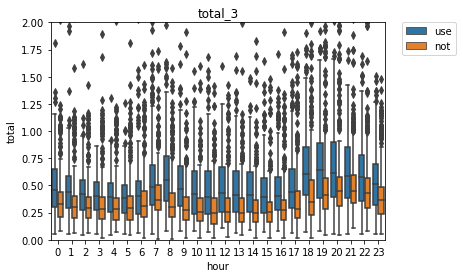

In [263]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_3, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_3')
plt.show()

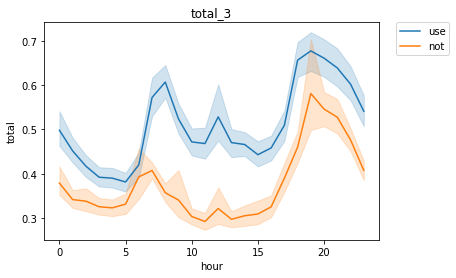

In [264]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_3, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_3')
plt.show()

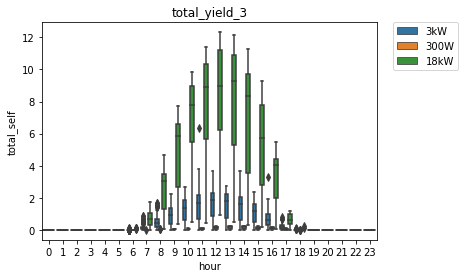

In [265]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_3')
plt.show()

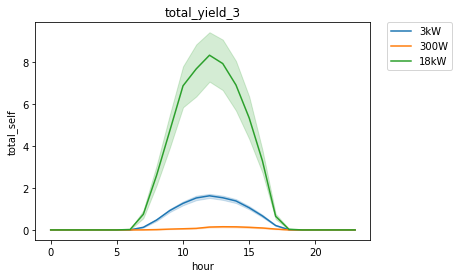

In [266]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_3')
plt.show()

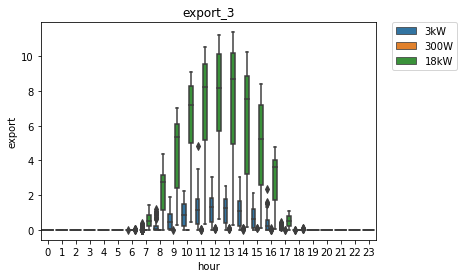

In [267]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_3')
plt.show()

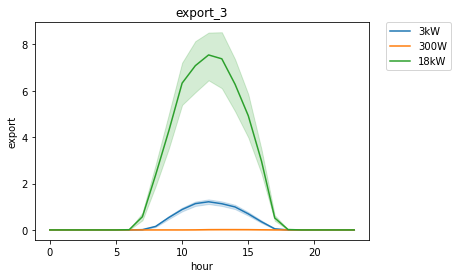

In [268]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_3')
plt.show()

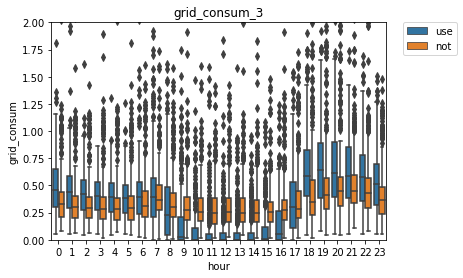

In [269]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_3, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_3')
plt.show()

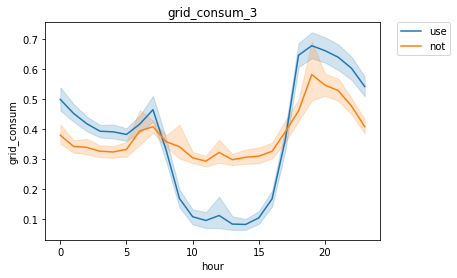

In [270]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_3, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_3')
plt.show()

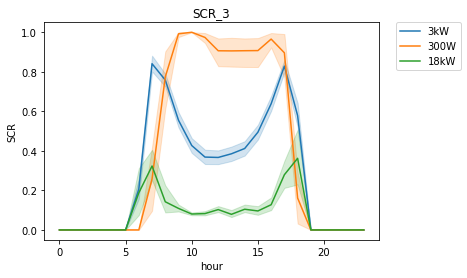

In [271]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_3')
plt.show()

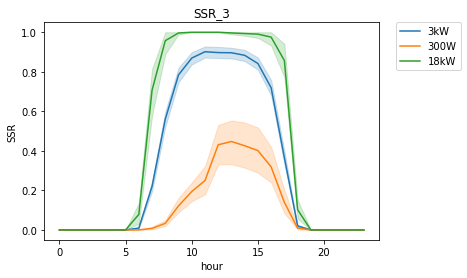

In [272]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_3')
plt.show()

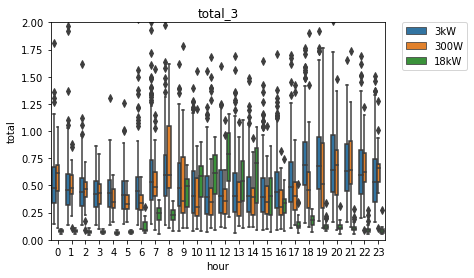

In [273]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_3')
plt.show()

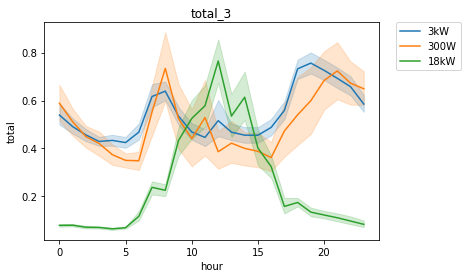

In [274]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_3')
plt.show()

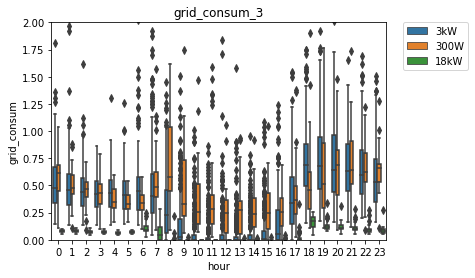

In [275]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_3')
plt.show()

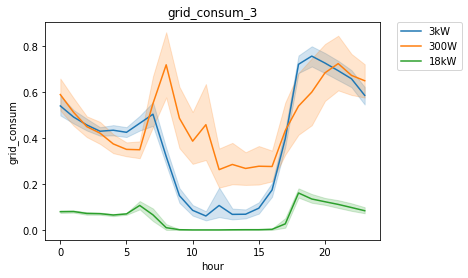

In [276]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_3, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_3')
plt.show()

<hr>

### 2022.04

In [277]:
df_all_hour_22_4 = df_all_hour[df_all_hour.ym == '2022/4']

In [278]:
# 총 전력 소비량
df_all_hour_22_4.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   486.0  0.328102  0.215158  0.040039  0.189941  0.279785  0.399902   
     1   492.0  0.354345  0.550788  0.049927  0.189941  0.260010  0.369629   
     2   492.0  0.303512  0.206978  0.050049  0.180176  0.260010  0.359863   
     3   488.0  0.295957  0.214842  0.030029  0.179932  0.250000  0.349670   
     4   492.0  0.298408  0.229734  0.039917  0.179932  0.250000  0.342529   
     5   491.0  0.307269  0.297143  0.040039  0.175049  0.250000  0.350098   
     6   489.0  0.345353  0.207400  0.020020  0.219971  0.290039  0.410156   
     7   488.0  0.388524  0.283686  0.029907  0.240173  0.340088  0.459961   
     8   492.0  0.338577  0.364880  0.039917  0.180176  0.280029  0.380127   
     9   491.0  0.315992  0.652136  0.020020  0.160156  0.250000  0.349854   
     10  487.0  0.298667  0.555172  0.039795  0.159912  0.239990  0.330078   
     11  492.0  0.282955  0.362856  0.029907  0.140137  0.225098  0.319824   
     12  490.0  0.268272  0.189406  0.049927  0.140137  0.229980  0.320068   
     13  491.0  0.268798  0.212438  0.050049  0.149902  0.229980  0.309692   
     14  493.0  0.262755  0.184696  0.049805  0.159912  0.229980  0.300049   
     15  493.0  0.278808  0.322126  0.049927  0.160156  0.229980  0.310059   
     16  485.0  0.285108  0.221603  0.040039  0.170166  0.240234  0.330078   
     17  490.0  0.329302  0.376195  0.029907  0.179932  0.250000  0.340088   
     18  488.0  0.372799  0.328427  0.040039  0.199951  0.300049  0.419983   
     19  485.0  0.430862  0.358840  0.050049  0.239990  0.340088  0.500000   
     20  489.0  0.488374  0.483556  0.059937  0.280029  0.379883  0.520020   
     21  480.0  0.472336  0.486414  0.050049  0.290039  0.380127  0.510010   
     22  485.0  0.410165  0.241983  0.049927  0.259766  0.359863  0.510010   
     23  485.0  0.360083  0.248676  0.030029  0.209961  0.300049  0.449707   
use  0   289.0  0.448436  0.300756  0.039978  0.280029  0.420166  0.600098   
     1   291.0  0.413125  0.214409  0.030029  0.260010  0.409912  0.540039   
     2   290.0  0.395030  0.202905  0.039978  0.250000  0.380127  0.527344   
     3   292.0  0.395542  0.233583  0.039978  0.250000  0.379883  0.510254   
     4   292.0  0.384113  0.194623  0.039978  0.250000  0.385010  0.509766   
     5   289.0  0.385248  0.209995  0.049988  0.250000  0.370117  0.500000   
     6   290.0  0.450627  0.328318  0.049805  0.260422  0.399780  0.539795   
     7   290.0  0.567046  0.351963  0.109863  0.319824  0.479980  0.719910   
     8   289.0  0.578131  0.339449  0.100098  0.349854  0.510010  0.739502   
     9   289.0  0.502070  0.283027  0.099854  0.280029  0.460205  0.671875   
     10  289.0  0.458674  0.263427  0.070312  0.250244  0.399902  0.629761   
     11  287.0  0.476321  0.334920  0.050537  0.250000  0.389648  0.609985   
     12  289.0  0.501981  0.337141  0.080078  0.250244  0.379883  0.699219   
     13  289.0  0.479609  0.339076  0.089844  0.260010  0.408203  0.610352   
     14  288.0  0.455088  0.270697  0.079834  0.259766  0.390381  0.582520   
     15  289.0  0.442655  0.296805  0.088806  0.250000  0.389893  0.560303   
     16  288.0  0.443344  0.283670  0.079773  0.240173  0.400146  0.549995   
     17  290.0  0.460342  0.311634  0.109863  0.230225  0.385010  0.580261   
     18  290.0  0.556270  0.371078  0.069763  0.299866  0.470093  0.757385   
     19  291.0  0.687464  0.422927  0.080017  0.390076  0.640137  0.915039   
     20  288.0  0.655556  0.431621  0.070007  0.370117  0.580078  0.870117   
     21  289.0  0.593916  0.328822  0.049988  0.360107  0.560059  0.790039   
     22  287.0  0.542134  0.285446  0.040039  0.349976  0.529785  0.739746   
     23  288.0  0.497890  0.280487  0.040039  0.290039  0.489990  0.662598   

               max  
type 시간             
not  0    2.229492  
     1    6.220703  
     2    2.060547  
   

In [279]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_22_4_use = df_all_hour_22_4[df_all_hour_22_4.type == 'use']
df_all_hour_22_4_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.057666  0.011047  0.039978  0.049988  0.055023   
         1    30.0  0.056000  0.013791  0.030029  0.049988  0.050049   
         2    29.0  0.059305  0.011313  0.039978  0.049988  0.059998   
         3    30.0  0.057003  0.017251  0.039978  0.042526  0.049988   
         4    30.0  0.061001  0.015169  0.039978  0.049988  0.059998   
         5    30.0  0.073059  0.012207  0.049988  0.070007  0.070007   
         6    30.0  0.143140  0.081602  0.049805  0.073242  0.125275   
         7    30.0  0.304631  0.065391  0.148926  0.263672  0.310547   
         8    30.0  0.336766  0.121553  0.128906  0.251953  0.339844   
         9    30.0  0.524740  0.197394  0.128906  0.473145  0.585938   
         10   30.0  0.640039  0.238536  0.121094  0.548340  0.699219   
         11   30.0  0.704036  0.244231  0.109375  0.587402  0.799805   
         12   30.0  0.855534  0.302785  0.099609  0.677246  0.929688   
         13   30.0  0.648893  0.261239  0.091797  0.541504  0.684570   
         14   30.0  0.704102  0.260232  0.130859  0.561523  0.769531   
         15   30.0  0.506215  0.191876  0.088806  0.388672  0.535156   
         16   30.0  0.423232  0.176211  0.079773  0.276367  0.470703   
         17   30.0  0.190365  0.053950  0.121094  0.152344  0.175781   
         18   30.0  0.149996  0.059954  0.069763  0.108810  0.149231   
         19   30.0  0.118990  0.025781  0.080017  0.099976  0.109985   
         20   29.0  0.104490  0.043716  0.070007  0.080017  0.090027   
         21   30.0  0.083006  0.016222  0.049988  0.079956  0.080017   
         22   30.0  0.065666  0.013814  0.040039  0.052536  0.064972   
         23   30.0  0.059003  0.010289  0.040039  0.049988  0.059998   
300W     0    23.0  0.548701  0.144093  0.319824  0.470215  0.520020   
         1    23.0  0.498302  0.146677  0.310059  0.380127  0.469727   
         2    23.0  0.470003  0.142109  0.250000  0.360107  0.459961   
         3    23.0  0.444378  0.126157  0.200195  0.385010  0.439941   
         4    23.0  0.400051  0.088579  0.209961  0.354980  0.419922   
         5    23.0  0.395699  0.082834  0.199707  0.349854  0.390137   
         6    23.0  0.420431  0.133889  0.209961  0.344727  0.399902   
         7    22.0  0.696818  0.289000  0.240234  0.522514  0.660004   
         8    23.0  0.932615  0.374868  0.280029  0.680054  0.919891   
         9    23.0  0.580913  0.422343  0.229919  0.395111  0.479919   
         10   23.0  0.509985  0.337960  0.200134  0.375061  0.410126   
         11   23.0  0.472868  0.331460  0.174946  0.309906  0.389984   
         12   23.0  0.490002  0.360772  0.180256  0.315201  0.379913   
         13   23.0  0.509131  0.394593  0.180023  0.324991  0.400187   
         14   23.0  0.395657  0.133693  0.170265  0.330185  0.360413   
         15   23.0  0.475227  0.295900  0.179767  0.290151  0.389954   
         16   23.0  0.479148  0.303071  0.179810  0.310135  0.409729   
         17   23.0  0.534815  0.271625  0.190094  0.335251  0.459839   
         18   23.0  0.562593  0.265431  0.199921  0.365097  0.540039   
         19   23.0  0.910390  0.495273  0.169922  0.529785  0.839844   
         20   23.0  0.827382  0.510019  0.169922  0.489990  0.759766   
         21   22.0  0.849121  0.363850  0.390137  0.531494  0.805176   
         22   22.0  0.752686  0.233688  0.409668  0.547485  0.744873   
         23   22.0  0.669589  0.217318  0.359863  0.515259  0.585205   
3kW      0   236.0  0.488338  0.294650  0.159912  0.320038  0.444946   
         1   238.0  0.449909  0.189800  0.159912  0.302551  0.439941   
         2   238.0  0.428692  0.181215  0.150146  0.290039  0.400024   
         3   239.0  0.433337  0.221568  0.100098  0.280029  0.400146   
         4   239.0  0.423137  0.175630  0.139893  0.290039  0.400146   
         5   236.0  0.423914  0.198567  0.150024  0.2

In [280]:
# 총 전력 생산량
df_all_hour_22_4_use = df_all_hour_22_4[df_all_hour_22_4.type == 'use']
df_all_hour_22_4_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%        50%  \
설비용량(kW) 시간                                                             
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         5    30.0  0.000391  0.002140  0.000000  0.000000   0.000000   
         6    30.0  0.276237  0.202493  0.000000  0.133301   0.225586   
         7    30.0  1.742122  0.755708  0.070312  1.639648   1.955078   
         8    30.0  3.987109  1.550701  0.380859  3.587891   4.725586   
         9    30.0  6.159701  2.431586  0.849609  5.601562   7.565430   
         10   30.0  7.843945  2.711108  0.861328  6.848145   9.214844   
         11   30.0  9.110807  2.957416  0.679688  8.265625  10.525391   
         12   30.0  9.289648  3.189080  0.429688  7.621094  10.860352   
         13   30.0  8.920833  3.172482  0.220703  7.682617  10.599609   
         14   30.0  8.118034  3.032949  0.710938  7.395020   8.980469   
         15   30.0  6.319401  2.593937  0.119141  4.784668   7.194336   
         16   30.0  4.516797  1.816593  0.009766  3.125488   5.390625   
         17   30.0  1.140885  0.430823  0.009766  0.919922   1.119141   
         18   30.0  0.193034  0.115604  0.000000  0.107422   0.201172   
         19   30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         20   29.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000   0.000000   
300W     0    23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         1    23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         2    23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         3    23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         4    23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         5    23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         6    23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         7    22.0  0.013179  0.006466  0.000000  0.009979   0.010010   
         8    23.0  0.026089  0.012696  0.009979  0.019989   0.020020   
         9    23.0  0.060002  0.018588  0.000000  0.055008   0.060028   
         10   23.0  0.056520  0.022685  0.020020  0.039993   0.050018   
         11   23.0  0.136526  0.040296  0.019989  0.134995   0.150024   
         12   23.0  0.196085  0.056304  0.010010  0.195007   0.219971   
         13   23.0  0.210001  0.057610  0.019989  0.215012   0.230011   
         14   23.0  0.200867  0.056962  0.029999  0.204987   0.220001   
         15   23.0  0.177393  0.055779  0.029999  0.170013   0.200012   
         16   23.0  0.136087  0.048966  0.010010  0.129990   0.150024   
         17   23.0  0.076086  0.032294  0.000000  0.055008   0.089996   
         18   23.0  0.015654  0.009451  0.000000  0.010010   0.019989   
         19   23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         20   23.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         21   22.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         22   22.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         23   22.0  0.000000  0.000000  0.000000  0.000000   0.000000   
3kW      0   236.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         1   238.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         2   238.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000   0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000   0.000000  

In [281]:
# 총 전력 수출량
df_all_hour_22_4_use = df_all_hour_22_4[df_all_hour_22_4.type == 'use']
df_all_hour_22_4_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    30.0  0.184766  0.149318  0.000000  0.084961  0.128906   
         7    30.0  1.462826  0.690193  0.000000  1.325684  1.549805   
         8    30.0  3.652344  1.449361  0.240234  3.250488  4.314453   
         9    30.0  5.634961  2.248790  0.718750  5.091797  6.840820   
         10   30.0  7.203906  2.489288  0.740234  6.250977  8.384766   
         11   30.0  8.406771  2.737146  0.570312  7.450684  9.625977   
         12   30.0  8.434115  2.916862  0.330078  6.895508  9.855469   
         13   30.0  8.271940  2.957146  0.128906  7.024902  9.810547   
         14   30.0  7.413932  2.791829  0.580078  6.665039  8.209961   
         15   30.0  5.814518  2.409164  0.070312  4.395996  6.574219   
         16   30.0  4.095898  1.662721  0.000000  2.824219  4.934570   
         17   30.0  0.958854  0.405253  0.000000  0.770020  0.930664   
         18   30.0  0.126042  0.097972  0.000000  0.072754  0.109375   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   23.0  0.000870  0.004170  0.000000  0.000000  0.000000   
         12   23.0  0.003913  0.011176  0.000000  0.000000  0.000000   
         13   23.0  0.005217  0.012746  0.000000  0.000000  0.000000   
         14   23.0  0.008696  0.017915  0.000000  0.000000  0.000000   
         15   23.0  0.003478  0.010706  0.000000  0.000000  0.000000   
         16   23.0  0.000435  0.002085  0.000000  0.000000  0.000000   
         17   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   236.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   238.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   238.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   236.0  0.000000  0.000000  0.000000  0.0

In [282]:
# 총 그리드 소비량
df_all_hour_22_4.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                      
not  0   486.0  0.328102  0.215158  0.040039  0.189941  0.279785  0.399902   
     1   492.0  0.354345  0.550788  0.049927  0.189941  0.260010  0.369629   
     2   492.0  0.303512  0.206978  0.050049  0.180176  0.260010  0.359863   
     3   488.0  0.295957  0.214842  0.030029  0.179932  0.250000  0.349670   
     4   492.0  0.298408  0.229734  0.039917  0.179932  0.250000  0.342529   
     5   491.0  0.307269  0.297143  0.040039  0.175049  0.250000  0.350098   
     6   489.0  0.345353  0.207400  0.020020  0.219971  0.290039  0.410156   
     7   488.0  0.388524  0.283686  0.029907  0.240173  0.340088  0.459961   
     8   492.0  0.338577  0.364880  0.039917  0.180176  0.280029  0.380127   
     9   491.0  0.315992  0.652136  0.020020  0.160156  0.250000  0.349854   
     10  487.0  0.298667  0.555172  0.039795  0.159912  0.239990  0.330078   
     11  492.0  0.282955  0.362856  0.029907  0.140137  0.225098  0.319824   
     12  490.0  0.268272  0.189406  0.049927  0.140137  0.229980  0.320068   
     13  491.0  0.268798  0.212438  0.050049  0.149902  0.229980  0.309692   
     14  493.0  0.262755  0.184696  0.049805  0.159912  0.229980  0.300049   
     15  493.0  0.278808  0.322126  0.049927  0.160156  0.229980  0.310059   
     16  485.0  0.285108  0.221603  0.040039  0.170166  0.240234  0.330078   
     17  490.0  0.329302  0.376195  0.029907  0.179932  0.250000  0.340088   
     18  488.0  0.372799  0.328427  0.040039  0.199951  0.300049  0.419983   
     19  485.0  0.430862  0.358840  0.050049  0.239990  0.340088  0.500000   
     20  489.0  0.488374  0.483556  0.059937  0.280029  0.379883  0.520020   
     21  480.0  0.472336  0.486414  0.050049  0.290039  0.380127  0.510010   
     22  485.0  0.410165  0.241983  0.049927  0.259766  0.359863  0.510010   
     23  485.0  0.360083  0.248676  0.030029  0.209961  0.300049  0.449707   
use  0   289.0  0.448436  0.300756  0.039978  0.280029  0.420166  0.600098   
     1   291.0  0.413125  0.214409  0.030029  0.260010  0.409912  0.540039   
     2   290.0  0.395030  0.202905  0.039978  0.250000  0.380127  0.527344   
     3   292.0  0.395542  0.233583  0.039978  0.250000  0.379883  0.510254   
     4   292.0  0.384113  0.194623  0.039978  0.250000  0.385010  0.509766   
     5   289.0  0.385172  0.210033  0.049988  0.250000  0.370117  0.500000   
     6   290.0  0.397858  0.334318  0.000000  0.219971  0.339844  0.479980   
     7   290.0  0.344176  0.374019  0.000000  0.050049  0.219971  0.520020   
     8   289.0  0.215014  0.358610  0.000000  0.000000  0.050049  0.270020   
     9   289.0  0.097094  0.218991  0.000000  0.000000  0.000000  0.080078   
     10  289.0  0.059410  0.168564  0.000000  0.000000  0.000000  0.010010   
     11  287.0  0.051593  0.156002  0.000000  0.000000  0.000000  0.010010   
     12  289.0  0.047887  0.147189  0.000000  0.000000  0.000000  0.010254   
     13  289.0  0.053008  0.185725  0.000000  0.000000  0.000000  0.009766   
     14  288.0  0.046972  0.122624  0.000000  0.000000  0.000000  0.010071   
     15  289.0  0.059900  0.150565  0.000000  0.000000  0.000000  0.020020   
     16  288.0  0.095478  0.201248  0.000000  0.000000  0.010010  0.080078   
     17  290.0  0.229743  0.287711  0.000000  0.020020  0.140137  0.350098   
     18  290.0  0.501912  0.377349  0.010010  0.239990  0.419922  0.717285   
     19  291.0  0.687017  0.422512  0.080017  0.390076  0.640137  0.915039   
     20  288.0  0.655556  0.431621  0.070007  0.370117  0.580078  0.870117   
     21  289.0  0.593916  0.328822  0.049988  0.360107  0.560059  0.790039   
     22  287.0  0.542134  0.285446  0.040039  0.349976  0.529785  0.739746   
     23  288.0  0.497890  0.280487  0.040039  0.290039  0.489990  0.662598   

               max  
type 시간             
not  0    2.229492  
     1    6.220703  
     2    2.060547  
   

In [283]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_22_4_use = df_all_hour_22_4[df_all_hour_22_4.type == 'use']
df_all_hour_22_4_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.057666  0.011047  0.039978  0.049988  0.055023   
         1    30.0  0.056000  0.013791  0.030029  0.049988  0.050049   
         2    29.0  0.059305  0.011313  0.039978  0.049988  0.059998   
         3    30.0  0.057003  0.017251  0.039978  0.042526  0.049988   
         4    30.0  0.061001  0.015169  0.039978  0.049988  0.059998   
         5    30.0  0.072668  0.011422  0.049988  0.070007  0.070007   
         6    30.0  0.051668  0.040781  0.000000  0.022461  0.045013   
         7    30.0  0.025334  0.069814  0.000000  0.000000  0.000000   
         8    30.0  0.002000  0.010954  0.000000  0.000000  0.000000   
         9    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   30.0  0.001333  0.007299  0.000000  0.000000  0.000000   
         16   30.0  0.002334  0.012782  0.000000  0.000000  0.000000   
         17   30.0  0.008333  0.033842  0.000000  0.000000  0.000000   
         18   30.0  0.083004  0.057964  0.010010  0.040039  0.059998   
         19   30.0  0.118990  0.025781  0.080017  0.099976  0.109985   
         20   29.0  0.104490  0.043716  0.070007  0.080017  0.090027   
         21   30.0  0.083006  0.016222  0.049988  0.079956  0.080017   
         22   30.0  0.065666  0.013814  0.040039  0.052536  0.064972   
         23   30.0  0.059003  0.010289  0.040039  0.049988  0.059998   
300W     0    23.0  0.548701  0.144093  0.319824  0.470215  0.520020   
         1    23.0  0.498302  0.146677  0.310059  0.380127  0.469727   
         2    23.0  0.470003  0.142109  0.250000  0.360107  0.459961   
         3    23.0  0.444378  0.126157  0.200195  0.385010  0.439941   
         4    23.0  0.400051  0.088579  0.209961  0.354980  0.419922   
         5    23.0  0.395699  0.082834  0.199707  0.349854  0.390137   
         6    23.0  0.420431  0.133889  0.209961  0.344727  0.399902   
         7    22.0  0.683638  0.288660  0.220215  0.505005  0.645020   
         8    23.0  0.906526  0.370919  0.270020  0.665039  0.899902   
         9    23.0  0.520911  0.418049  0.169922  0.359863  0.419922   
         10   23.0  0.453465  0.339896  0.160156  0.309814  0.350098   
         11   23.0  0.337211  0.328862  0.044922  0.155029  0.229980   
         12   23.0  0.297830  0.354264  0.010254  0.100098  0.169922   
         13   23.0  0.304348  0.387965  0.009766  0.100098  0.189941   
         14   23.0  0.203486  0.134502  0.010254  0.104980  0.160156   
         15   23.0  0.301312  0.283602  0.009766  0.114990  0.220215   
         16   23.0  0.343495  0.297472  0.040039  0.140137  0.279785   
         17   23.0  0.458730  0.276657  0.100098  0.260254  0.370117   
         18   23.0  0.546939  0.266342  0.169922  0.349854  0.520020   
         19   23.0  0.910390  0.495273  0.169922  0.529785  0.839844   
         20   23.0  0.827382  0.510019  0.169922  0.489990  0.759766   
         21   22.0  0.849121  0.363850  0.390137  0.531494  0.805176   
         22   22.0  0.752686  0.233688  0.409668  0.547485  0.744873   
         23   22.0  0.669589  0.217318  0.359863  0.515259  0.585205   
3kW      0   236.0  0.488338  0.294650  0.159912  0.320038  0.444946   
         1   238.0  0.449909  0.189800  0.159912  0.302551  0.439941   
         2   238.0  0.428692  0.181215  0.150146  0.290039  0.400024   
         3   239.0  0.433337  0.221568  0.100098  0.280029  0.400146   
         4   239.0  0.423137  0.175630  0.139893  0.290039  0.400146   
         5   236.0  0.423871  0.198551  0.150024  0.2

In [284]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_22_4_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.033333  0.182574  0.000000  0.000000  0.000000   
         6    30.0  0.368339  0.242586  0.000000  0.223485  0.347981   
         7    30.0  0.249193  0.246484  0.109811  0.130898  0.157745   
         8    30.0  0.099209  0.059225  0.061613  0.070087  0.082141   
         9    30.0  0.090145  0.019352  0.058044  0.079579  0.088009   
         10   30.0  0.083203  0.014978  0.058357  0.075414  0.078605   
         11   30.0  0.079843  0.018804  0.056178  0.071299  0.077491   
         12   30.0  0.097239  0.028689  0.057789  0.087386  0.093138   
         13   30.0  0.084930  0.064607  0.037172  0.061681  0.075681   
         14   30.0  0.092368  0.024147  0.056853  0.080997  0.090904   
         15   30.0  0.094172  0.061612  0.056360  0.077194  0.080658   
         16   30.0  0.126214  0.166583  0.062908  0.082841  0.088766   
         17   30.0  0.215019  0.194605  0.086189  0.128477  0.158701   
         18   30.0  0.359451  0.186901  0.000000  0.237537  0.345025   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    22.0  0.909091  0.294245  0.000000  1.000000  1.000000   
         8    23.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         9    23.0  0.956522  0.208514  0.000000  1.000000  1.000000   
         10   23.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   23.0  0.994204  0.027798  0.866685  1.000000  1.000000   
         12   23.0  0.982557  0.050451  0.772732  1.000000  1.000000   
         13   23.0  0.977991  0.053229  0.750020  0.959999  1.000000   
         14   23.0  0.960411  0.079702  0.695668  0.957426  1.000000   
         15   23.0  0.983701  0.048994  0.772728  1.000000  1.000000   
         16   23.0  0.997283  0.013032  0.937500  1.000000  1.000000   
         17   23.0  0.956522  0.208514  0.000000  1.000000  1.000000   
         18   23.0  0.869565  0.344350  0.000000  1.000000  1.000000   
         19   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   236.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   238.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   238.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   236.0  0.004237  0.065094  0.000000  0.0

In [285]:
# SSR(자가공급률)
df_all_hour_22_4_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    30.0  0.003842  0.021041  0.000000  0.000000  0.000000   
         6    30.0  0.585540  0.284050  0.000000  0.421753  0.606891   
         7    30.0  0.912374  0.216928  0.195267  1.000000  1.000000   
         8    30.0  0.990031  0.054600  0.700943  1.000000  1.000000   
         9    30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   30.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   30.0  0.984994  0.082190  0.549828  1.000000  1.000000   
         16   30.0  0.970747  0.160224  0.122418  1.000000  1.000000   
         17   30.0  0.949502  0.198429  0.054329  1.000000  1.000000   
         18   30.0  0.475008  0.231899  0.000000  0.282700  0.530207   
         19   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   29.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   30.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    22.0  0.022424  0.018111  0.000000  0.012195  0.018020   
         8    23.0  0.031074  0.016528  0.011609  0.018770  0.025999   
         9    23.0  0.125871  0.056875  0.000000  0.103583  0.130516   
         10   23.0  0.134489  0.065483  0.025646  0.094082  0.131594   
         11   23.0  0.363427  0.171898  0.051240  0.280556  0.375038   
         12   23.0  0.506880  0.237416  0.029433  0.438727  0.529158   
         13   23.0  0.522672  0.247982  0.057101  0.406408  0.549771   
         14   23.0  0.536106  0.221945  0.093735  0.385505  0.567318   
         15   23.0  0.452767  0.241760  0.093735  0.273523  0.389209   
         16   23.0  0.363708  0.223809  0.029433  0.232508  0.313670   
         17   23.0  0.181538  0.122737  0.000000  0.096773  0.151358   
         18   23.0  0.035280  0.032555  0.000000  0.017104  0.025641   
         19   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   23.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   22.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   236.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   238.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   238.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   239.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   236.0  0.000087  0.001334  0.000000  0.0

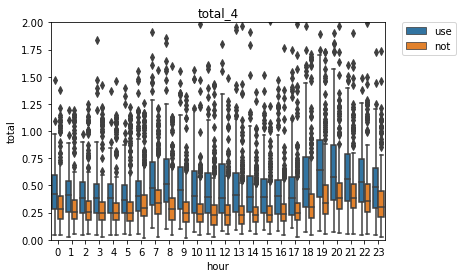

In [286]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_4, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_4')
plt.show()

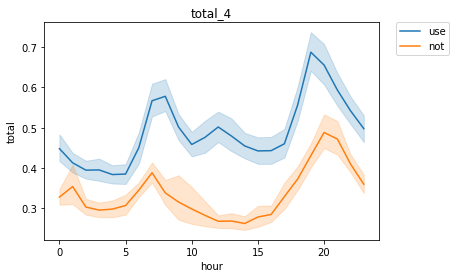

In [287]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_4, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_4')
plt.show()

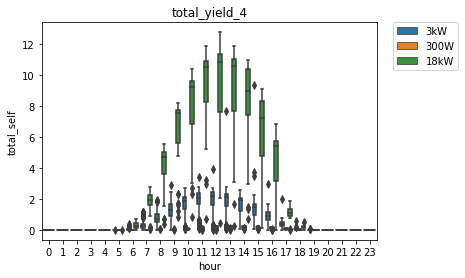

In [288]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_4')
plt.show()

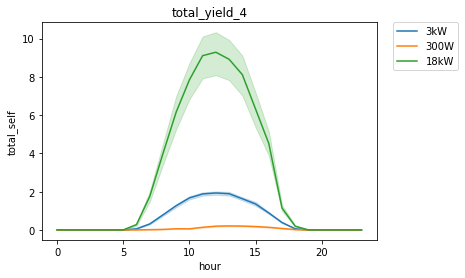

In [289]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_4')
plt.show()

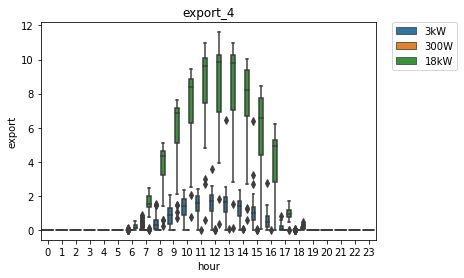

In [290]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_4')
plt.show()

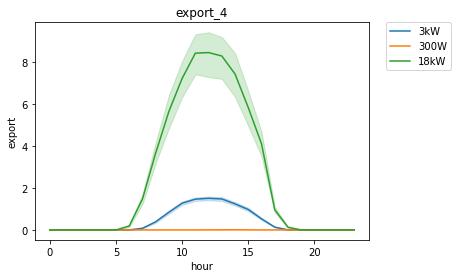

In [291]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_4')
plt.show()

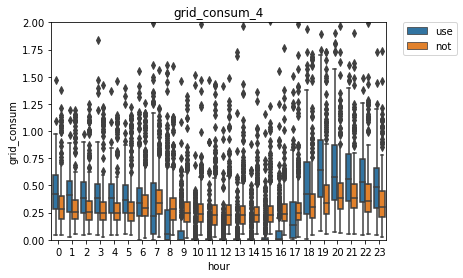

In [292]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_4, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_4')
plt.show()

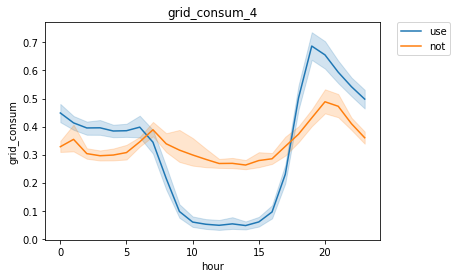

In [293]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_4, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_4')
plt.show()

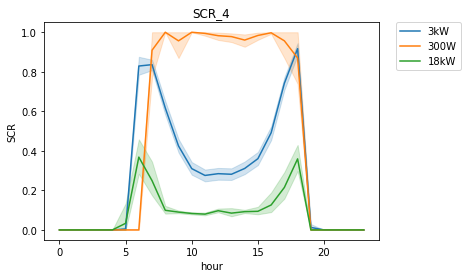

In [294]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_4')
plt.show()

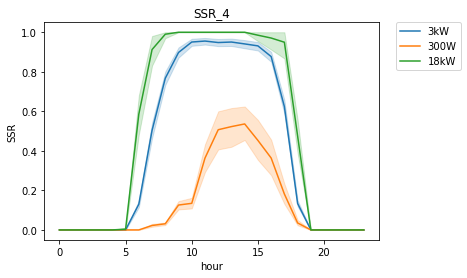

In [295]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_4')
plt.show()

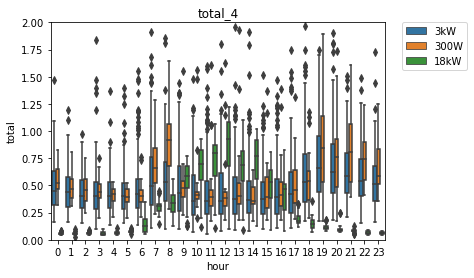

In [296]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_4')
plt.show()

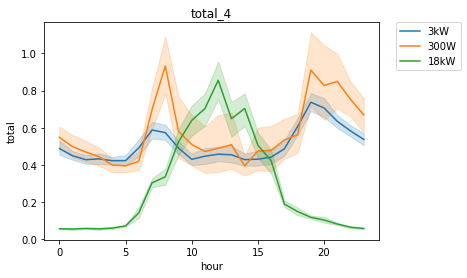

In [297]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_4')
plt.show()

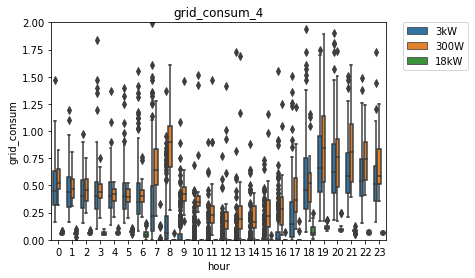

In [298]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_4')
plt.show()

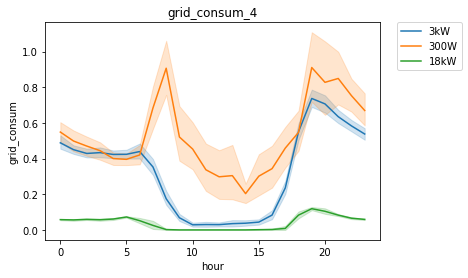

In [299]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_22_4, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_4')
plt.show()

<hr>

## **<계절>**

### 봄(Spring)

In [300]:
df_all_hour_spring = df_all_hour[(df_all_hour.ym == '2021/5') | (df_all_hour.ym == '2022/3') | (df_all_hour.ym == '2022/4')]

In [301]:
# 총 전력 소비량
df_all_hour_spring.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1503.0  0.350210  0.276857  0.040039  0.200012  0.300049  0.419952   
     1   1508.0  0.337503  0.378115  0.049927  0.190002  0.280029  0.379883   
     2   1509.0  0.313194  0.241680  0.050003  0.189941  0.269989  0.369995   
     3   1512.0  0.302024  0.210244  0.020020  0.179993  0.259766  0.359863   
     4   1520.0  0.301202  0.217620  0.039917  0.179932  0.250000  0.350098   
     5   1511.0  0.315187  0.364981  0.040009  0.179932  0.260010  0.369873   
     6   1514.0  0.354348  0.446386  0.020020  0.209961  0.290039  0.410156   
     7   1513.0  0.398955  0.281876  0.010010  0.259979  0.349976  0.470001   
     8   1524.0  0.346975  0.279728  0.010010  0.200012  0.290039  0.410156   
     9   1516.0  0.325727  0.553378  0.020020  0.179871  0.269653  0.369873   
     10  1519.0  0.311809  0.451241  0.020020  0.169922  0.250000  0.350098   
     11  1511.0  0.295305  0.281778  0.020020  0.150146  0.239990  0.359863   
     12  1513.0  0.314622  0.431726  0.020004  0.160004  0.250000  0.359863   
     13  1513.0  0.289012  0.249164  0.039917  0.160004  0.239990  0.340027   
     14  1515.0  0.288772  0.244951  0.020020  0.160004  0.240021  0.339844   
     15  1512.0  0.301355  0.319185  0.019897  0.169922  0.250000  0.339844   
     16  1498.0  0.314521  0.428743  0.020020  0.179993  0.260010  0.350098   
     17  1501.0  0.359261  0.360373  0.020020  0.190002  0.270020  0.399902   
     18  1499.0  0.413144  0.367371  0.020020  0.210022  0.319824  0.479980   
     19  1501.0  0.485509  0.780036  0.039993  0.259979  0.369873  0.540039   
     20  1502.0  0.503520  0.421611  0.040039  0.290039  0.409912  0.560059   
     21  1499.0  0.510501  0.572974  0.049988  0.309998  0.410156  0.560059   
     22  1508.0  0.440280  0.263483  0.049927  0.279999  0.390137  0.530029   
     23  1508.0  0.388733  0.314743  0.030029  0.219971  0.330078  0.469971   
use  0    903.0  0.462052  0.306796  0.039978  0.260010  0.439941  0.619934   
     1    898.0  0.423313  0.342783  0.030029  0.250000  0.400085  0.559952   
     2    901.0  0.390753  0.206069  0.039978  0.239990  0.380127  0.519958   
     3    904.0  0.379666  0.215439  0.039978  0.229980  0.369995  0.490234   
     4    897.0  0.368279  0.187448  0.039978  0.229980  0.360107  0.500000   
     5    902.0  0.375346  0.198885  0.049988  0.230019  0.369751  0.489990   
     6    898.0  0.422434  0.284495  0.049805  0.230042  0.379883  0.529953   
     7    896.0  0.547153  0.355865  0.049500  0.309967  0.459839  0.689941   
     8    896.0  0.595089  0.450834  0.080078  0.340088  0.529785  0.739777   
     9    896.0  0.503881  0.307024  0.080078  0.280273  0.450134  0.669724   
     10   896.0  0.454377  0.267042  0.070312  0.239922  0.390106  0.619324   
     11   893.0  0.459934  0.303682  0.050537  0.239990  0.380127  0.600098   
     12   898.0  0.494237  0.426846  0.079956  0.250000  0.390137  0.640121   
     13   897.0  0.465556  0.294844  0.060059  0.250000  0.399902  0.610352   
     14   897.0  0.446497  0.253842  0.026428  0.250000  0.390137  0.580078   
     15   895.0  0.443686  0.372494  0.070312  0.240204  0.370605  0.550293   
     16   899.0  0.456322  0.400387  0.079041  0.240234  0.389893  0.567444   
     17   902.0  0.470091  0.301549  0.060791  0.250000  0.400101  0.600007   
     18   902.0  0.578783  0.357391  0.069336  0.310059  0.510254  0.759949   
     19   903.0  0.653800  0.402322  0.079956  0.365112  0.579987  0.870117   
     20   896.0  0.640539  0.392967  0.049988  0.370117  0.580017  0.859863   
     21   898.0  0.610017  0.345883  0.049988  0.350029  0.579834  0.820312   
     22   895.0  0.569221  0.321390  0.040039  0.349976  0.540039  0.760010   
     23   898.0  0.519802  0.307419  0.040039  0.299835  0.489990  0.699951   

               max  
type 시간             
not  0    6.80004

In [302]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_spring_use = df_all_hour_spring[df_all_hour_spring.type == 'use']
df_all_hour_spring_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    92.0  0.071847  0.021172  0.039978  0.059998  0.070000   
         1    92.0  0.070871  0.020736  0.030029  0.059998  0.070000   
         2    91.0  0.069449  0.020620  0.039978  0.059998  0.070000   
         3    92.0  0.068697  0.021598  0.039978  0.059998  0.070000   
         4    92.0  0.069457  0.021453  0.039978  0.059998  0.070000   
         5    92.0  0.087864  0.037204  0.049988  0.070007  0.079956   
         6    92.0  0.140288  0.067103  0.049805  0.080750  0.130146   
         7    92.0  0.258739  0.079754  0.049500  0.201111  0.265625   
         8    92.0  0.303268  0.135970  0.080078  0.197266  0.285156   
         9    92.0  0.474968  0.200253  0.099609  0.306641  0.514648   
         10   92.0  0.565647  0.249087  0.080078  0.347168  0.589966   
         11   92.0  0.644239  0.274421  0.087891  0.467407  0.663086   
         12   92.0  0.770203  0.311574  0.099609  0.500000  0.829346   
         13   92.0  0.620013  0.276085  0.091797  0.416992  0.665039   
         14   92.0  0.637738  0.283272  0.089844  0.409912  0.713867   
         15   92.0  0.454460  0.212893  0.070312  0.280151  0.469727   
         16   92.0  0.366828  0.169722  0.079041  0.240234  0.371094   
         17   92.0  0.185954  0.075868  0.060791  0.138672  0.170044   
         18   92.0  0.170962  0.063409  0.069336  0.127380  0.160572   
         19   92.0  0.137726  0.046598  0.079956  0.109985  0.129997   
         20   91.0  0.122748  0.048534  0.049988  0.090027  0.110001   
         21   91.0  0.102200  0.036692  0.049988  0.080017  0.090027   
         22   92.0  0.085433  0.040499  0.040039  0.060005  0.070007   
         23   92.0  0.073370  0.028523  0.040039  0.059998  0.070000   
300W     0    85.0  0.572843  0.195770  0.109863  0.450195  0.550293   
         1    85.0  0.479081  0.164436  0.110352  0.380005  0.449707   
         2    85.0  0.426707  0.131928  0.089844  0.349976  0.430176   
         3    85.0  0.393653  0.137344  0.100098  0.290039  0.399902   
         4    85.0  0.360357  0.107800  0.159668  0.289978  0.350006   
         5    85.0  0.351784  0.096882  0.160156  0.270020  0.349609   
         6    85.0  0.372364  0.163573  0.100098  0.269958  0.350025   
         7    84.0  0.623685  0.332120  0.089844  0.400085  0.530136   
         8    85.0  0.864339  0.472637  0.109863  0.510223  0.859589   
         9    85.0  0.568197  0.396178  0.110086  0.329803  0.479950   
         10   85.0  0.462095  0.289409  0.100311  0.290012  0.399872   
         11   85.0  0.478203  0.368539  0.109770  0.270386  0.350002   
         12   85.0  0.424477  0.286122  0.109991  0.249989  0.340057   
         13   85.0  0.424448  0.295593  0.129999  0.269997  0.330006   
         14   85.0  0.375766  0.169904  0.119990  0.249979  0.349884   
         15   85.0  0.440930  0.316675  0.100001  0.259979  0.359997   
         16   85.0  0.453558  0.332446  0.100002  0.259995  0.350008   
         17   85.0  0.486183  0.278645  0.139781  0.309967  0.419891   
         18   85.0  0.559764  0.368921  0.120361  0.319824  0.469940   
         19   85.0  0.742465  0.447821  0.109863  0.359863  0.690002   
         20   85.0  0.765842  0.405898  0.090332  0.460022  0.690430   
         21   84.0  0.800708  0.332063  0.119629  0.539871  0.730011   
         22   84.0  0.787307  0.358635  0.090332  0.577148  0.707367   
         23   84.0  0.737273  0.297052  0.109863  0.549965  0.669922   
3kW      0   726.0  0.498528  0.300854  0.149902  0.309998  0.450012   
         1   721.0  0.461710  0.354205  0.140015  0.290039  0.429993   
         2   725.0  0.426867  0.190477  0.130005  0.280029  0.400146   
         3   727.0  0.417383  0.204420  0.100098  0.279999  0.390137   
         4   720.0  0.407397  0.171480  0.130005  0.270020  0.390137   
         5   725.0  0.414589  0.189350  0.129944  0.2

In [303]:
# 총 전력 생산량
df_all_hour_spring_use = df_all_hour_spring[df_all_hour_spring.type == 'use']
df_all_hour_spring_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.006013  0.019622  0.000000  0.000000  0.000000   
         6    92.0  0.294577  0.334158  0.000000  0.000000  0.145264   
         7    92.0  1.481366  0.971151  0.000000  0.592285  1.594971   
         8    92.0  3.433949  1.800845  0.031250  1.809937  3.535156   
         9    92.0  5.507356  2.636137  0.339844  3.132324  6.286133   
         10   92.0  7.096022  3.061208  0.521484  4.547119  8.049805   
         11   92.0  8.269818  3.461628  0.419922  6.218750  9.864502   
         12   92.0  8.592715  3.399082  0.429688  6.376831  9.825195   
         13   92.0  8.293287  3.484497  0.220703  6.424805  9.685547   
         14   92.0  7.401898  3.420673  0.310547  5.050293  8.890625   
         15   92.0  5.739544  2.872697  0.119141  4.093262  6.375000   
         16   92.0  3.837641  1.985030  0.009766  2.179688  4.145508   
         17   92.0  1.058005  0.577001  0.009766  0.724609  1.095703   
         18   92.0  0.200700  0.206875  0.000000  0.009766  0.140625   
         19   92.0  0.000663  0.002526  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    85.0  0.001529  0.004227  0.000000  0.000000  0.000000   
         7    84.0  0.010476  0.010049  0.000000  0.000000  0.009998   
         8    85.0  0.023412  0.015701  0.000000  0.010010  0.020000   
         9    85.0  0.052883  0.025005  0.000000  0.029999  0.059998   
         10   85.0  0.069530  0.035787  0.010010  0.040009  0.069977   
         11   85.0  0.105765  0.050152  0.019989  0.070007  0.119995   
         12   85.0  0.158589  0.071515  0.000000  0.100006  0.190002   
         13   85.0  0.167412  0.080655  0.000000  0.100002  0.209991   
         14   85.0  0.162352  0.081615  0.000000  0.090000  0.209991   
         15   85.0  0.140823  0.075044  0.000000  0.059998  0.170013   
         16   85.0  0.104942  0.061211  0.000000  0.040001  0.119995   
         17   85.0  0.057998  0.039303  0.000000  0.019989  0.059998   
         18   85.0  0.014000  0.016125  0.000000  0.000000  0.010002   
         19   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   726.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   725.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   727.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   720.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   725.0  0.001601  0.005388  0.000000  0.0

In [304]:
# 총 전력 수출량
df_all_hour_spring_use = df_all_hour_spring[df_all_hour_spring.type == 'use']
df_all_hour_spring_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.002280  0.011582  0.000000  0.000000  0.000000   
         6    92.0  0.219398  0.272045  0.000000  0.000000  0.099609   
         7    92.0  1.255562  0.899783  0.000000  0.412109  1.315308   
         8    92.0  3.135464  1.678543  0.000000  1.552734  3.200195   
         9    92.0  5.032824  2.448237  0.229980  2.750977  5.774414   
         10   92.0  6.530374  2.826465  0.441406  4.202881  7.485352   
         11   92.0  7.625579  3.210399  0.320312  5.725098  9.220703   
         12   92.0  7.822512  3.116505  0.330078  5.842285  8.985352   
         13   92.0  7.673491  3.249273  0.128906  6.085449  9.066406   
         14   92.0  6.764487  3.162064  0.191406  4.545044  8.120117   
         15   92.0  5.287584  2.673041  0.070312  3.799805  5.799805   
         16   92.0  3.473856  1.832636  0.000000  1.984375  3.785156   
         17   92.0  0.887812  0.527607  0.000000  0.528320  0.890625   
         18   92.0  0.131369  0.155465  0.000000  0.000000  0.084961   
         19   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    85.0  0.000118  0.001085  0.000000  0.000000  0.000000   
         10   85.0  0.000118  0.001085  0.000000  0.000000  0.000000   
         11   85.0  0.001647  0.006699  0.000000  0.000000  0.000000   
         12   85.0  0.007882  0.021442  0.000000  0.000000  0.000000   
         13   85.0  0.009647  0.023525  0.000000  0.000000  0.000000   
         14   85.0  0.010471  0.025303  0.000000  0.000000  0.000000   
         15   85.0  0.007412  0.020996  0.000000  0.000000  0.000000   
         16   85.0  0.002706  0.012760  0.000000  0.000000  0.000000   
         17   85.0  0.000235  0.001525  0.000000  0.000000  0.000000   
         18   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   726.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   725.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   727.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   720.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   725.0  0.000000  0.000000  0.000000  0.0

In [305]:
# 총 그리드 소비량
df_all_hour_spring.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1503.0  0.350210  0.276857  0.040039  0.200012  0.300049  0.419952   
     1   1508.0  0.337503  0.378115  0.049927  0.190002  0.280029  0.379883   
     2   1509.0  0.313194  0.241680  0.050003  0.189941  0.269989  0.369995   
     3   1512.0  0.302024  0.210244  0.020020  0.179993  0.259766  0.359863   
     4   1520.0  0.301202  0.217620  0.039917  0.179932  0.250000  0.350098   
     5   1511.0  0.315187  0.364981  0.040009  0.179932  0.260010  0.369873   
     6   1514.0  0.354348  0.446386  0.020020  0.209961  0.290039  0.410156   
     7   1513.0  0.398955  0.281876  0.010010  0.259979  0.349976  0.470001   
     8   1524.0  0.346975  0.279728  0.010010  0.200012  0.290039  0.410156   
     9   1516.0  0.325727  0.553378  0.020020  0.179871  0.269653  0.369873   
     10  1519.0  0.311809  0.451241  0.020020  0.169922  0.250000  0.350098   
     11  1511.0  0.295305  0.281778  0.020020  0.150146  0.239990  0.359863   
     12  1513.0  0.314622  0.431726  0.020004  0.160004  0.250000  0.359863   
     13  1513.0  0.289012  0.249164  0.039917  0.160004  0.239990  0.340027   
     14  1515.0  0.288772  0.244951  0.020020  0.160004  0.240021  0.339844   
     15  1512.0  0.301355  0.319185  0.019897  0.169922  0.250000  0.339844   
     16  1498.0  0.314521  0.428743  0.020020  0.179993  0.260010  0.350098   
     17  1501.0  0.359261  0.360373  0.020020  0.190002  0.270020  0.399902   
     18  1499.0  0.413144  0.367371  0.020020  0.210022  0.319824  0.479980   
     19  1501.0  0.485509  0.780036  0.039993  0.259979  0.369873  0.540039   
     20  1502.0  0.503520  0.421611  0.040039  0.290039  0.409912  0.560059   
     21  1499.0  0.510501  0.572974  0.049988  0.309998  0.410156  0.560059   
     22  1508.0  0.440280  0.263483  0.049927  0.279999  0.390137  0.530029   
     23  1508.0  0.388733  0.314743  0.030029  0.219971  0.330078  0.469971   
use  0    903.0  0.462052  0.306796  0.039978  0.260010  0.439941  0.619934   
     1    898.0  0.420484  0.285666  0.030029  0.250000  0.400085  0.559952   
     2    901.0  0.390753  0.206069  0.039978  0.239990  0.380127  0.519958   
     3    904.0  0.379666  0.215439  0.039978  0.229980  0.369995  0.490234   
     4    897.0  0.368278  0.187445  0.039978  0.229980  0.360107  0.500000   
     5    902.0  0.373678  0.199086  0.029999  0.230011  0.360107  0.489990   
     6    898.0  0.374996  0.293507  0.000000  0.190002  0.330078  0.489990   
     7    896.0  0.367739  0.377315  0.000000  0.099854  0.270020  0.512505   
     8    896.0  0.272961  0.452028  0.000000  0.010010  0.119934  0.399963   
     9    896.0  0.139440  0.269605  0.000000  0.000000  0.010010  0.169922   
     10   896.0  0.088597  0.198212  0.000000  0.000000  0.000000  0.050049   
     11   893.0  0.077601  0.202086  0.000000  0.000000  0.000000  0.039795   
     12   898.0  0.079713  0.312488  0.000000  0.000000  0.000000  0.040039   
     13   897.0  0.070241  0.180338  0.000000  0.000000  0.000000  0.040039   
     14   897.0  0.064833  0.143124  0.000000  0.000000  0.000000  0.040039   
     15   895.0  0.090548  0.245421  0.000000  0.000000  0.000000  0.070068   
     16   899.0  0.135047  0.262131  0.000000  0.000000  0.020020  0.165039   
     17   902.0  0.270274  0.297156  0.000000  0.039978  0.189941  0.400116   
     18   902.0  0.527926  0.370305  0.000000  0.260010  0.479980  0.727539   
     19   903.0  0.652491  0.402642  0.079956  0.360016  0.579956  0.870117   
     20   896.0  0.640539  0.392967  0.049988  0.370117  0.580017  0.859863   
     21   898.0  0.610017  0.345883  0.049988  0.350029  0.579834  0.820312   
     22   895.0  0.569221  0.321390  0.040039  0.349976  0.540039  0.760010   
     23   898.0  0.519802  0.307419  0.040039  0.299835  0.489990  0.699951   

               max  
type 시간             
not  0    6.80004

In [306]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_spring_use = df_all_hour_spring[df_all_hour_spring.type == 'use']
df_all_hour_spring_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    92.0  0.071847  0.021172  0.039978  0.059998  0.070000   
         1    92.0  0.070871  0.020736  0.030029  0.059998  0.070000   
         2    91.0  0.069449  0.020620  0.039978  0.059998  0.070000   
         3    92.0  0.068697  0.021598  0.039978  0.059998  0.070000   
         4    92.0  0.069457  0.021453  0.039978  0.059998  0.070000   
         5    92.0  0.084130  0.035677  0.029999  0.069946  0.070007   
         6    92.0  0.065108  0.063982  0.000000  0.010002  0.050026   
         7    92.0  0.032936  0.065595  0.000000  0.000000  0.000000   
         8    92.0  0.004783  0.025002  0.000000  0.000000  0.000000   
         9    92.0  0.000435  0.003289  0.000000  0.000000  0.000000   
         10   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   92.0  0.000217  0.002081  0.000000  0.000000  0.000000   
         14   92.0  0.000326  0.002323  0.000000  0.000000  0.000000   
         15   92.0  0.002500  0.013061  0.000000  0.000000  0.000000   
         16   92.0  0.003042  0.012289  0.000000  0.000000  0.000000   
         17   92.0  0.015762  0.046886  0.000000  0.000000  0.000000   
         18   92.0  0.101631  0.080999  0.000000  0.030022  0.080002   
         19   92.0  0.137063  0.046590  0.079956  0.109985  0.129997   
         20   91.0  0.122748  0.048534  0.049988  0.090027  0.110001   
         21   91.0  0.102200  0.036692  0.049988  0.080017  0.090027   
         22   92.0  0.085433  0.040499  0.040039  0.060005  0.070007   
         23   92.0  0.073370  0.028523  0.040039  0.059998  0.070000   
300W     0    85.0  0.572843  0.195770  0.109863  0.450195  0.550293   
         1    85.0  0.479081  0.164436  0.110352  0.380005  0.449707   
         2    85.0  0.426707  0.131928  0.089844  0.349976  0.430176   
         3    85.0  0.393653  0.137344  0.100098  0.290039  0.399902   
         4    85.0  0.360357  0.107800  0.159668  0.289978  0.350006   
         5    85.0  0.351784  0.096882  0.160156  0.270020  0.349609   
         6    85.0  0.370835  0.163403  0.100098  0.269958  0.349609   
         7    84.0  0.613209  0.331627  0.089844  0.390106  0.524902   
         8    85.0  0.840927  0.469918  0.089844  0.490234  0.849609   
         9    85.0  0.515432  0.394158  0.060059  0.279785  0.409973   
         10   85.0  0.392682  0.293260  0.069824  0.209961  0.330078   
         11   85.0  0.374084  0.372797  0.029785  0.149902  0.250000   
         12   85.0  0.273771  0.285563  0.000000  0.089844  0.189941   
         13   85.0  0.266683  0.291833  0.000000  0.060059  0.199707   
         14   85.0  0.223884  0.181053  0.000000  0.080078  0.170410   
         15   85.0  0.307519  0.319808  0.000000  0.100006  0.229980   
         16   85.0  0.351322  0.344382  0.000000  0.140015  0.280029   
         17   85.0  0.428420  0.286961  0.029785  0.240234  0.370117   
         18   85.0  0.545763  0.369528  0.110352  0.309998  0.459961   
         19   85.0  0.742465  0.447821  0.109863  0.359863  0.690002   
         20   85.0  0.765842  0.405898  0.090332  0.460022  0.690430   
         21   84.0  0.800708  0.332063  0.119629  0.539871  0.730011   
         22   84.0  0.787307  0.358635  0.090332  0.577148  0.707367   
         23   84.0  0.737273  0.297052  0.109863  0.549965  0.669922   
3kW      0   726.0  0.498528  0.300854  0.149902  0.309998  0.450012   
         1   721.0  0.458187  0.284623  0.140015  0.290039  0.429993   
         2   725.0  0.426867  0.190477  0.130005  0.280029  0.400146   
         3   727.0  0.417383  0.204420  0.100098  0.279999  0.390137   
         4   720.0  0.407396  0.171476  0.130005  0.270020  0.390137   
         5   725.0  0.412988  0.189259  0.129944  0.2

In [307]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_spring_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.153005  0.346252  0.000000  0.000000  0.000000   
         6    92.0  0.287007  0.288061  0.000000  0.000000  0.221360   
         7    92.0  0.252467  0.225854  0.000000  0.122700  0.163615   
         8    92.0  0.121439  0.124356  0.038627  0.073239  0.089706   
         9    92.0  0.099600  0.043642  0.058044  0.079011  0.088260   
         10   92.0  0.083607  0.018938  0.056452  0.075240  0.079575   
         11   92.0  0.084938  0.031041  0.049481  0.071095  0.078158   
         12   92.0  0.096081  0.033328  0.047008  0.083153  0.092432   
         13   92.0  0.084357  0.049177  0.037172  0.063088  0.078363   
         14   92.0  0.098055  0.043892  0.043606  0.079984  0.091727   
         15   92.0  0.097405  0.061261  0.045956  0.069248  0.080658   
         16   92.0  0.127234  0.122220  0.062908  0.083996  0.094765   
         17   92.0  0.235459  0.199344  0.086189  0.128422  0.160848   
         18   92.0  0.370596  0.288167  0.000000  0.189229  0.322257   
         19   92.0  0.065217  0.248262  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    85.0  0.129412  0.337647  0.000000  0.000000  0.000000   
         7    84.0  0.619048  0.488538  0.000000  0.000000  1.000000   
         8    85.0  0.894118  0.309513  0.000000  1.000000  1.000000   
         9    85.0  0.973530  0.154416  0.000000  1.000000  1.000000   
         10   85.0  0.999020  0.009039  0.916666  1.000000  1.000000   
         11   85.0  0.986471  0.053374  0.692247  1.000000  1.000000   
         12   85.0  0.950621  0.140829  0.000000  0.954546  1.000000   
         13   85.0  0.947105  0.141845  0.000000  0.958331  1.000000   
         14   85.0  0.930530  0.180142  0.000000  0.954549  1.000000   
         15   85.0  0.941177  0.174706  0.000000  0.956521  1.000000   
         16   85.0  0.972940  0.127233  0.000000  1.000000  1.000000   
         17   85.0  0.903221  0.293404  0.000000  1.000000  1.000000   
         18   85.0  0.576471  0.497050  0.000000  0.000000  1.000000   
         19   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   726.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   725.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   727.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   720.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   725.0  0.110345  0.313535  0.000000  0.0

In [308]:
# SSR(자가공급률)
df_all_hour_spring_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.036134  0.102652  0.000000  0.000000  0.000000   
         6    92.0  0.483633  0.405685  0.000000  0.000000  0.444718   
         7    92.0  0.857900  0.261946  0.000000  0.811021  1.000000   
         8    92.0  0.976022  0.107588  0.124393  1.000000  1.000000   
         9    92.0  0.997885  0.014410  0.888889  1.000000  1.000000   
         10   92.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   92.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   92.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   92.0  0.998857  0.010959  0.894889  1.000000  1.000000   
         14   92.0  0.997758  0.016283  0.856140  1.000000  1.000000   
         15   92.0  0.981466  0.095273  0.288398  1.000000  1.000000   
         16   92.0  0.973975  0.117769  0.122418  1.000000  1.000000   
         17   92.0  0.910795  0.218597  0.054329  1.000000  1.000000   
         18   92.0  0.428529  0.349027  0.000000  0.067686  0.410329   
         19   92.0  0.004815  0.018698  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   92.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    85.0  0.004955  0.014462  0.000000  0.000000  0.000000   
         7    84.0  0.021443  0.026726  0.000000  0.000000  0.013378   
         8    85.0  0.035511  0.034193  0.000000  0.016637  0.026481   
         9    85.0  0.127908  0.093754  0.000000  0.055578  0.123073   
         10   85.0  0.198185  0.138228  0.015396  0.086950  0.170547   
         11   85.0  0.309770  0.205741  0.013326  0.108691  0.304163   
         12   85.0  0.458692  0.275971  0.000000  0.217396  0.437232   
         13   85.0  0.481145  0.303398  0.000000  0.200026  0.437953   
         14   85.0  0.476152  0.290372  0.000000  0.234536  0.468086   
         15   85.0  0.411496  0.297109  0.000000  0.148133  0.349206   
         16   85.0  0.324209  0.260180  0.000000  0.093012  0.258085   
         17   85.0  0.165856  0.163627  0.000000  0.047605  0.120002   
         18   85.0  0.036435  0.050131  0.000000  0.000000  0.017506   
         19   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   85.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   84.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   726.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   725.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   727.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   720.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   725.0  0.004335  0.014917  0.000000  0.0

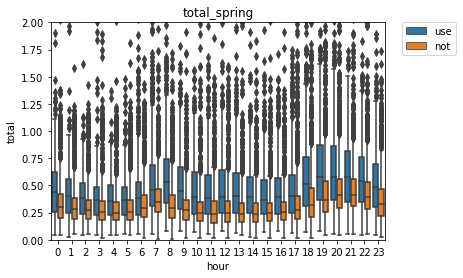

In [309]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_spring, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_spring')
plt.show()

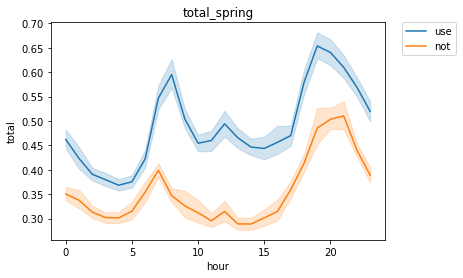

In [310]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_spring, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_spring')
plt.show()

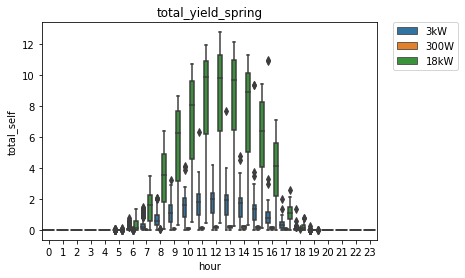

In [311]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_spring')
plt.show()

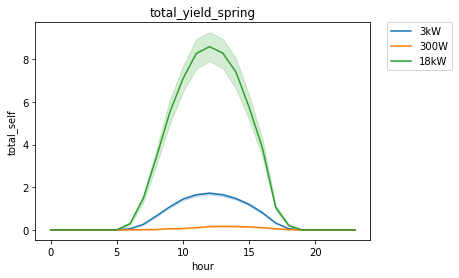

In [312]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_spring')
plt.show()

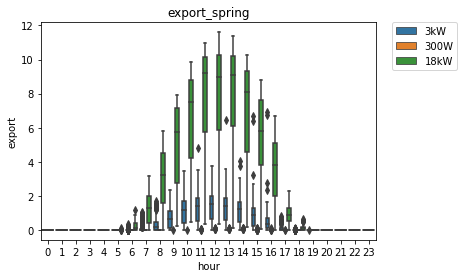

In [313]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_spring')
plt.show()

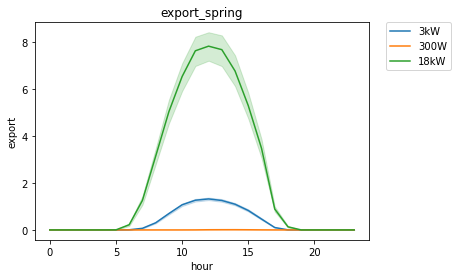

In [314]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_spring')
plt.show()

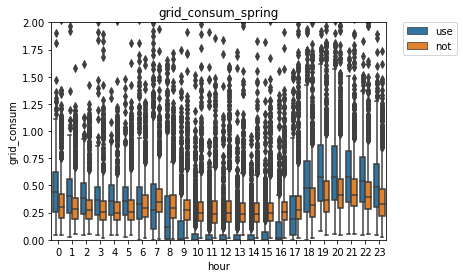

In [315]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_spring, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_spring')
plt.show()

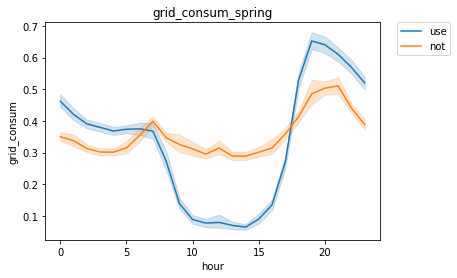

In [316]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_spring, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_spring')
plt.show()

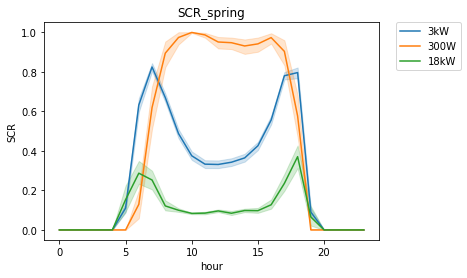

In [317]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_spring')
plt.show()

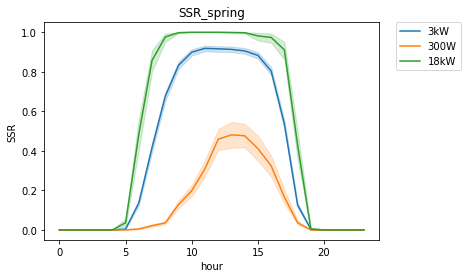

In [318]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_spring')
plt.show()

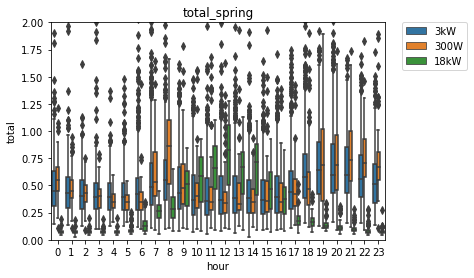

In [319]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_spring')
plt.show()

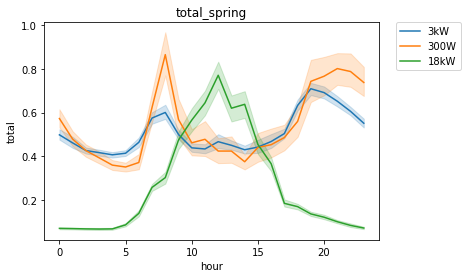

In [320]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_spring')
plt.show()

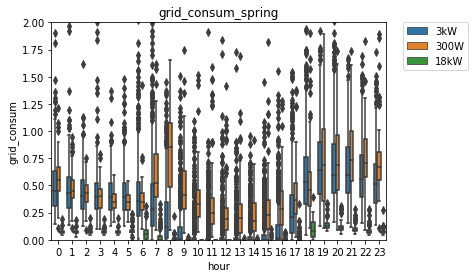

In [321]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_spring')
plt.show()

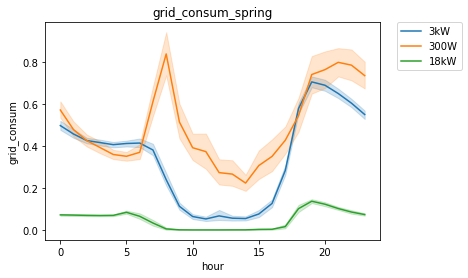

In [322]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_spring, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_spring')
plt.show()

<hr>

### 여름(Summer)

In [323]:
df_all_hour_summer = df_all_hour[(df_all_hour.ym == '2021/6') | (df_all_hour.ym == '2021/7') | (df_all_hour.ym == '2021/8')]

In [324]:
# 총 전력 소비량
df_all_hour_summer.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1551.0  0.436137  0.462807  0.049988  0.220032  0.339966  0.550049   
     1   1559.0  0.386314  0.279552  0.049988  0.200012  0.309937  0.500000   
     2   1553.0  0.347072  0.226169  0.059998  0.190002  0.289917  0.440186   
     3   1552.0  0.326284  0.230813  0.059998  0.179993  0.270020  0.409973   
     4   1557.0  0.304490  0.195845  0.059998  0.169983  0.259949  0.369995   
     5   1542.0  0.300797  0.221379  0.049988  0.169983  0.250000  0.369995   
     6   1539.0  0.384170  1.393346  0.049988  0.190063  0.290039  0.420044   
     7   1537.0  0.430787  0.448600  0.059998  0.250000  0.359985  0.489990   
     8   1542.0  0.388820  0.333348  0.049988  0.210022  0.320068  0.460022   
     9   1543.0  0.371800  0.312081  0.040039  0.200012  0.309998  0.440125   
     10  1541.0  0.406775  1.128464  0.049988  0.200012  0.309998  0.449951   
     11  1551.0  0.448530  1.567014  0.049988  0.179993  0.299988  0.449951   
     12  1538.0  0.395807  0.418532  0.039978  0.179993  0.300049  0.460083   
     13  1546.0  0.689340  9.774924  0.039978  0.179993  0.300049  0.469971   
     14  1545.0  0.443118  1.113807  0.039978  0.190002  0.300049  0.459961   
     15  1541.0  0.409494  0.420008  0.049988  0.200012  0.309998  0.459961   
     16  1541.0  0.445885  0.703194  0.039978  0.200073  0.329956  0.489990   
     17  1542.0  0.472776  0.536444  0.059998  0.210022  0.339966  0.539978   
     18  1537.0  0.535511  0.591967  0.049988  0.220032  0.359985  0.619995   
     19  1547.0  0.568424  0.593621  0.059998  0.250000  0.409973  0.660034   
     20  1542.0  0.634293  0.614585  0.059998  0.319946  0.460083  0.739990   
     21  1551.0  0.623419  0.598691  0.059998  0.339966  0.479980  0.720093   
     22  1553.0  0.546162  0.427432  0.070007  0.290039  0.429993  0.670044   
     23  1543.0  0.469696  0.356369  0.059998  0.245056  0.360046  0.595032   
use  0    898.0  0.493898  0.323604  0.059998  0.260010  0.420044  0.630005   
     1    901.0  0.447725  0.305308  0.059998  0.250000  0.369995  0.559998   
     2    900.0  0.394997  0.225539  0.059998  0.239990  0.349976  0.500000   
     3    900.0  0.376651  0.220071  0.050003  0.229996  0.309998  0.489990   
     4    894.0  0.365329  0.210556  0.050018  0.220032  0.299995  0.479980   
     5    888.0  0.376533  0.218848  0.069794  0.230011  0.309998  0.470093   
     6    888.0  0.418200  0.351304  0.080017  0.240479  0.329983  0.529907   
     7    886.0  0.524174  0.468559  0.089844  0.289978  0.410126  0.659996   
     8    891.0  0.606707  0.536028  0.079559  0.349731  0.479980  0.710068   
     9    889.0  0.559422  0.434042  0.089996  0.319916  0.469971  0.669922   
     10   896.0  0.537904  0.374461  0.089783  0.280029  0.450073  0.669930   
     11   891.0  0.596010  0.545006  0.110046  0.289978  0.470024  0.745056   
     12   889.0  0.642896  0.500743  0.109985  0.299988  0.509888  0.800049   
     13   889.0  0.655719  0.529867  0.119934  0.320068  0.500122  0.780090   
     14   891.0  0.638013  0.544767  0.130005  0.309875  0.479980  0.750000   
     15   892.0  0.636750  0.694668  0.119324  0.290039  0.469986  0.739380   
     16   895.0  0.619787  0.522789  0.110245  0.300049  0.469971  0.699554   
     17   895.0  0.656177  0.518791  0.110001  0.314941  0.470093  0.799866   
     18   892.0  0.743555  0.560651  0.099762  0.357422  0.550018  0.942444   
     19   896.0  0.829777  0.638409  0.099792  0.387444  0.615021  1.070068   
     20   896.0  0.813200  0.575429  0.080002  0.419983  0.650024  1.050003   
     21   899.0  0.769416  0.517496  0.069977  0.410019  0.650024  0.989990   
     22   896.0  0.699036  0.485659  0.059998  0.387466  0.590057  0.879913   
     23   894.0  0.591050  0.411052  0.059998  0.309998  0.510010  0.739990   

                max  
type 시간              
not  0    10.59

In [325]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_summer_use = df_all_hour_summer[df_all_hour_summer.type == 'use']
df_all_hour_summer_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    89.0  0.138089  0.081141  0.059998  0.070007  0.089996   
         1    89.0  0.138765  0.085040  0.059998  0.070007  0.089996   
         2    89.0  0.134718  0.081451  0.059998  0.070007  0.089996   
         3    89.0  0.130116  0.079049  0.050003  0.070007  0.089996   
         4    91.0  0.167582  0.223540  0.050018  0.070007  0.089996   
         5    92.0  0.167521  0.082406  0.069794  0.090202  0.150017   
         6    92.0  0.194310  0.096249  0.080017  0.129715  0.160080   
         7    91.0  0.257791  0.090865  0.089844  0.195038  0.250000   
         8    91.0  0.351869  0.129239  0.079559  0.240234  0.350098   
         9    92.0  0.496788  0.197159  0.089996  0.364868  0.489746   
         10   92.0  0.624451  0.263512  0.089783  0.427856  0.605225   
         11   92.0  0.678453  0.288983  0.129333  0.457520  0.660156   
         12   92.0  0.696297  0.267695  0.150391  0.500000  0.724854   
         13   92.0  0.687138  0.278867  0.179138  0.474976  0.699707   
         14   92.0  0.602108  0.270681  0.160156  0.367676  0.615234   
         15   92.0  0.515792  0.246692  0.119324  0.290039  0.514893   
         16   89.0  0.424811  0.170284  0.110245  0.290527  0.419434   
         17   89.0  0.298956  0.122451  0.110001  0.219727  0.279785   
         18   89.0  0.272037  0.143102  0.099762  0.159668  0.239487   
         19   89.0  0.263393  0.143452  0.099792  0.139999  0.239761   
         20   89.0  0.245506  0.131114  0.080002  0.129974  0.200012   
         21   89.0  0.200448  0.103550  0.069977  0.110001  0.169998   
         22   89.0  0.159438  0.091483  0.059998  0.080002  0.130005   
         23   89.0  0.144271  0.083965  0.059998  0.070007  0.100006   
300W     0    90.0  0.591003  0.236688  0.330017  0.472473  0.550049   
         1    90.0  0.413445  0.195011  0.230042  0.322540  0.380005   
         2    90.0  0.361668  0.192243  0.179993  0.282501  0.330078   
         3    90.0  0.316724  0.069558  0.179993  0.279922  0.309937   
         4    90.0  0.323003  0.174257  0.160034  0.252502  0.309998   
         5    90.0  0.336112  0.168905  0.149963  0.269974  0.309998   
         6    90.0  0.344714  0.153874  0.159973  0.260010  0.299988   
         7    90.0  0.682724  0.407580  0.179932  0.412476  0.554985   
         8    90.0  0.903111  0.577622  0.170029  0.492506  0.749981   
         9    90.0  0.662219  0.588395  0.200012  0.310020  0.479977   
         10   89.0  0.527975  0.420518  0.159952  0.270035  0.380081   
         11   89.0  0.552594  0.438436  0.179987  0.279984  0.379997   
         12   89.0  0.597857  0.519470  0.159890  0.269989  0.399973   
         13   90.0  0.617227  0.598625  0.169955  0.260003  0.399979   
         14   90.0  0.639667  0.616048  0.180013  0.302467  0.385021   
         15   90.0  0.590223  0.527590  0.159973  0.272490  0.395016   
         16   89.0  0.615733  0.585821  0.160034  0.280045  0.380066   
         17   89.0  0.678481  0.668622  0.189964  0.290024  0.410042   
         18   89.0  0.898433  0.697889  0.160004  0.430008  0.719948   
         19   89.0  1.141459  0.723244  0.229980  0.599976  0.929932   
         20   89.0  1.263478  0.706577  0.209961  0.780029  1.070007   
         21   89.0  1.265285  0.719844  0.200073  0.710022  1.060059   
         22   90.0  1.037342  0.541302  0.229980  0.652527  0.859985   
         23   90.0  0.854559  0.429197  0.339966  0.630005  0.720001   
3kW      0   719.0  0.525786  0.324318  0.159973  0.290039  0.430054   
         1   722.0  0.490083  0.311531  0.139984  0.270020  0.409973   
         2   721.0  0.431287  0.219780  0.140015  0.259949  0.380005   
         3   721.0  0.414564  0.222955  0.140015  0.240051  0.350037   
         4   713.0  0.395910  0.198321  0.139984  0.230011  0.339966   
         5   706.0  0.408922  0.220954  0.140015  0.2

In [326]:
# 총 전력 생산량
df_all_hour_summer_use = df_all_hour_summer[df_all_hour_summer.type == 'use']
df_all_hour_summer_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.016527  0.030996  0.000000  0.000000  0.000000   
         6    92.0  0.547316  0.376338  0.000000  0.250000  0.494873   
         7    91.0  1.798850  0.860318  0.000000  1.244629  1.879883   
         8    91.0  3.575732  1.616360  0.089844  2.264893  3.980469   
         9    92.0  5.120314  2.188445  0.000000  4.017456  5.369873   
         10   92.0  6.603473  2.726876  0.009766  5.249878  6.959473   
         11   92.0  7.182400  3.130238  0.029785  4.862305  8.195312   
         12   92.0  7.493700  3.124647  0.030273  5.092651  7.959473   
         13   92.0  7.429380  2.940508  0.239258  5.630005  8.224854   
         14   92.0  6.136878  2.880859  0.000000  3.570068  6.840332   
         15   92.0  4.928982  2.685826  0.009766  2.647217  5.334961   
         16   89.0  3.653019  2.035000  0.000000  1.709961  3.949707   
         17   89.0  1.551802  0.785118  0.000000  1.030273  1.639648   
         18   89.0  0.438712  0.333938  0.000000  0.109863  0.430664   
         19   89.0  0.011818  0.023553  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.004333  0.005619  0.000000  0.000000  0.000000   
         7    90.0  0.016944  0.011507  0.000000  0.009995  0.019997   
         8    90.0  0.032334  0.014615  0.000000  0.020004  0.030010   
         9    90.0  0.059000  0.019947  0.009995  0.050003  0.059998   
         10   89.0  0.086854  0.028348  0.000000  0.070007  0.089996   
         11   89.0  0.103821  0.040128  0.000000  0.070000  0.119995   
         12   89.0  0.127527  0.057570  0.000000  0.080002  0.139999   
         13   90.0  0.139444  0.061560  0.009995  0.089996  0.149994   
         14   90.0  0.139777  0.060354  0.010002  0.099993  0.149998   
         15   90.0  0.117334  0.058824  0.000000  0.070000  0.119995   
         16   89.0  0.092471  0.050639  0.000000  0.050003  0.089996   
         17   89.0  0.057191  0.038078  0.000000  0.029999  0.050003   
         18   89.0  0.023259  0.020158  0.000000  0.009995  0.020004   
         19   89.0  0.000899  0.002876  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   719.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   722.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   713.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   706.0  0.005469  0.017677  0.000000  0.0

In [327]:
# 총 전력 수출량
df_all_hour_summer_use = df_all_hour_summer[df_all_hour_summer.type == 'use']
df_all_hour_summer_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.006507  0.019789  0.000000  0.000000  0.000000   
         6    92.0  0.406919  0.329549  0.000000  0.119507  0.340088   
         7    91.0  1.552708  0.790890  0.000000  0.984619  1.600098   
         8    91.0  3.225731  1.514081  0.030273  2.024658  3.580078   
         9    92.0  4.624613  2.034135  0.000000  3.647461  4.889893   
         10   92.0  5.981413  2.521548  0.000000  4.677490  6.269775   
         11   92.0  6.509707  2.894558  0.000000  4.378174  7.339844   
         12   92.0  6.800447  2.911983  0.000000  4.444458  7.259766   
         13   92.0  6.743764  2.745480  0.120117  5.117432  7.385010   
         14   92.0  5.539009  2.670203  0.000000  3.187500  6.034668   
         15   92.0  4.421233  2.473105  0.000000  2.274780  4.714844   
         16   89.0  3.235961  1.897265  0.000000  1.399414  3.500000   
         17   89.0  1.265318  0.742495  0.000000  0.669922  1.280273   
         18   89.0  0.266843  0.267138  0.000000  0.029297  0.209961   
         19   89.0  0.002919  0.012546  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   89.0  0.000337  0.001815  0.000000  0.000000  0.000000   
         11   89.0  0.000674  0.002522  0.000000  0.000000  0.000000   
         12   89.0  0.002135  0.006302  0.000000  0.000000  0.000000   
         13   90.0  0.003556  0.009979  0.000000  0.000000  0.000000   
         14   90.0  0.003000  0.009174  0.000000  0.000000  0.000000   
         15   90.0  0.001667  0.006910  0.000000  0.000000  0.000000   
         16   89.0  0.000562  0.003490  0.000000  0.000000  0.000000   
         17   89.0  0.000225  0.001491  0.000000  0.000000  0.000000   
         18   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   719.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   722.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   713.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   706.0  0.000014  0.000377  0.000000  0.0

In [328]:
# 총 그리드 소비량
df_all_hour_summer.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1551.0  0.436137  0.462807  0.049988  0.220032  0.339966  0.550049   
     1   1559.0  0.386314  0.279552  0.049988  0.200012  0.309937  0.500000   
     2   1553.0  0.347072  0.226169  0.059998  0.190002  0.289917  0.440186   
     3   1552.0  0.326284  0.230813  0.059998  0.179993  0.270020  0.409973   
     4   1557.0  0.304490  0.195845  0.059998  0.169983  0.259949  0.369995   
     5   1542.0  0.300797  0.221379  0.049988  0.169983  0.250000  0.369995   
     6   1539.0  0.384170  1.393346  0.049988  0.190063  0.290039  0.420044   
     7   1537.0  0.430787  0.448600  0.059998  0.250000  0.359985  0.489990   
     8   1542.0  0.388820  0.333348  0.049988  0.210022  0.320068  0.460022   
     9   1543.0  0.371800  0.312081  0.040039  0.200012  0.309998  0.440125   
     10  1541.0  0.406775  1.128464  0.049988  0.200012  0.309998  0.449951   
     11  1551.0  0.448530  1.567014  0.049988  0.179993  0.299988  0.449951   
     12  1538.0  0.395807  0.418532  0.039978  0.179993  0.300049  0.460083   
     13  1546.0  0.689340  9.774924  0.039978  0.179993  0.300049  0.469971   
     14  1545.0  0.443118  1.113807  0.039978  0.190002  0.300049  0.459961   
     15  1541.0  0.409494  0.420008  0.049988  0.200012  0.309998  0.459961   
     16  1541.0  0.445885  0.703194  0.039978  0.200073  0.329956  0.489990   
     17  1542.0  0.472776  0.536444  0.059998  0.210022  0.339966  0.539978   
     18  1537.0  0.535511  0.591967  0.049988  0.220032  0.359985  0.619995   
     19  1547.0  0.568424  0.593621  0.059998  0.250000  0.409973  0.660034   
     20  1542.0  0.634293  0.614585  0.059998  0.319946  0.460083  0.739990   
     21  1551.0  0.623419  0.598691  0.059998  0.339966  0.479980  0.720093   
     22  1553.0  0.546162  0.427432  0.070007  0.290039  0.429993  0.670044   
     23  1543.0  0.469696  0.356369  0.059998  0.245056  0.360046  0.595032   
use  0    898.0  0.494289  0.324113  0.059998  0.260010  0.420044  0.630005   
     1    901.0  0.447859  0.305365  0.059998  0.250000  0.369995  0.559998   
     2    900.0  0.395073  0.225579  0.059998  0.239990  0.349976  0.500000   
     3    900.0  0.376651  0.220071  0.050003  0.229996  0.309998  0.489990   
     4    894.0  0.365329  0.210556  0.050018  0.220032  0.299995  0.479980   
     5    888.0  0.371158  0.218655  0.040009  0.229980  0.309998  0.469971   
     6    888.0  0.335033  0.359804  0.000000  0.160027  0.260010  0.440002   
     7    886.0  0.307266  0.477958  0.000000  0.042511  0.199951  0.430054   
     8    891.0  0.277669  0.537231  0.000000  0.000000  0.080078  0.365051   
     9    889.0  0.173145  0.373581  0.000000  0.000000  0.020020  0.209961   
     10   896.0  0.119919  0.267363  0.000000  0.000000  0.000000  0.109985   
     11   891.0  0.135318  0.390726  0.000000  0.000000  0.000000  0.119995   
     12   889.0  0.150687  0.338131  0.000000  0.000000  0.000000  0.139893   
     13   889.0  0.157569  0.353204  0.000000  0.000000  0.010010  0.140015   
     14   891.0  0.165854  0.362856  0.000000  0.000000  0.010010  0.170044   
     15   892.0  0.196116  0.454779  0.000000  0.000000  0.020020  0.229980   
     16   895.0  0.242618  0.413674  0.000000  0.000000  0.069946  0.309967   
     17   895.0  0.385786  0.482881  0.000000  0.049988  0.220001  0.540039   
     18   892.0  0.632981  0.567689  0.000000  0.230034  0.450073  0.850006   
     19   896.0  0.820451  0.639067  0.049988  0.369995  0.609985  1.060059   
     20   896.0  0.813335  0.575374  0.080002  0.419983  0.650024  1.050003   
     21   899.0  0.770393  0.518127  0.069977  0.410019  0.650024  0.989990   
     22   896.0  0.698609  0.480776  0.059998  0.387466  0.595032  0.880005   
     23   894.0  0.592196  0.416184  0.059998  0.309998  0.510010  0.739990   

                max  
type 시간              
not  0    10.59

In [329]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_summer_use = df_all_hour_summer[df_all_hour_summer.type == 'use']
df_all_hour_summer_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    89.0  0.138089  0.081141  0.059998  0.070007  0.089996   
         1    89.0  0.138765  0.085040  0.059998  0.070007  0.089996   
         2    89.0  0.134718  0.081451  0.059998  0.070007  0.089996   
         3    89.0  0.130116  0.079049  0.050003  0.070007  0.089996   
         4    91.0  0.167582  0.223540  0.050018  0.070007  0.089996   
         5    92.0  0.157501  0.086617  0.040009  0.080002  0.139992   
         6    92.0  0.053914  0.069534  0.000000  0.000000  0.029999   
         7    91.0  0.011649  0.037425  0.000000  0.000000  0.000000   
         8    91.0  0.001868  0.007136  0.000000  0.000000  0.000000   
         9    92.0  0.001087  0.009429  0.000000  0.000000  0.000000   
         10   92.0  0.002392  0.016733  0.000000  0.000000  0.000000   
         11   92.0  0.005761  0.041010  0.000000  0.000000  0.000000   
         12   92.0  0.003043  0.024482  0.000000  0.000000  0.000000   
         13   92.0  0.001522  0.008377  0.000000  0.000000  0.000000   
         14   92.0  0.004239  0.024683  0.000000  0.000000  0.000000   
         15   92.0  0.008043  0.041911  0.000000  0.000000  0.000000   
         16   89.0  0.007753  0.029067  0.000000  0.000000  0.000000   
         17   89.0  0.012472  0.032729  0.000000  0.000000  0.000000   
         18   89.0  0.100167  0.115484  0.000000  0.009995  0.069977   
         19   89.0  0.254494  0.142742  0.049988  0.130005  0.230011   
         20   89.0  0.245506  0.131114  0.080002  0.129974  0.200012   
         21   89.0  0.200448  0.103550  0.069977  0.110001  0.169998   
         22   89.0  0.159438  0.091483  0.059998  0.080002  0.130005   
         23   89.0  0.144271  0.083965  0.059998  0.070007  0.100006   
300W     0    90.0  0.591003  0.236688  0.330017  0.472473  0.550049   
         1    90.0  0.413445  0.195011  0.230042  0.322540  0.380005   
         2    90.0  0.361668  0.192243  0.179993  0.282501  0.330078   
         3    90.0  0.316724  0.069558  0.179993  0.279922  0.309937   
         4    90.0  0.323003  0.174257  0.160034  0.252502  0.309998   
         5    90.0  0.336112  0.168905  0.149963  0.269974  0.309998   
         6    90.0  0.340382  0.154079  0.159973  0.260010  0.299927   
         7    90.0  0.665780  0.408813  0.169983  0.382477  0.540009   
         8    90.0  0.870778  0.578512  0.130005  0.450012  0.719971   
         9    90.0  0.603219  0.592310  0.130005  0.250000  0.415039   
         10   89.0  0.441458  0.425364  0.059998  0.179993  0.289917   
         11   89.0  0.449448  0.435674  0.049988  0.170044  0.279968   
         12   89.0  0.472464  0.529060  0.009888  0.140015  0.250000   
         13   90.0  0.481339  0.605527  0.009949  0.130005  0.250000   
         14   90.0  0.502890  0.618763  0.010010  0.132507  0.260010   
         15   90.0  0.474555  0.530985  0.029907  0.159927  0.260010   
         16   89.0  0.523824  0.586125  0.030029  0.209961  0.290039   
         17   89.0  0.621515  0.667724  0.089966  0.250000  0.369995   
         18   89.0  0.875174  0.695967  0.130005  0.410034  0.689941   
         19   89.0  1.140560  0.722867  0.229980  0.599976  0.929932   
         20   89.0  1.263478  0.706577  0.209961  0.780029  1.070007   
         21   89.0  1.265285  0.719844  0.200073  0.710022  1.060059   
         22   90.0  1.037342  0.541302  0.229980  0.652527  0.859985   
         23   90.0  0.854559  0.429197  0.339966  0.630005  0.720001   
3kW      0   719.0  0.526274  0.324904  0.159973  0.290039  0.430054   
         1   722.0  0.490251  0.311577  0.139984  0.270020  0.409973   
         2   721.0  0.431381  0.219816  0.140015  0.259949  0.380005   
         3   721.0  0.414564  0.222955  0.140015  0.240051  0.350037   
         4   713.0  0.395910  0.198321  0.139984  0.230011  0.339966   
         5   706.0  0.403468  0.220053  0.130005  0.2

In [330]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_summer_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.342719  0.427507  0.000000  0.000000  0.000000   
         6    92.0  0.332523  0.238069  0.000000  0.151483  0.267888   
         7    91.0  0.183810  0.165563  0.000000  0.111557  0.140641   
         8    91.0  0.126349  0.096691  0.053010  0.084310  0.095811   
         9    92.0  0.110565  0.063567  0.000000  0.082012  0.096145   
         10   92.0  0.118218  0.120521  0.049898  0.082539  0.096618   
         11   92.0  0.114258  0.105608  0.053530  0.083025  0.097016   
         12   92.0  0.110245  0.101173  0.056732  0.078735  0.091760   
         13   92.0  0.106919  0.070932  0.046645  0.078530  0.093715   
         14   92.0  0.110260  0.057703  0.000000  0.084104  0.100241   
         15   92.0  0.146217  0.151763  0.039872  0.087355  0.109338   
         16   89.0  0.150632  0.104107  0.000000  0.096556  0.115980   
         17   89.0  0.256128  0.203364  0.000000  0.136049  0.178488   
         18   89.0  0.511820  0.294586  0.000000  0.259766  0.446078   
         19   89.0  0.368269  0.462093  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.400000  0.492642  0.000000  0.000000  0.000000   
         7    90.0  0.822222  0.384467  0.000000  1.000000  1.000000   
         8    90.0  0.966667  0.180511  0.000000  1.000000  1.000000   
         9    90.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   89.0  0.985683  0.106971  0.000000  1.000000  1.000000   
         11   89.0  0.983619  0.107197  0.000000  1.000000  1.000000   
         12   89.0  0.976064  0.110969  0.000000  1.000000  1.000000   
         13   90.0  0.979795  0.051932  0.739134  1.000000  1.000000   
         14   90.0  0.984313  0.045084  0.739134  1.000000  1.000000   
         15   90.0  0.969056  0.150955  0.000000  1.000000  1.000000   
         16   89.0  0.951622  0.208654  0.000000  1.000000  1.000000   
         17   89.0  0.953098  0.208333  0.000000  1.000000  1.000000   
         18   89.0  0.752809  0.433823  0.000000  1.000000  1.000000   
         19   89.0  0.089888  0.287641  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   719.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   722.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   713.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   706.0  0.298630  0.457766  0.000000  0.0

In [331]:
# SSR(자가공급률)
df_all_hour_summer_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    92.0  0.088136  0.129328  0.000000  0.000000  0.000000   
         6    92.0  0.728972  0.311461  0.000000  0.567014  0.827135   
         7    91.0  0.938010  0.197095  0.000000  1.000000  1.000000   
         8    91.0  0.987573  0.050405  0.666893  1.000000  1.000000   
         9    92.0  0.988713  0.104290  0.000000  1.000000  1.000000   
         10   92.0  0.982687  0.117616  0.108770  1.000000  1.000000   
         11   92.0  0.979995  0.116739  0.072687  1.000000  1.000000   
         12   92.0  0.987683  0.095456  0.116316  1.000000  1.000000   
         13   92.0  0.994312  0.037049  0.665077  1.000000  1.000000   
         14   92.0  0.983826  0.109175  0.000000  1.000000  1.000000   
         15   92.0  0.968055  0.143348  0.027144  1.000000  1.000000   
         16   89.0  0.960577  0.160031  0.000000  1.000000  1.000000   
         17   89.0  0.938146  0.186117  0.000000  1.000000  1.000000   
         18   89.0  0.639896  0.347714  0.000000  0.353195  0.730731   
         19   89.0  0.043680  0.078678  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.014093  0.019313  0.000000  0.000000  0.000000   
         7    90.0  0.033597  0.028771  0.000000  0.011901  0.024559   
         8    90.0  0.054022  0.048745  0.000000  0.019286  0.039412   
         9    90.0  0.137943  0.087415  0.006668  0.083326  0.124040   
         10   89.0  0.240982  0.151035  0.000000  0.131170  0.224994   
         11   89.0  0.272432  0.177972  0.000000  0.127669  0.250012   
         12   89.0  0.333875  0.227783  0.000000  0.140032  0.323075   
         13   90.0  0.368478  0.261700  0.014278  0.131079  0.359511   
         14   90.0  0.353870  0.240338  0.014711  0.156141  0.325230   
         15   90.0  0.306392  0.224487  0.000000  0.108150  0.273028   
         16   89.0  0.234890  0.185059  0.000000  0.080003  0.196425   
         17   89.0  0.139724  0.136484  0.000000  0.040010  0.093022   
         18   89.0  0.043434  0.055517  0.000000  0.005619  0.021283   
         19   89.0  0.000708  0.002444  0.000000  0.000000  0.000000   
         20   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   719.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   722.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   721.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   713.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   706.0  0.014464  0.032152  0.000000  0.0

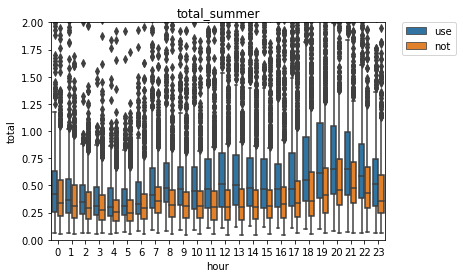

In [332]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_summer, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_summer')
plt.show()

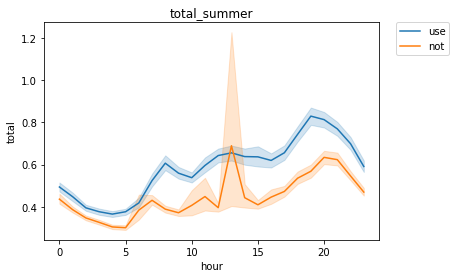

In [333]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_summer, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_summer')
plt.show()

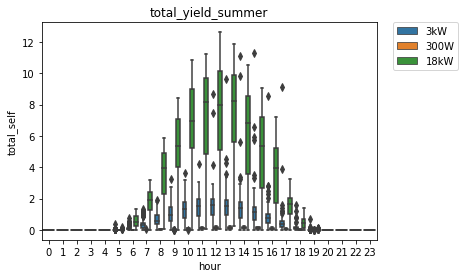

In [334]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_summer')
plt.show()

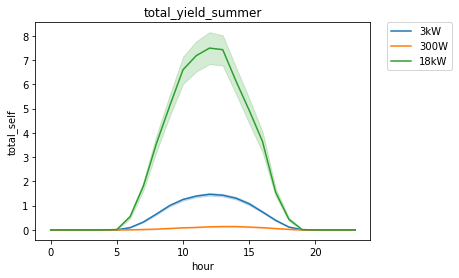

In [335]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_summer')
plt.show()

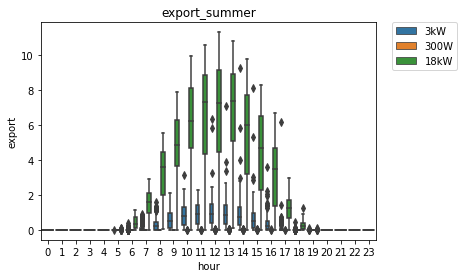

In [336]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_summer')
plt.show()

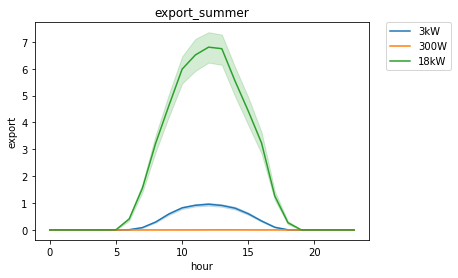

In [337]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_summer')
plt.show()

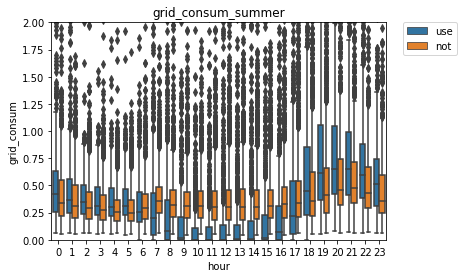

In [338]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_summer, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_summer')
plt.show()

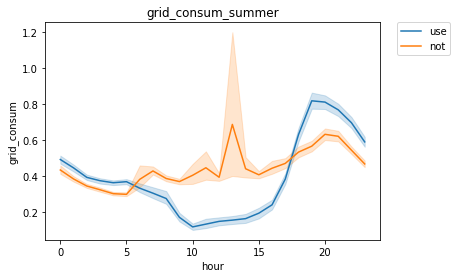

In [339]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_summer, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_summer')
plt.show()

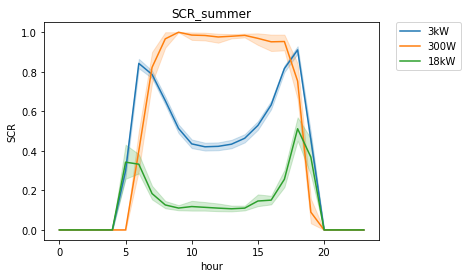

In [340]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_summer')
plt.show()

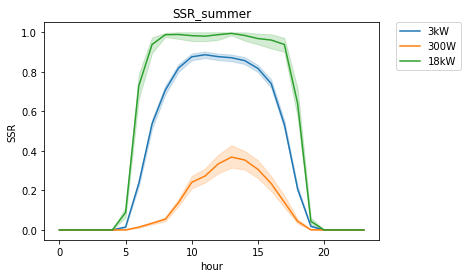

In [341]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_summer')
plt.show()

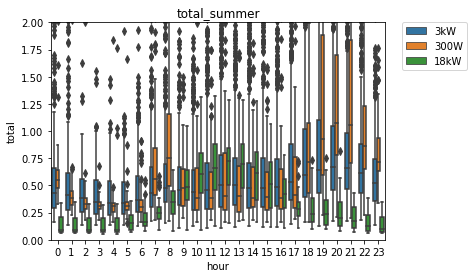

In [342]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_summer')
plt.show()

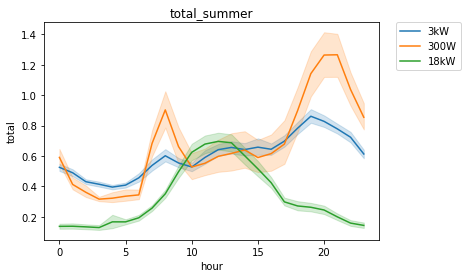

In [343]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_summer')
plt.show()

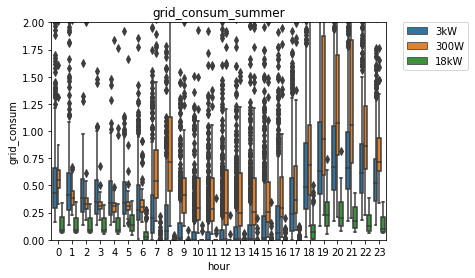

In [344]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_summer')
plt.show()

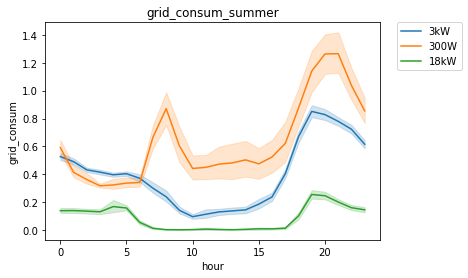

In [345]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_summer, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_summer')
plt.show()

<hr>

### 가을(Autumn)

In [346]:
df_all_hour_autumn = df_all_hour[(df_all_hour.ym == '2021/9') | (df_all_hour.ym == '2021/10') | (df_all_hour.ym == '2021/11')]

In [347]:
# 총 전력 소비량
df_all_hour_autumn.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1565.0  0.370618  0.389730  0.029968  0.219971  0.309937  0.429932   
     1   1569.0  0.337969  0.234600  0.039978  0.200073  0.289917  0.380127   
     2   1565.0  0.317384  0.198719  0.030029  0.190063  0.280029  0.369995   
     3   1570.0  0.313470  0.233663  0.039978  0.189941  0.270020  0.359863   
     4   1563.0  0.297703  0.193605  0.030029  0.179932  0.260010  0.359863   
     5   1563.0  0.302342  0.296832  0.030029  0.170044  0.250000  0.359863   
     6   1560.0  0.330779  0.281238  0.029968  0.190155  0.274902  0.390015   
     7   1555.0  0.403929  0.488423  0.020020  0.239990  0.330078  0.459961   
     8   1569.0  0.362788  0.392574  0.019958  0.209961  0.300049  0.429932   
     9   1560.0  0.325581  0.341599  0.019958  0.180054  0.280029  0.389893   
     10  1565.0  0.304720  0.339423  0.029968  0.179932  0.260010  0.350098   
     11  1544.0  0.301683  0.305591  0.030029  0.160034  0.250000  0.350006   
     12  1551.0  0.323012  0.281235  0.020020  0.160034  0.260010  0.379883   
     13  1550.0  0.344482  1.048714  0.020020  0.160034  0.250000  0.379883   
     14  1547.0  0.345013  0.979952  0.019958  0.169922  0.260010  0.364990   
     15  1547.0  0.343959  0.542472  0.019958  0.170013  0.270020  0.369995   
     16  1552.0  0.351359  0.375128  0.020020  0.180145  0.280029  0.400024   
     17  1556.0  0.390506  0.437529  0.029968  0.190063  0.309967  0.449951   
     18  1550.0  0.466479  0.421107  0.030029  0.229980  0.359863  0.550018   
     19  1554.0  0.527747  0.512769  0.019958  0.270020  0.389893  0.590088   
     20  1547.0  0.497726  0.338225  0.049927  0.309937  0.420044  0.584961   
     21  1558.0  0.508834  0.370150  0.039978  0.319946  0.420044  0.580078   
     22  1563.0  0.466324  0.449527  0.020020  0.290039  0.380005  0.530029   
     23  1560.0  0.393740  0.248240  0.030029  0.239990  0.339844  0.470215   
use  0    896.0  0.488681  0.301822  0.050018  0.260010  0.449951  0.649902   
     1    893.0  0.437833  0.275420  0.049988  0.250000  0.389893  0.579956   
     2    897.0  0.400001  0.255891  0.049988  0.229980  0.349976  0.540039   
     3    888.0  0.376580  0.227874  0.049988  0.220078  0.339966  0.500000   
     4    892.0  0.370837  0.230421  0.040009  0.219971  0.339844  0.492493   
     5    892.0  0.373092  0.218777  0.049988  0.219971  0.329956  0.500000   
     6    890.0  0.426091  0.316841  0.050018  0.230103  0.359985  0.540039   
     7    890.0  0.515122  0.417745  0.078796  0.289917  0.420166  0.619873   
     8    891.0  0.571195  0.330792  0.080078  0.319885  0.489990  0.730164   
     9    900.0  0.503634  0.316894  0.089844  0.270020  0.429893  0.650208   
     10   897.0  0.475069  0.295370  0.079834  0.239990  0.400146  0.639893   
     11   891.0  0.486450  0.345926  0.079956  0.240112  0.390137  0.650269   
     12   887.0  0.524649  0.366938  0.109344  0.260010  0.439453  0.699493   
     13   890.0  0.507980  0.319295  0.080078  0.260132  0.450195  0.656921   
     14   897.0  0.483513  0.325874  0.080200  0.250000  0.419922  0.609863   
     15   896.0  0.453970  0.287906  0.089966  0.249878  0.399940  0.569977   
     16   900.0  0.464564  0.421494  0.070557  0.230103  0.390015  0.580093   
     17   896.0  0.544783  0.516121  0.069275  0.260010  0.449951  0.690063   
     18   892.0  0.635393  0.396497  0.049988  0.347412  0.570068  0.819824   
     19   892.0  0.677484  0.422655  0.049988  0.368744  0.599976  0.880005   
     20   894.0  0.654564  0.435852  0.050018  0.362579  0.579895  0.830078   
     21   888.0  0.654127  0.411706  0.050018  0.349976  0.579956  0.879883   
     22   895.0  0.639283  0.443212  0.049988  0.339966  0.550049  0.850098   
     23   895.0  0.567825  0.374226  0.049988  0.284973  0.519897  0.745117   

               max  
type 시간             
not  0   12.57006

In [348]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_autumn_use = df_all_hour_autumn[df_all_hour_autumn.type == 'use']
df_all_hour_autumn_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    91.0  0.071538  0.016993  0.050018  0.059998  0.070007   
         1    91.0  0.073186  0.017816  0.049988  0.059998  0.070007   
         2    91.0  0.074507  0.018575  0.049988  0.060013  0.070007   
         3    91.0  0.072745  0.018566  0.049988  0.059998  0.070007   
         4    91.0  0.073407  0.017715  0.040009  0.059998  0.070007   
         5    91.0  0.088572  0.026981  0.049988  0.070007  0.079987   
         6    91.0  0.136338  0.059980  0.050018  0.094772  0.120026   
         7    91.0  0.142636  0.047256  0.078796  0.109375  0.129883   
         8    91.0  0.255997  0.083281  0.080078  0.199707  0.250000   
         9    91.0  0.453229  0.161594  0.089844  0.340332  0.459961   
         10   90.0  0.539139  0.205724  0.079834  0.420166  0.549805   
         11   91.0  0.623369  0.248095  0.119141  0.459961  0.679688   
         12   91.0  0.652479  0.245556  0.109344  0.490234  0.649414   
         13   91.0  0.597693  0.230350  0.150391  0.479004  0.589844   
         14   91.0  0.512221  0.202848  0.121033  0.349609  0.540039   
         15   91.0  0.377987  0.162491  0.110260  0.230469  0.369141   
         16   91.0  0.199634  0.108999  0.070557  0.120056  0.159180   
         17   91.0  0.142377  0.060414  0.069275  0.100052  0.129883   
         18   91.0  0.142566  0.063797  0.049988  0.100006  0.119995   
         19   91.0  0.138790  0.058420  0.049988  0.109985  0.119995   
         20   91.0  0.129011  0.048649  0.050018  0.104996  0.110016   
         21   91.0  0.108572  0.036317  0.050018  0.089996  0.100006   
         22   91.0  0.088021  0.027173  0.049988  0.070007  0.080017   
         23   91.0  0.078681  0.029784  0.049988  0.069977  0.070007   
300W     0    91.0  0.594386  0.230927  0.219971  0.445068  0.559814   
         1    91.0  0.435338  0.168334  0.149902  0.339844  0.409912   
         2    91.0  0.347570  0.137081  0.150146  0.265015  0.320068   
         3    91.0  0.319559  0.118889  0.129883  0.244995  0.319824   
         4    91.0  0.320562  0.174425  0.120117  0.229980  0.300049   
         5    91.0  0.311311  0.147017  0.149902  0.239990  0.290039   
         6    91.0  0.367579  0.193434  0.179932  0.259888  0.310059   
         7    91.0  0.495993  0.284577  0.179932  0.315063  0.459961   
         8    91.0  0.747668  0.408779  0.169907  0.434929  0.659897   
         9    91.0  0.496494  0.356354  0.159897  0.254982  0.330048   
         10   91.0  0.457142  0.349490  0.120087  0.225037  0.320007   
         11   91.0  0.450942  0.334117  0.129807  0.215012  0.289993   
         12   90.0  0.458251  0.355978  0.140048  0.209825  0.314924   
         13   91.0  0.475071  0.396634  0.120018  0.215034  0.289856   
         14   91.0  0.423618  0.322519  0.110019  0.204948  0.320139   
         15   91.0  0.413295  0.261106  0.150008  0.220055  0.349960   
         16   91.0  0.451307  0.329618  0.119873  0.215034  0.350037   
         17   91.0  0.542861  0.531427  0.130127  0.229980  0.350098   
         18   90.0  0.629494  0.434006  0.129883  0.289978  0.484985   
         19   91.0  0.828790  0.416529  0.100098  0.530029  0.770020   
         20   91.0  0.787523  0.354771  0.099854  0.540039  0.740234   
         21   91.0  0.912101  0.374789  0.300049  0.685059  0.849854   
         22   91.0  0.893520  0.312382  0.329834  0.689941  0.840088   
         23   91.0  0.803239  0.318553  0.320068  0.585083  0.730225   
3kW      0   714.0  0.528374  0.287001  0.149902  0.299942  0.465088   
         1   711.0  0.484823  0.269099  0.139954  0.270020  0.429932   
         2   715.0  0.448100  0.252168  0.140015  0.270020  0.410034   
         3   706.0  0.423092  0.221317  0.130005  0.260010  0.389893   
         4   710.0  0.415402  0.221706  0.140015  0.250000  0.385010   
         5   710.0  0.417477  0.210857  0.130005  0.2

In [349]:
# 총 전력 생산량
df_all_hour_autumn_use = df_all_hour_autumn[df_all_hour_autumn.type == 'use']
df_all_hour_autumn_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.023577  0.054510  0.000000  0.000000  0.000000   
         7    91.0  0.714350  0.494770  0.000000  0.295410  0.650391   
         8    91.0  2.751803  1.292706  0.000000  1.725098  2.840820   
         9    91.0  4.947223  2.039723  0.009766  3.405273  5.550781   
         10   90.0  6.537554  2.655378  0.030273  4.867920  7.655273   
         11   91.0  7.420652  3.017560  0.090820  5.864746  8.610352   
         12   91.0  7.182982  2.997773  0.239258  5.029785  8.190430   
         13   91.0  6.706935  2.987668  0.020508  4.760254  7.669922   
         14   91.0  5.704735  2.730034  0.080078  3.589355  6.209961   
         15   91.0  4.091303  2.128862  0.049805  2.295410  4.319336   
         16   91.0  1.360373  1.001370  0.000000  0.599609  1.070312   
         17   91.0  0.220360  0.312577  0.000000  0.000000  0.049805   
         18   91.0  0.007179  0.025140  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    91.0  0.003736  0.005897  0.000000  0.000000  0.000000   
         8    91.0  0.015935  0.010539  0.000000  0.009995  0.019989   
         9    91.0  0.034395  0.016276  0.000000  0.020004  0.029999   
         10   91.0  0.043297  0.020874  0.000000  0.029999  0.040009   
         11   91.0  0.078846  0.030913  0.019989  0.060005  0.079987   
         12   90.0  0.134889  0.057107  0.009995  0.090012  0.154999   
         13   91.0  0.133848  0.070108  0.009995  0.080002  0.149994   
         14   91.0  0.117364  0.062749  0.000000  0.060005  0.130005   
         15   91.0  0.091537  0.054629  0.000000  0.049995  0.089996   
         16   91.0  0.046593  0.044427  0.000000  0.010010  0.020004   
         17   91.0  0.013956  0.024849  0.000000  0.000000  0.000000   
         18   90.0  0.000778  0.003428  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   714.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   711.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   715.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   710.0  0.000014  0.000376  0.000000  0.0

In [350]:
# 총 전력 수출량
df_all_hour_autumn_use = df_all_hour_autumn[df_all_hour_autumn.type == 'use']
df_all_hour_autumn_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.011086  0.036463  0.000000  0.000000  0.000000   
         7    91.0  0.602593  0.444950  0.000000  0.235352  0.540039   
         8    91.0  2.500751  1.214658  0.000000  1.535156  2.549805   
         9    91.0  4.497510  1.895699  0.000000  3.024902  5.150391   
         10   90.0  6.000749  2.478075  0.000000  4.390381  7.049805   
         11   91.0  6.799590  2.800416  0.010742  5.435059  7.929688   
         12   91.0  6.531711  2.777322  0.089844  4.529785  7.509766   
         13   91.0  6.113088  2.783001  0.000000  4.234863  6.940430   
         14   91.0  5.194272  2.552151  0.009766  3.095215  5.639648   
         15   91.0  3.714854  1.980982  0.019531  2.054688  3.900391   
         16   91.0  1.167883  0.901676  0.000000  0.460449  0.929688   
         17   91.0  0.159630  0.246684  0.000000  0.000000  0.009766   
         18   91.0  0.003295  0.017101  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   91.0  0.001319  0.004002  0.000000  0.000000  0.000000   
         12   90.0  0.006000  0.012524  0.000000  0.000000  0.000000   
         13   91.0  0.005934  0.013248  0.000000  0.000000  0.000000   
         14   91.0  0.005165  0.011866  0.000000  0.000000  0.000000   
         15   91.0  0.001648  0.004776  0.000000  0.000000  0.000000   
         16   91.0  0.000440  0.002061  0.000000  0.000000  0.000000   
         17   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   714.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   711.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   715.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   710.0  0.000000  0.000000  0.000000  0.0

In [351]:
# 총 그리드 소비량
df_all_hour_autumn.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1565.0  0.370618  0.389730  0.029968  0.219971  0.309937  0.429932   
     1   1569.0  0.337969  0.234600  0.039978  0.200073  0.289917  0.380127   
     2   1565.0  0.317384  0.198719  0.030029  0.190063  0.280029  0.369995   
     3   1570.0  0.313470  0.233663  0.039978  0.189941  0.270020  0.359863   
     4   1563.0  0.297703  0.193605  0.030029  0.179932  0.260010  0.359863   
     5   1563.0  0.302342  0.296832  0.030029  0.170044  0.250000  0.359863   
     6   1560.0  0.330779  0.281238  0.029968  0.190155  0.274902  0.390015   
     7   1555.0  0.403929  0.488423  0.020020  0.239990  0.330078  0.459961   
     8   1569.0  0.362788  0.392574  0.019958  0.209961  0.300049  0.429932   
     9   1560.0  0.325581  0.341599  0.019958  0.180054  0.280029  0.389893   
     10  1565.0  0.304720  0.339423  0.029968  0.179932  0.260010  0.350098   
     11  1544.0  0.301683  0.305591  0.030029  0.160034  0.250000  0.350006   
     12  1551.0  0.323012  0.281235  0.020020  0.160034  0.260010  0.379883   
     13  1550.0  0.344482  1.048714  0.020020  0.160034  0.250000  0.379883   
     14  1547.0  0.345013  0.979952  0.019958  0.169922  0.260010  0.364990   
     15  1547.0  0.343959  0.542472  0.019958  0.170013  0.270020  0.369995   
     16  1552.0  0.351359  0.375128  0.020020  0.180145  0.280029  0.400024   
     17  1556.0  0.390506  0.437529  0.029968  0.190063  0.309967  0.449951   
     18  1550.0  0.466479  0.421107  0.030029  0.229980  0.359863  0.550018   
     19  1554.0  0.527747  0.512769  0.019958  0.270020  0.389893  0.590088   
     20  1547.0  0.497726  0.338225  0.049927  0.309937  0.420044  0.584961   
     21  1558.0  0.508834  0.370150  0.039978  0.319946  0.420044  0.580078   
     22  1563.0  0.466324  0.449527  0.020020  0.290039  0.380005  0.530029   
     23  1560.0  0.393740  0.248240  0.030029  0.239990  0.339844  0.470215   
use  0    896.0  0.488681  0.301822  0.050018  0.260010  0.449951  0.649902   
     1    893.0  0.437833  0.275420  0.049988  0.250000  0.389893  0.579956   
     2    897.0  0.400001  0.255891  0.049988  0.229980  0.349976  0.540039   
     3    888.0  0.376580  0.227874  0.049988  0.220078  0.339966  0.500000   
     4    892.0  0.370837  0.230421  0.040009  0.219971  0.339844  0.492493   
     5    892.0  0.373081  0.218755  0.049988  0.219971  0.329956  0.500000   
     6    890.0  0.419263  0.316982  0.029999  0.229980  0.349976  0.539795   
     7    890.0  0.409886  0.424113  0.000000  0.162598  0.320007  0.530029   
     8    891.0  0.289005  0.342909  0.000000  0.020020  0.170044  0.439941   
     9    900.0  0.152034  0.276766  0.000000  0.000000  0.010010  0.209961   
     10   897.0  0.105398  0.228584  0.000000  0.000000  0.000000  0.090088   
     11   891.0  0.100417  0.247326  0.000000  0.000000  0.000000  0.070068   
     12   887.0  0.102946  0.231092  0.000000  0.000000  0.000000  0.070068   
     13   890.0  0.103464  0.229059  0.000000  0.000000  0.000000  0.087402   
     14   897.0  0.109515  0.235358  0.000000  0.000000  0.009949  0.099976   
     15   896.0  0.144138  0.239401  0.000000  0.000000  0.030029  0.199951   
     16   900.0  0.261127  0.329766  0.000000  0.030029  0.159912  0.399902   
     17   896.0  0.473423  0.391489  0.000000  0.190002  0.380066  0.630035   
     18   892.0  0.632141  0.397154  0.049988  0.340088  0.569946  0.810059   
     19   892.0  0.677487  0.422653  0.049988  0.368744  0.599976  0.880005   
     20   894.0  0.654566  0.435851  0.050018  0.362579  0.579895  0.830078   
     21   888.0  0.654129  0.411704  0.050018  0.349976  0.579956  0.879883   
     22   895.0  0.639285  0.443211  0.049988  0.339966  0.550049  0.850098   
     23   895.0  0.567827  0.374226  0.049988  0.284973  0.519897  0.745117   

               max  
type 시간             
not  0   12.57006

In [352]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_autumn_use = df_all_hour_autumn[df_all_hour_autumn.type == 'use']
df_all_hour_autumn_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    91.0  0.071538  0.016993  0.050018  0.059998  0.070007   
         1    91.0  0.073186  0.017816  0.049988  0.059998  0.070007   
         2    91.0  0.074507  0.018575  0.049988  0.060013  0.070007   
         3    91.0  0.072745  0.018566  0.049988  0.059998  0.070007   
         4    91.0  0.073407  0.017715  0.040009  0.059998  0.070007   
         5    91.0  0.088572  0.026981  0.049988  0.070007  0.079987   
         6    91.0  0.123847  0.061658  0.029999  0.079987  0.100006   
         7    91.0  0.030879  0.036687  0.000000  0.000000  0.019989   
         8    91.0  0.004945  0.029603  0.000000  0.000000  0.000000   
         9    91.0  0.003517  0.032502  0.000000  0.000000  0.000000   
         10   90.0  0.002334  0.012367  0.000000  0.000000  0.000000   
         11   91.0  0.002307  0.014147  0.000000  0.000000  0.000000   
         12   91.0  0.001209  0.008409  0.000000  0.000000  0.000000   
         13   91.0  0.003846  0.030176  0.000000  0.000000  0.000000   
         14   91.0  0.001758  0.013217  0.000000  0.000000  0.000000   
         15   91.0  0.001538  0.009057  0.000000  0.000000  0.000000   
         16   91.0  0.007144  0.018814  0.000000  0.000000  0.000000   
         17   91.0  0.081648  0.069877  0.000000  0.025009  0.079987   
         18   91.0  0.138681  0.062897  0.049988  0.100006  0.119995   
         19   91.0  0.138790  0.058420  0.049988  0.109985  0.119995   
         20   91.0  0.129011  0.048649  0.050018  0.104996  0.110016   
         21   91.0  0.108572  0.036317  0.050018  0.089996  0.100006   
         22   91.0  0.088021  0.027173  0.049988  0.070007  0.080017   
         23   91.0  0.078681  0.029784  0.049988  0.069977  0.070007   
300W     0    91.0  0.594386  0.230927  0.219971  0.445068  0.559814   
         1    91.0  0.435338  0.168334  0.149902  0.339844  0.409912   
         2    91.0  0.347570  0.137081  0.150146  0.265015  0.320068   
         3    91.0  0.319559  0.118889  0.129883  0.244995  0.319824   
         4    91.0  0.320562  0.174425  0.120117  0.229980  0.300049   
         5    91.0  0.311311  0.147017  0.149902  0.239990  0.290039   
         6    91.0  0.367579  0.193434  0.179932  0.259888  0.310059   
         7    91.0  0.492257  0.284225  0.160156  0.310059  0.459961   
         8    91.0  0.731732  0.408384  0.159912  0.424927  0.639893   
         9    91.0  0.462099  0.357187  0.139893  0.224976  0.309814   
         10   91.0  0.413845  0.350342  0.090088  0.175049  0.260010   
         11   91.0  0.373414  0.336018  0.049805  0.140015  0.219971   
         12   90.0  0.329362  0.352050  0.010010  0.090088  0.189941   
         13   91.0  0.347157  0.390978  0.000000  0.099976  0.170166   
         14   91.0  0.311419  0.311991  0.010010  0.089966  0.199951   
         15   91.0  0.323406  0.262547  0.020020  0.150146  0.260010   
         16   91.0  0.405153  0.319799  0.059814  0.184937  0.290039   
         17   91.0  0.528905  0.530288  0.130127  0.209961  0.339844   
         18   90.0  0.628716  0.434575  0.129883  0.289978  0.484985   
         19   91.0  0.828790  0.416529  0.100098  0.530029  0.770020   
         20   91.0  0.787523  0.354771  0.099854  0.540039  0.740234   
         21   91.0  0.912101  0.374789  0.300049  0.685059  0.849854   
         22   91.0  0.893520  0.312382  0.329834  0.689941  0.840088   
         23   91.0  0.803239  0.318553  0.320068  0.585083  0.730225   
3kW      0   714.0  0.528374  0.287001  0.149902  0.299942  0.465088   
         1   711.0  0.484823  0.269099  0.139954  0.270020  0.429932   
         2   715.0  0.448100  0.252168  0.140015  0.270020  0.410034   
         3   706.0  0.423092  0.221317  0.130005  0.260010  0.389893   
         4   710.0  0.415402  0.221706  0.140015  0.250000  0.385010   
         5   710.0  0.417463  0.210831  0.130005  0.2

In [353]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_autumn_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.317409  0.410592  0.000000  0.000000  0.000000   
         7    91.0  0.217610  0.176977  0.000000  0.121952  0.167897   
         8    91.0  0.114638  0.106202  0.000000  0.081853  0.092598   
         9    91.0  0.111230  0.102503  0.036874  0.083431  0.093439   
         10   90.0  0.107498  0.118067  0.042635  0.070128  0.083192   
         11   91.0  0.101788  0.094595  0.039248  0.077796  0.083260   
         12   91.0  0.105217  0.066465  0.059879  0.082427  0.093446   
         13   91.0  0.113047  0.112422  0.054996  0.077515  0.091984   
         14   91.0  0.113449  0.096632  0.040873  0.083042  0.094179   
         15   91.0  0.114413  0.076373  0.047828  0.081611  0.096993   
         16   91.0  0.179308  0.107693  0.000000  0.121022  0.143275   
         17   91.0  0.331676  0.333051  0.000000  0.000000  0.269485   
         18   91.0  0.148482  0.343267  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    91.0  0.318681  0.468547  0.000000  0.000000  0.000000   
         8    91.0  0.846154  0.362800  0.000000  1.000000  1.000000   
         9    91.0  0.956044  0.206133  0.000000  1.000000  1.000000   
         10   91.0  0.989011  0.104828  0.000000  1.000000  1.000000   
         11   91.0  0.988668  0.033656  0.857123  1.000000  1.000000   
         12   90.0  0.964529  0.072089  0.642854  0.949998  1.000000   
         13   91.0  0.966842  0.071649  0.588230  0.975610  1.000000   
         14   91.0  0.945199  0.160070  0.000000  1.000000  1.000000   
         15   91.0  0.943336  0.206432  0.000000  1.000000  1.000000   
         16   91.0  0.886251  0.313676  0.000000  1.000000  1.000000   
         17   91.0  0.362637  0.483425  0.000000  0.000000  0.000000   
         18   90.0  0.055556  0.230345  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   714.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   711.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   715.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   710.0  0.001408  0.037529  0.000000  0.0

In [354]:
# SSR(자가공급률)
df_all_hour_autumn_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.095782  0.151962  0.000000  0.000000  0.000000   
         7    91.0  0.756066  0.283031  0.000000  0.587588  0.846640   
         8    91.0  0.974329  0.142690  0.000000  1.000000  1.000000   
         9    91.0  0.988889  0.101672  0.030540  1.000000  1.000000   
         10   90.0  0.982249  0.094137  0.274564  1.000000  1.000000   
         11   91.0  0.988180  0.071993  0.400244  1.000000  1.000000   
         12   91.0  0.992474  0.050603  0.634105  1.000000  1.000000   
         13   91.0  0.985912  0.103964  0.068244  1.000000  1.000000   
         14   91.0  0.989441  0.074282  0.369408  1.000000  1.000000   
         15   91.0  0.986963  0.080457  0.274564  1.000000  1.000000   
         16   91.0  0.944207  0.159536  0.000000  1.000000  1.000000   
         17   91.0  0.394018  0.392769  0.000000  0.000000  0.196199   
         18   91.0  0.024495  0.068188  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    91.0  0.009437  0.018619  0.000000  0.000000  0.000000   
         8    91.0  0.027164  0.021940  0.000000  0.011395  0.023282   
         9    91.0  0.098446  0.065532  0.000000  0.039636  0.093735   
         10   91.0  0.140949  0.101661  0.000000  0.056731  0.115441   
         11   91.0  0.254361  0.161530  0.020202  0.108211  0.219941   
         12   90.0  0.403103  0.253956  0.013877  0.209561  0.371822   
         13   91.0  0.389863  0.264021  0.023127  0.159746  0.341059   
         14   91.0  0.363523  0.259407  0.000000  0.142167  0.305140   
         15   91.0  0.278449  0.206287  0.000000  0.120825  0.263149   
         16   91.0  0.131670  0.152787  0.000000  0.037056  0.074089   
         17   91.0  0.037044  0.079103  0.000000  0.000000  0.000000   
         18   90.0  0.002996  0.014161  0.000000  0.000000  0.000000   
         19   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   91.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   714.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   711.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   715.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   710.0  0.000017  0.000464  0.000000  0.0

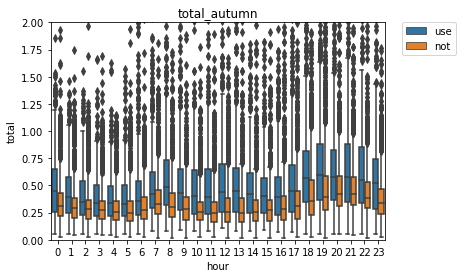

In [355]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_autumn, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_autumn')
plt.show()

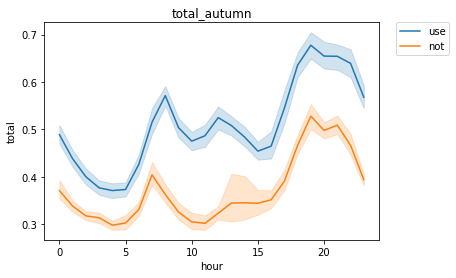

In [356]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_autumn, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_autumn')
plt.show()

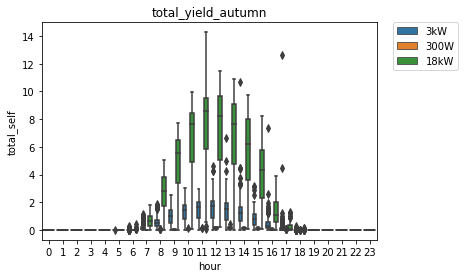

In [357]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_autumn')
plt.show()

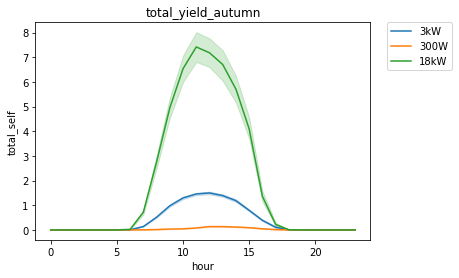

In [358]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_autumn')
plt.show()

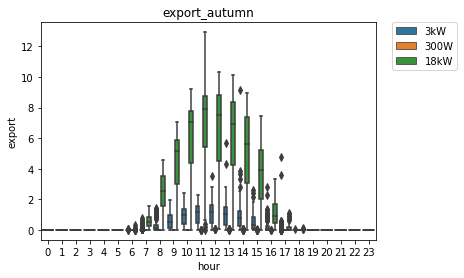

In [359]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_autumn')
plt.show()

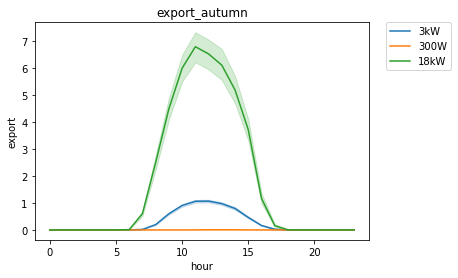

In [360]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_autumn')
plt.show()

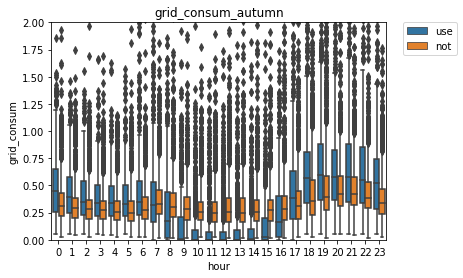

In [361]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_autumn, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_autumn')
plt.show()

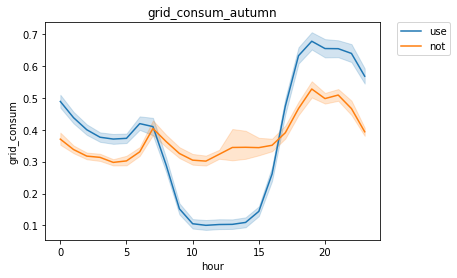

In [362]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_autumn, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_autumn')
plt.show()

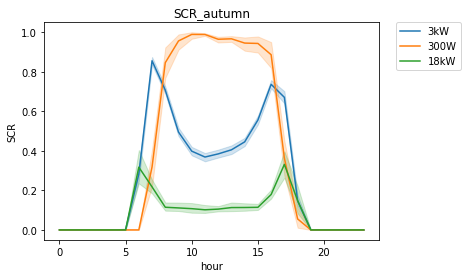

In [363]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_autumn')
plt.show()

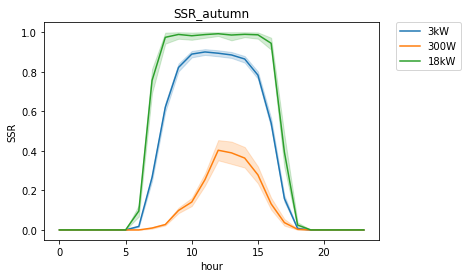

In [364]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_autumn')
plt.show()

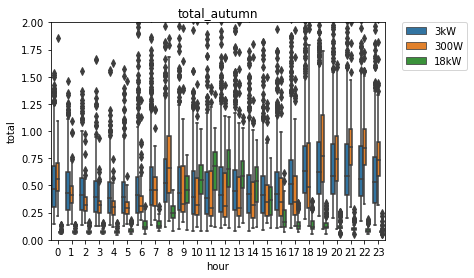

In [365]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_autumn')
plt.show()

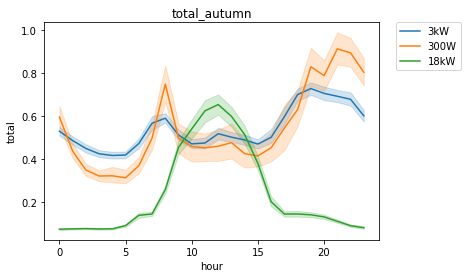

In [366]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_autumn')
plt.show()

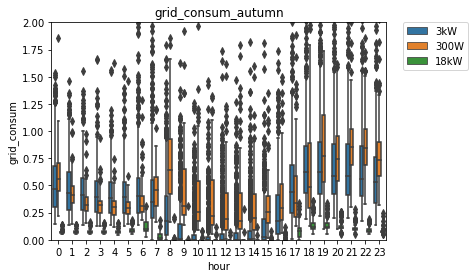

In [367]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_autumn')
plt.show()

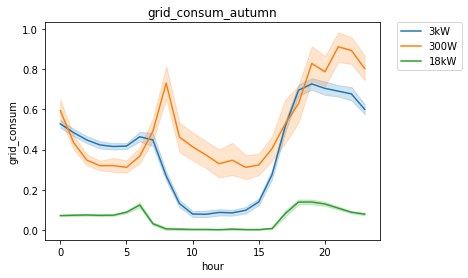

In [368]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_autumn, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_autumn')
plt.show()

<hr>

### 겨울(Winter)

In [369]:
df_all_hour_winter = df_all_hour[(df_all_hour.ym == '2021/12') | (df_all_hour.ym == '2022/1') | (df_all_hour.ym == '2022/2')]

In [370]:
# 총 전력 소비량
df_all_hour_winter.groupby(['type', '시간']).describe()['전력소비량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1561.0  0.412357  0.302099  0.019897  0.239990  0.359985  0.479980   
     1   1562.0  0.380123  0.285047  0.019897  0.222656  0.339844  0.440186   
     2   1562.0  0.368259  0.257673  0.040039  0.219971  0.320068  0.420166   
     3   1566.0  0.357912  0.221075  0.020020  0.210205  0.320068  0.420349   
     4   1565.0  0.358999  0.299992  0.020020  0.209961  0.310059  0.419922   
     5   1550.0  0.359120  0.351973  0.029907  0.199951  0.310059  0.420349   
     6   1561.0  0.387615  0.337888  0.020020  0.219971  0.330078  0.459961   
     7   1558.0  0.455169  0.414208  0.010010  0.280029  0.399902  0.539795   
     8   1558.0  0.435029  0.530737  0.019958  0.239990  0.350098  0.500000   
     9   1561.0  0.407476  0.580480  0.020020  0.209961  0.319946  0.450195   
     10  1569.0  0.397730  0.660159  0.010010  0.199951  0.290039  0.429932   
     11  1571.0  0.365813  0.443220  0.020020  0.179932  0.280029  0.410156   
     12  1562.0  0.366828  0.408297  0.010010  0.179932  0.280029  0.439941   
     13  1558.0  0.412559  2.170503  0.010010  0.179932  0.280029  0.430176   
     14  1559.0  0.372126  0.481104  0.019897  0.179932  0.280029  0.429932   
     15  1564.0  0.368486  0.583402  0.020020  0.189941  0.290039  0.419922   
     16  1567.0  0.411146  0.555799  0.019958  0.199951  0.310059  0.459961   
     17  1563.0  0.477813  0.479392  0.019897  0.229980  0.359985  0.549805   
     18  1542.0  0.558204  0.507364  0.019897  0.270020  0.419922  0.630371   
     19  1558.0  0.605640  0.726485  0.030029  0.310059  0.449951  0.639893   
     20  1554.0  0.574894  0.534990  0.020020  0.339966  0.469971  0.639893   
     21  1546.0  0.570580  0.539691  0.049927  0.349976  0.479980  0.639893   
     22  1563.0  0.515591  0.382215  0.020020  0.310059  0.449951  0.610107   
     23  1566.0  0.456047  0.512156  0.020020  0.270020  0.389893  0.529785   
use  0    886.0  0.565121  0.299868  0.029968  0.360107  0.560059  0.767426   
     1    888.0  0.508658  0.320174  0.049988  0.330078  0.500000  0.669983   
     2    890.0  0.473168  0.243401  0.039978  0.310059  0.450195  0.629974   
     3    889.0  0.448143  0.223216  0.030029  0.309937  0.439941  0.570312   
     4    890.0  0.453818  0.277194  0.049988  0.310059  0.439941  0.580078   
     5    891.0  0.446527  0.246885  0.029968  0.290039  0.420044  0.569824   
     6    881.0  0.492668  0.309716  0.049988  0.280029  0.449951  0.609863   
     7    879.0  0.605202  0.638897  0.049561  0.320068  0.500000  0.740112   
     8    884.0  0.700329  0.419562  0.071472  0.399994  0.620056  0.919922   
     9    882.0  0.673725  0.477251  0.081055  0.340088  0.589722  0.900146   
     10   878.0  0.628899  0.575838  0.079834  0.310036  0.559998  0.807465   
     11   878.0  0.601584  0.432832  0.090088  0.290184  0.549850  0.790009   
     12   880.0  0.602571  0.395021  0.079834  0.310025  0.540161  0.790039   
     13   878.0  0.591220  0.364677  0.079834  0.309990  0.529869  0.799561   
     14   875.0  0.569825  0.351474  0.080078  0.329834  0.519531  0.729980   
     15   885.0  0.551562  0.343565  0.070068  0.309814  0.489868  0.709961   
     16   887.0  0.567295  0.576413  0.060547  0.279541  0.479736  0.719971   
     17   883.0  0.658662  0.442274  0.057556  0.364990  0.589844  0.879883   
     18   885.0  0.776623  0.454067  0.079987  0.489990  0.709961  1.040039   
     19   885.0  0.807422  0.566541  0.069946  0.469971  0.719971  1.100098   
     20   886.0  0.762466  0.469608  0.070007  0.449982  0.699951  1.037170   
     21   877.0  0.731757  0.395544  0.039978  0.469971  0.700073  0.959961   
     22   885.0  0.690644  0.363515  0.040039  0.430054  0.679932  0.910156   
     23   884.0  0.642373  0.388963  0.039978  0.418701  0.630127  0.842651   

               max  
type 시간             
not  0    5.16992

In [371]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_winter_use = df_all_hour_winter[df_all_hour_winter.type == 'use']
df_all_hour_winter_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    90.0  0.077998  0.020347  0.029968  0.070007  0.070007   
         1    90.0  0.077111  0.018124  0.049988  0.069977  0.070007   
         2    90.0  0.075778  0.017800  0.039978  0.070007  0.070007   
         3    90.0  0.078002  0.026904  0.030029  0.069977  0.070007   
         4    90.0  0.076335  0.018753  0.049988  0.060028  0.070007   
         5    90.0  0.078664  0.027649  0.029968  0.069954  0.070007   
         6    90.0  0.131444  0.079231  0.049988  0.079956  0.099976   
         7    90.0  0.148590  0.067230  0.049561  0.100075  0.125549   
         8    90.0  0.190606  0.057698  0.071472  0.150391  0.191406   
         9    90.0  0.298318  0.105932  0.081055  0.213135  0.294922   
         10   90.0  0.491146  0.158632  0.119141  0.380859  0.530273   
         11   90.0  0.615473  0.169478  0.120117  0.520020  0.640137   
         12   90.0  0.658290  0.189287  0.179688  0.540283  0.670410   
         13   89.0  0.677987  0.189915  0.220703  0.560547  0.720703   
         14   90.0  0.579807  0.193661  0.189453  0.469727  0.585938   
         15   90.0  0.429709  0.149353  0.120117  0.309814  0.430176   
         16   90.0  0.195583  0.105351  0.060547  0.109619  0.159180   
         17   89.0  0.131665  0.065718  0.057556  0.099518  0.109985   
         18   90.0  0.145337  0.073948  0.079987  0.099976  0.110001   
         19   90.0  0.126107  0.048706  0.069946  0.100006  0.109985   
         20   90.0  0.113223  0.035907  0.070007  0.099976  0.105011   
         21   89.0  0.102644  0.026947  0.039978  0.089996  0.100006   
         22   90.0  0.091112  0.027534  0.040039  0.070007  0.089996   
         23   90.0  0.079739  0.022769  0.039978  0.069984  0.070007   
300W     0    90.0  0.657666  0.248303  0.280029  0.520020  0.625000   
         1    90.0  0.515883  0.182775  0.229980  0.385071  0.525024   
         2    90.0  0.434234  0.140858  0.189941  0.339844  0.419922   
         3    90.0  0.389901  0.096010  0.190186  0.320068  0.389893   
         4    90.0  0.372824  0.081923  0.200195  0.320068  0.369995   
         5    90.0  0.382001  0.186235  0.169922  0.310059  0.350098   
         6    90.0  0.396563  0.127020  0.220215  0.310059  0.380127   
         7    90.0  0.522106  0.386111  0.130127  0.359863  0.425049   
         8    89.0  0.777281  0.456621  0.129883  0.509766  0.659912   
         9    89.0  0.593624  0.399050  0.129852  0.320068  0.430161   
         10   90.0  0.482805  0.315426  0.119843  0.259953  0.360085   
         11   90.0  0.453561  0.364729  0.119843  0.240158  0.315155   
         12   90.0  0.423213  0.344864  0.119760  0.239887  0.309916   
         13   90.0  0.398219  0.355373  0.120013  0.215061  0.274915   
         14   90.0  0.402991  0.301400  0.120009  0.239893  0.329933   
         15   90.0  0.454888  0.372029  0.120002  0.239914  0.345070   
         16   90.0  0.514236  0.503458  0.110107  0.249989  0.335060   
         17   90.0  0.527098  0.464197  0.129883  0.262512  0.379883   
         18   90.0  0.660889  0.434467  0.120117  0.350098  0.549927   
         19   90.0  0.796351  0.502013  0.149902  0.402466  0.709961   
         20   90.0  0.834722  0.500266  0.129883  0.479980  0.679810   
         21   90.0  0.827203  0.370893  0.160156  0.492493  0.790039   
         22   90.0  0.826888  0.315852  0.260010  0.582581  0.804932   
         23   90.0  0.785452  0.294103  0.239990  0.587585  0.734863   
3kW      0   706.0  0.615421  0.266692  0.140015  0.410156  0.599854   
         1   708.0  0.562597  0.312628  0.150024  0.379974  0.539917   
         2   710.0  0.528477  0.220120  0.140015  0.360016  0.489990   
         3   709.0  0.502522  0.201084  0.160400  0.359863  0.469971   
         4   710.0  0.511935  0.270470  0.139893  0.359985  0.479980   
         5   711.0  0.501260  0.226451  0.119995  0.3

In [372]:
# 총 전력 생산량
df_all_hour_winter_use = df_all_hour_winter[df_all_hour_winter.type == 'use']
df_all_hour_winter_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.081152  0.119356  0.000000  0.009766  0.021484   
         8    90.0  1.702214  0.640708  0.021484  1.347656  1.719727   
         9    90.0  4.299251  1.212939  0.400391  3.715820  4.660156   
         10   90.0  6.481087  1.784449  0.839844  6.160645  7.009766   
         11   90.0  8.140180  1.941403  1.150391  7.587646  8.679688   
         12   90.0  8.783377  2.223070  1.660156  8.132568  9.315430   
         13   89.0  8.589196  2.263152  1.849609  7.710938  9.289062   
         14   90.0  7.649468  2.360357  2.019531  6.535156  8.019531   
         15   90.0  5.384147  1.966669  0.839844  3.975586  5.655273   
         16   90.0  1.586372  1.272232  0.120117  0.500000  1.065430   
         17   89.0  0.113193  0.162264  0.000000  0.000000  0.019531   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    89.0  0.002360  0.004528  0.000000  0.000000  0.000000   
         9    89.0  0.016405  0.011001  0.000000  0.009995  0.019989   
         10   90.0  0.029555  0.015572  0.000000  0.019989  0.029999   
         11   90.0  0.051890  0.021976  0.000000  0.029999  0.050003   
         12   90.0  0.127555  0.048280  0.000000  0.110004  0.140015   
         13   90.0  0.147999  0.061574  0.000000  0.112499  0.170013   
         14   90.0  0.133890  0.064052  0.009995  0.072506  0.150017   
         15   90.0  0.106776  0.057472  0.000000  0.050003  0.119995   
         16   90.0  0.039556  0.042078  0.000000  0.009995  0.020004   
         17   90.0  0.004445  0.009495  0.000000  0.000000  0.000000   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   708.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   709.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   711.0  0.000000  0.000000  0.000000  0.0

In [373]:
# 총 전력 수출량
df_all_hour_winter_use = df_all_hour_winter[df_all_hour_winter.type == 'use']
df_all_hour_winter_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.049230  0.086325  0.000000  0.000000  0.009766   
         8    90.0  1.515940  0.606606  0.000000  1.155273  1.560059   
         9    90.0  4.000933  1.151012  0.319336  3.412598  4.360352   
         10   90.0  5.989941  1.670845  0.720703  5.752686  6.479492   
         11   90.0  7.524707  1.822250  1.030273  6.995117  7.909668   
         12   90.0  8.125087  2.082725  1.390625  7.617920  8.705078   
         13   89.0  7.911210  2.112795  1.610352  7.110352  8.488281   
         14   90.0  7.069661  2.201783  1.830078  6.032227  7.450195   
         15   90.0  4.954438  1.839457  0.640625  3.677490  5.259766   
         16   90.0  1.400011  1.181840  0.059570  0.414551  0.939453   
         17   89.0  0.077368  0.123118  0.000000  0.000000  0.000000   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         9    89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   90.0  0.004000  0.009921  0.000000  0.000000  0.000000   
         13   90.0  0.009222  0.018677  0.000000  0.000000  0.000000   
         14   90.0  0.006444  0.014481  0.000000  0.000000  0.000000   
         15   90.0  0.002333  0.009125  0.000000  0.000000  0.000000   
         16   90.0  0.000222  0.001482  0.000000  0.000000  0.000000   
         17   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   708.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   709.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   711.0  0.000092  0.002454  0.000000  0.0

In [374]:
# 총 그리드 소비량
df_all_hour_winter.groupby(['type', '시간']).describe()['수전전력량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   1561.0  0.412357  0.302099  0.019897  0.239990  0.359985  0.479980   
     1   1562.0  0.380123  0.285047  0.019897  0.222656  0.339844  0.440186   
     2   1562.0  0.368259  0.257673  0.040039  0.219971  0.320068  0.420166   
     3   1566.0  0.357912  0.221075  0.020020  0.210205  0.320068  0.420349   
     4   1565.0  0.358999  0.299992  0.020020  0.209961  0.310059  0.419922   
     5   1550.0  0.359120  0.351973  0.029907  0.199951  0.310059  0.420349   
     6   1561.0  0.387615  0.337888  0.020020  0.219971  0.330078  0.459961   
     7   1558.0  0.455169  0.414208  0.010010  0.280029  0.399902  0.539795   
     8   1558.0  0.435029  0.530737  0.019958  0.239990  0.350098  0.500000   
     9   1561.0  0.407476  0.580480  0.020020  0.209961  0.319946  0.450195   
     10  1569.0  0.397730  0.660159  0.010010  0.199951  0.290039  0.429932   
     11  1571.0  0.365813  0.443220  0.020020  0.179932  0.280029  0.410156   
     12  1562.0  0.366828  0.408297  0.010010  0.179932  0.280029  0.439941   
     13  1558.0  0.412559  2.170503  0.010010  0.179932  0.280029  0.430176   
     14  1559.0  0.372126  0.481104  0.019897  0.179932  0.280029  0.429932   
     15  1564.0  0.368486  0.583402  0.020020  0.189941  0.290039  0.419922   
     16  1567.0  0.411146  0.555799  0.019958  0.199951  0.310059  0.459961   
     17  1563.0  0.477813  0.479392  0.019897  0.229980  0.359985  0.549805   
     18  1542.0  0.558204  0.507364  0.019897  0.270020  0.419922  0.630371   
     19  1558.0  0.605640  0.726485  0.030029  0.310059  0.449951  0.639893   
     20  1554.0  0.574894  0.534990  0.020020  0.339966  0.469971  0.639893   
     21  1546.0  0.570580  0.539691  0.049927  0.349976  0.479980  0.639893   
     22  1563.0  0.515591  0.382215  0.020020  0.310059  0.449951  0.610107   
     23  1566.0  0.456047  0.512156  0.020020  0.270020  0.389893  0.529785   
use  0    886.0  0.565194  0.299777  0.029968  0.360107  0.560059  0.767426   
     1    888.0  0.508732  0.320101  0.049988  0.330078  0.500000  0.669983   
     2    890.0  0.473242  0.243316  0.039978  0.310059  0.450195  0.629974   
     3    889.0  0.448217  0.223131  0.030029  0.309937  0.439941  0.570312   
     4    890.0  0.453891  0.277125  0.049988  0.310059  0.439941  0.580078   
     5    891.0  0.446601  0.246809  0.029968  0.290039  0.420044  0.569824   
     6    881.0  0.492742  0.309644  0.049988  0.280029  0.449951  0.609863   
     7    879.0  0.592653  0.640527  0.010010  0.310059  0.489990  0.729980   
     8    884.0  0.513585  0.431360  0.000000  0.200043  0.420166  0.729980   
     9    882.0  0.274861  0.432424  0.000000  0.010010  0.119629  0.380066   
     10   878.0  0.158833  0.455349  0.000000  0.000000  0.010010  0.170166   
     11   878.0  0.108981  0.252491  0.000000  0.000000  0.000000  0.090088   
     12   880.0  0.094771  0.228373  0.000000  0.000000  0.000000  0.062531   
     13   878.0  0.088695  0.208303  0.000000  0.000000  0.000000  0.070068   
     14   875.0  0.102512  0.215401  0.000000  0.000000  0.000000  0.100098   
     15   885.0  0.167530  0.278757  0.000000  0.000000  0.040039  0.229980   
     16   887.0  0.374093  0.462821  0.000000  0.050049  0.270020  0.545044   
     17   883.0  0.620601  0.437981  0.000000  0.320007  0.560059  0.839844   
     18   885.0  0.776641  0.454079  0.079987  0.489990  0.709961  1.040039   
     19   885.0  0.796761  0.464239  0.069946  0.469971  0.719971  1.100098   
     20   886.0  0.762475  0.469606  0.070007  0.449982  0.699951  1.037170   
     21   877.0  0.731665  0.395452  0.039978  0.469971  0.700073  0.959961   
     22   885.0  0.690687  0.363384  0.040039  0.430054  0.679932  0.910156   
     23   884.0  0.642447  0.388878  0.039978  0.418701  0.630127  0.842651   

               max  
type 시간             
not  0    5.16992

In [375]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_winter_use = df_all_hour_winter[df_all_hour_winter.type == 'use']
df_all_hour_winter_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    90.0  0.077998  0.020347  0.029968  0.070007  0.070007   
         1    90.0  0.077111  0.018124  0.049988  0.069977  0.070007   
         2    90.0  0.075778  0.017800  0.039978  0.070007  0.070007   
         3    90.0  0.078002  0.026904  0.030029  0.069977  0.070007   
         4    90.0  0.076335  0.018753  0.049988  0.060028  0.070007   
         5    90.0  0.078664  0.027649  0.029968  0.069954  0.070007   
         6    90.0  0.131444  0.079231  0.049988  0.079956  0.099976   
         7    90.0  0.116667  0.059194  0.010010  0.080017  0.100006   
         8    90.0  0.004332  0.011518  0.000000  0.000000  0.000000   
         9    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         10   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         11   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         12   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         13   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         14   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         15   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         16   90.0  0.009222  0.022399  0.000000  0.000000  0.000000   
         17   89.0  0.095839  0.067583  0.000000  0.049988  0.089996   
         18   90.0  0.145337  0.073948  0.079987  0.099976  0.110001   
         19   90.0  0.126107  0.048706  0.069946  0.100006  0.109985   
         20   90.0  0.113223  0.035907  0.070007  0.099976  0.105011   
         21   89.0  0.102644  0.026947  0.039978  0.089996  0.100006   
         22   90.0  0.091112  0.027534  0.040039  0.070007  0.089996   
         23   90.0  0.079739  0.022769  0.039978  0.069984  0.070007   
300W     0    90.0  0.657666  0.248303  0.280029  0.520020  0.625000   
         1    90.0  0.515883  0.182775  0.229980  0.385071  0.525024   
         2    90.0  0.434234  0.140858  0.189941  0.339844  0.419922   
         3    90.0  0.389901  0.096010  0.190186  0.320068  0.389893   
         4    90.0  0.372824  0.081923  0.200195  0.320068  0.369995   
         5    90.0  0.382001  0.186235  0.169922  0.310059  0.350098   
         6    90.0  0.396563  0.127020  0.220215  0.310059  0.380127   
         7    90.0  0.522106  0.386111  0.130127  0.359863  0.425049   
         8    89.0  0.774922  0.457043  0.129883  0.500000  0.659912   
         9    89.0  0.577220  0.400170  0.109863  0.310059  0.420410   
         10   90.0  0.453250  0.316356  0.089844  0.229980  0.354858   
         11   90.0  0.401671  0.368826  0.050049  0.179993  0.260254   
         12   90.0  0.299658  0.340601  0.009766  0.102600  0.174805   
         13   90.0  0.259443  0.364068  0.000000  0.070068  0.160156   
         14   90.0  0.275545  0.298846  0.000000  0.105042  0.199951   
         15   90.0  0.350445  0.371903  0.000000  0.152588  0.220093   
         16   90.0  0.474902  0.494943  0.040039  0.202454  0.310059   
         17   90.0  0.522654  0.464802  0.129883  0.262329  0.369751   
         18   90.0  0.660889  0.434467  0.120117  0.350098  0.549927   
         19   90.0  0.796351  0.502013  0.149902  0.402466  0.709961   
         20   90.0  0.834722  0.500266  0.129883  0.479980  0.679810   
         21   90.0  0.827203  0.370893  0.160156  0.492493  0.790039   
         22   90.0  0.826888  0.315852  0.260010  0.582581  0.804932   
         23   90.0  0.785452  0.294103  0.239990  0.587585  0.734863   
3kW      0   706.0  0.615513  0.266545  0.140015  0.410156  0.599854   
         1   708.0  0.562689  0.312518  0.150024  0.379974  0.539917   
         2   710.0  0.528569  0.219979  0.140015  0.360016  0.489990   
         3   709.0  0.502614  0.200941  0.169922  0.359863  0.469971   
         4   710.0  0.512027  0.270361  0.139893  0.359985  0.479980   
         5   711.0  0.501352  0.226325  0.119995  0.3

In [376]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_winter_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.525506  0.371149  0.000000  0.255351  0.504098   
         8    90.0  0.130367  0.103334  0.047676  0.092573  0.113189   
         9    90.0  0.072967  0.027353  0.029958  0.055406  0.067866   
         10   90.0  0.077511  0.018268  0.030218  0.067400  0.078391   
         11   90.0  0.076931  0.015318  0.038317  0.071273  0.076252   
         12   90.0  0.077154  0.019237  0.046961  0.066075  0.075272   
         13   89.0  0.080508  0.014907  0.036973  0.073332  0.077791   
         14   90.0  0.077493  0.014633  0.035074  0.071169  0.078739   
         15   90.0  0.084216  0.023289  0.045598  0.072697  0.081835   
         16   90.0  0.167684  0.099390  0.049465  0.098526  0.140604   
         17   89.0  0.312225  0.340778  0.000000  0.000000  0.252427   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    89.0  0.224719  0.419762  0.000000  0.000000  0.000000   
         9    89.0  0.853933  0.355175  0.000000  1.000000  1.000000   
         10   90.0  0.966667  0.180511  0.000000  1.000000  1.000000   
         11   90.0  0.988889  0.105409  0.000000  1.000000  1.000000   
         12   90.0  0.951241  0.158414  0.000000  1.000000  1.000000   
         13   90.0  0.939773  0.138170  0.000000  0.938420  1.000000   
         14   90.0  0.962703  0.079989  0.666707  0.964285  1.000000   
         15   90.0  0.962088  0.156265  0.000000  1.000000  1.000000   
         16   90.0  0.819894  0.383734  0.000000  1.000000  1.000000   
         17   90.0  0.244444  0.432165  0.000000  0.000000  0.000000   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   708.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   709.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   711.0  0.000000  0.000000  0.000000  0.0

In [377]:
# SSR(자가공급률)
df_all_hour_winter_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\mazy4\anaconda3\envs\Energy_Analysis\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                            
18kW     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.203788  0.211306  0.000000  0.057523  0.115194   
         8    90.0  0.969196  0.102783  0.300598  1.000000  1.000000   
         9    90.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         10   90.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         11   90.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         12   90.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         13   89.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         14   90.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         15   90.0  1.000000  0.000000  1.000000  1.000000  1.000000   
         16   90.0  0.936754  0.126351  0.286775  0.917940  1.000000   
         17   89.0  0.280843  0.321380  0.000000  0.000000  0.170883   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   89.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         7    90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         8    89.0  0.003971  0.008386  0.000000  0.000000  0.000000   
         9    89.0  0.038892  0.032617  0.000000  0.015628  0.032620   
         10   90.0  0.086889  0.067211  0.000000  0.037782  0.069057   
         11   90.0  0.169125  0.113481  0.000000  0.090938  0.140883   
         12   90.0  0.408066  0.242281  0.000000  0.208789  0.410282   
         13   90.0  0.479904  0.264501  0.000000  0.258784  0.494421   
         14   90.0  0.420964  0.280416  0.020855  0.186430  0.383842   
         15   90.0  0.319262  0.231346  0.000000  0.125016  0.264986   
         16   90.0  0.106342  0.138977  0.000000  0.027709  0.053859   
         17   90.0  0.010808  0.023750  0.000000  0.000000  0.000000   
         18   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         19   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         20   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   90.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   706.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   708.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   709.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   710.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5   711.0  0.000000  0.000000  0.000000  0.0

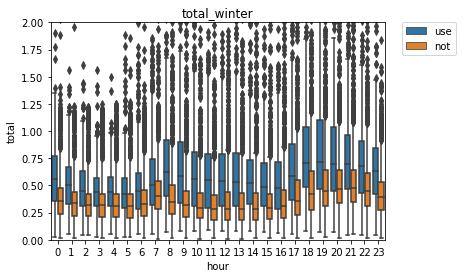

In [378]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_winter, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_winter')
plt.show()

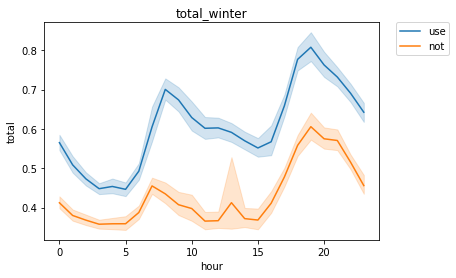

In [379]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_winter, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_winter')
plt.show()

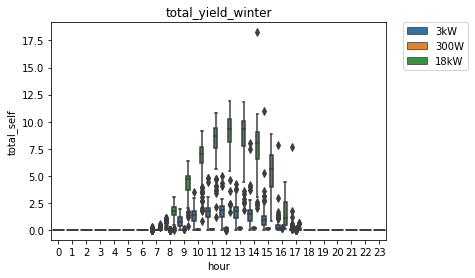

In [380]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_winter')
plt.show()

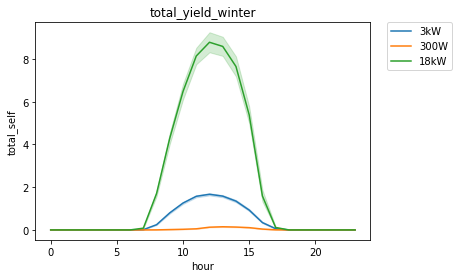

In [381]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_winter')
plt.show()

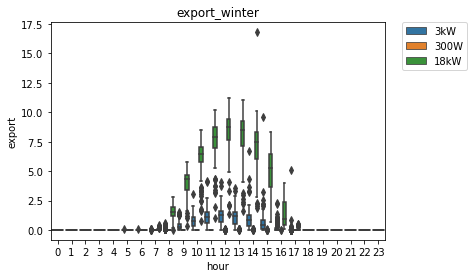

In [382]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_winter')
plt.show()

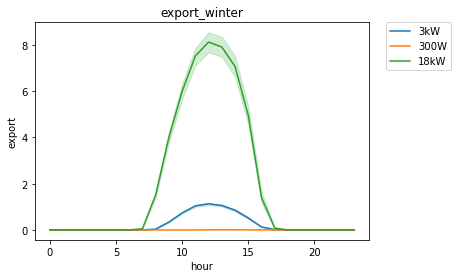

In [383]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_winter')
plt.show()

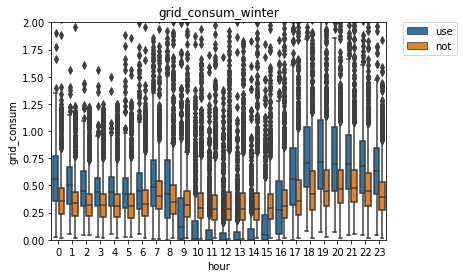

In [384]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_winter, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_winter')
plt.show()

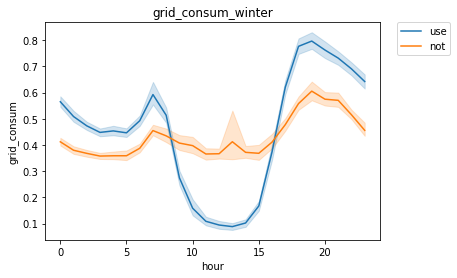

In [385]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_winter, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_winter')
plt.show()

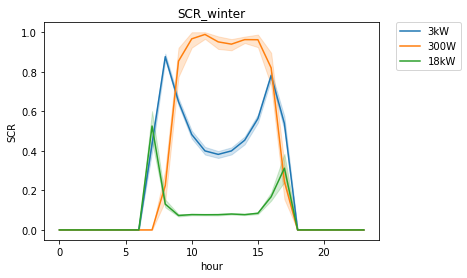

In [386]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_winter')
plt.show()

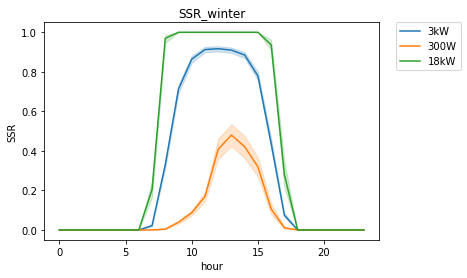

In [387]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_winter')
plt.show()

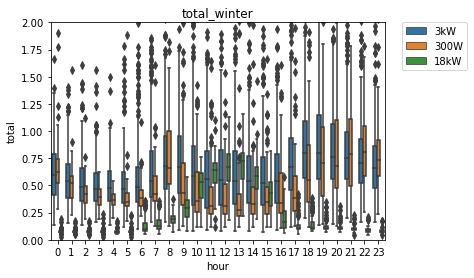

In [388]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_winter')
plt.show()

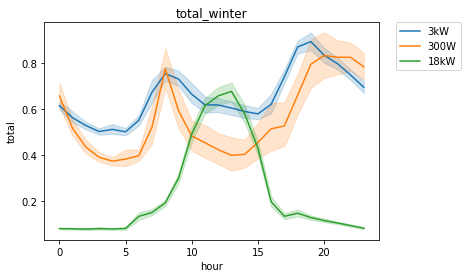

In [389]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_winter')
plt.show()

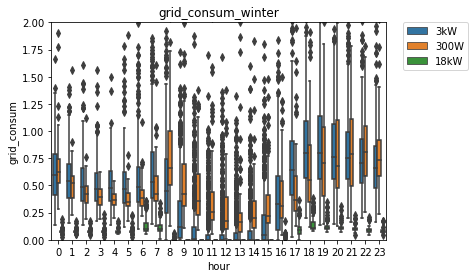

In [390]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_winter')
plt.show()

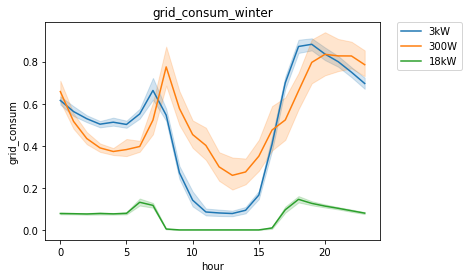

In [391]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_winter, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_winter')
plt.show()

<hr>

## **<1년(total)>**

### 2021.05 ~ 2022.04

In [392]:
df_all_hour_year = df_all_hour[(df_all_hour.ym == '2021/5') | (df_all_hour.ym == '2021/6') | (df_all_hour.ym == '2021/7') |
                              (df_all_hour.ym == '2021/8') | (df_all_hour.ym == '2021/9') | (df_all_hour.ym == '2021/10') |
                              (df_all_hour.ym == '2021/11') | (df_all_hour.ym == '2021/12') | (df_all_hour.ym == '2022/1') |
                              (df_all_hour.ym == '2022/2') | (df_all_hour.ym == '2022/3') | (df_all_hour.ym == '2022/4')]

In [393]:
# 총 전력 소비량
df_all_hour_year.groupby(['type', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   6180.0  0.392641  0.367400  0.019897  0.219971  0.320068  0.460083   
     1   6198.0  0.360639  0.298882  0.019897  0.209961  0.299927  0.420166   
     2   6189.0  0.336652  0.233026  0.030029  0.199951  0.289795  0.399902   
     3   6200.0  0.325111  0.225162  0.020020  0.190002  0.279907  0.389893   
     4   6205.0  0.315723  0.232330  0.020020  0.180054  0.270020  0.379883   
     5   6166.0  0.319376  0.314468  0.029907  0.179932  0.260010  0.380005   
     6   6174.0  0.364238  0.762832  0.020020  0.200073  0.299927  0.420044   
     7   6163.0  0.422360  0.416753  0.010010  0.250000  0.359985  0.489990   
     8   6193.0  0.383552  0.397327  0.010010  0.219727  0.319824  0.449951   
     9   6180.0  0.357842  0.463775  0.019958  0.190002  0.290039  0.410034   
     10  6194.0  0.355409  0.712906  0.010010  0.180054  0.279785  0.390137   
     11  6177.0  0.353305  0.844250  0.020020  0.169922  0.260010  0.390137   
     12  6164.0  0.350219  0.390660  0.010010  0.169983  0.270020  0.410034   
     13  6167.0  0.434524  5.044431  0.010010  0.169983  0.260254  0.400146   
     14  6166.0  0.362632  0.792342  0.019897  0.170044  0.270020  0.399902   
     15  6164.0  0.356115  0.480333  0.019897  0.179932  0.279907  0.399902   
     16  6158.0  0.381266  0.533831  0.019958  0.189941  0.290039  0.420044   
     17  6162.0  0.425628  0.461314  0.019897  0.200073  0.319946  0.489990   
     18  6128.0  0.493828  0.483407  0.019897  0.229980  0.359985  0.570068   
     19  6160.0  0.547371  0.662090  0.019958  0.270020  0.400024  0.609863   
     20  6145.0  0.552926  0.492383  0.020020  0.310059  0.439941  0.620117   
     21  6154.0  0.553631  0.529421  0.039978  0.329834  0.440186  0.619995   
     22  6187.0  0.492463  0.390331  0.020020  0.290039  0.409973  0.580078   
     23  6177.0  0.427288  0.373109  0.020020  0.239990  0.359863  0.510010   
use  0   3583.0  0.502179  0.310406  0.029968  0.280029  0.460022  0.660156   
     1   3580.0  0.454248  0.313453  0.030029  0.260010  0.410095  0.590088   
     2   3588.0  0.414573  0.235768  0.039978  0.250000  0.380127  0.550049   
     3   3581.0  0.395143  0.223659  0.030029  0.239990  0.369629  0.520020   
     4   3573.0  0.389486  0.231605  0.039978  0.229980  0.359985  0.520020   
     5   3573.0  0.392829  0.223509  0.029968  0.239990  0.359863  0.510010   
     6   3557.0  0.439687  0.317755  0.049805  0.249992  0.380005  0.550049   
     7   3551.0  0.547761  0.482223  0.049500  0.299805  0.450012  0.679932   
     8   3562.0  0.618136  0.443044  0.071472  0.340210  0.529907  0.770020   
     9   3567.0  0.559658  0.396171  0.080078  0.299988  0.470703  0.710136   
     10  3567.0  0.523520  0.401421  0.070312  0.260742  0.449951  0.679932   
     11  3553.0  0.535711  0.421736  0.050537  0.260010  0.440186  0.699951   
     12  3554.0  0.565838  0.429401  0.079834  0.279785  0.469971  0.739868   
     13  3554.0  0.554792  0.394796  0.060059  0.279937  0.469971  0.701172   
     14  3560.0  0.534069  0.391285  0.026428  0.270142  0.440186  0.669830   
     15  3568.0  0.521292  0.459974  0.070068  0.269985  0.429993  0.630100   
     16  3581.0  0.526736  0.489992  0.060547  0.269775  0.429932  0.639893   
     17  3576.0  0.581942  0.459897  0.057556  0.290009  0.470085  0.739990   
     18  3571.0  0.683113  0.455385  0.049988  0.360046  0.589844  0.889893   
     19  3576.0  0.741819  0.522261  0.049988  0.390015  0.630005  1.000000   
     20  3572.0  0.717602  0.478673  0.049988  0.409668  0.619873  0.942566   
     21  3562.0  0.691217  0.427003  0.039978  0.390137  0.620071  0.919922   
     22  3571.0  0.649445  0.411811  0.040039  0.379990  0.590088  0.850098   
     23  3571.0  0.580017  0.374758  0.039978  0.320007  0.530029  0.760254   

                max  
type 시간              
not  0    12.57

In [394]:
# 총 전력 소비량 : 태양광 사용 가구 한정
df_all_hour_year_use = df_all_hour_year[df_all_hour_year.type == 'use']
df_all_hour_year_use.groupby(['설비용량(kW)', '시간']).describe()['전력소비량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                             
18kW     0    362.0  0.089584  0.051650  0.029968  0.060005  0.070007   
         1    362.0  0.089697  0.053137  0.030029  0.062531  0.070007   
         2    361.0  0.088393  0.051014  0.039978  0.059998  0.070007   
         3    362.0  0.087128  0.050202  0.030029  0.059998  0.070007   
         4    364.0  0.096676  0.119813  0.039978  0.060003  0.070007   
         5    365.0  0.105850  0.060918  0.029968  0.070007  0.080017   
         6    365.0  0.150739  0.080730  0.049805  0.089996  0.130005   
         7    364.0  0.202242  0.092143  0.049500  0.120445  0.181671   
         8    364.0  0.275745  0.121866  0.071472  0.190430  0.250000   
         9    365.0  0.431490  0.187088  0.081055  0.279297  0.429688   
         10   364.0  0.555535  0.227666  0.079834  0.400269  0.564453   
         11   365.0  0.640567  0.250084  0.087891  0.489258  0.660156   
         12   365.0  0.694629  0.260900  0.099609  0.510254  0.700195   
         13   364.0  0.645573  0.248874  0.091797  0.479980  0.674805   
         14   365.0  0.583180  0.244594  0.089844  0.379883  0.598633   
         15   365.0  0.444750  0.202477  0.070312  0.280273  0.430664   
         16   362.0  0.296479  0.173930  0.060547  0.149632  0.269897   
         17   361.0  0.189444  0.106966  0.057556  0.110016  0.159882   
         18   362.0  0.182303  0.105475  0.049988  0.109985  0.149887   
         19   362.0  0.166001  0.100623  0.049988  0.109985  0.130005   
         20   361.0  0.152217  0.092676  0.049988  0.100006  0.119995   
         21   360.0  0.128210  0.072108  0.039978  0.089996  0.100006   
         22   362.0  0.105690  0.061425  0.040039  0.070007  0.084991   
         23   362.0  0.093720  0.055802  0.039978  0.069946  0.070007   
300W     0    356.0  0.604385  0.230476  0.109863  0.469971  0.560059   
         1    356.0  0.460610  0.181866  0.110352  0.349976  0.430176   
         2    356.0  0.391939  0.156850  0.089844  0.299942  0.360352   
         3    356.0  0.354316  0.113712  0.100098  0.279907  0.339844   
         4    356.0  0.343893  0.142427  0.120117  0.269958  0.329956   
         5    356.0  0.345116  0.155619  0.149902  0.270020  0.320312   
         6    356.0  0.370269  0.161684  0.100098  0.270016  0.334961   
         7    355.0  0.580168  0.362628  0.089844  0.359863  0.489975   
         8    355.0  0.822436  0.485005  0.109863  0.479980  0.720215   
         9    355.0  0.580028  0.446931  0.110086  0.299988  0.430145   
         10   355.0  0.482592  0.347399  0.100311  0.250046  0.370026   
         11   355.0  0.483618  0.378876  0.109770  0.249908  0.339783   
         12   354.0  0.476332  0.392251  0.109991  0.240030  0.330044   
         13   356.0  0.479493  0.435057  0.120013  0.237464  0.319995   
         14   356.0  0.461597  0.402698  0.110019  0.237381  0.350010   
         15   356.0  0.475137  0.387580  0.100001  0.247322  0.359995   
         16   355.0  0.509022  0.455356  0.100002  0.259995  0.359848   
         17   355.0  0.559295  0.510606  0.129883  0.269981  0.400070   
         18   354.0  0.688347  0.514850  0.120117  0.340005  0.520020   
         19   355.0  0.878284  0.556117  0.100098  0.444946  0.760010   
         20   355.0  0.913621  0.547547  0.090332  0.529892  0.780029   
         21   354.0  0.952879  0.510070  0.119629  0.609863  0.849731   
         22   355.0  0.887957  0.403418  0.090332  0.619995  0.799988   
         23   355.0  0.796131  0.340997  0.109863  0.580078  0.709991   
3kW      0   2865.0  0.541612  0.298690  0.140015  0.320068  0.489990   
         1   2862.0  0.499567  0.315556  0.139954  0.299988  0.449951   
         2   2871.0  0.458393  0.225248  0.130005  0.289917  0.420166   
         3   2863.0  0.439165  0.215650  0.100098  0.270020  0.409912   
         4   2853.0  0.432534  0.223103  0.130005  0.260010  0.409912   

In [395]:
# 총 전력 생산량
df_all_hour_year_use = df_all_hour_year[df_all_hour_year.type == 'use']
df_all_hour_year_use.groupby(['설비용량(kW)', '시간']).describe()['발전량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                             
18kW     0    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    361.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    364.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    365.0  0.005681  0.019551  0.000000  0.000000  0.000000   
         6    365.0  0.218081  0.337861  0.000000  0.000000  0.009766   
         7    364.0  1.022776  0.965450  0.000000  0.129639  0.705566   
         8    364.0  2.870682  1.588331  0.000000  1.634033  2.725098   
         9    365.0  4.972262  2.124404  0.000000  3.450195  5.201172   
         10   364.0  6.681405  2.604410  0.009766  5.339478  7.314453   
         11   365.0  7.752053  2.971994  0.029785  6.289062  8.718750   
         12   365.0  8.011248  3.038370  0.030273  5.810059  8.988281   
         13   364.0  7.750700  3.035198  0.020508  5.909668  8.625488   
         14   365.0  6.720960  2.979909  0.000000  4.640625  7.619141   
         15   365.0  5.036675  2.512737  0.009766  3.119629  5.339844   
         16   362.0  2.609804  1.989711  0.000000  0.800049  2.189941   
         17   361.0  0.735661  0.787295  0.000000  0.020508  0.389648   
         18   362.0  0.160672  0.264521  0.000000  0.000000  0.000000   
         19   362.0  0.003074  0.012724  0.000000  0.000000  0.000000   
         20   361.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   360.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    356.0  0.001461  0.003914  0.000000  0.000000  0.000000   
         7    355.0  0.007732  0.010415  0.000000  0.000000  0.000000   
         8    355.0  0.018479  0.016345  0.000000  0.000000  0.019989   
         9    355.0  0.040549  0.025004  0.000000  0.020004  0.039993   
         10   355.0  0.057014  0.034306  0.000000  0.029999  0.050003   
         11   355.0  0.084719  0.042924  0.000000  0.050003  0.080002   
         12   354.0  0.136864  0.060099  0.000000  0.090012  0.149994   
         13   356.0  0.146854  0.069604  0.000000  0.089999  0.164993   
         14   356.0  0.137950  0.069082  0.000000  0.080002  0.150005   
         15   356.0  0.113679  0.064049  0.000000  0.059998  0.119995   
         16   355.0  0.070282  0.057184  0.000000  0.020002  0.059998   
         17   355.0  0.032929  0.038786  0.000000  0.000000  0.010010   
         18   354.0  0.009407  0.016160  0.000000  0.000000  0.000000   
         19   355.0  0.000225  0.001486  0.000000  0.000000  0.000000   
         20   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   354.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   2865.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   2862.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   2871.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   2863.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   2853.0  0.000000  0.000000  0.000000  0.000000  0.000000   

In [396]:
# 총 전력 수출량
df_all_hour_year_use = df_all_hour_year[df_all_hour_year.type == 'use']
df_all_hour_year_use.groupby(['설비용량(kW)', '시간']).describe()['잉여전력량(kWh)']

count      mean       std  min       25%       50%       75%  \
설비용량(kW) 시간                                                                  
18kW     0    362.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         1    362.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         2    361.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         3    362.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         4    364.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         5    365.0  0.002215  0.011770  0.0  0.000000  0.000000  0.000000   
         6    365.0  0.160630  0.272316  0.0  0.000000  0.000000  0.230469   
         7    364.0  0.868337  0.865115  0.0  0.060547  0.570312  1.502563   
         8    364.0  2.598921  1.481678  0.0  1.429688  2.469727  3.832520   
         9    365.0  4.542032  1.969989  0.0  3.080078  4.750000  6.040039   
         10   364.0  6.127051  2.417014  0.0  4.807617  6.724854  8.004883   
         11   365.0  7.113514  2.765336  0.0  5.740234  7.990234  9.080078   
         12   365.0  7.317687  2.821969  0.0  5.330078  8.239746  9.419922   
         13   364.0  7.106528  2.838968  0.0  5.360107  7.950195  9.232910   
         14   365.0  6.139370  2.775808  0.0  4.179688  6.949219  8.229492   
         15   365.0  4.594965  2.338253  0.0  2.799805  4.799805  6.489746   
         16   362.0  2.320093  1.833815  0.0  0.659424  1.910156  3.702759   
         17   361.0  0.597518  0.686432  0.0  0.000000  0.269531  1.110352   
         18   362.0  0.099820  0.188482  0.0  0.000000  0.000000  0.119507   
         19   362.0  0.000718  0.006321  0.0  0.000000  0.000000  0.000000   
         20   361.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         21   360.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         22   362.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         23   362.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
300W     0    356.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         1    356.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         2    356.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         3    356.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         4    356.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         5    356.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         6    356.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         7    355.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         8    355.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         9    355.0  0.000028  0.000531  0.0  0.000000  0.000000  0.000000   
         10   355.0  0.000113  0.001057  0.0  0.000000  0.000000  0.000000   
         11   355.0  0.000901  0.004086  0.0  0.000000  0.000000  0.000000   
         12   354.0  0.004972  0.013720  0.0  0.000000  0.000000  0.000000   
         13   356.0  0.007051  0.017149  0.0  0.000000  0.000000  0.010000   
         14   356.0  0.006208  0.016374  0.0  0.000000  0.000000  0.000000   
         15   356.0  0.003202  0.012190  0.0  0.000000  0.000000  0.000000   
         16   355.0  0.000958  0.006654  0.0  0.000000  0.000000  0.000000   
         17   355.0  0.000113  0.001057  0.0  0.000000  0.000000  0.000000   
         18   354.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         19   355.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         20   355.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         21   354.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         22   355.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         23   355.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
3kW      0   2865.0  0.000000  0.000000  0.0  0.000000  0.000000  0.000000   
         1   2862.0  0.000000  0.000

In [397]:
# 총 그리드 소비량
df_all_hour_year.groupby(['type', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%       75%  \
type 시간                                                                       
not  0   6180.0  0.392641  0.367400  0.019897  0.219971  0.320068  0.460083   
     1   6198.0  0.360639  0.298882  0.019897  0.209961  0.299927  0.420166   
     2   6189.0  0.336652  0.233026  0.030029  0.199951  0.289795  0.399902   
     3   6200.0  0.325111  0.225162  0.020020  0.190002  0.279907  0.389893   
     4   6205.0  0.315723  0.232330  0.020020  0.180054  0.270020  0.379883   
     5   6166.0  0.319376  0.314468  0.029907  0.179932  0.260010  0.380005   
     6   6174.0  0.364238  0.762832  0.020020  0.200073  0.299927  0.420044   
     7   6163.0  0.422360  0.416753  0.010010  0.250000  0.359985  0.489990   
     8   6193.0  0.383552  0.397327  0.010010  0.219727  0.319824  0.449951   
     9   6180.0  0.357842  0.463775  0.019958  0.190002  0.290039  0.410034   
     10  6194.0  0.355409  0.712906  0.010010  0.180054  0.279785  0.390137   
     11  6177.0  0.353305  0.844250  0.020020  0.169922  0.260010  0.390137   
     12  6164.0  0.350219  0.390660  0.010010  0.169983  0.270020  0.410034   
     13  6167.0  0.434524  5.044431  0.010010  0.169983  0.260254  0.400146   
     14  6166.0  0.362632  0.792342  0.019897  0.170044  0.270020  0.399902   
     15  6164.0  0.356115  0.480333  0.019897  0.179932  0.279907  0.399902   
     16  6158.0  0.381266  0.533831  0.019958  0.189941  0.290039  0.420044   
     17  6162.0  0.425628  0.461314  0.019897  0.200073  0.319946  0.489990   
     18  6128.0  0.493828  0.483407  0.019897  0.229980  0.359985  0.570068   
     19  6160.0  0.547371  0.662090  0.019958  0.270020  0.400024  0.609863   
     20  6145.0  0.552926  0.492383  0.020020  0.310059  0.439941  0.620117   
     21  6154.0  0.553631  0.529421  0.039978  0.329834  0.440186  0.619995   
     22  6187.0  0.492463  0.390331  0.020020  0.290039  0.409973  0.580078   
     23  6177.0  0.427288  0.373109  0.020020  0.239990  0.359863  0.510010   
use  0   3583.0  0.502296  0.310518  0.029968  0.280029  0.460022  0.660156   
     1   3580.0  0.453591  0.298833  0.030029  0.260010  0.410095  0.590088   
     2   3588.0  0.414610  0.235759  0.039978  0.250000  0.380127  0.550049   
     3   3581.0  0.395161  0.223642  0.030029  0.239990  0.369629  0.520020   
     4   3573.0  0.389504  0.231589  0.039978  0.229980  0.359985  0.520020   
     5   3573.0  0.391087  0.223627  0.029968  0.239990  0.354980  0.510010   
     6   3557.0  0.405259  0.326001  0.000000  0.210083  0.340027  0.529907   
     7   3551.0  0.418888  0.500623  0.000000  0.130005  0.320068  0.559998   
     8   3562.0  0.337869  0.457433  0.000000  0.020020  0.199951  0.510010   
     9   3567.0  0.184503  0.348328  0.000000  0.000000  0.029999  0.239990   
     10  3567.0  0.117978  0.304288  0.000000  0.000000  0.000000  0.109985   
     11  3553.0  0.105551  0.282850  0.000000  0.000000  0.000000  0.079956   
     12  3554.0  0.106993  0.283116  0.000000  0.000000  0.000000  0.070068   
     13  3554.0  0.104964  0.253539  0.000000  0.000000  0.000000  0.080078   
     14  3560.0  0.110636  0.254422  0.000000  0.000000  0.000000  0.100098   
     15  3568.0  0.149492  0.319217  0.000000  0.000000  0.020020  0.189941   
     16  3581.0  0.252830  0.384005  0.000000  0.009949  0.109863  0.370117   
     17  3576.0  0.436589  0.427304  0.000000  0.120026  0.330078  0.630005   
     18  3571.0  0.641838  0.461832  0.000000  0.309998  0.559814  0.859863   
     19  3576.0  0.736514  0.496265  0.049988  0.380127  0.629883  0.989990   
     20  3572.0  0.717639  0.478663  0.049988  0.409668  0.619873  0.942566   
     21  3562.0  0.691442  0.427218  0.039978  0.390137  0.620117  0.919922   
     22  3571.0  0.649349  0.410331  0.040039  0.379990  0.590088  0.850098   
     23  3571.0  0.580323  0.376162  0.039978  0.320007  0.530029  0.760254   

                max  
type 시간              
not  0    12.57

In [398]:
# 총 그리드 소비량 : 태양광 사용 가구 한정
df_all_hour_year_use = df_all_hour_year[df_all_hour_year.type == 'use']
df_all_hour_year_use.groupby(['설비용량(kW)', '시간']).describe()['수전전력량(kWh)']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                             
18kW     0    362.0  0.089584  0.051650  0.029968  0.060005  0.070007   
         1    362.0  0.089697  0.053137  0.030029  0.062531  0.070007   
         2    361.0  0.088393  0.051014  0.039978  0.059998  0.070007   
         3    362.0  0.087128  0.050202  0.030029  0.059998  0.070007   
         4    364.0  0.096676  0.119813  0.039978  0.060003  0.070007   
         5    365.0  0.102383  0.059996  0.029968  0.070007  0.080002   
         6    365.0  0.093288  0.076766  0.000000  0.039993  0.080002   
         7    364.0  0.047803  0.065192  0.000000  0.000000  0.010006   
         8    364.0  0.003983  0.020510  0.000000  0.000000  0.000000   
         9    365.0  0.001260  0.016970  0.000000  0.000000  0.000000   
         10   364.0  0.001181  0.010445  0.000000  0.000000  0.000000   
         11   365.0  0.002027  0.021807  0.000000  0.000000  0.000000   
         12   365.0  0.001068  0.012996  0.000000  0.000000  0.000000   
         13   364.0  0.001401  0.015709  0.000000  0.000000  0.000000   
         14   365.0  0.001589  0.014130  0.000000  0.000000  0.000000   
         15   365.0  0.003041  0.022612  0.000000  0.000000  0.000000   
         16   362.0  0.006768  0.021477  0.000000  0.000000  0.000000   
         17   361.0  0.051301  0.067627  0.000000  0.000000  0.020004   
         18   362.0  0.121451  0.087568  0.000000  0.069992  0.109985   
         19   362.0  0.163645  0.098345  0.049988  0.109985  0.129997   
         20   361.0  0.152217  0.092676  0.049988  0.100006  0.119995   
         21   360.0  0.128210  0.072108  0.039978  0.089996  0.100006   
         22   362.0  0.105690  0.061425  0.040039  0.070007  0.084991   
         23   362.0  0.093720  0.055802  0.039978  0.069946  0.070007   
300W     0    356.0  0.604385  0.230476  0.109863  0.469971  0.560059   
         1    356.0  0.460610  0.181866  0.110352  0.349976  0.430176   
         2    356.0  0.391939  0.156850  0.089844  0.299942  0.360352   
         3    356.0  0.354316  0.113712  0.100098  0.279907  0.339844   
         4    356.0  0.343893  0.142427  0.120117  0.269958  0.329956   
         5    356.0  0.345116  0.155619  0.149902  0.270020  0.320312   
         6    356.0  0.368808  0.161870  0.100098  0.269981  0.330078   
         7    355.0  0.572436  0.361565  0.089844  0.359863  0.479980   
         8    355.0  0.803956  0.483616  0.089844  0.450195  0.700012   
         9    355.0  0.539507  0.447640  0.060059  0.250000  0.399902   
         10   355.0  0.425691  0.349722  0.059998  0.190125  0.300049   
         11   355.0  0.399800  0.379508  0.029785  0.160019  0.250000   
         12   354.0  0.344440  0.394441  0.000000  0.102570  0.205078   
         13   356.0  0.339690  0.438258  0.000000  0.090065  0.189941   
         14   356.0  0.329855  0.402399  0.000000  0.109955  0.219971   
         15   356.0  0.364660  0.389060  0.000000  0.139984  0.250000   
         16   355.0  0.439698  0.453220  0.000000  0.184967  0.290039   
         17   355.0  0.526478  0.510654  0.029785  0.239990  0.369629   
         18   354.0  0.678940  0.512987  0.110352  0.320007  0.520020   
         19   355.0  0.878059  0.555889  0.100098  0.444946  0.760010   
         20   355.0  0.913621  0.547547  0.090332  0.529892  0.780029   
         21   354.0  0.952879  0.510070  0.119629  0.609863  0.849731   
         22   355.0  0.887957  0.403418  0.090332  0.619995  0.799988   
         23   355.0  0.796131  0.340997  0.109863  0.580078  0.709991   
3kW      0   2865.0  0.541757  0.298817  0.140015  0.320068  0.489990   
         1   2862.0  0.498745  0.297407  0.139954  0.299988  0.449951   
         2   2871.0  0.458440  0.225228  0.130005  0.289917  0.420166   
         3   2863.0  0.439188  0.215624  0.100098  0.270020  0.409912   
         4   2853.0  0.432556  0.223078  0.130005  0.260010  0.409912   

In [399]:
# SCR(자가소비율)
pd.set_option('display.max_rows', 500)
df_all_hour_year_use.groupby(['설비용량(kW)', '시간']).describe()['자가소비율']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                             
18kW     0    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    361.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    364.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    365.0  0.124949  0.309211  0.000000  0.000000  0.000000   
         6    365.0  0.235290  0.308281  0.000000  0.000000  0.132197   
         7    364.0  0.294098  0.281700  0.000000  0.120266  0.171995   
         8    364.0  0.123174  0.107905  0.000000  0.080955  0.096989   
         9    365.0  0.098696  0.067126  0.000000  0.072598  0.088026   
         10   364.0  0.096755  0.086671  0.030218  0.072764  0.083258   
         11   365.0  0.094555  0.074232  0.038317  0.073969  0.082252   
         12   365.0  0.097262  0.064639  0.046961  0.075758  0.088972   
         13   364.0  0.096291  0.072465  0.036973  0.072578  0.084306   
         14   365.0  0.099899  0.062235  0.000000  0.076428  0.089628   
         15   365.0  0.110696  0.093869  0.039872  0.076673  0.087966   
         16   362.0  0.156134  0.110105  0.000000  0.094999  0.121177   
         17   361.0  0.283735  0.278995  0.000000  0.116379  0.196953   
         18   362.0  0.257344  0.331957  0.000000  0.000000  0.000000   
         19   362.0  0.107116  0.301003  0.000000  0.000000  0.000000   
         20   361.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   360.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    356.0  0.132022  0.338992  0.000000  0.000000  0.000000   
         7    355.0  0.436620  0.496667  0.000000  0.000000  0.000000   
         8    355.0  0.732394  0.443336  0.000000  0.000000  1.000000   
         9    355.0  0.945775  0.225611  0.000000  1.000000  1.000000   
         10   355.0  0.984908  0.118265  0.000000  1.000000  1.000000   
         11   355.0  0.986932  0.081355  0.000000  1.000000  1.000000   
         12   354.0  0.960711  0.124648  0.000000  1.000000  1.000000   
         13   356.0  0.958561  0.108524  0.000000  0.956523  1.000000   
         14   356.0  0.956010  0.129182  0.000000  1.000000  1.000000   
         15   356.0  0.954064  0.173214  0.000000  1.000000  1.000000   
         16   355.0  0.906573  0.283344  0.000000  1.000000  1.000000   
         17   355.0  0.610139  0.487371  0.000000  0.000000  1.000000   
         18   354.0  0.341808  0.474987  0.000000  0.000000  0.000000   
         19   355.0  0.022535  0.148626  0.000000  0.000000  0.000000   
         20   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   354.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   2865.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   2862.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   2871.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   2863.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   2853.0  0.000000  0.000000  0.000000  0.000000  0.000000   

In [400]:
# SSR(자가공급률)
df_all_hour_year_use.groupby(['설비용량(kW)', '시간']).describe()['자가공급률']

count      mean       std       min       25%       50%  \
설비용량(kW) 시간                                                             
18kW     0    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    361.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    364.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    365.0  0.031323  0.090141  0.000000  0.000000  0.000000   
         6    365.0  0.329523  0.397422  0.000000  0.000000  0.081529   
         7    364.0  0.690738  0.374047  0.000000  0.334195  0.938593   
         8    364.0  0.976799  0.105901  0.000000  1.000000  1.000000   
         9    365.0  0.993852  0.073166  0.000000  1.000000  1.000000   
         10   364.0  0.991235  0.075615  0.108770  1.000000  1.000000   
         11   365.0  0.992011  0.068997  0.072687  1.000000  1.000000   
         12   365.0  0.995019  0.054210  0.116316  1.000000  1.000000   
         13   364.0  0.994752  0.055540  0.068244  1.000000  1.000000   
         14   365.0  0.992725  0.066728  0.000000  1.000000  1.000000   
         15   365.0  0.984026  0.095595  0.027144  1.000000  1.000000   
         16   362.0  0.953944  0.142235  0.000000  1.000000  1.000000   
         17   361.0  0.631964  0.414966  0.000000  0.170883  0.873846   
         18   362.0  0.272388  0.367204  0.000000  0.000000  0.000000   
         19   362.0  0.011963  0.043930  0.000000  0.000000  0.000000   
         20   361.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   360.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   362.0  0.000000  0.000000  0.000000  0.000000  0.000000   
300W     0    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         5    356.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         6    356.0  0.004746  0.013291  0.000000  0.000000  0.000000   
         7    355.0  0.016011  0.025013  0.000000  0.000000  0.000000   
         8    355.0  0.030157  0.036620  0.000000  0.000000  0.020409   
         9    355.0  0.100583  0.082797  0.000000  0.033625  0.085694   
         10   355.0  0.166027  0.131843  0.000000  0.061541  0.131594   
         11   355.0  0.250549  0.174474  0.000000  0.104369  0.214301   
         12   354.0  0.400308  0.253118  0.000000  0.186984  0.382682   
         13   356.0  0.429015  0.277113  0.000000  0.166639  0.407816   
         14   356.0  0.402496  0.271256  0.000000  0.161929  0.363745   
         15   356.0  0.327598  0.245283  0.000000  0.125016  0.272586   
         16   355.0  0.197227  0.206882  0.000000  0.040427  0.110961   
         17   355.0  0.086977  0.130483  0.000000  0.000000  0.032236   
         18   354.0  0.020430  0.042378  0.000000  0.000000  0.000000   
         19   355.0  0.000178  0.001257  0.000000  0.000000  0.000000   
         20   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         21   354.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         22   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         23   355.0  0.000000  0.000000  0.000000  0.000000  0.000000   
3kW      0   2865.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         1   2862.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         2   2871.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         3   2863.0  0.000000  0.000000  0.000000  0.000000  0.000000   
         4   2853.0  0.000000  0.000000  0.000000  0.000000  0.000000   

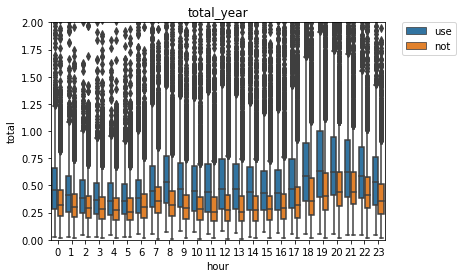

In [401]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_year, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_year')
plt.show()

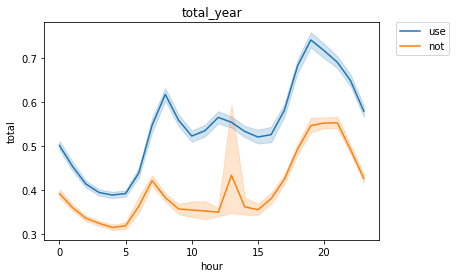

In [402]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_year, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_year')
plt.show()

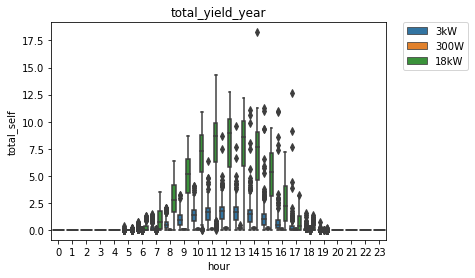

In [403]:
# 총 전력 생산량 - 그림
p1 = sns.boxplot(x='시간', y='발전량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_year')
plt.show()

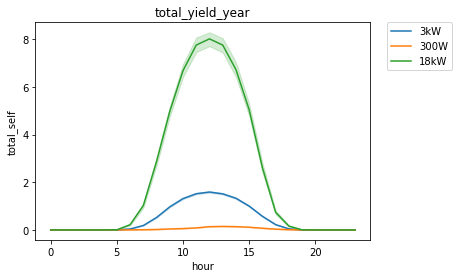

In [404]:
p1 = sns.lineplot(x='시간', y='발전량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total_self')
p1.set_title('total_yield_year')
plt.show()

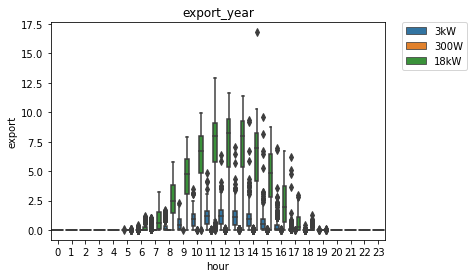

In [405]:
# 총 전력 수출량 - 그림
p1 = sns.boxplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_year')
plt.show()

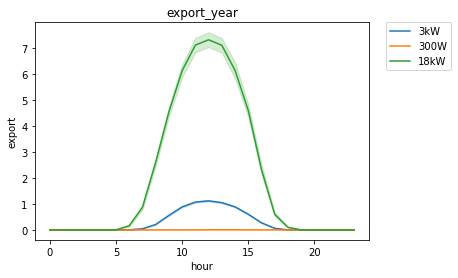

In [406]:
p1 = sns.lineplot(x='시간', y='잉여전력량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('export')
p1.set_title('export_year')
plt.show()

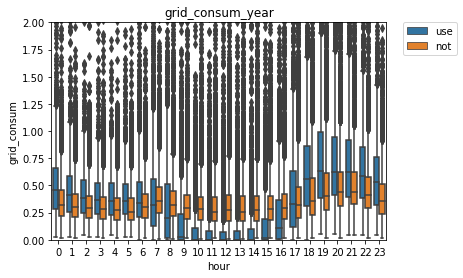

In [407]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_year, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_year')
plt.show()

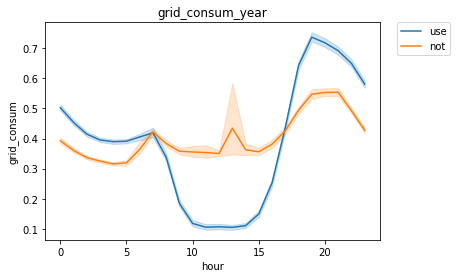

In [408]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_year, hue='type')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_year')
plt.show()

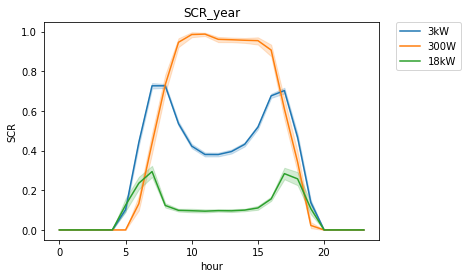

In [409]:
# SCR(자가소비율) - 그림
p1 = sns.lineplot(x='시간', y='자가소비율', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SCR')
p1.set_title('SCR_year')
plt.show()

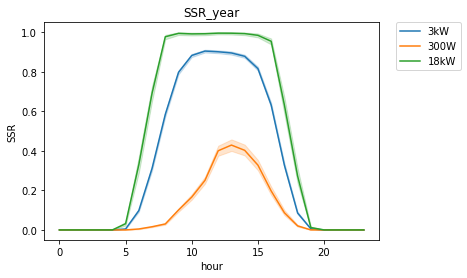

In [410]:
# SSR(자가공급률) - 그림
p1 = sns.lineplot(x='시간', y='자가공급률', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('SSR')
p1.set_title('SSR_year')
plt.show()

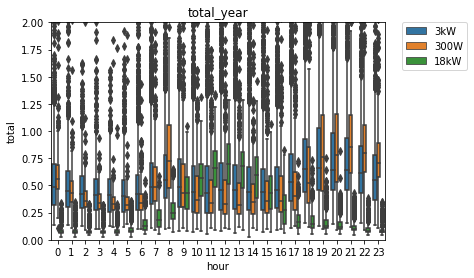

In [411]:
# 총 전력 소비량 - 그림
p1 = sns.boxplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_year')
plt.show()

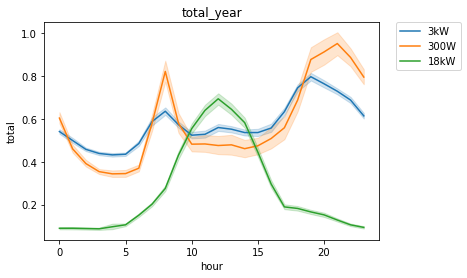

In [412]:
p1 = sns.lineplot(x='시간', y='전력소비량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('total')
p1.set_title('total_year')
plt.show()

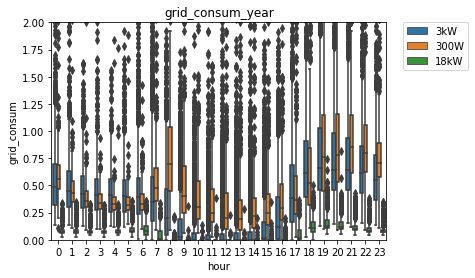

In [413]:
# 총 그리드 소비량 - 그림
p1 = sns.boxplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_ylim(0.0, 2.0)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_year')
plt.show()

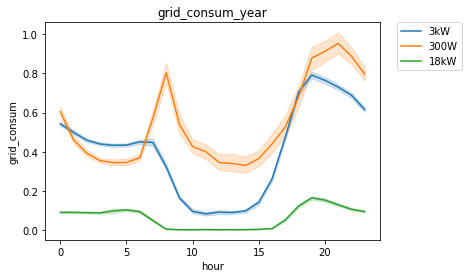

In [414]:
p1 = sns.lineplot(x='시간', y='수전전력량(kWh)', data=df_all_hour_year, hue='설비용량(kW)')
p1.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
p1.set_xlabel('hour')
p1.set_ylabel('grid_consum')
p1.set_title('grid_consum_year')
plt.show()